In [14]:
"""Imports from Marti Utility scripts"""
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.markers as markers
import scipy.signal as signal
import seaborn as sns
import scipy.stats as stats
from scipy.signal import find_peaks, peak_prominences
from BaselineRemoval import BaselineRemoval
import os

In [15]:
def rolling_min(input_series, window_size):
    r = input_series.rolling(window_size, min_periods=1)
    m = r.min()
    return m


def remove_bleaching(input_trace):
    min_trace = rolling_min(pd.Series(input_trace), window_size=int(len(input_trace)/10))
    fit_coefficients = np.polyfit(range(len(min_trace)), min_trace, 2)
    fit = np.poly1d(fit_coefficients)
    return input_trace - fit(range(len(input_trace)))

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.markers as markers
import scipy.signal as signal
import seaborn as sns
import scipy.stats as stats
from scipy.signal import find_peaks, peak_prominences
from BaselineRemoval import BaselineRemoval
import os
def load(fp):
    stat = np.load(f"{fp}\stat.npy", allow_pickle = True)
    ops = np.load(f"{fp}\ops.npy", allow_pickle = True).item()
    F = np.load(f"{fp}\F.npy", allow_pickle = True)
    Fneu = np.load(f"{fp}\Fneu.npy", allow_pickle = True)
    #iscell / spks also can be repeated in this way
    return stat, ops, F, Fneu
    
# stat, ops, F, Fneu = load(r'C:\Users\jcbegs\Desktop\Lab_Business\AG_Dean\calcium_imaging\calcium imaging videos\step1\wtRt_100k_.4ul_hSyn_DIV20_48h_ctrl_60x_c1_r002\suite2p\plane0')
stat, ops, F, Fneu = load(r'E:\001 - Synapse Calcium Imaging\230727_AMPA_blocker_tests_AAV1_syn_GCaMP6\cs2\wtRt_225k_.0.5ul_hSyn_DIV21_100%_25ms_r001_cs1\suite2p\plane0')

f = F[2]
fneu = Fneu[2]

def single_spine_peak_plotting(input_f, input_fneu):
    i=0
    corrected = input_f - (0.7*input_fneu)
        # a standard subtraction of fluorescence background immediately surrounding each ROI
    corrected_sample_trace = BaselineRemoval(corrected)
    corrected_trace = corrected_sample_trace.ZhangFit(repitition=100)
        # an adaptively weighted iterated modified polynomial fit that ignores peaks and corrects baseline to 0
    peaks, _ = find_peaks(corrected_trace, height = 3*(abs(np.median(corrected_trace)) + abs(corrected_trace.min())), distance = 20)
    amplitudes = corrected_trace[peaks] - np.median(corrected_trace)

    negative_points = np.where((corrected_trace < np.median(corrected_trace)))[0]
# print(negative_points)
    decay_points = []
    decay_time = []

    for i in peaks:
        negative_after_peak = negative_points[negative_points>i]
        if len(negative_after_peak > 0):
            decay_points.append(negative_after_peak[0])

    for k,a in zip(peaks, decay_points):
        decay_time.append(np.abs(a-k)/20)

        # scipy find_peaks function
        #then plot the traces you generate
    plt.plot(corrected_trace)
    plt.plot(peaks, corrected_trace[peaks], "x")
    plt.plot(np.full_like(corrected_trace, 3*(abs(np.median(corrected_trace)) + abs(corrected_trace.min()))), "--",color = "grey")
    plt.plot(np.full_like(corrected_trace, np.median(corrected_trace)), "--", color = 'r')
    plt.plot(np.full_like(decay_points, corrected_trace[decay_points], "d"))
    print('the peak time stamps are :{}' .format(peaks))
    print('the peak returns to baseline at frame: {}' .format(decay_points))
    print('the decay time in seconds for each peak is: {}' .format(decay_time))
    print('the amplitude of each peak is: {}' .format(amplitudes))
    plt.show()

def uncorrected_single_spine_peak_plotting(input_f, input_fneu):
    i=0
    corrected = input_f - (0.7*input_fneu)
        # a standard subtraction of fluorescence background immediately surrounding each ROI
    corrected_sample_trace = BaselineRemoval(corrected)
    # corrected_trace = corrected_sample_trace.ZhangFit(repitition=100)
            # an adaptively weighted iterated modified polynomial fit that ignores peaks and corrects baseline to 0
    corrected_trace = corrected
    peaks, _ = find_peaks(corrected_trace, height = np.median(corrected_trace) + 3*(abs(np.median(corrected_trace)) - abs(corrected_trace.min())), distance = 20)
    amplitudes = corrected_trace[peaks] - np.median(corrected_trace)

    negative_points = np.where((corrected_trace < np.median(corrected_trace)))[0]
# print(negative_points)
    decay_points = []
    decay_time = []

    for i in peaks:
        negative_after_peak = negative_points[negative_points>i]
        if len(negative_after_peak > 0):
            decay_points.append(negative_after_peak[0])

    for k,a in zip(peaks, decay_points):
        decay_time.append(np.abs(a-k)/20)

        # scipy find_peaks function
        #then plot the traces you generate
    plt.plot(corrected_trace)
    plt.plot(peaks, corrected_trace[peaks], "x")
    plt.plot(np.full_like(corrected_trace, np.median(corrected_trace) + 3*(abs(np.median(corrected_trace)) - (corrected_trace.min()))), "--",color = "grey")
    plt.plot(np.full_like(corrected_trace, np.median(corrected_trace)), "--", color = 'r')
    plt.plot(np.full_like(decay_points, corrected_trace[decay_points], "d"))
    print('the peak time stamps are :{}' .format(peaks))
    print('the peak returns to baseline at frame: {}' .format(decay_points))
    print('the decay time in seconds for each peak is: {}' .format(decay_time))
    print('the amplitude of each peak is: {}' .format(amplitudes))
    plt.show()

def single_synapse_baseline_correction_and_peak_return(input_f, input_fneu, return_peaks = False, return_decay_times = False, return_amplitudes = False):
    
    corrected_trace = input_f - (0.7*input_fneu)
    corrected_trace = BaselineRemoval(corrected_trace)
    corrected_trace = corrected_trace.ZhangFit(repitition = 100)
    peaks, _ = find_peaks(corrected_trace, height = 3*(abs(np.median(corrected_trace)) + abs(corrected_trace.min())), distance = 40)
    amplitudes = corrected_trace[peaks] - np.median(corrected_trace)
    negative_points = np.where((corrected_trace < np.median(corrected_trace)))[0]
    decay_points = []
    decay_time = []

    for i in peaks:
        negative_after_peak = negative_points[negative_points>i]
        if len(negative_after_peak > 0):
            decay_points.append(negative_after_peak[0])

    next_peak_index = []
    for k,a in zip(peaks, decay_points):
        if next_peak_index < a:
            decay_time.append(np.nan)
        
        else:
            decay_time.append(np.abs(a-k)/20)
        
        
    if return_peaks == True:
        return peaks
    if return_decay_times == True:
        return decay_points
    if return_amplitudes == True:
        return amplitudes


0
the peak time stamps are :[  58 1740 1760 2383 2513 2818 2991 3048 3069 3593 4209 4364 4475 4544
 4676 4767]
the peak returns to baseline at frame: [62, 1749, 1766, 2390, 2519, 2829, 3006, 3067, 3087, 3607, 4236, 4400, 4492, 4556, 4695, 4784]
the decay time in seconds for each peak is: [0.2, 0.45, 0.3, 0.35, 0.3, 0.55, 0.75, 0.95, 0.9, 0.7, 1.35, 1.8, 0.85, 0.6, 0.95, 0.85]
the amplitude of each peak is: [ 57.091553  68.1263    60.670242  45.3069    67.15228   51.781525
  59.771942  88.92389   45.175934  90.99022  161.86409  153.23145
 104.85831   71.77109  124.05795  124.62291 ]


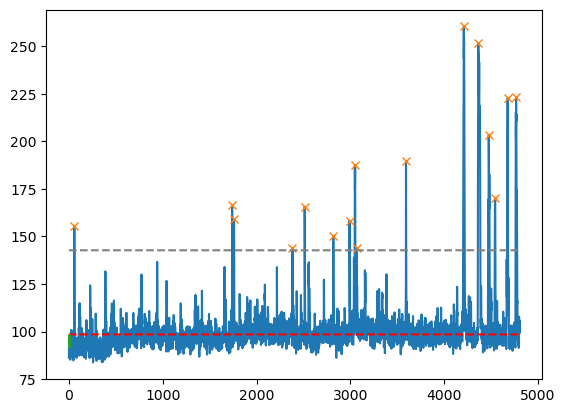

1
the peak time stamps are :[1301 3809 4292]
the peak returns to baseline at frame: [1312, 3829, 4336]
the decay time in seconds for each peak is: [0.55, 1.0, 2.2]
the amplitude of each peak is: [ 58.91011  132.99037   39.879974]


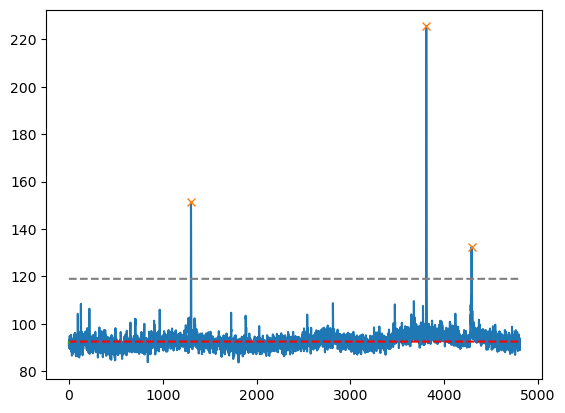

2
the peak time stamps are :[ 859 2913]
the peak returns to baseline at frame: [869, 2921]
the decay time in seconds for each peak is: [0.5, 0.4]
the amplitude of each peak is: [80.16777 33.38655]


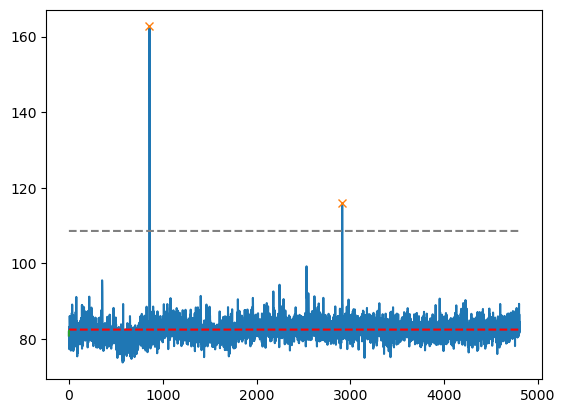

3
the peak time stamps are :[ 391  815  925 1257 1705 2030 3038 4211 4364 4767]
the peak returns to baseline at frame: [408, 845, 930, 1265, 1714, 2054, 3043, 4224, 4387, 4780]
the decay time in seconds for each peak is: [0.85, 1.5, 0.25, 0.4, 0.45, 1.2, 0.25, 0.65, 1.15, 0.65]
the amplitude of each peak is: [ 61.725494 105.234726  46.23973   37.320663  50.86029   47.934753
  45.133133  45.75331   37.44632   42.181427]


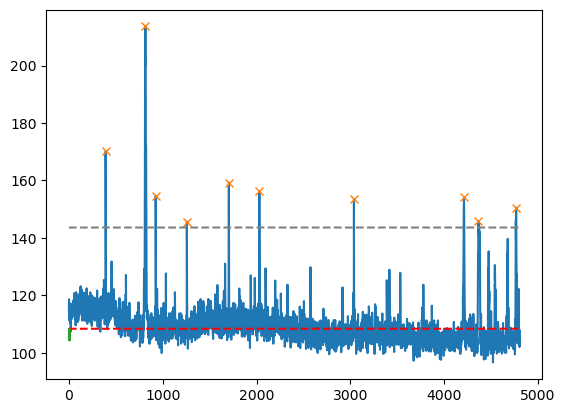

4
the peak time stamps are :[ 414 1738 1983 3074]
the peak returns to baseline at frame: [421, 1748, 1990, 3079]
the decay time in seconds for each peak is: [0.35, 0.5, 0.35, 0.25]
the amplitude of each peak is: [120.5401    55.141983  38.09709   35.983047]


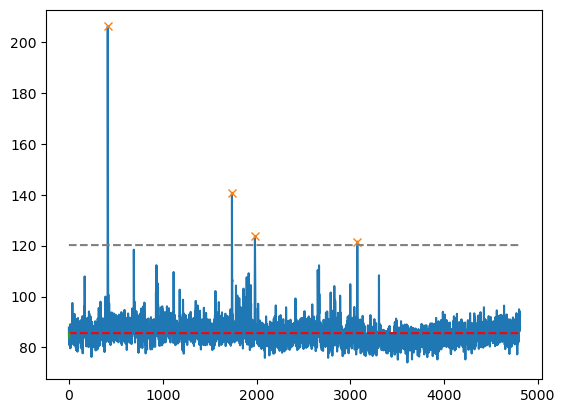

5
the peak time stamps are :[1439 1480 4215]
the peak returns to baseline at frame: [1443, 1496, 4229]
the decay time in seconds for each peak is: [0.2, 0.8, 0.7]
the amplitude of each peak is: [38.535736 39.573074 64.39575 ]


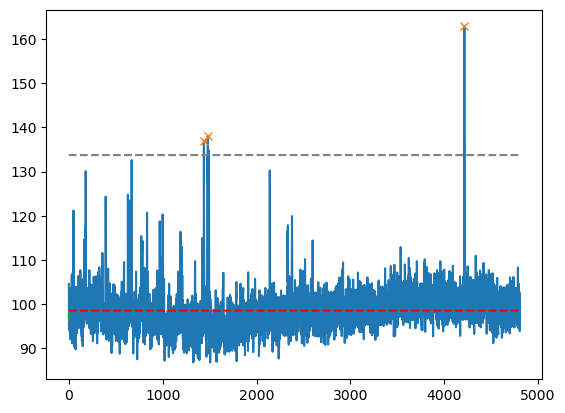

6
the peak time stamps are :[ 872 1307 1844 1885]
the peak returns to baseline at frame: [880, 1320, 1851, 1897]
the decay time in seconds for each peak is: [0.4, 0.65, 0.35, 0.6]
the amplitude of each peak is: [30.398178 45.153885 31.790405 55.43773 ]


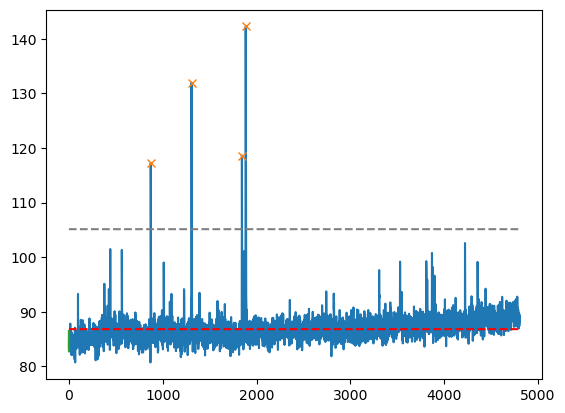

7
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


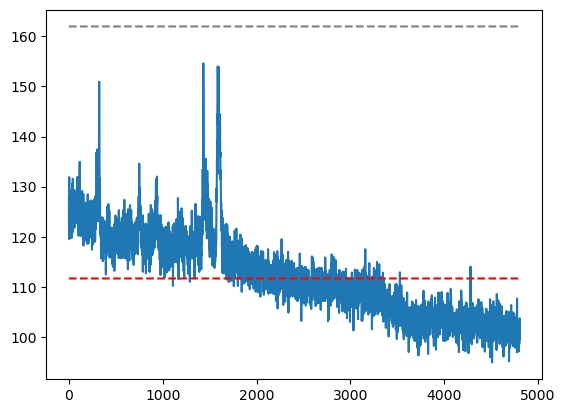

8
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


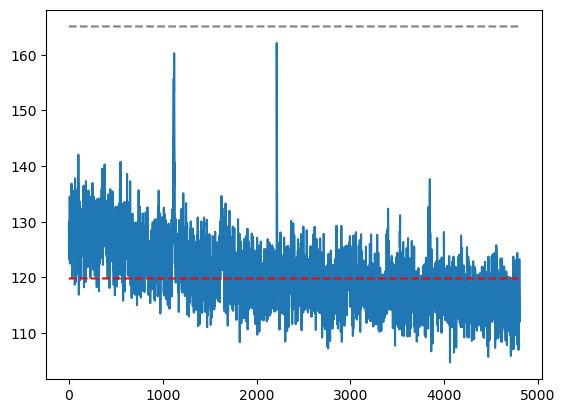

9
the peak time stamps are :[3134 4712]
the peak returns to baseline at frame: [3152, 4718]
the decay time in seconds for each peak is: [0.9, 0.3]
the amplitude of each peak is: [74.58336  32.521027]


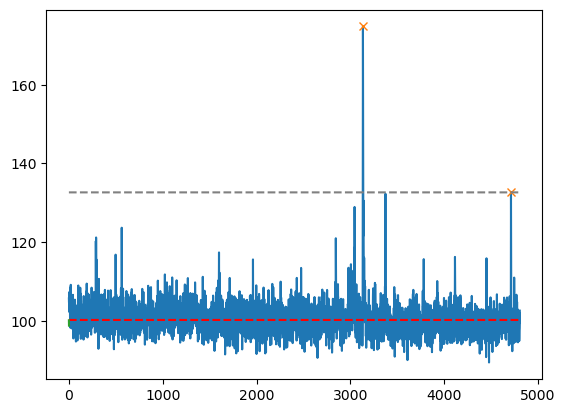

10
the peak time stamps are :[1465 1635 1957 2889]
the peak returns to baseline at frame: [1486, 1676, 1973, 2897]
the decay time in seconds for each peak is: [1.05, 2.05, 0.8, 0.4]
the amplitude of each peak is: [37.6187   36.925613 42.67305  40.46414 ]


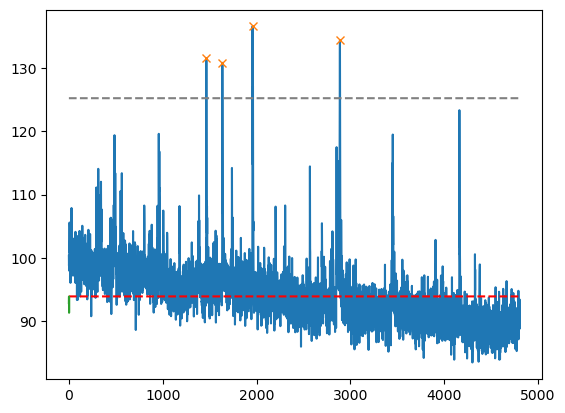

11
the peak time stamps are :[ 234  387  605  670  721  874  925 1135 1195 1424 1559 1621 3371 3823]
the peak returns to baseline at frame: [240, 400, 617, 681, 734, 882, 933, 1143, 1206, 1435, 1572, 1635, 3381, 3838]
the decay time in seconds for each peak is: [0.3, 0.65, 0.6, 0.55, 0.65, 0.4, 0.4, 0.4, 0.55, 0.55, 0.65, 0.7, 0.5, 0.75]
the amplitude of each peak is: [18.582962 29.388763 25.473358 33.44037  33.77733  21.407272 31.659698
 29.846985 30.63504  25.945847 28.693192 53.527527 20.21991  28.191757]


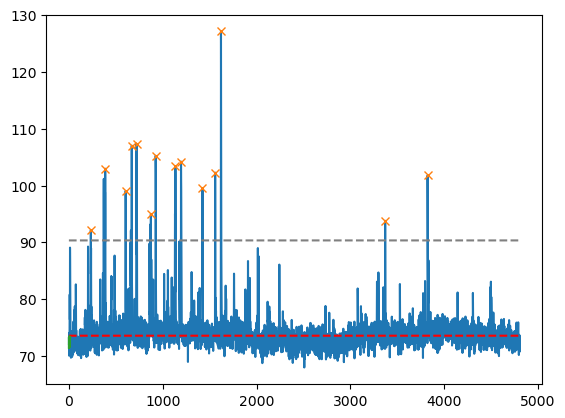

12
the peak time stamps are :[  10   56  135  775  796 1035]
the peak returns to baseline at frame: [25, 73, 184, 822, 822, 1041]
the decay time in seconds for each peak is: [0.75, 0.85, 2.45, 2.35, 1.3, 0.3]
the amplitude of each peak is: [35.674393 42.837708 48.30339  30.717987 39.67401  32.558136]


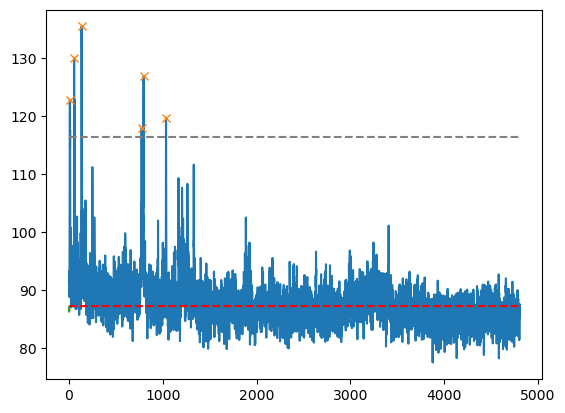

13
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


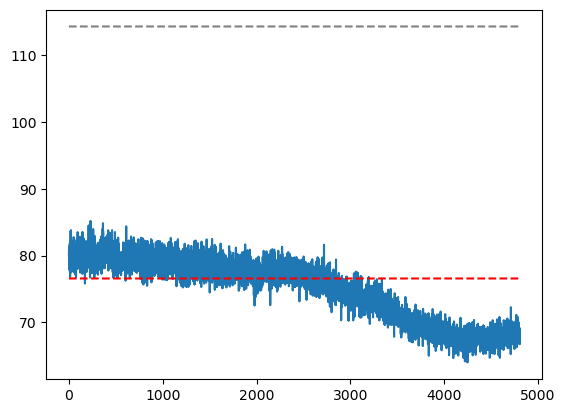

14
the peak time stamps are :[ 239  278  360  426  545  722  915  982 1094 1190 1451 1498 1626 1742
 1838 1944 1979 2022 2133 2168 2407 2773 2795 3097 3242 3352 3873 4151
 4263 4411 4669 4723 4771]
the peak returns to baseline at frame: [248, 288, 388, 446, 557, 729, 923, 1005, 1103, 1197, 1465, 1506, 1632, 1748, 1843, 1953, 1989, 2028, 2139, 2176, 2419, 2779, 2798, 3105, 3246, 3357, 3882, 4156, 4267, 4418, 4689, 4739, 4780]
the decay time in seconds for each peak is: [0.45, 0.5, 1.4, 1.0, 0.6, 0.35, 0.4, 1.15, 0.45, 0.35, 0.7, 0.4, 0.3, 0.3, 0.25, 0.45, 0.5, 0.3, 0.3, 0.4, 0.6, 0.3, 0.15, 0.4, 0.2, 0.25, 0.45, 0.25, 0.2, 0.35, 1.0, 0.8, 0.45]
the amplitude of each peak is: [ 42.632477  46.61714   40.41298  124.19519  110.91914   44.728027
 137.15115   95.28935  111.01317   79.151764  60.451126  40.977097
  57.075104  60.79863   43.73474   91.32094   52.028442  71.90619
  69.403305  44.046722  90.86928   57.42659   58.43158   47.15764
  52.34778   39.811935  95.09306   63.121384  59.46

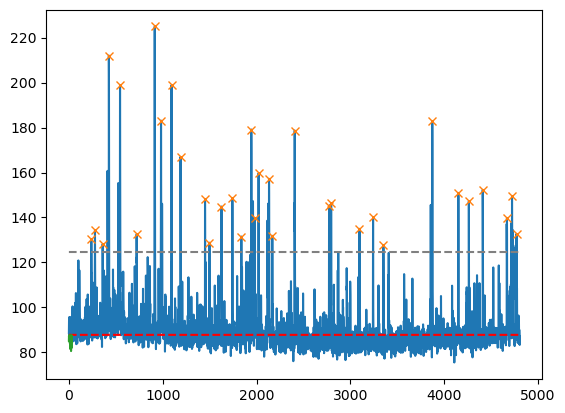

15
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


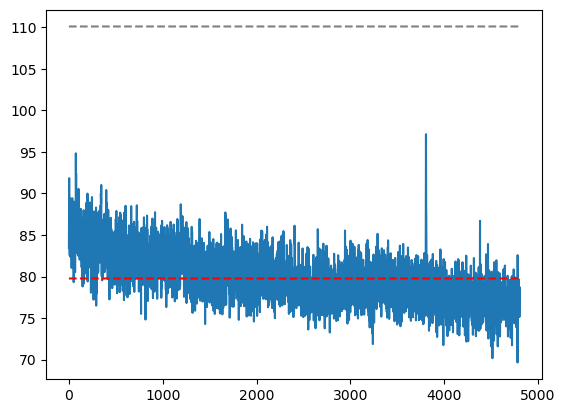

16
the peak time stamps are :[  89  119  140  817 1768]
the peak returns to baseline at frame: [165, 165, 165, 822, 1800]
the decay time in seconds for each peak is: [3.8, 2.3, 1.25, 0.25, 1.6]
the amplitude of each peak is: [69.39351  40.501907 66.693375 28.10257  26.897705]


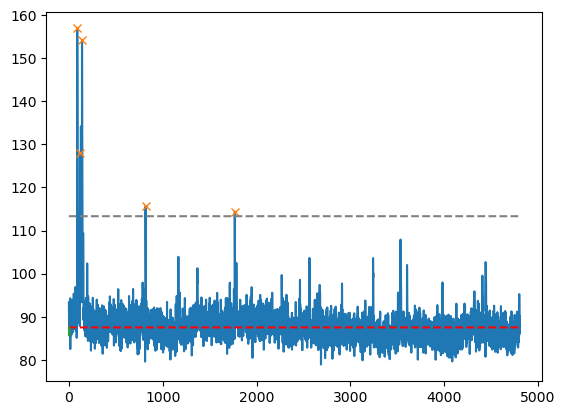

17
the peak time stamps are :[  70  343  440  834  918 1313 1704 1775 1970 2871 3025 4532]
the peak returns to baseline at frame: [92, 359, 454, 853, 925, 1320, 1713, 1795, 1988, 2877, 3030, 4537]
the decay time in seconds for each peak is: [1.1, 0.8, 0.7, 0.95, 0.35, 0.35, 0.45, 1.0, 0.9, 0.3, 0.25, 0.25]
the amplitude of each peak is: [ 39.18982   64.96292   97.47943   39.99054  104.451416  60.481415
  47.46309   45.046494  39.08766   44.500748  47.849792  61.388092]


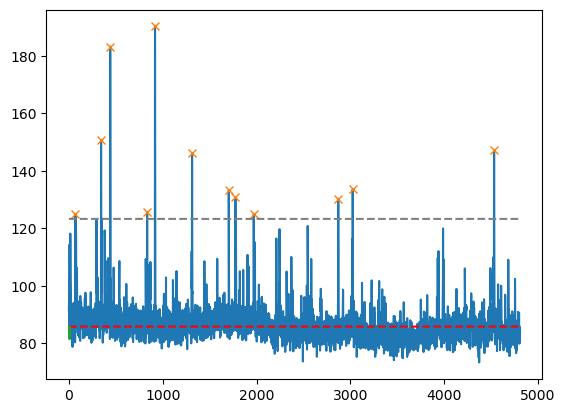

18
the peak time stamps are :[1586]
the peak returns to baseline at frame: [1662]
the decay time in seconds for each peak is: [3.8]
the amplitude of each peak is: [74.00528]


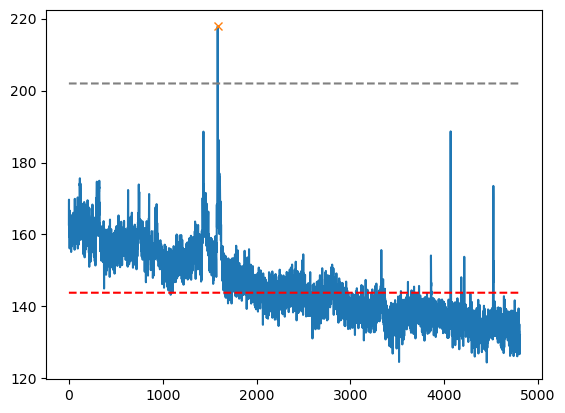

19
the peak time stamps are :[ 917 1402 3874]
the peak returns to baseline at frame: [929, 1410, 3881]
the decay time in seconds for each peak is: [0.6, 0.4, 0.35]
the amplitude of each peak is: [28.029953 81.009445 43.19127 ]


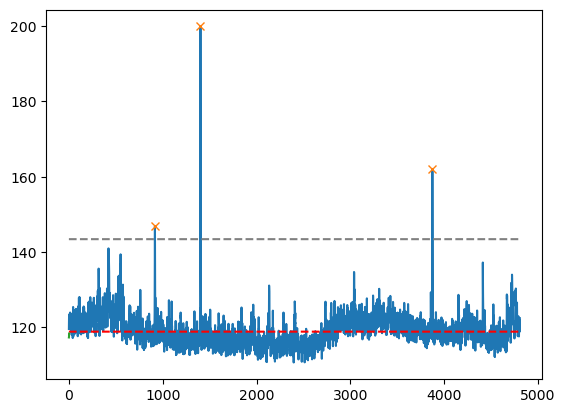

20
the peak time stamps are :[ 578 3061 3254 3298 3371]
the peak returns to baseline at frame: [587, 3068, 3262, 3313, 3380]
the decay time in seconds for each peak is: [0.45, 0.35, 0.4, 0.75, 0.45]
the amplitude of each peak is: [25.997849 34.109238 35.05687  50.125565 30.739136]


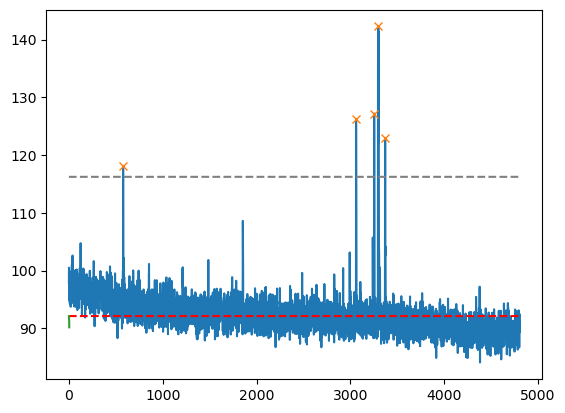

21
the peak time stamps are :[1216 1262]
the peak returns to baseline at frame: [1297, 1297]
the decay time in seconds for each peak is: [4.05, 1.75]
the amplitude of each peak is: [69.25592 81.40253]


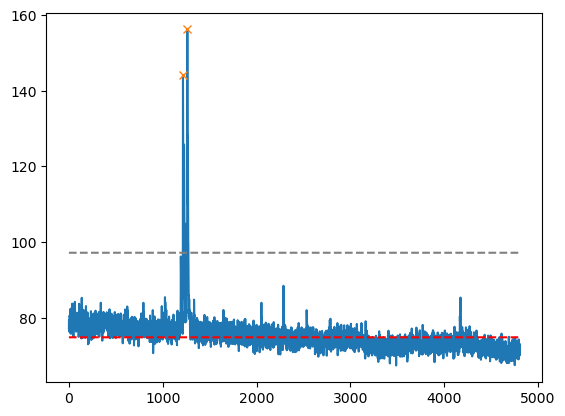

22
the peak time stamps are :[4161]
the peak returns to baseline at frame: [4173]
the decay time in seconds for each peak is: [0.6]
the amplitude of each peak is: [36.57573]


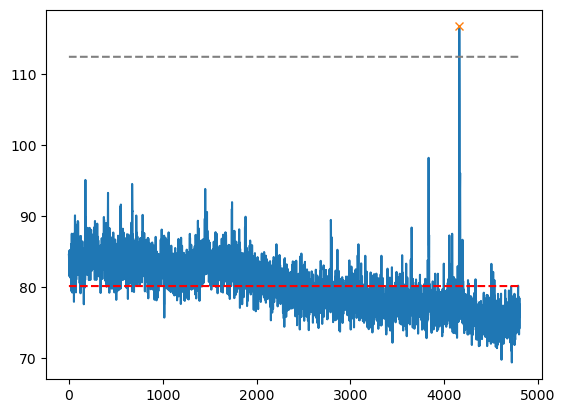

23
the peak time stamps are :[1092 1701 3819]
the peak returns to baseline at frame: [1113, 1711, 3830]
the decay time in seconds for each peak is: [1.05, 0.5, 0.55]
the amplitude of each peak is: [38.004898 31.230225 34.530426]


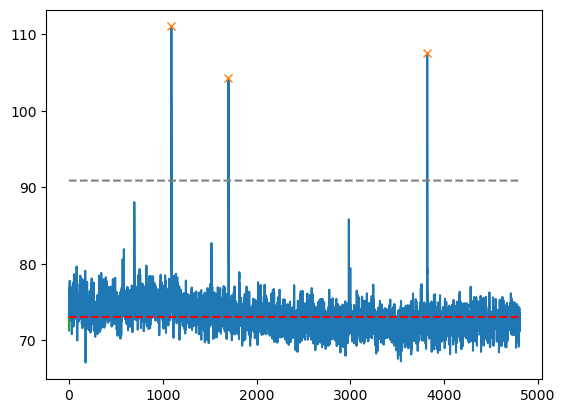

24
the peak time stamps are :[ 810 3072 3349 4113]
the peak returns to baseline at frame: [819, 3082, 3358, 4130]
the decay time in seconds for each peak is: [0.45, 0.5, 0.45, 0.85]
the amplitude of each peak is: [36.044678 43.753174 51.168915 69.727554]


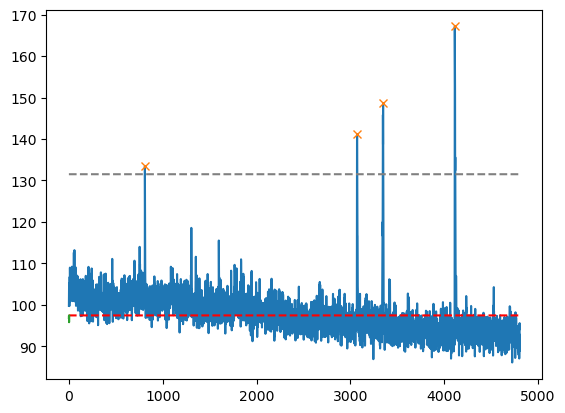

25
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


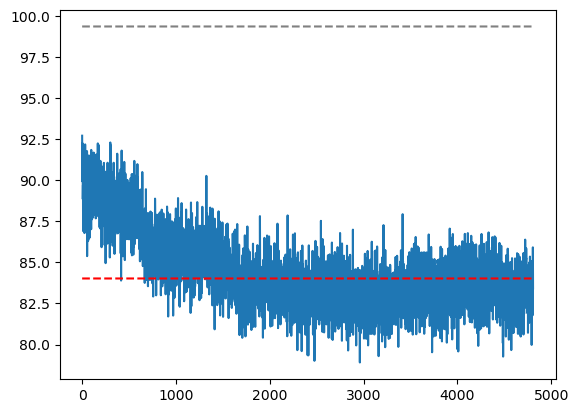

26
the peak time stamps are :[ 181  892 1023 1114 1192 1215 1239 1261 1432 1645 2051 2287 2534 2966
 3305 4174]
the peak returns to baseline at frame: [186, 899, 1033, 1122, 1297, 1297, 1297, 1297, 1442, 1664, 2062, 2305, 2545, 2971, 3320, 4189]
the decay time in seconds for each peak is: [0.25, 0.35, 0.5, 0.4, 5.25, 4.1, 2.9, 1.8, 0.5, 0.95, 0.55, 0.9, 0.55, 0.25, 0.75, 0.75]
the amplitude of each peak is: [ 20.81099   18.229004  29.341629  25.36087   79.672424 132.12836
  15.370773 129.59596   14.259354  15.546783  42.33403   59.35222
  42.718674  23.273346  17.036255  52.237335]


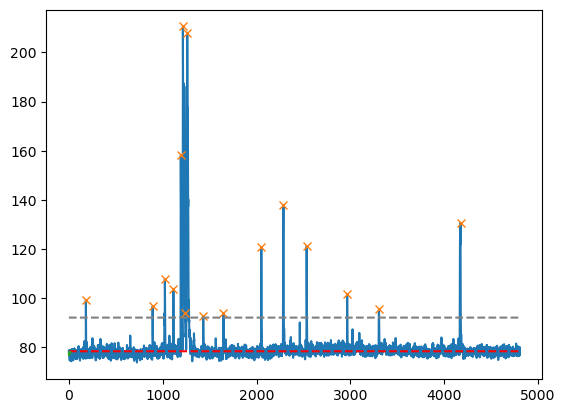

27
the peak time stamps are :[ 147  219  511  594  659 1065 1410 1457 1502 1527 1598 1626 1662 1769
 1848 2023 2124 2446 2618 3040 3671 3722 3978 4075 4260 4335 4639]
the peak returns to baseline at frame: [311, 311, 580, 701, 701, 1084, 1573, 1573, 1573, 1573, 1724, 1724, 1724, 1796, 1891, 2053, 2142, 2474, 2629, 3053, 3707, 3733, 4008, 4096, 4265, 4362, 4647]
the decay time in seconds for each peak is: [8.2, 4.6, 3.45, 5.35, 2.1, 0.95, 8.15, 5.8, 3.55, 2.3, 6.3, 4.9, 3.1, 1.35, 2.15, 1.5, 0.9, 1.4, 0.55, 0.65, 1.8, 0.55, 1.5, 1.05, 0.25, 1.35, 0.4]
the amplitude of each peak is: [130.66225   94.37489   68.59471   71.03621   99.453995  75.75258
 265.21436  232.75783  112.92702  137.18413   92.879715 259.21985
 258.09302  119.91087  156.9521    83.80745  120.50325  140.31917
 100.93611  174.79448   68.43468   57.228592  92.34761  153.18861
  60.90718  123.42525   72.6026  ]


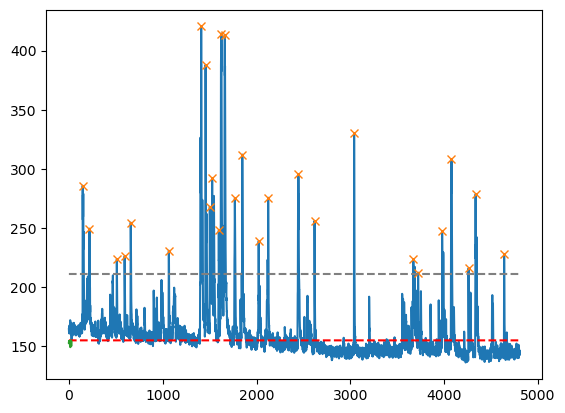

28
the peak time stamps are :[2287 2894 3038]
the peak returns to baseline at frame: [2293, 2908, 3044]
the decay time in seconds for each peak is: [0.3, 0.7, 0.3]
the amplitude of each peak is: [39.731064 31.460144 64.89288 ]


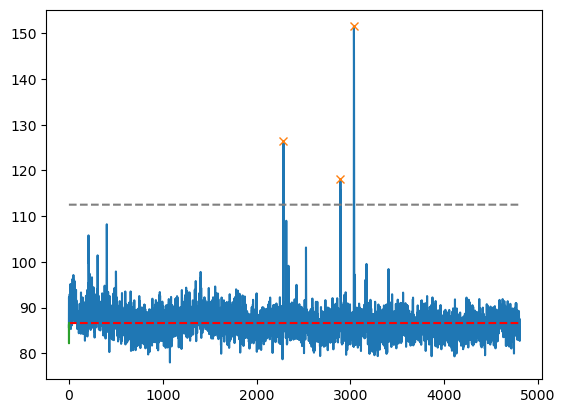

29
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


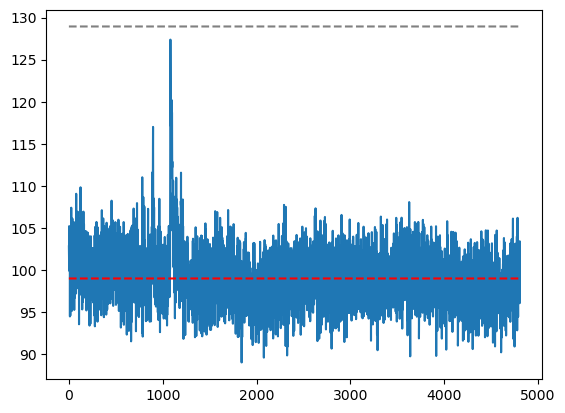

30
the peak time stamps are :[ 806 1093 1980 2612 4301 4583]
the peak returns to baseline at frame: [823, 1115, 2000, 2625, 4306, 4589]
the decay time in seconds for each peak is: [0.85, 1.1, 1.0, 0.65, 0.25, 0.3]
the amplitude of each peak is: [ 86.80907  224.16133   48.796066  60.470673  61.152832  74.02237 ]


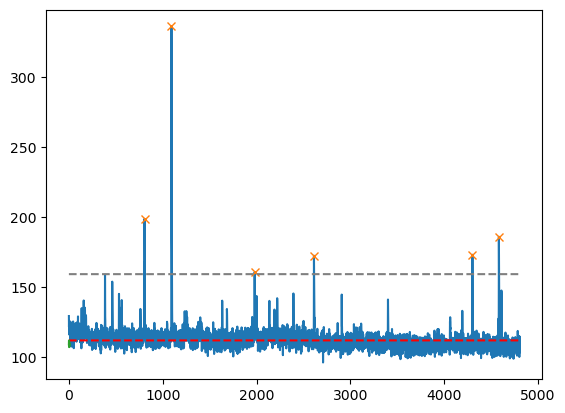

31
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


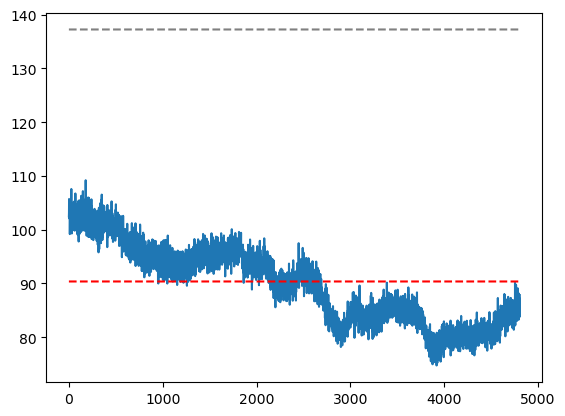

32
the peak time stamps are :[ 247  269 1258 1529 4006]
the peak returns to baseline at frame: [294, 294, 1277, 1535, 4020]
the decay time in seconds for each peak is: [2.35, 1.25, 0.95, 0.3, 0.7]
the amplitude of each peak is: [19.033142 21.165894 25.371277 22.847961 65.38434 ]


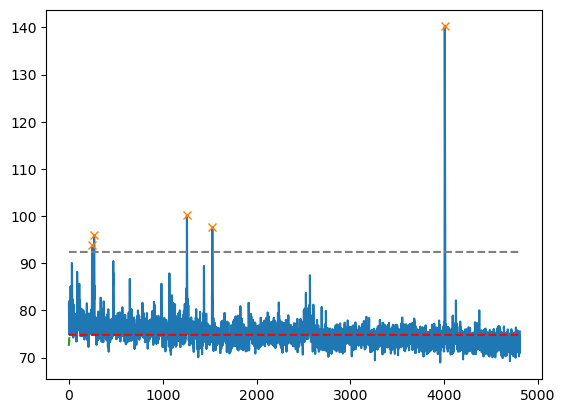

33
the peak time stamps are :[ 114  250  814 1876 1913 1945 2678 4208]
the peak returns to baseline at frame: [133, 259, 819, 1880, 1920, 1953, 2689, 4218]
the decay time in seconds for each peak is: [0.95, 0.45, 0.25, 0.2, 0.35, 0.4, 0.55, 0.5]
the amplitude of each peak is: [39.95819  29.671448 27.893951 28.625412 70.12631  53.24771  31.826904
 97.415985]


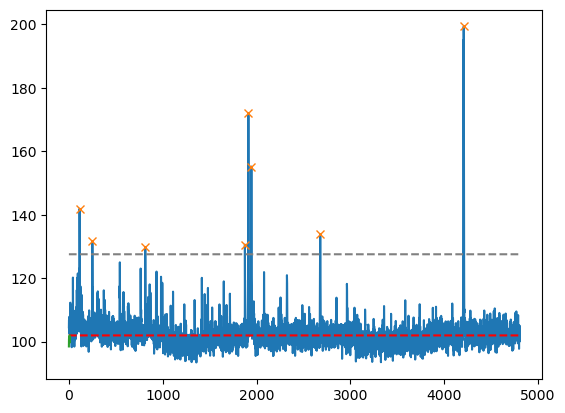

34
the peak time stamps are :[ 372  822  948 1266 1712 2019]
the peak returns to baseline at frame: [378, 840, 957, 1280, 1721, 2026]
the decay time in seconds for each peak is: [0.3, 0.9, 0.45, 0.7, 0.45, 0.35]
the amplitude of each peak is: [ 63.732468  75.24481   99.096924 132.83112   73.171936  56.826523]


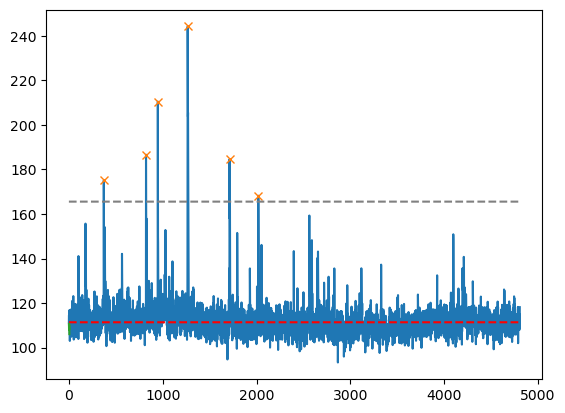

35
the peak time stamps are :[ 574  831  957  988 1013 1223 1247 1341 1521 1554 1767 1846 1869 1945
 2113 2174 3080 3123 3203 3735 3816 4452]
the peak returns to baseline at frame: [581, 848, 974, 1002, 1017, 1239, 1263, 1355, 1529, 1564, 1781, 1857, 1881, 1956, 2119, 2198, 3095, 3130, 3215, 3740, 3822, 4457]
the decay time in seconds for each peak is: [0.35, 0.85, 0.85, 0.7, 0.2, 0.8, 0.8, 0.7, 0.4, 0.5, 0.7, 0.55, 0.6, 0.55, 0.3, 1.2, 0.75, 0.35, 0.6, 0.25, 0.3, 0.25]
the amplitude of each peak is: [21.577332 32.098618 34.192307 46.992065 20.124878 30.466782 24.266373
 41.053223 32.559174 26.693008 30.312668 42.88623  42.74684  30.627869
 22.941925 26.834137 32.729355 34.845123 38.543655 22.39746  26.65689
 28.205261]


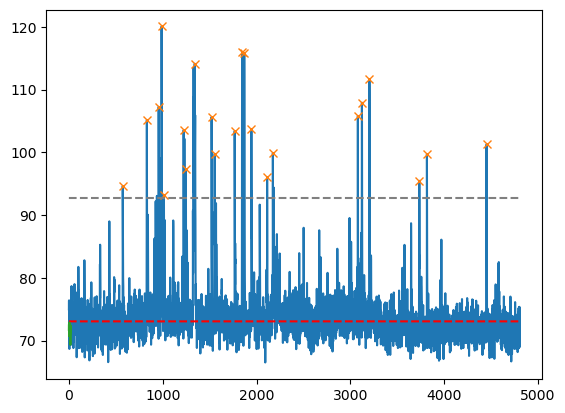

36
the peak time stamps are :[1373 2476 3471 3500 4212 4421]
the peak returns to baseline at frame: [1390, 2481, 3485, 3507, 4219, 4429]
the decay time in seconds for each peak is: [0.85, 0.25, 0.7, 0.35, 0.35, 0.4]
the amplitude of each peak is: [42.141464 54.206833 59.845398 41.72661  41.56819  41.98645 ]


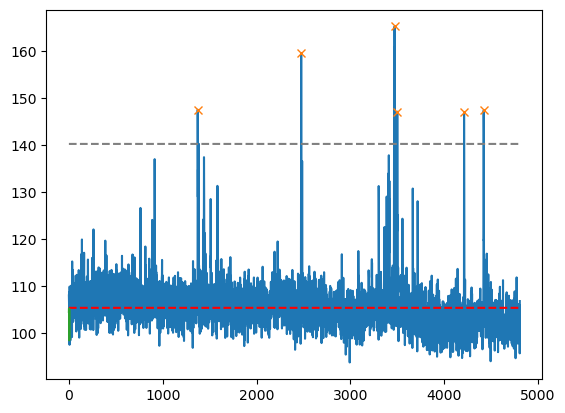

37
the peak time stamps are :[1134 1156 1176]
the peak returns to baseline at frame: [1206, 1206, 1206]
the decay time in seconds for each peak is: [3.6, 2.5, 1.5]
the amplitude of each peak is: [28.062317 24.0934   24.69136 ]


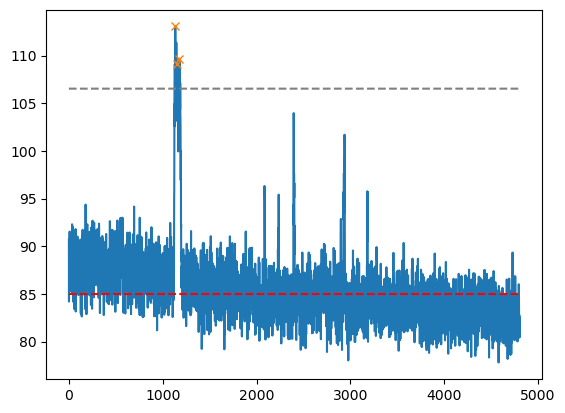

38
the peak time stamps are :[  75 1241 3385 3914 3934 4136]
the peak returns to baseline at frame: [88, 1247, 3402, 3944, 3944, 4158]
the decay time in seconds for each peak is: [0.65, 0.3, 0.85, 1.5, 0.5, 1.1]
the amplitude of each peak is: [84.794525 77.28906  43.011032 50.715897 70.87773  43.86902 ]


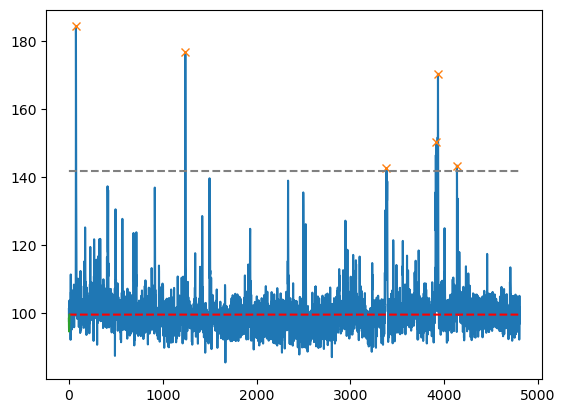

39
the peak time stamps are :[1216 1262]
the peak returns to baseline at frame: [1252, 1289]
the decay time in seconds for each peak is: [1.8, 1.35]
the amplitude of each peak is: [55.65506  80.510666]


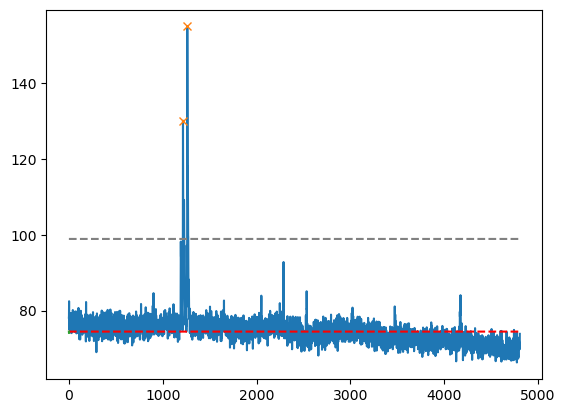

40
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


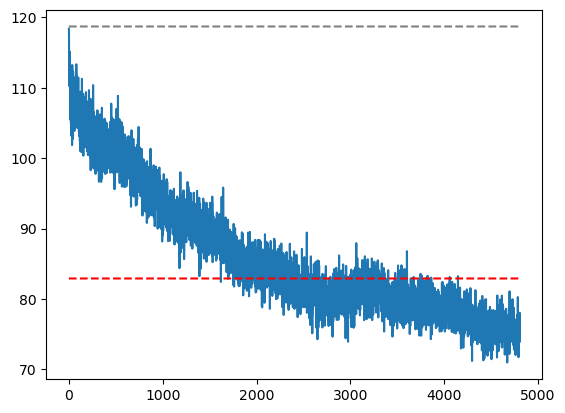

41
the peak time stamps are :[ 217  686  729 1115 1991 2394 2685 3866 3890 4379]
the peak returns to baseline at frame: [227, 698, 743, 1134, 2000, 2400, 2695, 3882, 3899, 4394]
the decay time in seconds for each peak is: [0.5, 0.6, 0.7, 0.95, 0.45, 0.3, 0.5, 0.8, 0.45, 0.75]
the amplitude of each peak is: [16.29654  29.144592 40.979767 20.47676  16.869064 25.64299  22.35344
 62.349243 19.095032 28.306671]


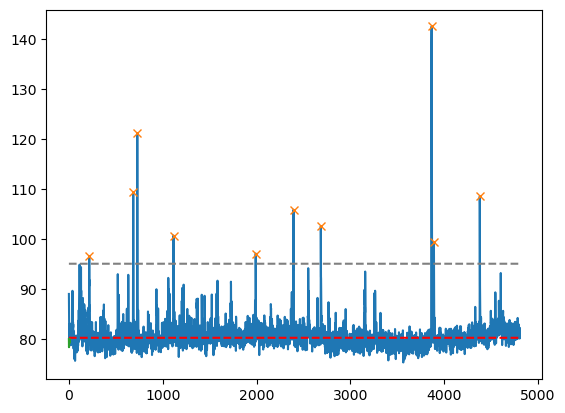

42
the peak time stamps are :[  15   35  214  354  423  689  923 1081 1126 1653 1798 2522 2868 2904
 4263 4405 4621]
the peak returns to baseline at frame: [21, 44, 227, 368, 429, 699, 934, 1091, 1133, 1677, 1814, 2549, 2882, 2932, 4267, 4409, 4625]
the decay time in seconds for each peak is: [0.3, 0.45, 0.65, 0.7, 0.3, 0.5, 0.55, 0.5, 0.35, 1.2, 0.8, 1.35, 0.7, 1.4, 0.2, 0.2, 0.2]
the amplitude of each peak is: [24.878952 38.339264 23.58754  87.99257  23.375702 92.56717  42.51378
 24.126556 26.877182 41.646027 36.047897 28.525223 26.117554 27.99289
 31.171295 29.070724 33.85446 ]


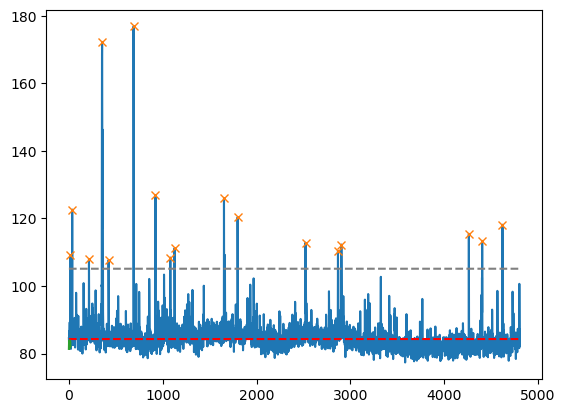

43
the peak time stamps are :[2897 2933 3181]
the peak returns to baseline at frame: [2904, 2952, 3196]
the decay time in seconds for each peak is: [0.35, 0.95, 0.75]
the amplitude of each peak is: [25.039017 34.897324 30.309006]


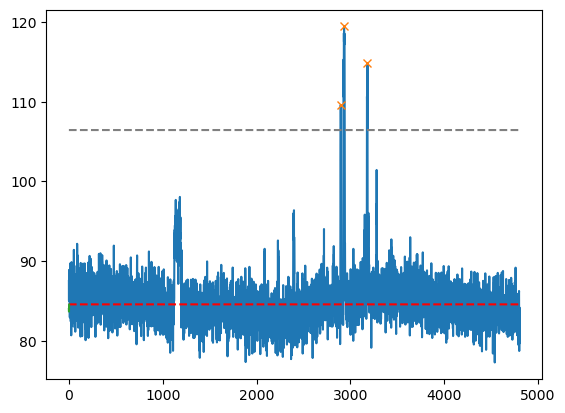

44
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


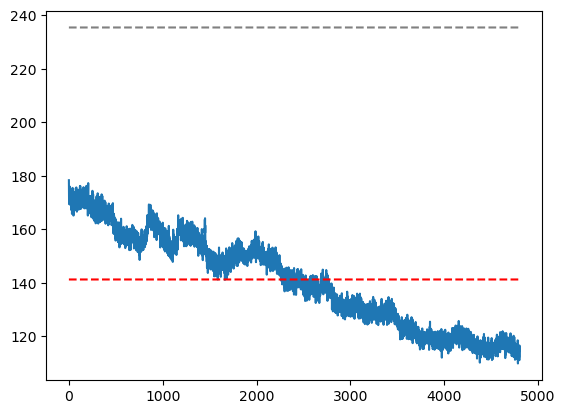

45
the peak time stamps are :[2009 4790]
the peak returns to baseline at frame: [2015, 4796]
the decay time in seconds for each peak is: [0.3, 0.3]
the amplitude of each peak is: [60.938843 42.46216 ]


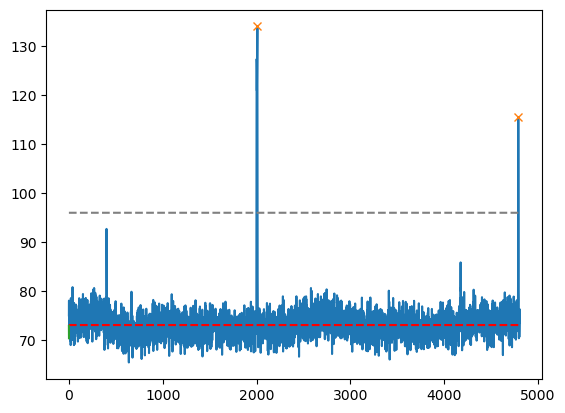

46
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


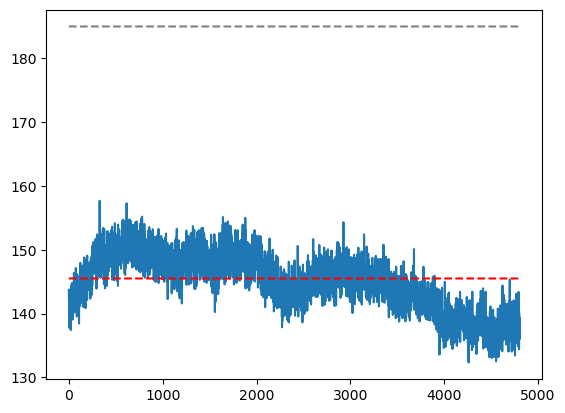

47
the peak time stamps are :[1484]
the peak returns to baseline at frame: [1501]
the decay time in seconds for each peak is: [0.85]
the amplitude of each peak is: [41.09102]


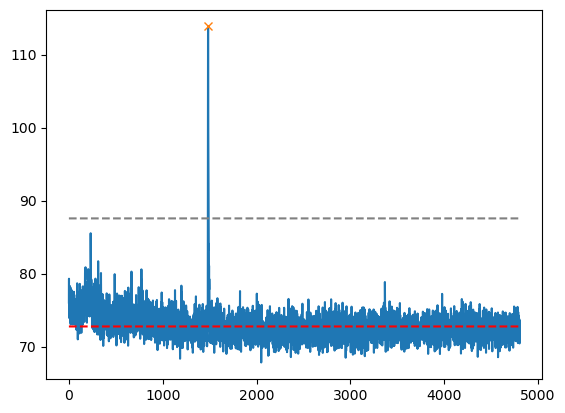

48
the peak time stamps are :[1483]
the peak returns to baseline at frame: [1503]
the decay time in seconds for each peak is: [1.0]
the amplitude of each peak is: [65.38611]


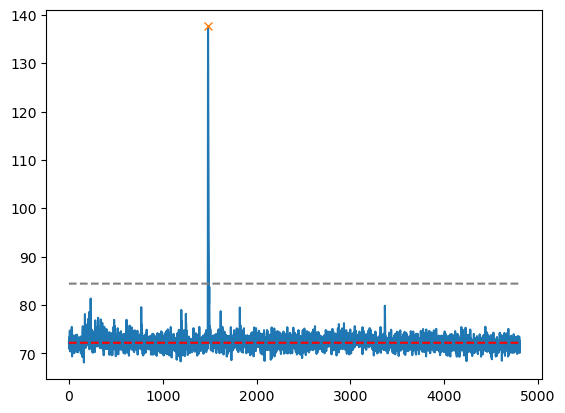

49
the peak time stamps are :[1869 1936 1971 3987]
the peak returns to baseline at frame: [1876, 1943, 1982, 4000]
the decay time in seconds for each peak is: [0.35, 0.35, 0.55, 0.65]
the amplitude of each peak is: [38.08539  32.782227 34.193787 34.94719 ]


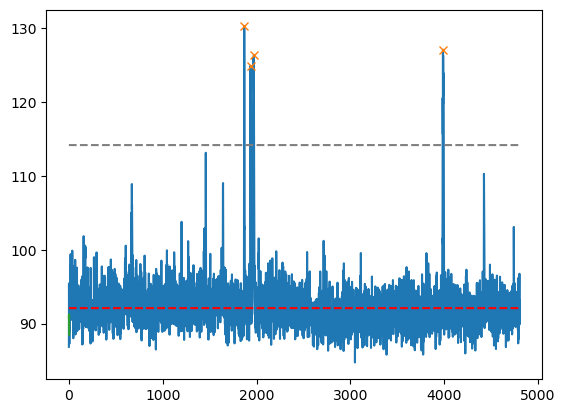

50
the peak time stamps are :[2130 2189]
the peak returns to baseline at frame: [2241, 2241]
the decay time in seconds for each peak is: [5.55, 2.6]
the amplitude of each peak is: [43.078323 37.111603]


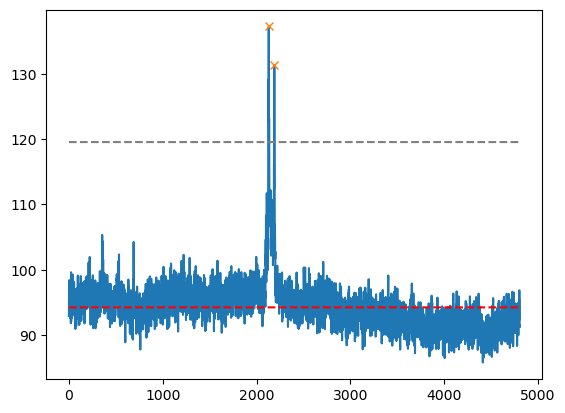

51
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


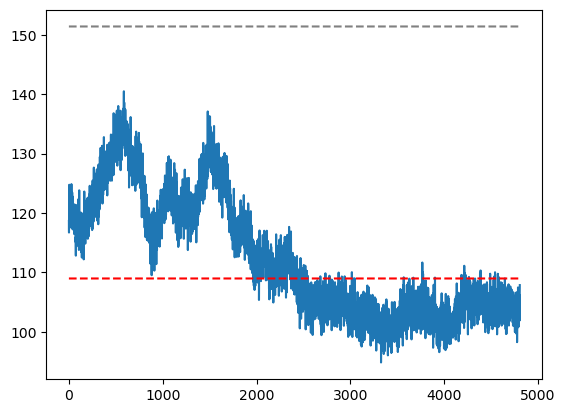

52
the peak time stamps are :[3577 3619]
the peak returns to baseline at frame: [3676, 3676]
the decay time in seconds for each peak is: [4.95, 2.85]
the amplitude of each peak is: [31.745728 33.30548 ]


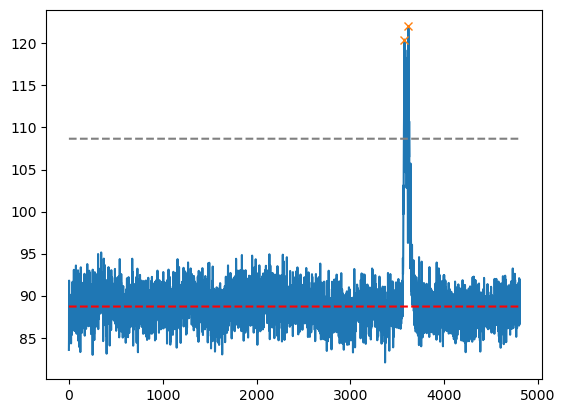

53
the peak time stamps are :[1866]
the peak returns to baseline at frame: [1888]
the decay time in seconds for each peak is: [1.1]
the amplitude of each peak is: [35.485092]


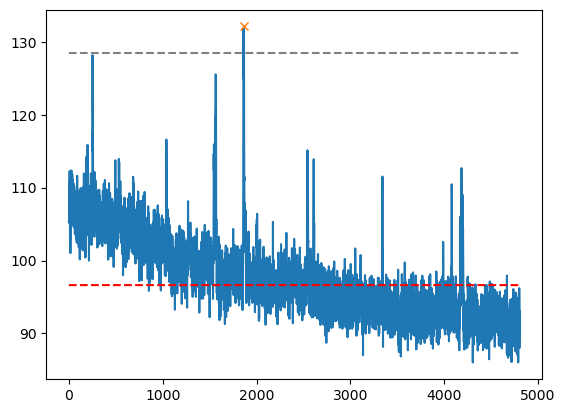

54
the peak time stamps are :[3588 3611]
the peak returns to baseline at frame: [3633, 3633]
the decay time in seconds for each peak is: [2.25, 1.1]
the amplitude of each peak is: [22.552109 27.85524 ]


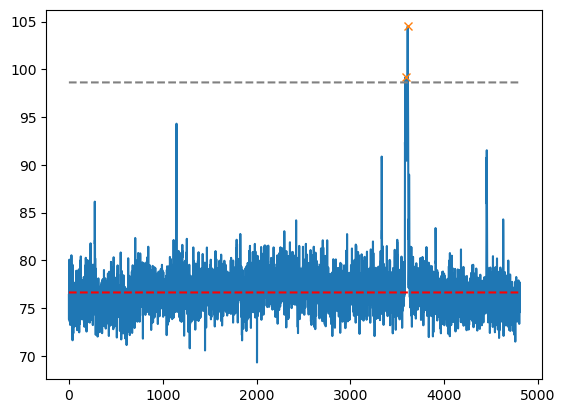

55
the peak time stamps are :[1573 2932]
the peak returns to baseline at frame: [1580, 2950]
the decay time in seconds for each peak is: [0.35, 0.9]
the amplitude of each peak is: [54.544403 60.63179 ]


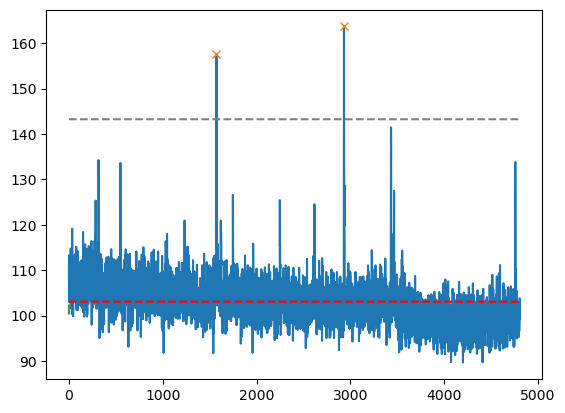

56
the peak time stamps are :[631]
the peak returns to baseline at frame: [787]
the decay time in seconds for each peak is: [7.8]
the amplitude of each peak is: [82.1057]


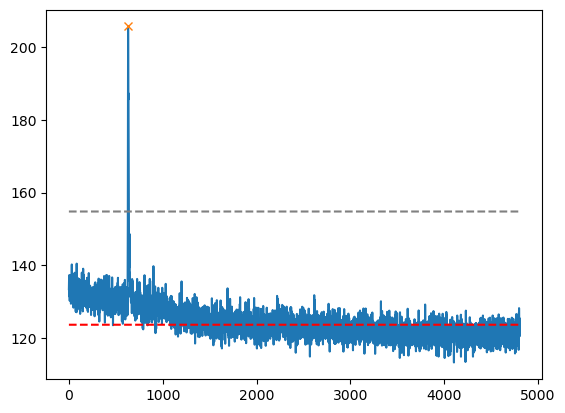

57
the peak time stamps are :[15]
the peak returns to baseline at frame: [1010]
the decay time in seconds for each peak is: [49.75]
the amplitude of each peak is: [84.15207]


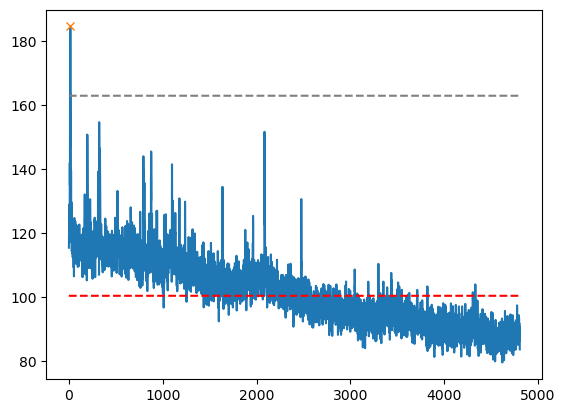

58
the peak time stamps are :[2941]
the peak returns to baseline at frame: [2956]
the decay time in seconds for each peak is: [0.75]
the amplitude of each peak is: [25.47786]


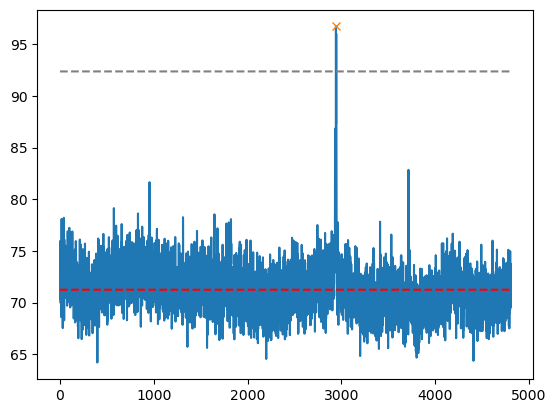

59
the peak time stamps are :[1144 1165]
the peak returns to baseline at frame: [1180, 1180]
the decay time in seconds for each peak is: [1.8, 0.75]
the amplitude of each peak is: [40.378464 37.46118 ]


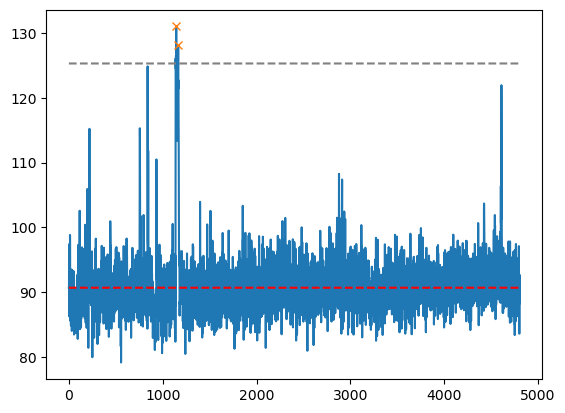

60
the peak time stamps are :[ 909 1313]
the peak returns to baseline at frame: [915, 1332]
the decay time in seconds for each peak is: [0.3, 0.95]
the amplitude of each peak is: [27.882446 45.324677]


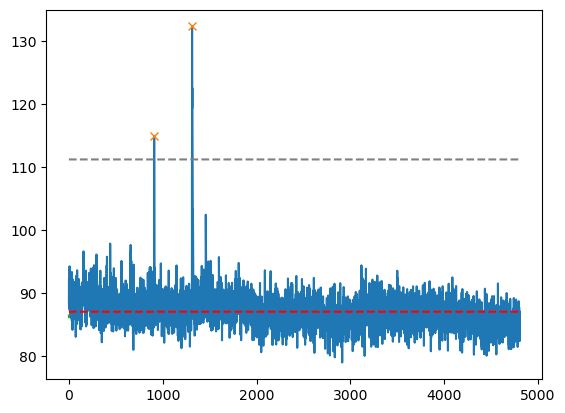

61
the peak time stamps are :[1602]
the peak returns to baseline at frame: [1629]
the decay time in seconds for each peak is: [1.35]
the amplitude of each peak is: [66.92871]


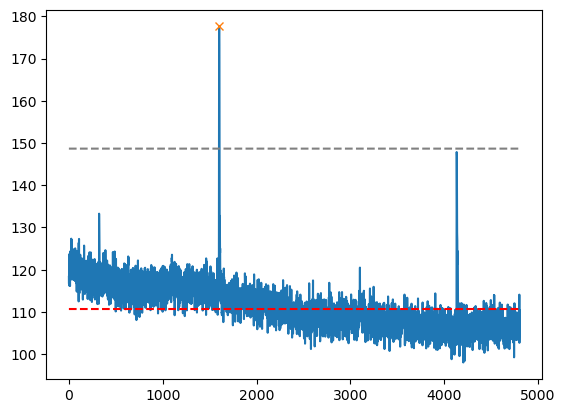

62
the peak time stamps are :[4403]
the peak returns to baseline at frame: [4426]
the decay time in seconds for each peak is: [1.15]
the amplitude of each peak is: [30.19751]


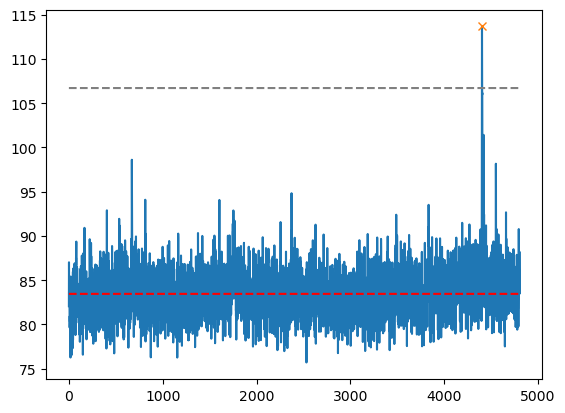

63
the peak time stamps are :[3324 3432 4320]
the peak returns to baseline at frame: [3334, 3448, 4329]
the decay time in seconds for each peak is: [0.5, 0.8, 0.45]
the amplitude of each peak is: [47.45378  41.40448  40.350082]


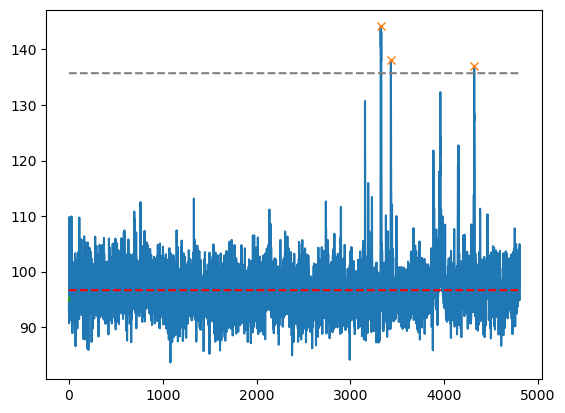

64
the peak time stamps are :[1179 2215]
the peak returns to baseline at frame: [1191, 2225]
the decay time in seconds for each peak is: [0.6, 0.5]
the amplitude of each peak is: [66.29292  76.029495]


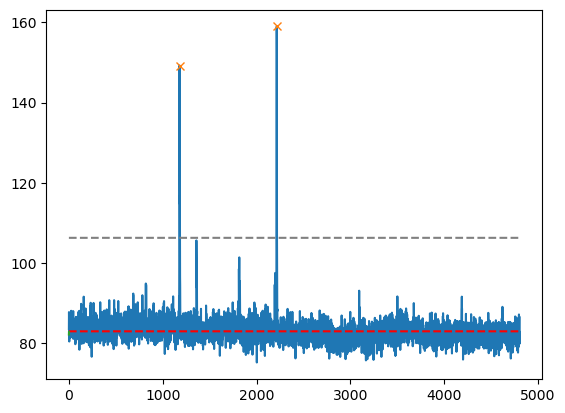

65
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


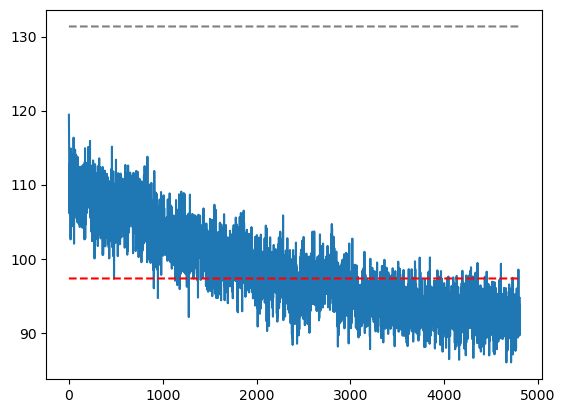

66
the peak time stamps are :[1515 1614]
the peak returns to baseline at frame: [1550, 1630]
the decay time in seconds for each peak is: [1.75, 0.8]
the amplitude of each peak is: [25.087814 24.246033]


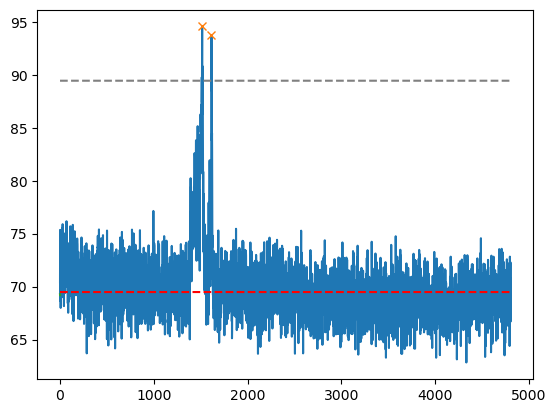

67
the peak time stamps are :[ 629 2615]
the peak returns to baseline at frame: [719, 2623]
the decay time in seconds for each peak is: [4.5, 0.4]
the amplitude of each peak is: [86.21474 40.84262]


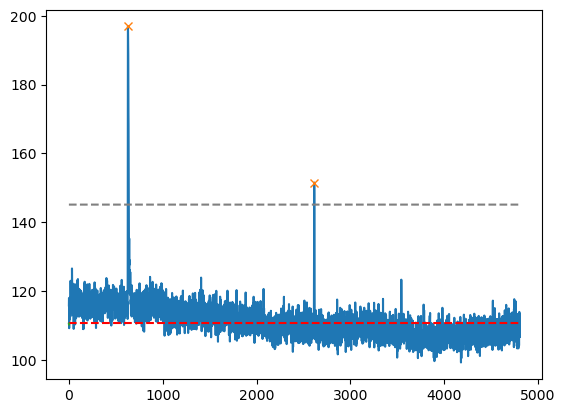

68
the peak time stamps are :[4425]
the peak returns to baseline at frame: [4433]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [44.25757]


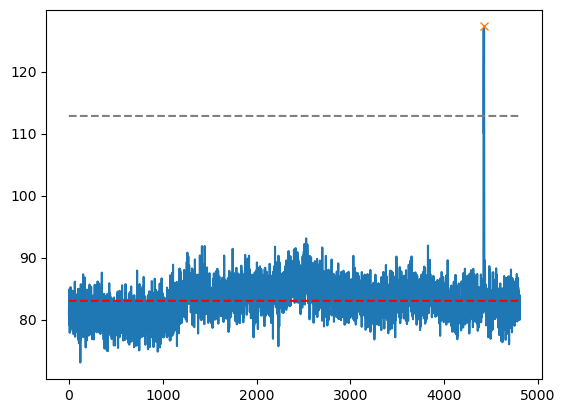

69
the peak time stamps are :[ 103  469  585  734 1328 1983 2009 2251 2912 4560]
the peak returns to baseline at frame: [109, 475, 591, 745, 1343, 2024, 2024, 2267, 2939, 4761]
the decay time in seconds for each peak is: [0.3, 0.3, 0.3, 0.55, 0.75, 2.05, 0.75, 0.8, 1.35, 10.05]
the amplitude of each peak is: [ 42.05011  76.87036  55.97084 140.1919  156.83803 166.60533 154.20946
 146.01883 139.35759  54.65161]


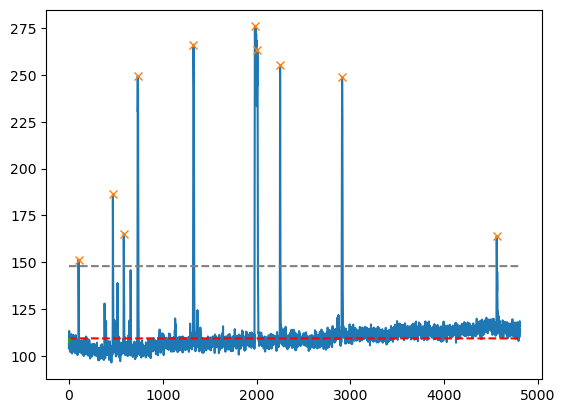

70
the peak time stamps are :[320]
the peak returns to baseline at frame: [338]
the decay time in seconds for each peak is: [0.9]
the amplitude of each peak is: [38.567154]


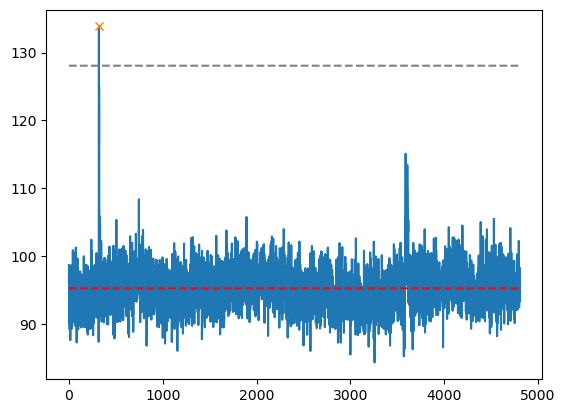

71
the peak time stamps are :[ 179  271  380  781 1135 2076 2895]
the peak returns to baseline at frame: [186, 280, 387, 805, 1147, 2087, 2998]
the decay time in seconds for each peak is: [0.35, 0.45, 0.35, 1.2, 0.6, 0.55, 5.15]
the amplitude of each peak is: [33.720184 36.030945 44.018158 74.4122   61.255035 56.236374 35.88092 ]


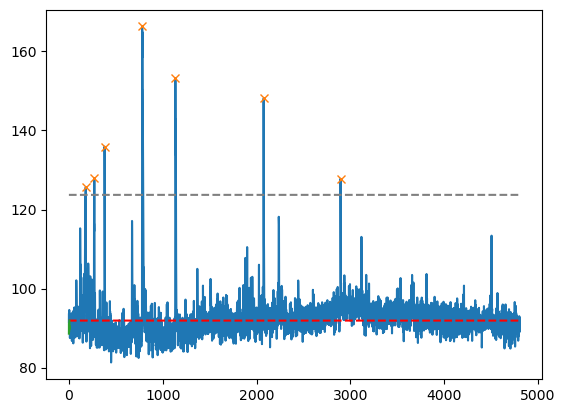

72
the peak time stamps are :[1387 1409 1429 1455 1475 1496 1516]
the peak returns to baseline at frame: [1563, 1563, 1563, 1563, 1563, 1563, 1563]
the decay time in seconds for each peak is: [8.8, 7.7, 6.7, 5.4, 4.4, 3.35, 2.35]
the amplitude of each peak is: [57.891632 51.374756 51.5148   42.041092 50.138245 45.280853 54.3741  ]


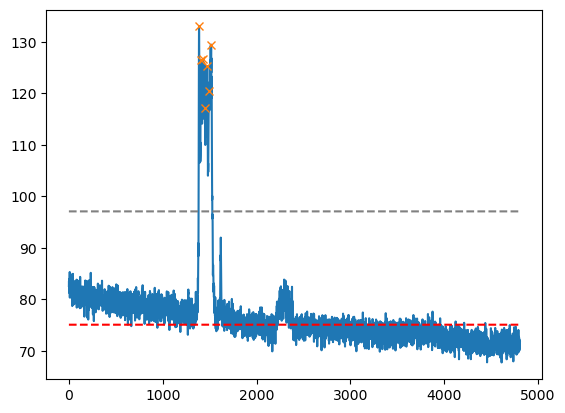

73
the peak time stamps are :[  11  139  698 1035 2298 2749 2850 2883 3346 4470]
the peak returns to baseline at frame: [41, 145, 703, 1050, 2313, 2782, 2863, 2890, 3353, 4475]
the decay time in seconds for each peak is: [1.5, 0.3, 0.25, 0.75, 0.75, 1.65, 0.65, 0.35, 0.35, 0.25]
the amplitude of each peak is: [ 68.92111   60.359955  75.2202    76.218475  96.413895  89.27521
 148.84888   54.117218  53.46724   71.70775 ]


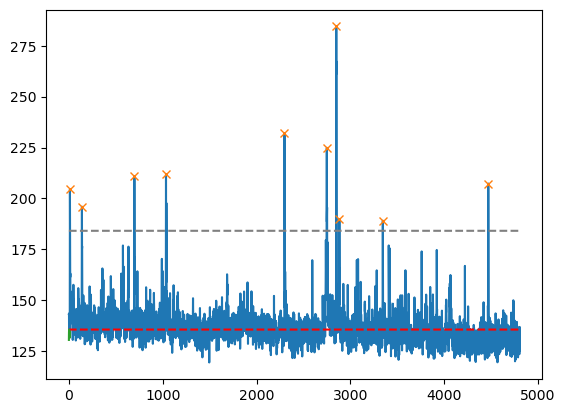

74
the peak time stamps are :[ 767  797  821 2029 2139]
the peak returns to baseline at frame: [776, 835, 835, 2041, 2149]
the decay time in seconds for each peak is: [0.45, 1.9, 0.7, 0.6, 0.5]
the amplitude of each peak is: [37.747467 45.977356 46.132935 48.76706  50.960815]


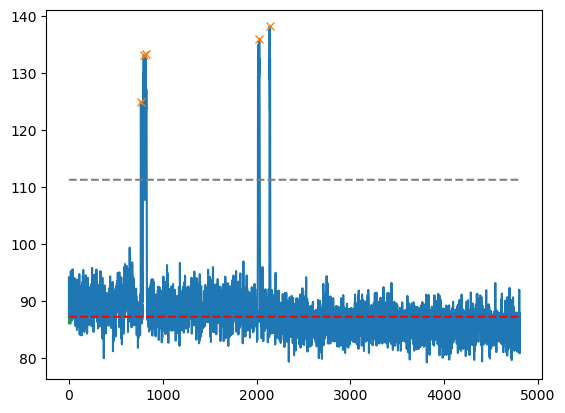

75
the peak time stamps are :[1166 3198]
the peak returns to baseline at frame: [1172, 3216]
the decay time in seconds for each peak is: [0.3, 0.9]
the amplitude of each peak is: [48.97032  42.957718]


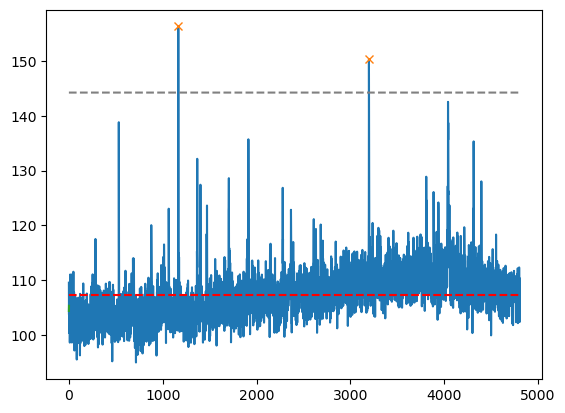

76
the peak time stamps are :[2925 3424]
the peak returns to baseline at frame: [2938, 3431]
the decay time in seconds for each peak is: [0.65, 0.35]
the amplitude of each peak is: [46.313416 40.518402]


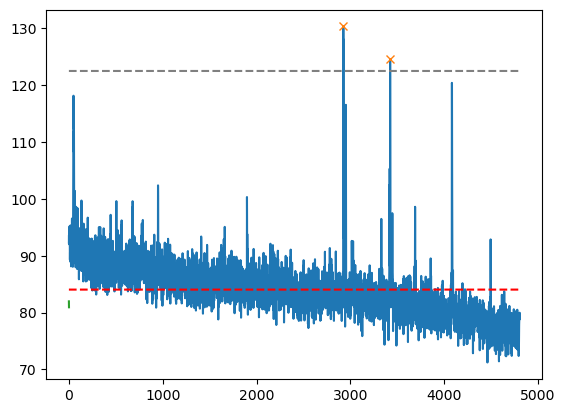

77
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


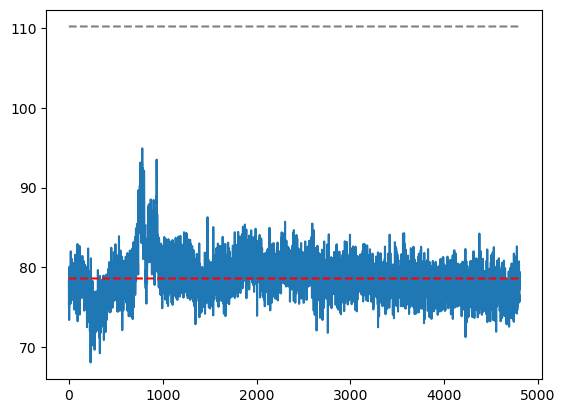

78
the peak time stamps are :[1509]
the peak returns to baseline at frame: [1523]
the decay time in seconds for each peak is: [0.7]
the amplitude of each peak is: [72.32207]


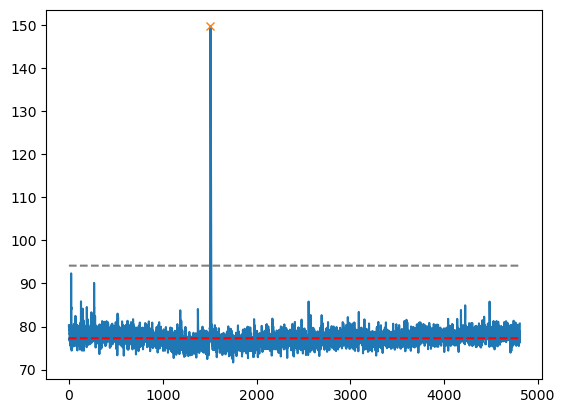

79
the peak time stamps are :[ 945 2390 3703]
the peak returns to baseline at frame: [954, 2397, 3715]
the decay time in seconds for each peak is: [0.45, 0.35, 0.6]
the amplitude of each peak is: [24.628143 31.77269  41.188126]


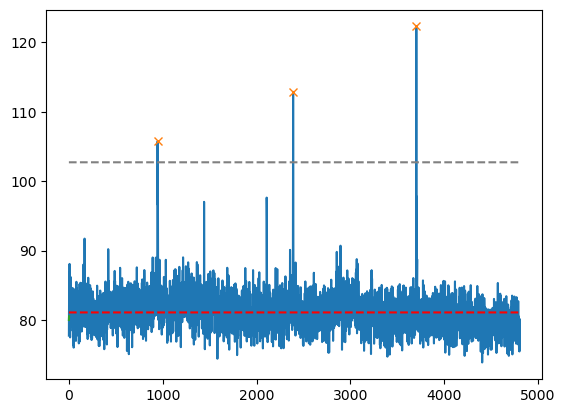

80
the peak time stamps are :[ 650  897 1123 3161]
the peak returns to baseline at frame: [660, 916, 1140, 3182]
the decay time in seconds for each peak is: [0.5, 0.95, 0.85, 1.05]
the amplitude of each peak is: [32.359833 36.723404 33.772263 31.01416 ]


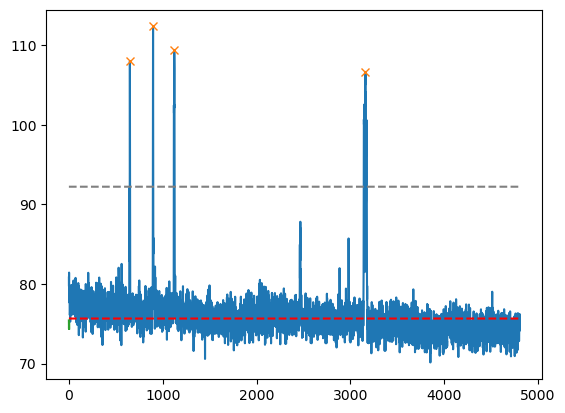

81
the peak time stamps are :[1161 1433 2171 2213 2336 3039 3285 3574 4262]
the peak returns to baseline at frame: [1168, 1455, 2182, 2220, 2349, 3043, 3297, 3595, 4269]
the decay time in seconds for each peak is: [0.35, 1.1, 0.55, 0.35, 0.65, 0.2, 0.6, 1.05, 0.35]
the amplitude of each peak is: [34.285233 36.762314 44.559647 37.675262 97.0334   28.620468 52.01378
 53.85733  38.81578 ]


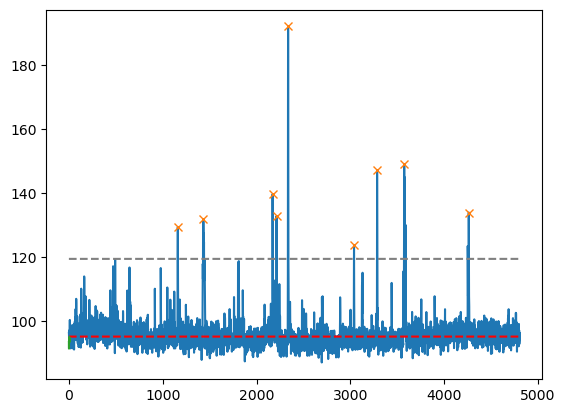

82
the peak time stamps are :[1434]
the peak returns to baseline at frame: [1455]
the decay time in seconds for each peak is: [1.05]
the amplitude of each peak is: [35.613846]


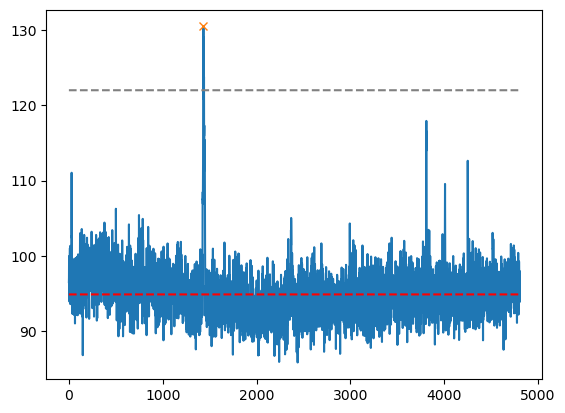

83
the peak time stamps are :[342 792]
the peak returns to baseline at frame: [360, 865]
the decay time in seconds for each peak is: [0.9, 3.65]
the amplitude of each peak is: [64.027435 73.72069 ]


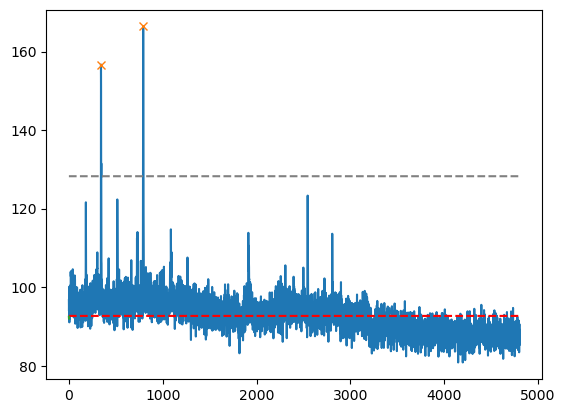

84
the peak time stamps are :[1154 3004 3297]
the peak returns to baseline at frame: [1159, 3010, 3306]
the decay time in seconds for each peak is: [0.25, 0.3, 0.45]
the amplitude of each peak is: [47.54657  51.453995 40.274536]


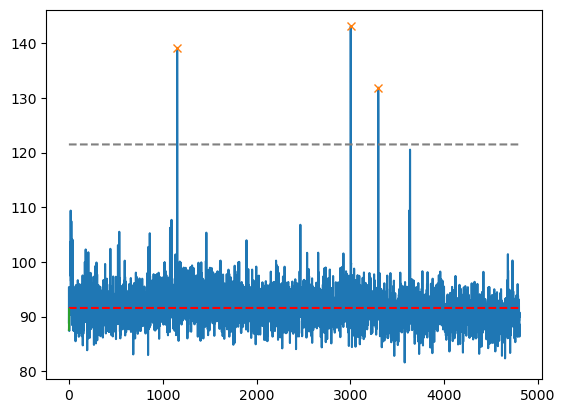

85
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


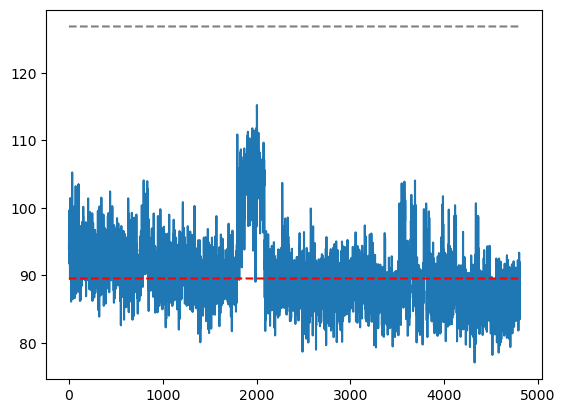

86
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


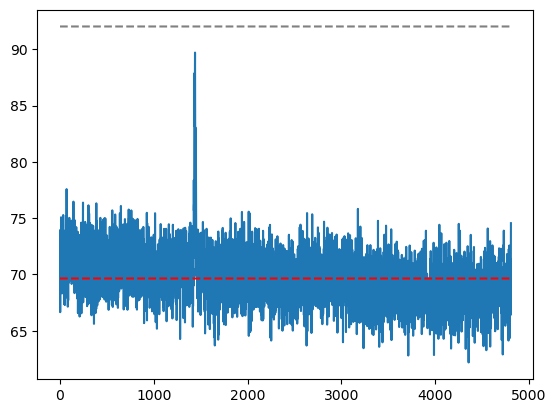

87
the peak time stamps are :[ 184  212  459  679  767  921 2059 2327 3043 3411]
the peak returns to baseline at frame: [196, 268, 476, 699, 809, 934, 2073, 2353, 3063, 3425]
the decay time in seconds for each peak is: [0.6, 2.8, 0.85, 1.0, 2.1, 0.65, 0.7, 1.3, 1.0, 0.7]
the amplitude of each peak is: [34.465576 84.87428  41.99243  42.801285 62.61917  44.83438  33.4187
 41.212082 39.24762  36.05101 ]


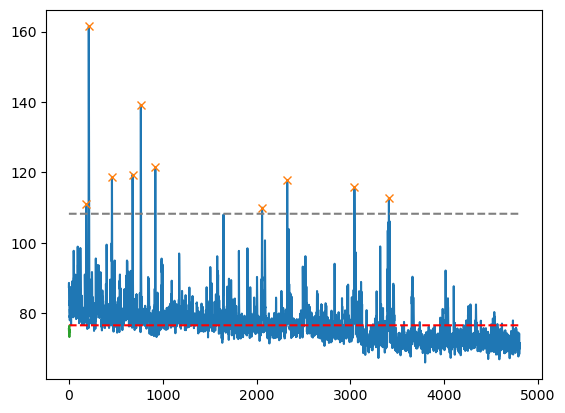

88
the peak time stamps are :[ 196 2145]
the peak returns to baseline at frame: [209, 2159]
the decay time in seconds for each peak is: [0.65, 0.7]
the amplitude of each peak is: [46.222427 40.02954 ]


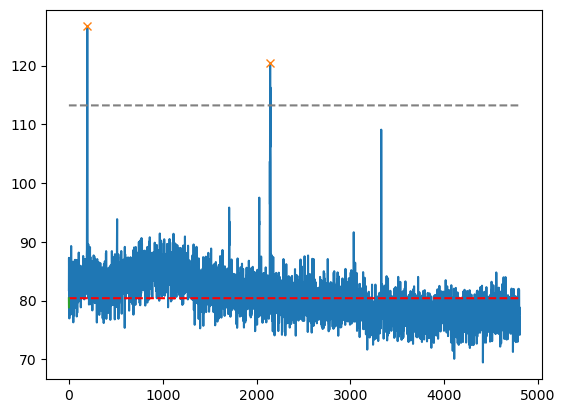

89
the peak time stamps are :[ 158  502 1764 3635]
the peak returns to baseline at frame: [167, 510, 1772, 3645]
the decay time in seconds for each peak is: [0.45, 0.4, 0.4, 0.5]
the amplitude of each peak is: [24.572037 24.163925 58.59076  45.23433 ]


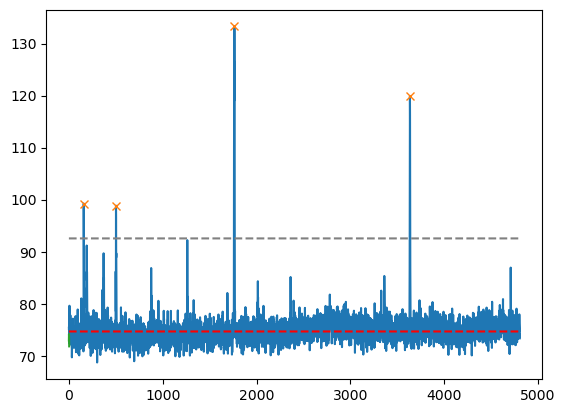

90
the peak time stamps are :[3387]
the peak returns to baseline at frame: [3398]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [33.29799]


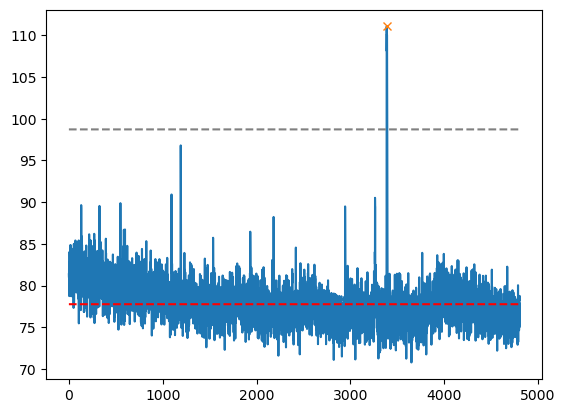

91
the peak time stamps are :[3596]
the peak returns to baseline at frame: [3614]
the decay time in seconds for each peak is: [0.9]
the amplitude of each peak is: [44.237762]


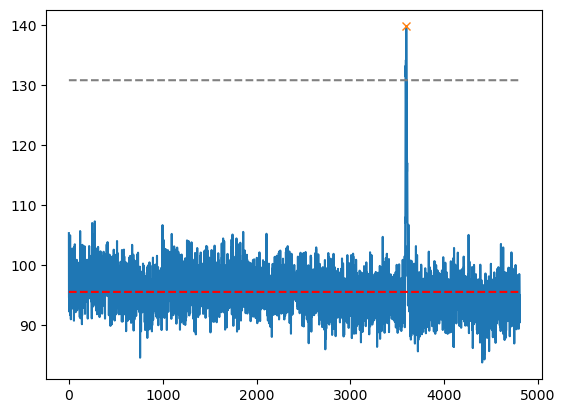

92
the peak time stamps are :[1418]
the peak returns to baseline at frame: [1425]
the decay time in seconds for each peak is: [0.35]
the amplitude of each peak is: [36.572784]


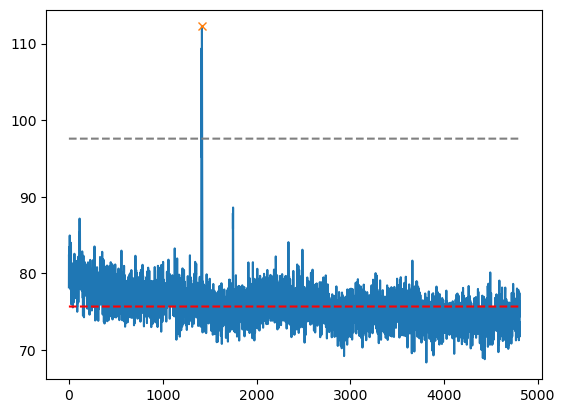

93
the peak time stamps are :[ 952 2036 2912 3481]
the peak returns to baseline at frame: [1027, 2049, 2921, 3487]
the decay time in seconds for each peak is: [3.75, 0.65, 0.45, 0.3]
the amplitude of each peak is: [142.60478   51.48976   66.79222   50.253128]


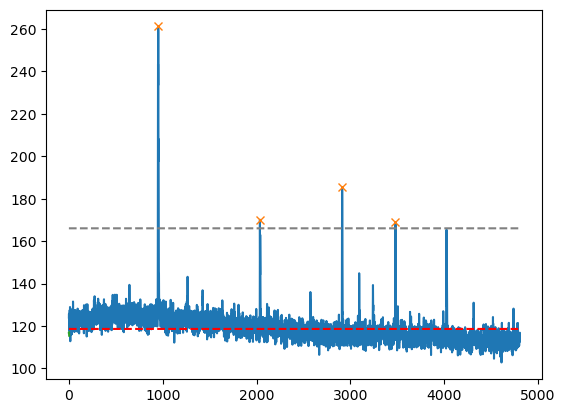

94
the peak time stamps are :[433]
the peak returns to baseline at frame: [441]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [38.35562]


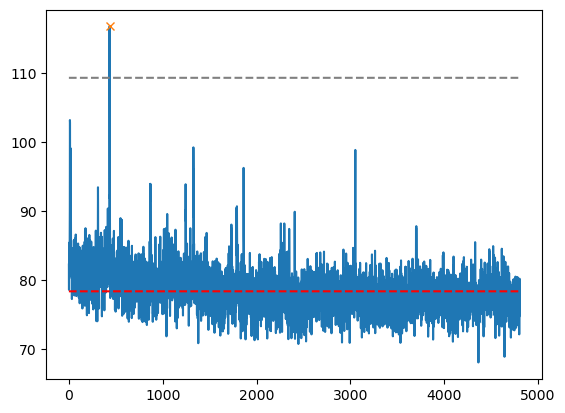

95
the peak time stamps are :[ 193  280  473  529  643 2452 3419 3893]
the peak returns to baseline at frame: [203, 297, 487, 594, 662, 2461, 3444, 3900]
the decay time in seconds for each peak is: [0.5, 0.85, 0.7, 3.25, 0.95, 0.45, 1.25, 0.35]
the amplitude of each peak is: [33.388275 60.15782  39.689728 43.44461  42.21489  40.13382  35.14714
 26.511475]


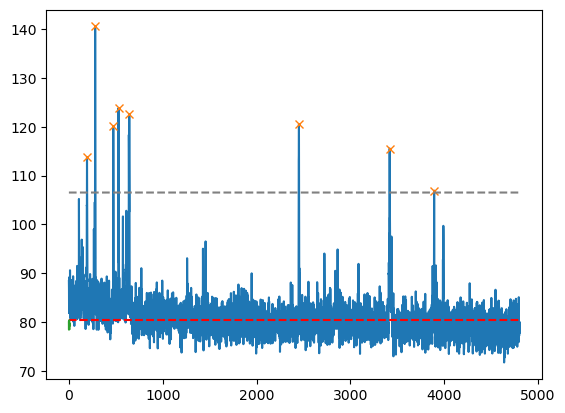

96
the peak time stamps are :[  43 1633 1661 2271 2648 3097 3125 4402]
the peak returns to baseline at frame: [50, 1640, 1673, 2279, 2673, 3111, 3136, 4419]
the decay time in seconds for each peak is: [0.35, 0.35, 0.6, 0.4, 1.25, 0.7, 0.55, 0.85]
the amplitude of each peak is: [34.08879  57.539444 38.426666 24.443024 27.301056 47.058426 37.716324
 24.67398 ]


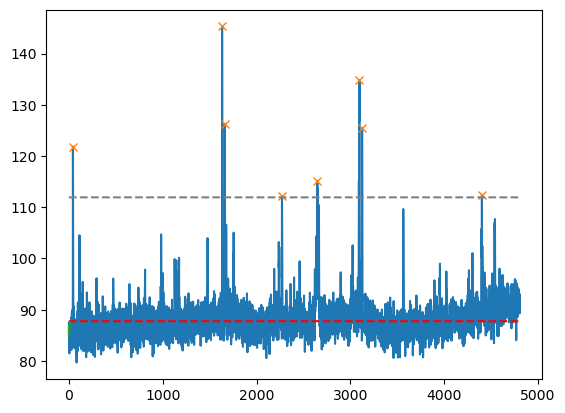

97
the peak time stamps are :[2846 3041]
the peak returns to baseline at frame: [2878, 3053]
the decay time in seconds for each peak is: [1.6, 0.6]
the amplitude of each peak is: [35.956253 35.948486]


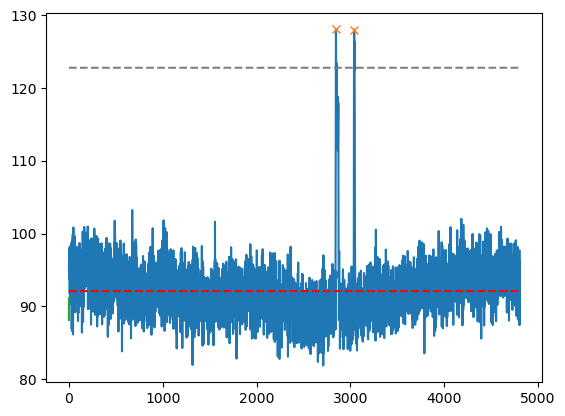

98
the peak time stamps are :[14]
the peak returns to baseline at frame: [39]
the decay time in seconds for each peak is: [1.25]
the amplitude of each peak is: [69.21341]


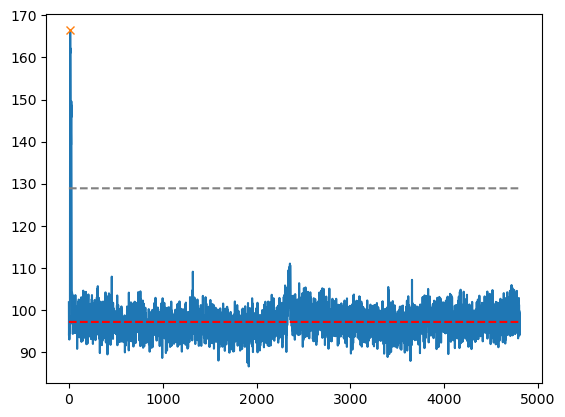

99
the peak time stamps are :[440]
the peak returns to baseline at frame: [461]
the decay time in seconds for each peak is: [1.05]
the amplitude of each peak is: [56.05443]


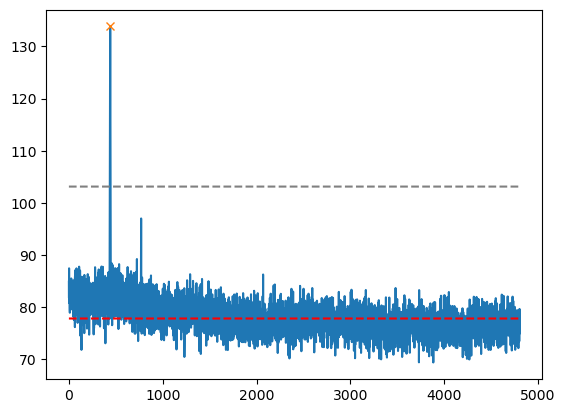

100
the peak time stamps are :[2165 3305]
the peak returns to baseline at frame: [2190, 3315]
the decay time in seconds for each peak is: [1.25, 0.5]
the amplitude of each peak is: [51.172485 31.052658]


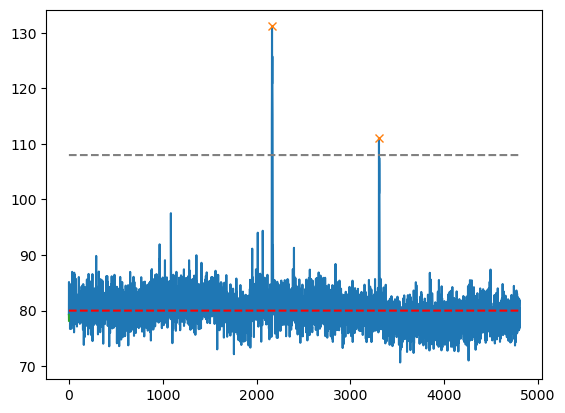

101
the peak time stamps are :[2442]
the peak returns to baseline at frame: [2464]
the decay time in seconds for each peak is: [1.1]
the amplitude of each peak is: [34.314346]


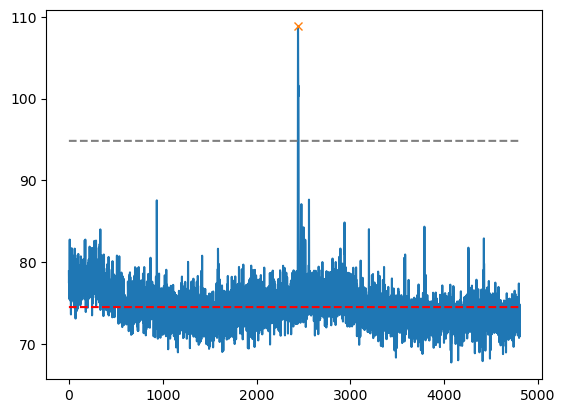

102
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


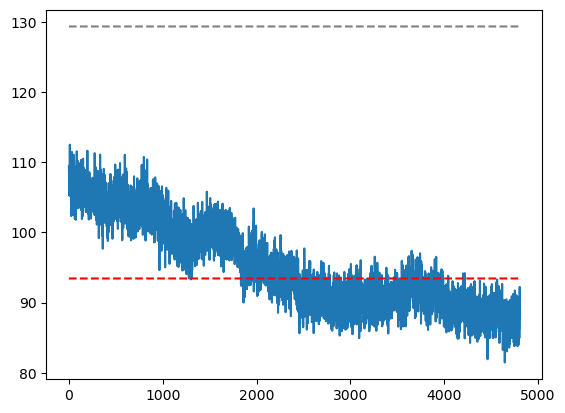

103
the peak time stamps are :[ 913 1250 1628 1715]
the peak returns to baseline at frame: [997, 1300, 1653, 1726]
the decay time in seconds for each peak is: [4.2, 2.5, 1.25, 0.55]
the amplitude of each peak is: [32.462814 31.659119 38.66858  23.924744]


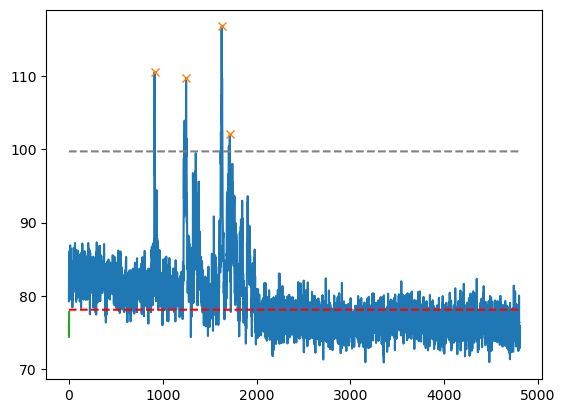

104
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


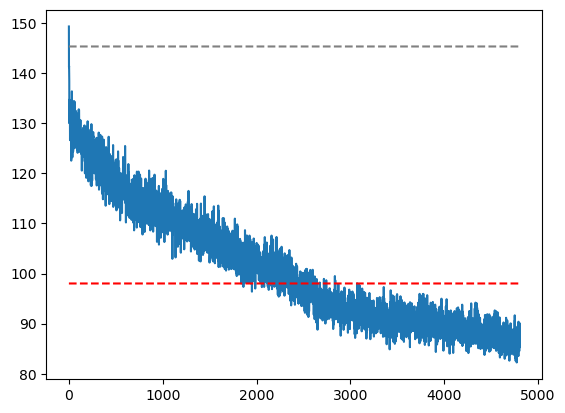

105
the peak time stamps are :[ 936 2441 4258]
the peak returns to baseline at frame: [952, 2456, 4265]
the decay time in seconds for each peak is: [0.8, 0.75, 0.35]
the amplitude of each peak is: [34.89424  46.913666 22.445145]


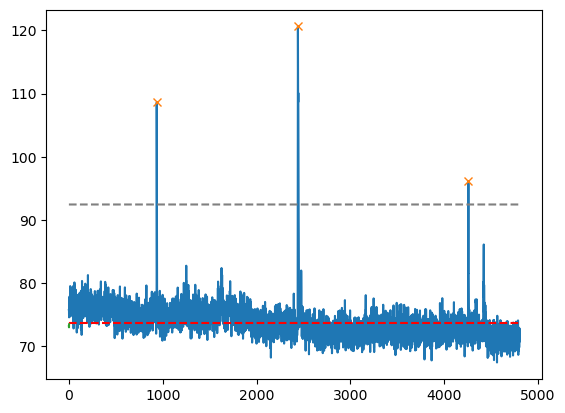

106
the peak time stamps are :[1879 2089 2599 3654 4118]
the peak returns to baseline at frame: [1917, 2110, 2623, 3673, 4142]
the decay time in seconds for each peak is: [1.9, 1.05, 1.2, 0.95, 1.2]
the amplitude of each peak is: [38.684784 79.157196 32.858032 28.095428 37.89891 ]


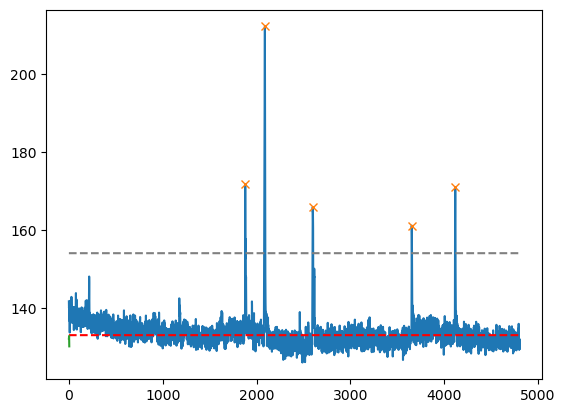

107
the peak time stamps are :[893]
the peak returns to baseline at frame: [910]
the decay time in seconds for each peak is: [0.85]
the amplitude of each peak is: [23.529648]


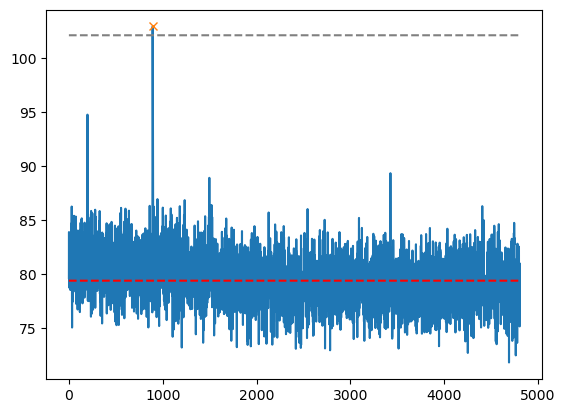

108
the peak time stamps are :[2630 2650]
the peak returns to baseline at frame: [2739, 2739]
the decay time in seconds for each peak is: [5.45, 4.45]
the amplitude of each peak is: [23.493347 24.14853 ]


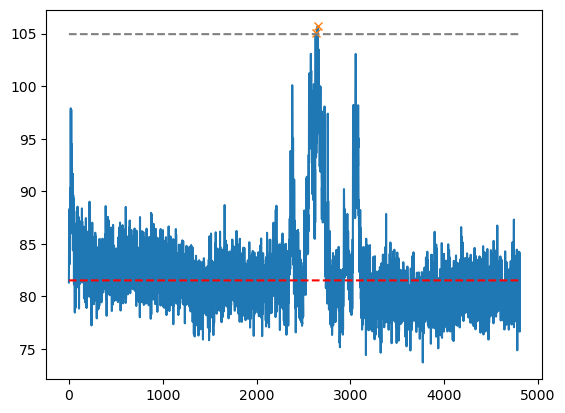

109
the peak time stamps are :[ 168  510 1805 1888 3231 3638]
the peak returns to baseline at frame: [174, 526, 1821, 1895, 3241, 3649]
the decay time in seconds for each peak is: [0.3, 0.8, 0.8, 0.35, 0.5, 0.55]
the amplitude of each peak is: [27.85788  22.285248 34.236298 38.2518   28.72644  42.870804]


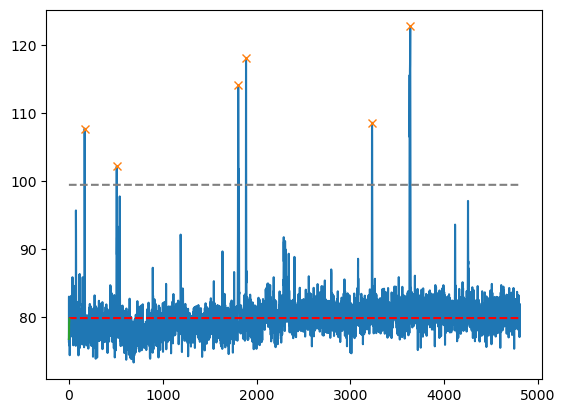

110
the peak time stamps are :[3102]
the peak returns to baseline at frame: [3110]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [48.93132]


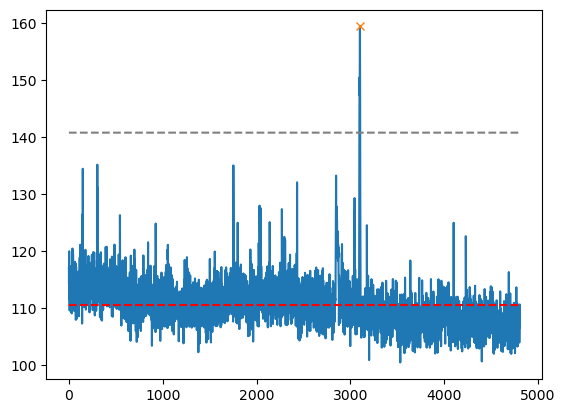

111
the peak time stamps are :[1162 1495 1605 3904]
the peak returns to baseline at frame: [1170, 1505, 1623, 3912]
the decay time in seconds for each peak is: [0.4, 0.5, 0.9, 0.4]
the amplitude of each peak is: [88.10503  89.94458  82.32344  61.259598]


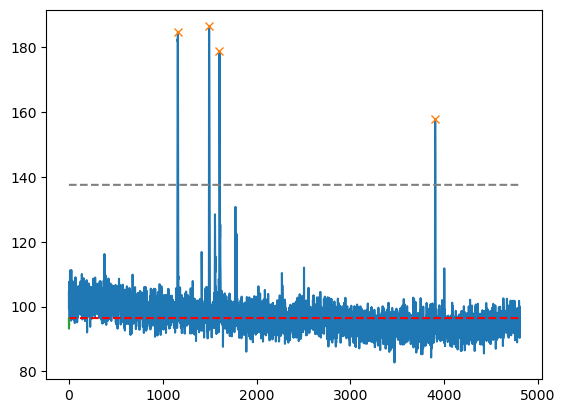

112
the peak time stamps are :[809]
the peak returns to baseline at frame: [839]
the decay time in seconds for each peak is: [1.5]
the amplitude of each peak is: [53.750626]


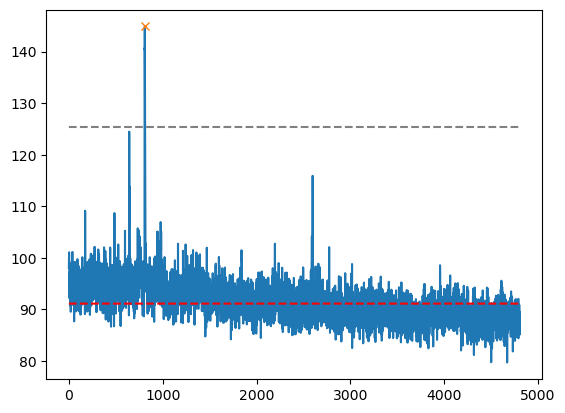

113
the peak time stamps are :[441]
the peak returns to baseline at frame: [464]
the decay time in seconds for each peak is: [1.15]
the amplitude of each peak is: [34.964294]


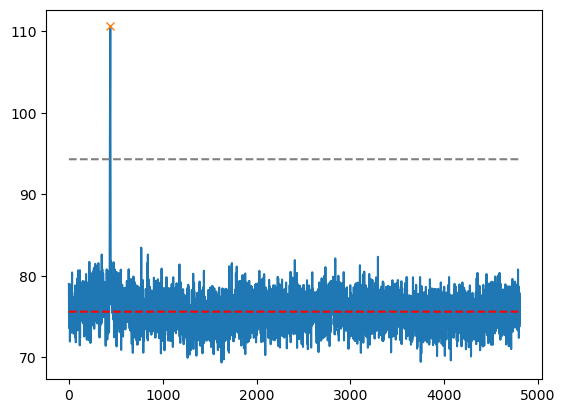

114
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


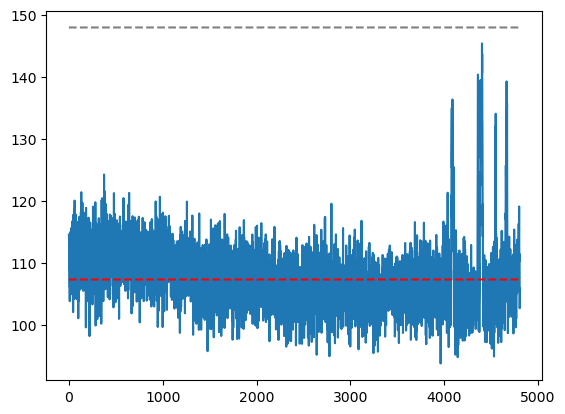

115
the peak time stamps are :[  12  135  330 1122 1249 2107 2176 3069]
the peak returns to baseline at frame: [75, 149, 345, 1131, 1258, 2120, 2198, 3076]
the decay time in seconds for each peak is: [3.15, 0.7, 0.75, 0.45, 0.45, 0.65, 1.1, 0.35]
the amplitude of each peak is: [14.429443 34.153458 21.75122  30.003525 18.122467 19.586441 17.9021
 14.345474]


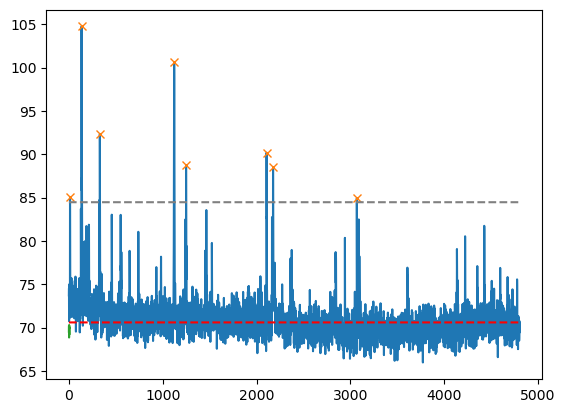

116
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


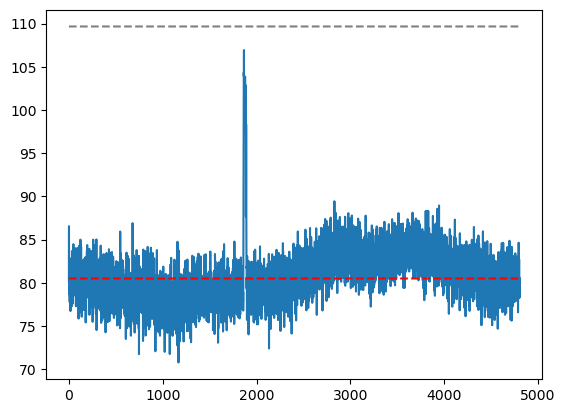

117
the peak time stamps are :[1321 2354]
the peak returns to baseline at frame: [1354, 2366]
the decay time in seconds for each peak is: [1.65, 0.6]
the amplitude of each peak is: [64.23117 32.49794]


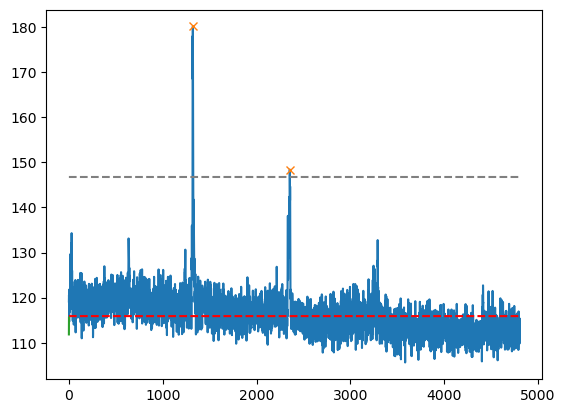

118
the peak time stamps are :[770]
the peak returns to baseline at frame: [797]
the decay time in seconds for each peak is: [1.35]
the amplitude of each peak is: [61.36441]


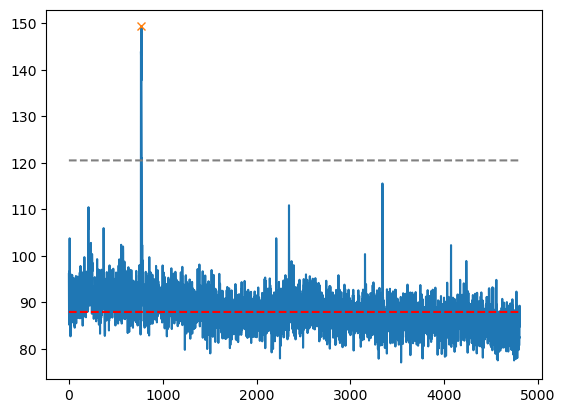

119
the peak time stamps are :[3599]
the peak returns to baseline at frame: [3606]
the decay time in seconds for each peak is: [0.35]
the amplitude of each peak is: [80.573975]


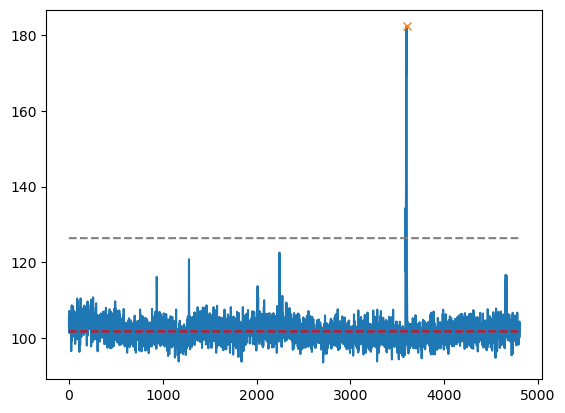

120
the peak time stamps are :[ 835 1051 2654 2845]
the peak returns to baseline at frame: [845, 1055, 2663, 2857]
the decay time in seconds for each peak is: [0.5, 0.2, 0.45, 0.6]
the amplitude of each peak is: [ 44.08174  35.20021 102.28795  90.9193 ]


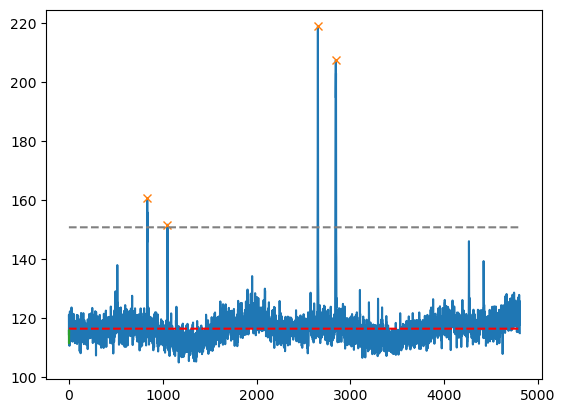

121
the peak time stamps are :[3939 4760]
the peak returns to baseline at frame: [3948, 4771]
the decay time in seconds for each peak is: [0.45, 0.55]
the amplitude of each peak is: [54.278336 60.9245  ]


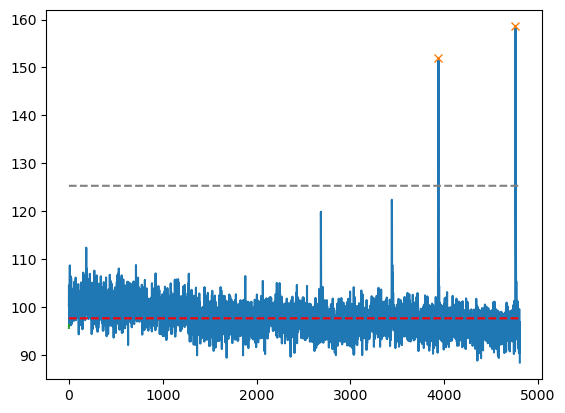

122
the peak time stamps are :[ 394  550  700 1122 1208 1319 2134 2973 3193 4212]
the peak returns to baseline at frame: [437, 561, 827, 1131, 1225, 1360, 2153, 2977, 3198, 4220]
the decay time in seconds for each peak is: [2.15, 0.55, 6.35, 0.45, 0.85, 2.05, 0.95, 0.2, 0.25, 0.4]
the amplitude of each peak is: [ 53.93904   43.23909   49.308533  41.14749   41.973495 107.23103
  45.806183  41.836746  51.392914  46.214066]


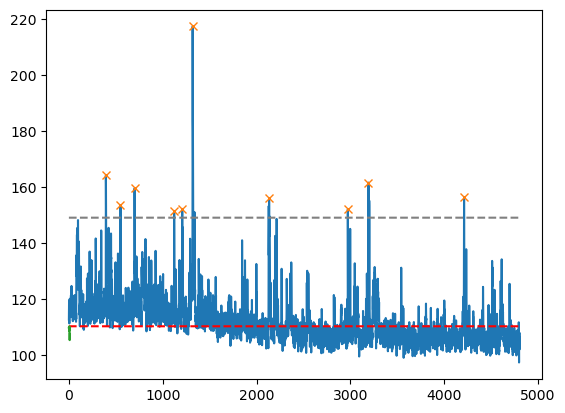

123
the peak time stamps are :[739]
the peak returns to baseline at frame: [830]
the decay time in seconds for each peak is: [4.55]
the amplitude of each peak is: [68.09015]


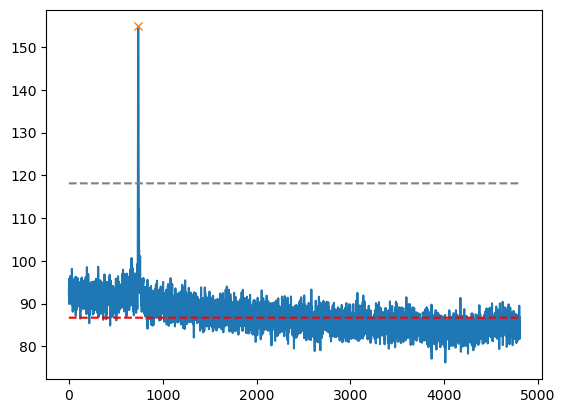

124
the peak time stamps are :[406 432]
the peak returns to baseline at frame: [449, 449]
the decay time in seconds for each peak is: [2.15, 0.85]
the amplitude of each peak is: [45.85933  54.119537]


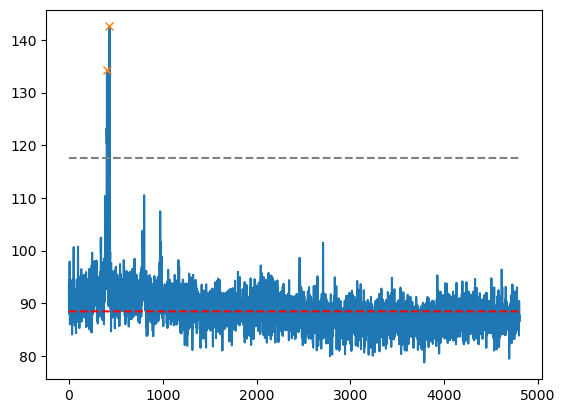

125
the peak time stamps are :[2088 4208]
the peak returns to baseline at frame: [2105, 4215]
the decay time in seconds for each peak is: [0.85, 0.35]
the amplitude of each peak is: [38.36653 40.57863]


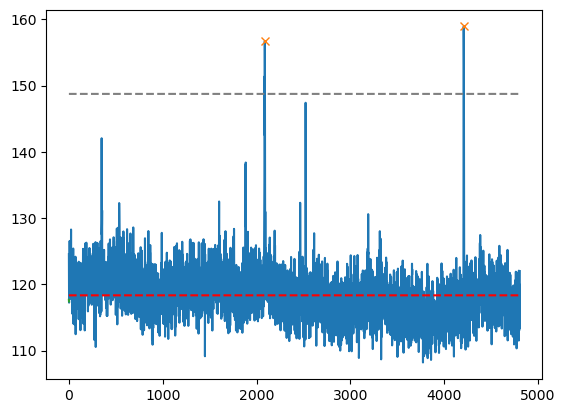

126
the peak time stamps are :[ 807 1748]
the peak returns to baseline at frame: [822, 1776]
the decay time in seconds for each peak is: [0.75, 1.4]
the amplitude of each peak is: [30.419678 53.648514]


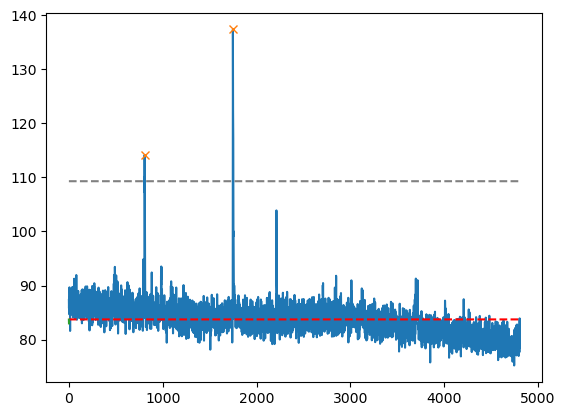

127
the peak time stamps are :[4207]
the peak returns to baseline at frame: [4215]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [47.251648]


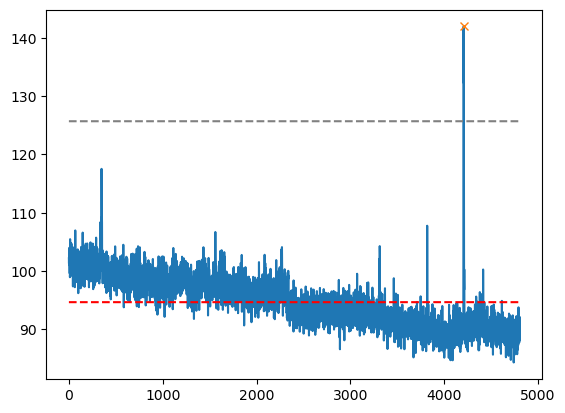

128
the peak time stamps are :[ 888 1526]
the peak returns to baseline at frame: [926, 1541]
the decay time in seconds for each peak is: [1.9, 0.75]
the amplitude of each peak is: [67.32077  30.745697]


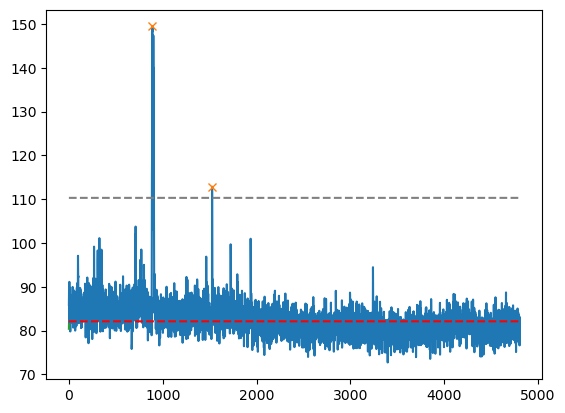

129
the peak time stamps are :[2186]
the peak returns to baseline at frame: [2216]
the decay time in seconds for each peak is: [1.5]
the amplitude of each peak is: [70.32233]


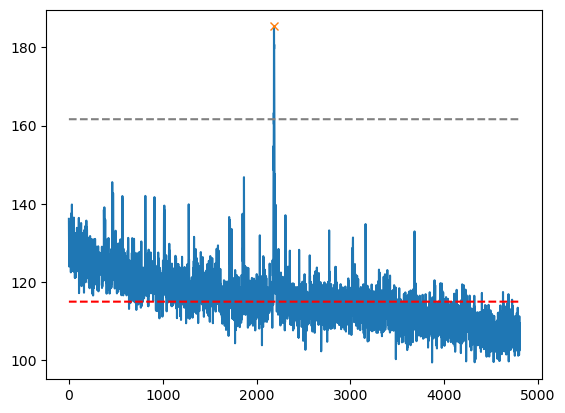

130
the peak time stamps are :[1028]
the peak returns to baseline at frame: [1055]
the decay time in seconds for each peak is: [1.35]
the amplitude of each peak is: [58.24492]


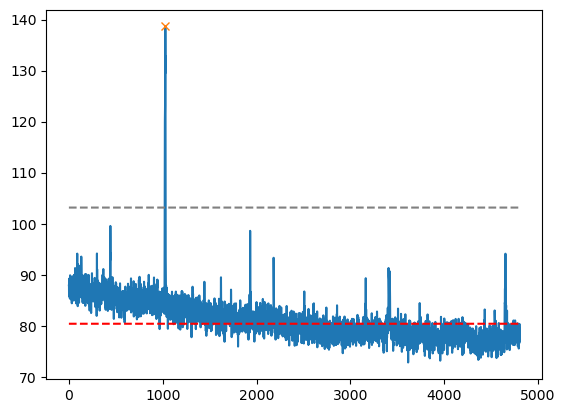

131
the peak time stamps are :[ 28  52  76 101 133 172 197]
the peak returns to baseline at frame: [1352, 1352, 1352, 1352, 1352, 1352, 1352]
the decay time in seconds for each peak is: [66.2, 65.0, 63.8, 62.55, 60.95, 59.0, 57.75]
the amplitude of each peak is: [32.48491  29.406067 29.298111 28.647446 29.97435  29.11882  30.372452]


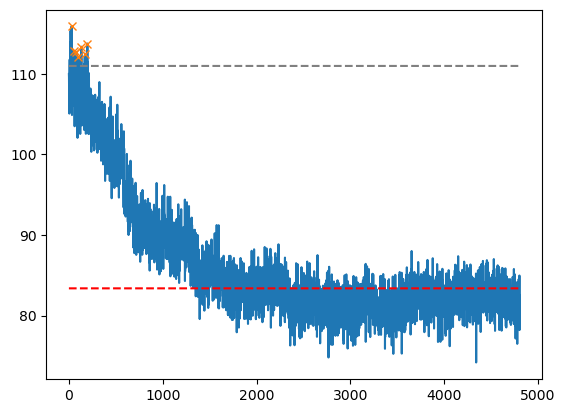

132
the peak time stamps are :[367 507]
the peak returns to baseline at frame: [383, 528]
the decay time in seconds for each peak is: [0.8, 1.05]
the amplitude of each peak is: [24.910309 31.513275]


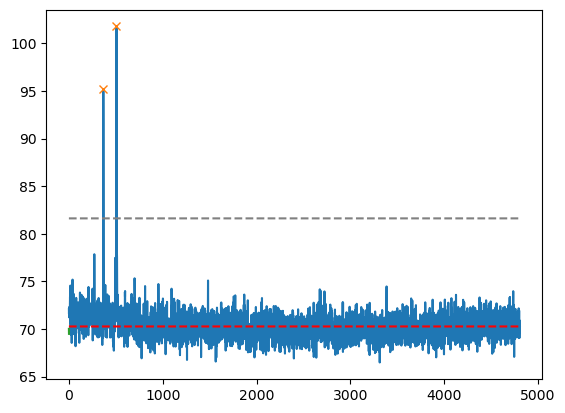

133
the peak time stamps are :[  85  192 1036]
the peak returns to baseline at frame: [385, 385, 1072]
the decay time in seconds for each peak is: [15.0, 9.65, 1.8]
the amplitude of each peak is: [41.384033 40.3192   47.565292]


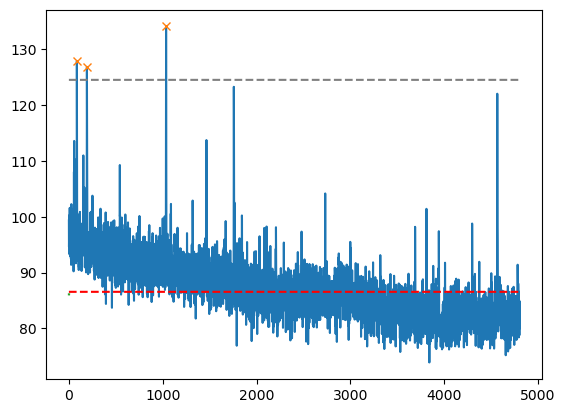

134
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


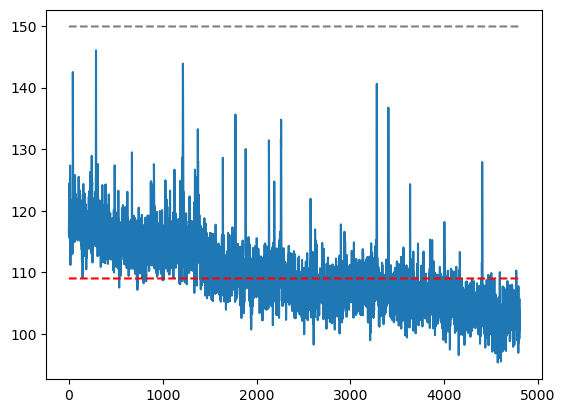

135
the peak time stamps are :[97]
the peak returns to baseline at frame: [246]
the decay time in seconds for each peak is: [7.45]
the amplitude of each peak is: [37.79854]


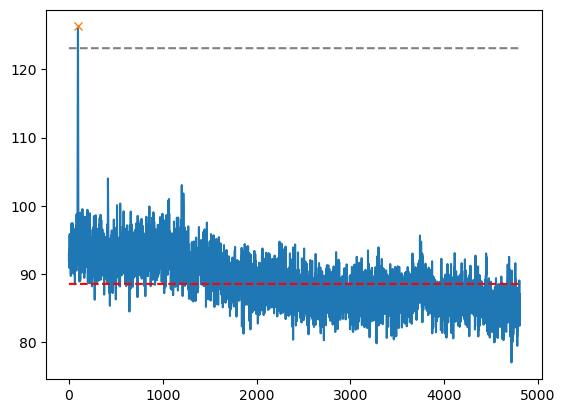

136
the peak time stamps are :[1969 3190 4598]
the peak returns to baseline at frame: [1975, 3203, 4604]
the decay time in seconds for each peak is: [0.3, 0.65, 0.3]
the amplitude of each peak is: [19.906769 39.73889  22.847488]


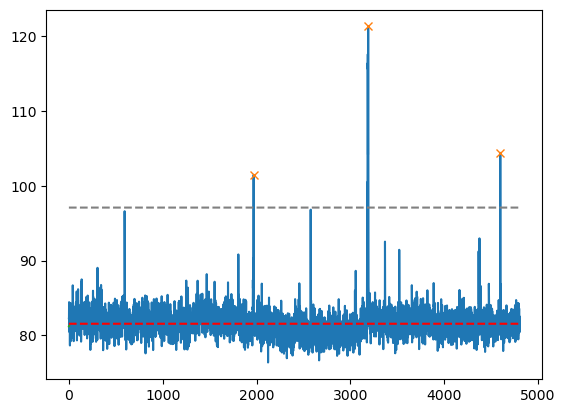

137
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


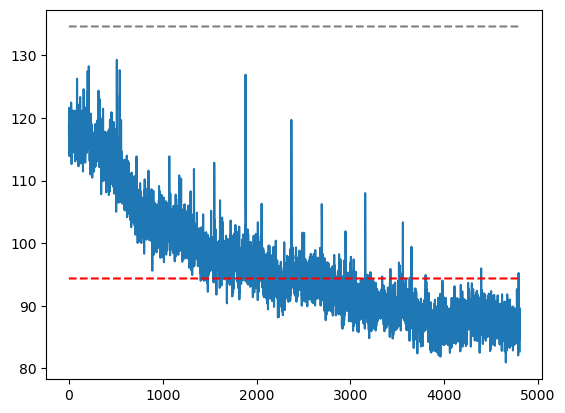

138
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


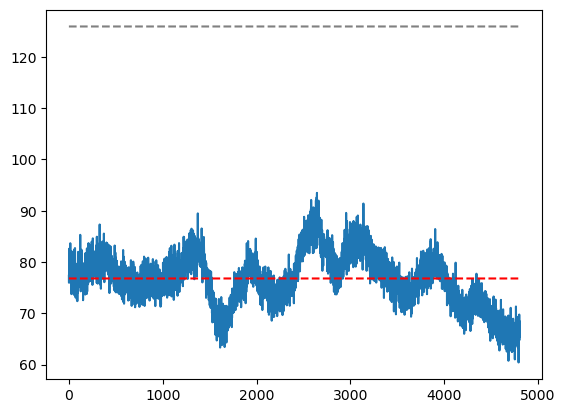

139
the peak time stamps are :[ 281  331  364  461 1077 2249 3124]
the peak returns to baseline at frame: [310, 346, 391, 476, 1083, 2256, 3128]
the decay time in seconds for each peak is: [1.45, 0.75, 1.35, 0.75, 0.3, 0.35, 0.2]
the amplitude of each peak is: [79.55684  74.99124  73.60185  62.01425  36.081223 66.63205  39.44246 ]


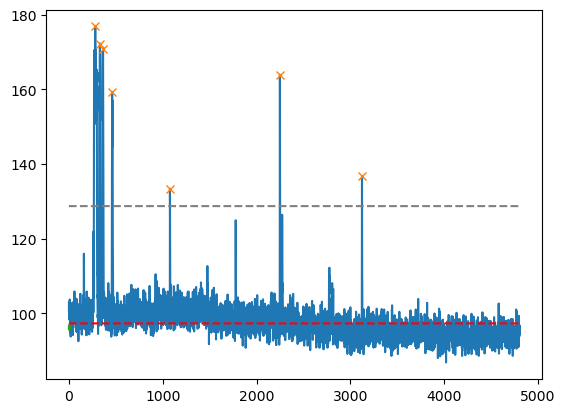

140
the peak time stamps are :[ 166  313  862  900  948 1038 1305 1370 1393 1573 1692 1744 1778 2425
 2601 2692 2954 3024 3175 3515 3644 3873 4121 4389 4629 4769]
the peak returns to baseline at frame: [177, 326, 869, 911, 975, 1052, 1315, 1408, 1408, 1585, 1788, 1788, 1788, 2449, 2610, 2702, 2963, 3040, 3183, 3524, 3651, 3882, 4130, 4409, 4639, 4780]
the decay time in seconds for each peak is: [0.55, 0.65, 0.35, 0.55, 1.35, 0.7, 0.5, 1.9, 0.75, 0.6, 4.8, 2.2, 0.5, 1.2, 0.45, 0.5, 0.45, 0.8, 0.4, 0.45, 0.35, 0.45, 0.45, 1.0, 0.5, 0.55]
the amplitude of each peak is: [ 60.129623  31.6586    32.93959   40.447052 104.30176   92.161194
  43.322266  43.482376  52.887436  30.864807  47.49283   36.70082
  80.11777   66.545334  40.573013  58.000366  38.141388  43.074585
  47.221085  42.720093  43.968674  41.75348   58.089874  45.940765
  70.99057   73.78221 ]


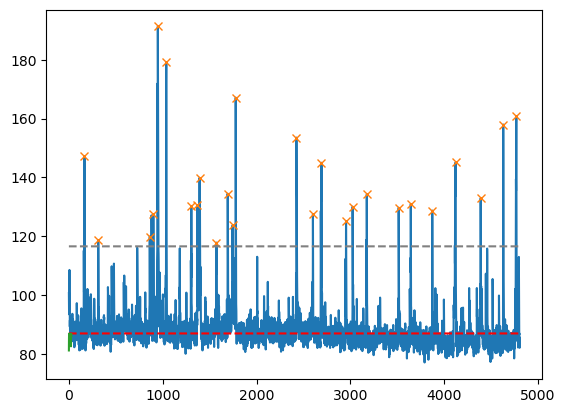

141
the peak time stamps are :[96]
the peak returns to baseline at frame: [117]
the decay time in seconds for each peak is: [1.05]
the amplitude of each peak is: [51.430237]


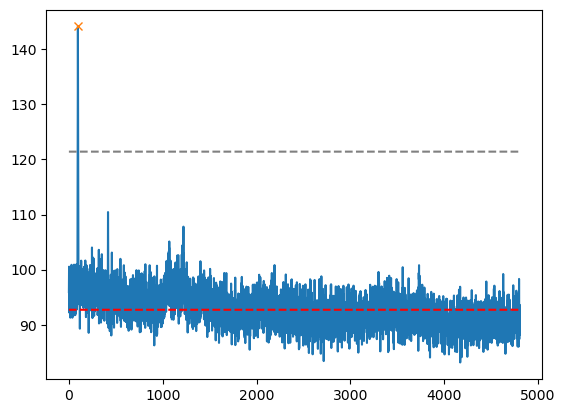

142
the peak time stamps are :[  95 1048 1069 1090 1111 1138 1158 1182 1209 1230 1254 1285 1422]
the peak returns to baseline at frame: [170, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641, 1641]
the decay time in seconds for each peak is: [3.75, 29.65, 28.6, 27.55, 26.5, 25.15, 24.15, 22.95, 21.6, 20.55, 19.35, 17.8, 10.95]
the amplitude of each peak is: [25.32103  50.73842  57.329376 28.201416 29.728317 37.7619   57.42572
 41.390152 52.257812 25.564316 43.530884 35.499985 32.399918]


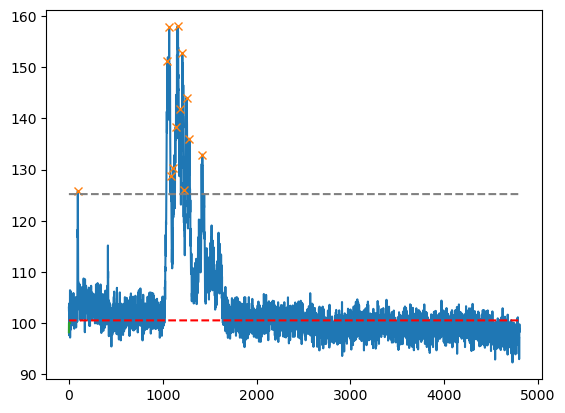

143
the peak time stamps are :[  83  161  600  650  833 1456 1491 1690 1805 2926 3005 3029 3069 3094
 4603]
the peak returns to baseline at frame: [97, 177, 606, 669, 851, 1466, 1513, 1697, 1814, 2936, 3013, 3053, 3118, 3118, 4618]
the decay time in seconds for each peak is: [0.7, 0.8, 0.3, 0.95, 0.9, 0.5, 1.1, 0.35, 0.45, 0.5, 0.4, 1.2, 2.45, 1.2, 0.75]
the amplitude of each peak is: [178.18799  144.44655   42.67639   45.135345  74.245926  71.85095
 140.77841   48.17125   69.59613   55.666092  65.550125 145.29897
  51.41954  137.82367   37.62616 ]


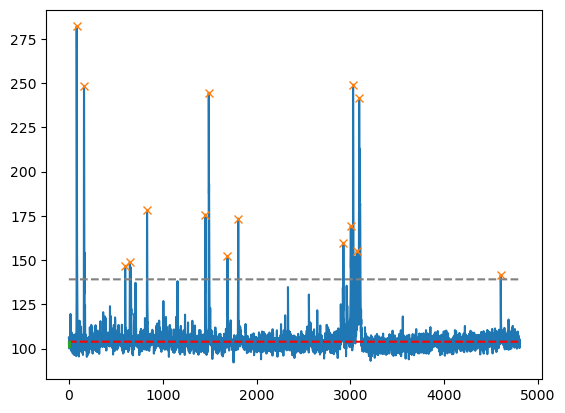

144
the peak time stamps are :[ 394  514  682  716 1081 1220 1297 1374 1601 1666 1701 1752 2345 2810
 2957 3330 3620 3984 4011 4717]
the peak returns to baseline at frame: [402, 522, 696, 728, 1092, 1231, 1309, 1395, 1613, 1728, 1728, 1761, 2353, 2823, 2969, 3339, 3632, 4024, 4024, 4723]
the decay time in seconds for each peak is: [0.4, 0.4, 0.7, 0.6, 0.55, 0.55, 0.6, 1.05, 0.6, 3.1, 1.35, 0.45, 0.4, 0.65, 0.6, 0.45, 0.6, 2.0, 0.65, 0.3]
the amplitude of each peak is: [45.032944 30.667236 85.65883  42.545685 61.808548 34.844437 47.65126
 36.048096 31.671494 33.93924  36.04048  42.69722  40.128387 34.53311
 45.792313 37.550735 69.94595  33.074234 61.904724 31.574661]


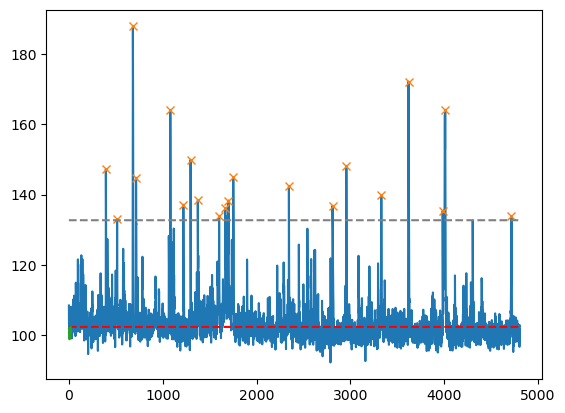

145
the peak time stamps are :[ 102  418 1433 1531 1855 1902 2122 2857 3339 3364 3532]
the peak returns to baseline at frame: [119, 474, 1441, 1538, 1860, 1926, 2138, 2861, 3374, 3374, 3541]
the decay time in seconds for each peak is: [0.85, 2.8, 0.4, 0.35, 0.25, 1.2, 0.8, 0.2, 1.75, 0.5, 0.45]
the amplitude of each peak is: [48.504333 46.145233 54.567566 67.60721  52.346664 68.9156   65.255936
 65.51369  55.423843 63.899246 56.447754]


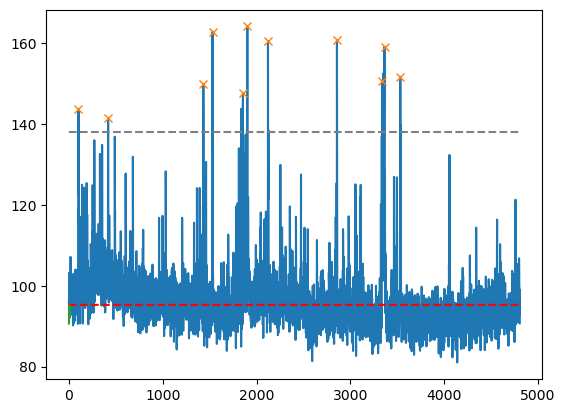

146
the peak time stamps are :[ 46 177 395 681]
the peak returns to baseline at frame: [57, 187, 436, 692]
the decay time in seconds for each peak is: [0.55, 0.5, 2.05, 0.55]
the amplitude of each peak is: [58.46846  55.040283 52.974365 46.2881  ]


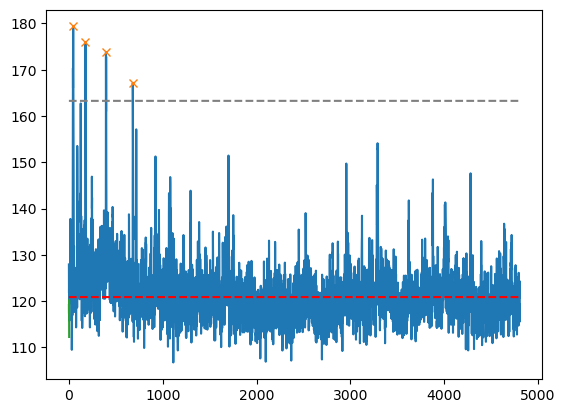

147
the peak time stamps are :[ 659 1004 1208]
the peak returns to baseline at frame: [677, 1019, 1225]
the decay time in seconds for each peak is: [0.9, 0.75, 0.85]
the amplitude of each peak is: [45.113358 56.94922  56.576126]


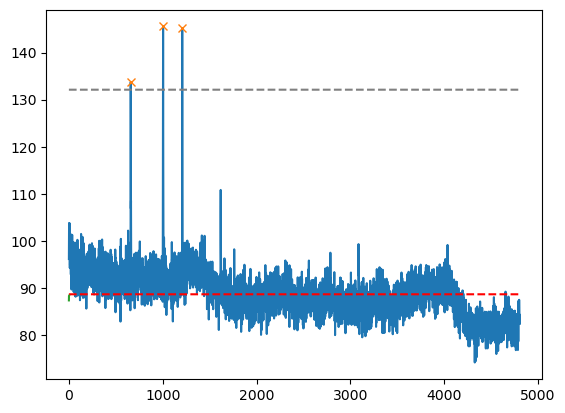

148
the peak time stamps are :[  33 1626 3366]
the peak returns to baseline at frame: [144, 1653, 3375]
the decay time in seconds for each peak is: [5.55, 1.35, 0.45]
the amplitude of each peak is: [49.873566 60.281876 42.537567]


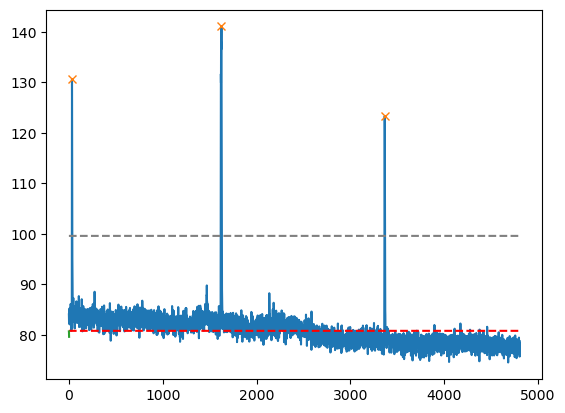

149
the peak time stamps are :[1455 2747]
the peak returns to baseline at frame: [1476, 2767]
the decay time in seconds for each peak is: [1.05, 1.0]
the amplitude of each peak is: [72.47513 56.8246 ]


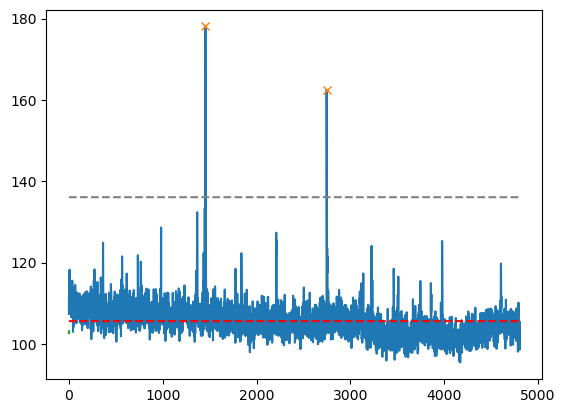

150
the peak time stamps are :[ 821 2083]
the peak returns to baseline at frame: [830, 2099]
the decay time in seconds for each peak is: [0.45, 0.8]
the amplitude of each peak is: [19.951904 37.429306]


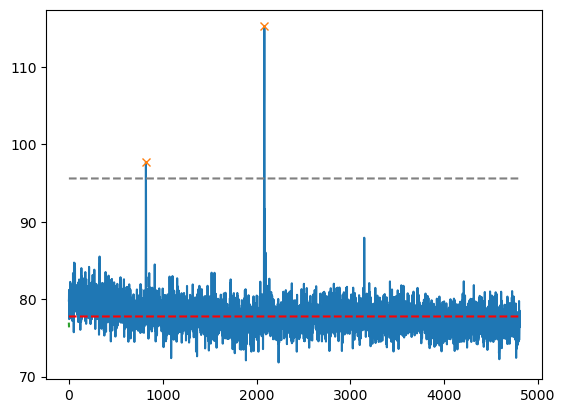

151
the peak time stamps are :[  23  124  202  234  700  779  820  851  876  920  960 1027 1087 1959
 2197 2227 2354 2400 3148 3405 3701 3772 4018 4040 4389 4562 4597]
the peak returns to baseline at frame: [54, 132, 246, 246, 721, 800, 837, 863, 882, 936, 972, 1045, 1097, 1968, 2205, 2235, 2364, 2410, 3157, 3415, 3712, 3784, 4025, 4049, 4404, 4571, 4617]
the decay time in seconds for each peak is: [1.55, 0.4, 2.2, 0.6, 1.05, 1.05, 0.85, 0.6, 0.3, 0.8, 0.6, 0.9, 0.5, 0.45, 0.4, 0.4, 0.5, 0.5, 0.45, 0.5, 0.55, 0.6, 0.35, 0.45, 0.75, 0.45, 1.0]
the amplitude of each peak is: [ 87.673096 192.81915  147.77231   61.58574   94.43115  123.797226
 128.68156   77.10925   87.03023  224.90427  165.59244   58.645737
 162.25156   55.0652   155.11646   73.120926  71.03598   61.027054
  79.06421  105.327835  80.651535 119.259384  94.31691   74.91139
 105.27658  149.5557    57.790604]


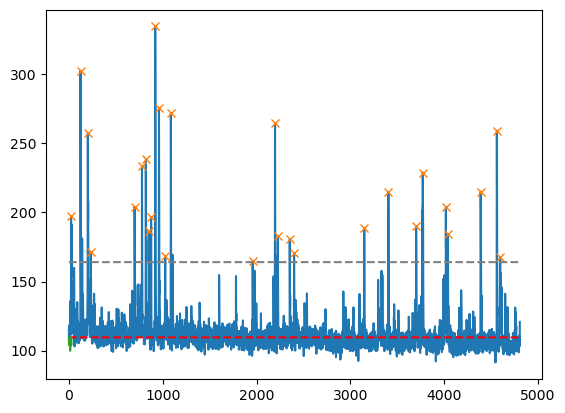

152
the peak time stamps are :[ 465 1161 2519]
the peak returns to baseline at frame: [472, 1177, 2534]
the decay time in seconds for each peak is: [0.35, 0.8, 0.75]
the amplitude of each peak is: [22.396286 36.144684 25.272552]


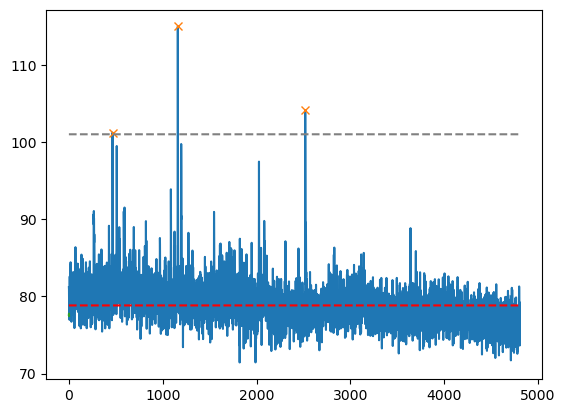

153
the peak time stamps are :[  12  471  502 1319 4680]
the peak returns to baseline at frame: [19, 480, 519, 1330, 4685]
the decay time in seconds for each peak is: [0.35, 0.45, 0.85, 0.55, 0.25]
the amplitude of each peak is: [ 60.1606    61.424988 115.188934  53.496597  53.150726]


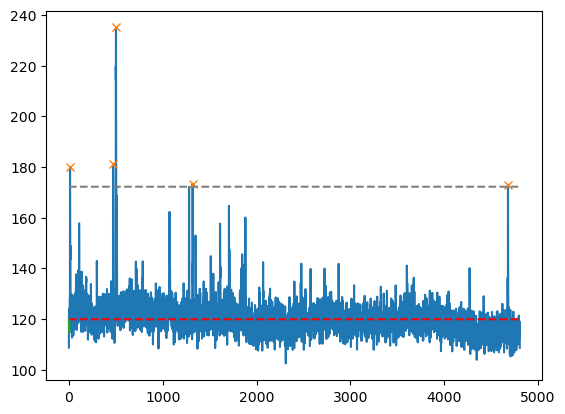

154
the peak time stamps are :[ 391  977 1167 1293 1347 1490 1802 1890 2100 2249 3121 3208 3291 3376
 3445 3554 3576 3791 3888 3937 4160 4221 4325 4754]
the peak returns to baseline at frame: [400, 1029, 1185, 1320, 1370, 1498, 1812, 1895, 2106, 2256, 3137, 3216, 3303, 3386, 3459, 3588, 3588, 3798, 3898, 3948, 4169, 4229, 4336, 4761]
the decay time in seconds for each peak is: [0.45, 2.6, 0.9, 1.35, 1.15, 0.4, 0.5, 0.25, 0.3, 0.35, 0.8, 0.4, 0.6, 0.5, 0.7, 1.7, 0.6, 0.35, 0.5, 0.55, 0.45, 0.4, 0.55, 0.35]
the amplitude of each peak is: [20.934982 40.188324 18.872528 18.670486 60.898117 20.319946 31.247864
 20.259766 17.95552  18.294601 14.944565 37.528137 23.047546 15.950226
 26.880753 58.773636 22.327423 25.508179 18.177643 38.685562 16.222382
 43.69435  51.652725 27.106842]


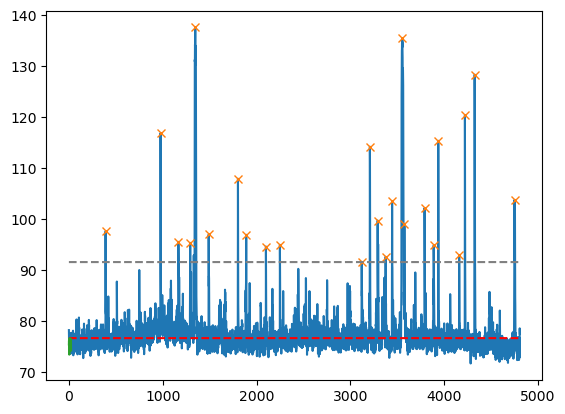

155
the peak time stamps are :[  58  268  339  561 1334 1407]
the peak returns to baseline at frame: [78, 292, 357, 570, 1351, 1412]
the decay time in seconds for each peak is: [1.0, 1.2, 0.9, 0.45, 0.85, 0.25]
the amplitude of each peak is: [31.544891 63.371384 48.288116 46.564575 42.893097 32.76506 ]


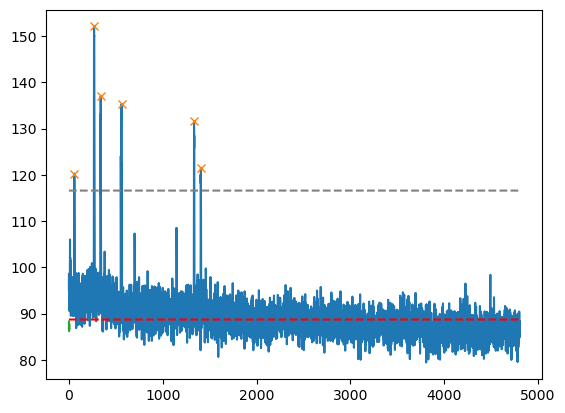

156
the peak time stamps are :[1275]
the peak returns to baseline at frame: [1292]
the decay time in seconds for each peak is: [0.85]
the amplitude of each peak is: [69.504456]


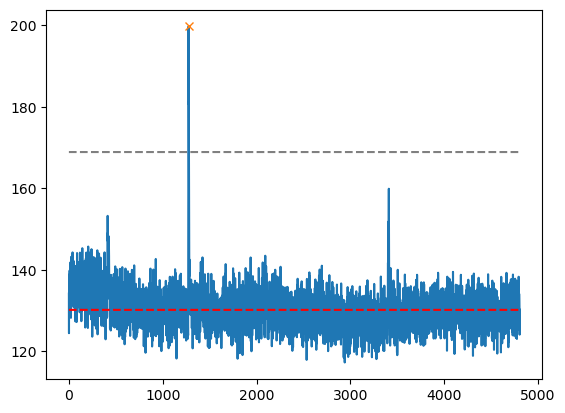

157
the peak time stamps are :[ 158 3801]
the peak returns to baseline at frame: [174, 3809]
the decay time in seconds for each peak is: [0.8, 0.4]
the amplitude of each peak is: [39.342957 59.695297]


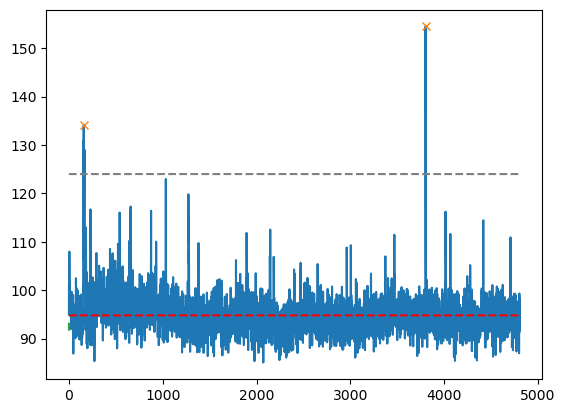

158
the peak time stamps are :[3290]
the peak returns to baseline at frame: [3299]
the decay time in seconds for each peak is: [0.45]
the amplitude of each peak is: [70.017365]


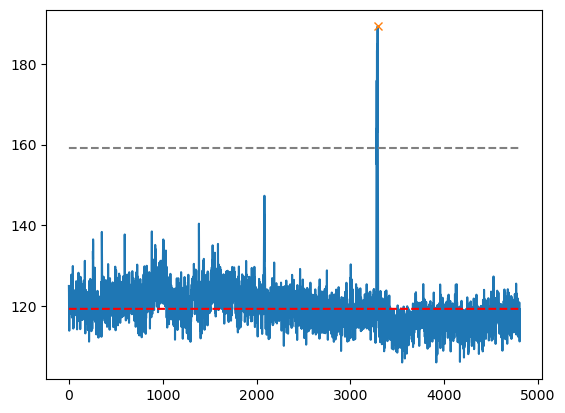

159
the peak time stamps are :[2082]
the peak returns to baseline at frame: [2111]
the decay time in seconds for each peak is: [1.45]
the amplitude of each peak is: [41.110962]


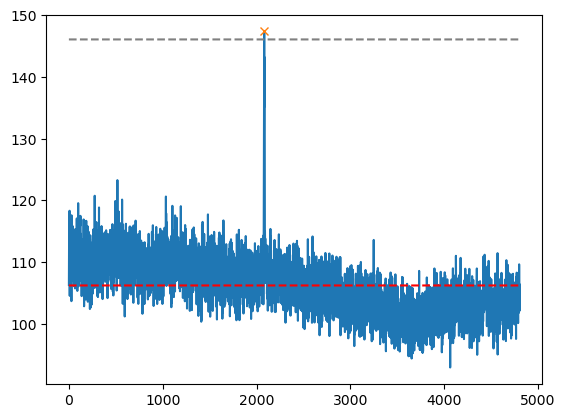

160
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


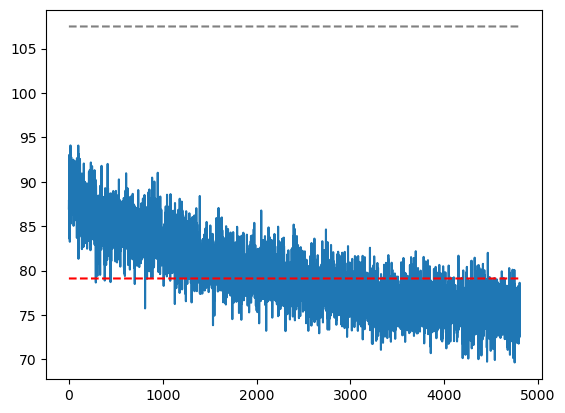

161
the peak time stamps are :[1654 1686 1898 2116 2263]
the peak returns to baseline at frame: [1670, 1701, 1914, 2134, 2270]
the decay time in seconds for each peak is: [0.8, 0.75, 0.8, 0.9, 0.35]
the amplitude of each peak is: [28.807373 34.659363 36.63492  40.952637 30.665878]


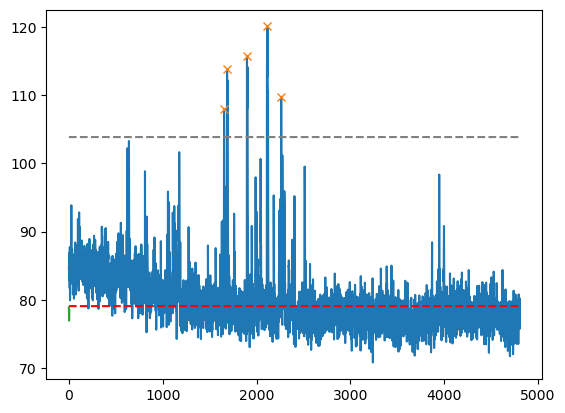

162
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


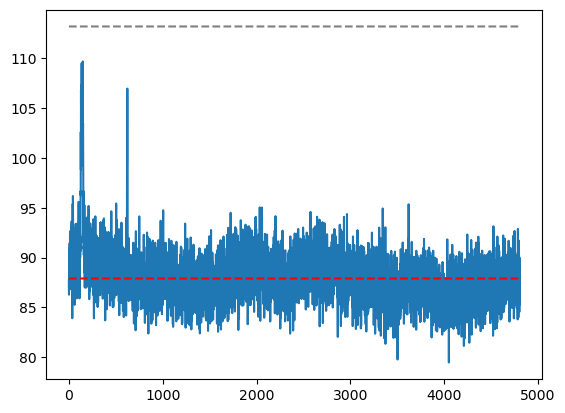

163
the peak time stamps are :[1276]
the peak returns to baseline at frame: [1401]
the decay time in seconds for each peak is: [6.25]
the amplitude of each peak is: [59.44548]


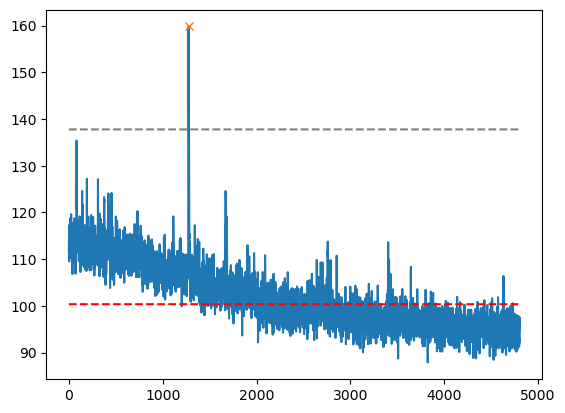

164
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


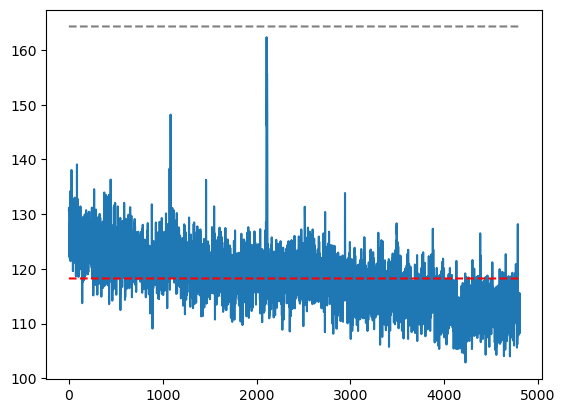

165
the peak time stamps are :[ 650  680 2864]
the peak returns to baseline at frame: [698, 698, 2876]
the decay time in seconds for each peak is: [2.4, 0.9, 0.6]
the amplitude of each peak is: [42.21791  49.290222 25.907349]


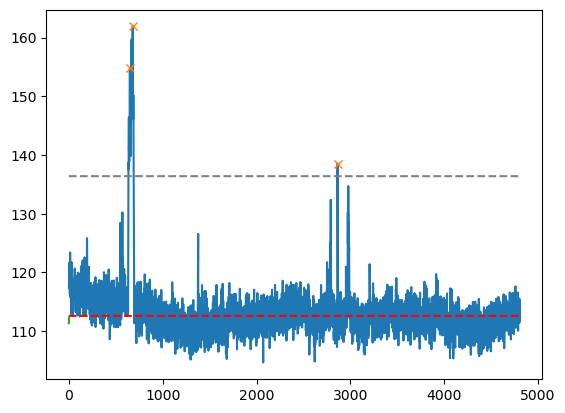

166
the peak time stamps are :[1158]
the peak returns to baseline at frame: [1188]
the decay time in seconds for each peak is: [1.5]
the amplitude of each peak is: [109.95235]


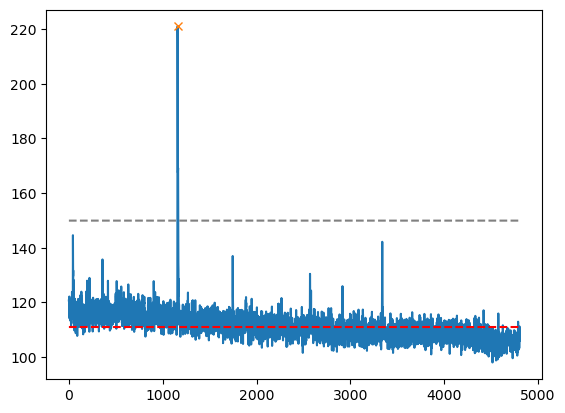

167
the peak time stamps are :[ 998 1974 2316]
the peak returns to baseline at frame: [1024, 1986, 2322]
the decay time in seconds for each peak is: [1.3, 0.6, 0.3]
the amplitude of each peak is: [66.115005 46.794067 33.062897]


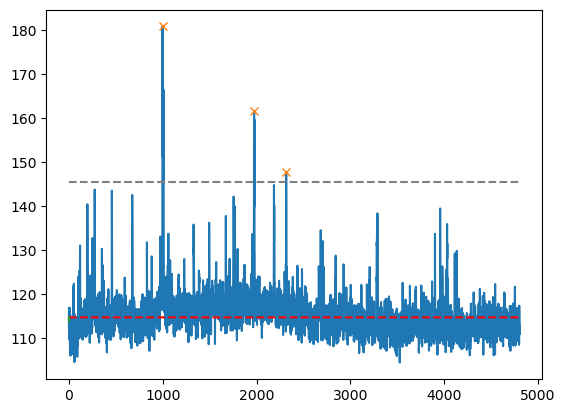

168
the peak time stamps are :[4259 4293 4328 4352 4387]
the peak returns to baseline at frame: [4512, 4512, 4512, 4512, 4512]
the decay time in seconds for each peak is: [12.65, 10.95, 9.2, 8.0, 6.25]
the amplitude of each peak is: [78.21048  65.15025  84.40335  25.515762 57.928024]


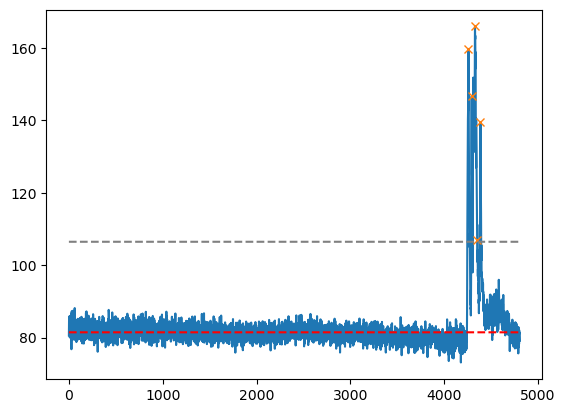

169
the peak time stamps are :[ 242  484  572  947 1015 1553 1889 2841 4190]
the peak returns to baseline at frame: [264, 491, 593, 961, 1021, 1567, 1908, 2865, 4200]
the decay time in seconds for each peak is: [1.1, 0.35, 1.05, 0.7, 0.3, 0.7, 0.95, 1.2, 0.5]
the amplitude of each peak is: [128.82774   28.329453 129.39256  125.94505   29.696243  92.30986
 141.91089   78.09657   29.613556]


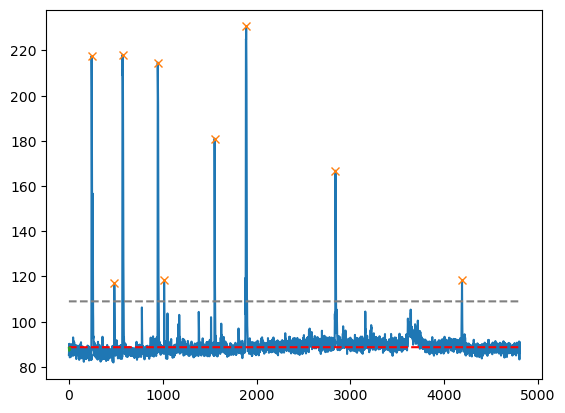

170
the peak time stamps are :[3613 3634 3655 3691 3723 3748]
the peak returns to baseline at frame: [3777, 3777, 3777, 3777, 3777, 3777]
the decay time in seconds for each peak is: [8.2, 7.15, 6.1, 4.3, 2.7, 1.45]
the amplitude of each peak is: [45.99463  34.98877  38.799484 38.621704 23.605408 22.568008]


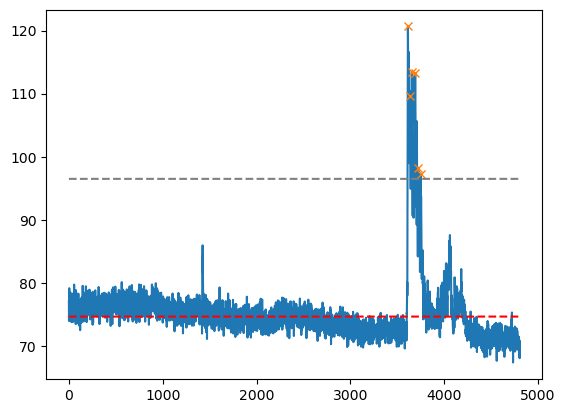

171
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


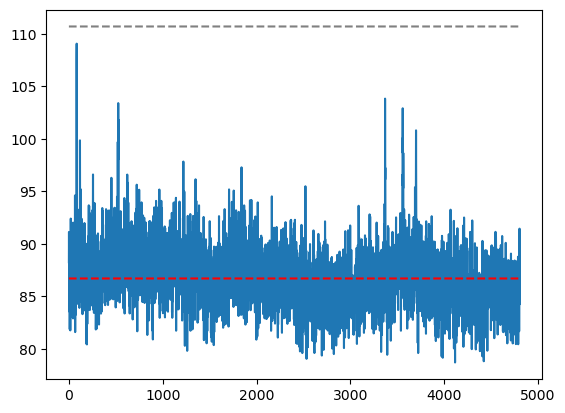

172
the peak time stamps are :[ 828 1091 1417]
the peak returns to baseline at frame: [890, 1124, 1463]
the decay time in seconds for each peak is: [3.1, 1.65, 2.3]
the amplitude of each peak is: [ 66.29544  41.39656 119.01364]


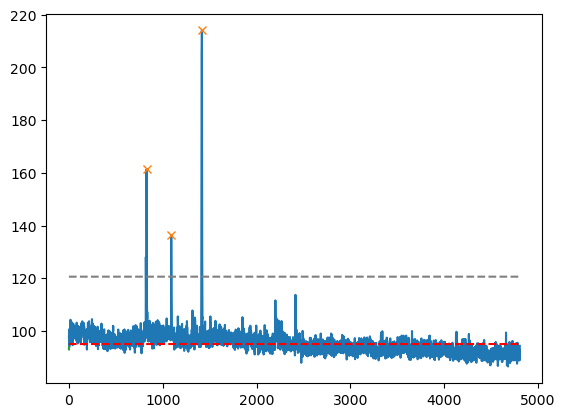

173
the peak time stamps are :[2965 2999 3057 3081 3129]
the peak returns to baseline at frame: [2979, 3034, 3075, 3101, 3140]
the decay time in seconds for each peak is: [0.7, 1.75, 0.9, 1.0, 0.55]
the amplitude of each peak is: [35.183075 51.903885 38.26764  44.294403 48.996933]


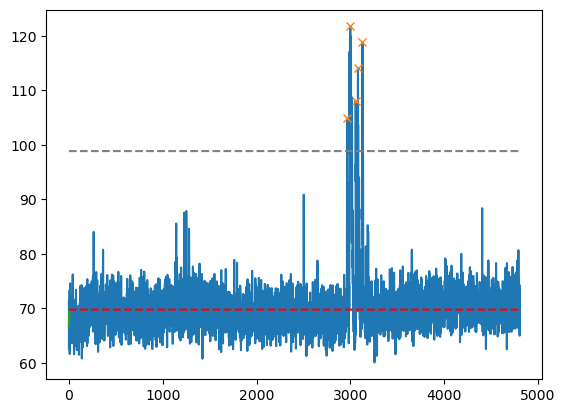

174
the peak time stamps are :[583]
the peak returns to baseline at frame: [771]
the decay time in seconds for each peak is: [9.4]
the amplitude of each peak is: [75.87532]


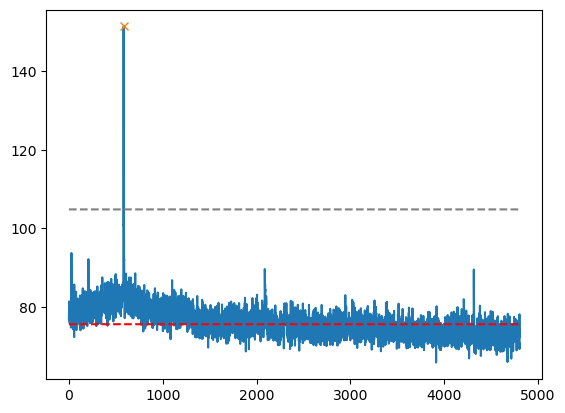

175
the peak time stamps are :[1422]
the peak returns to baseline at frame: [1433]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [44.470444]


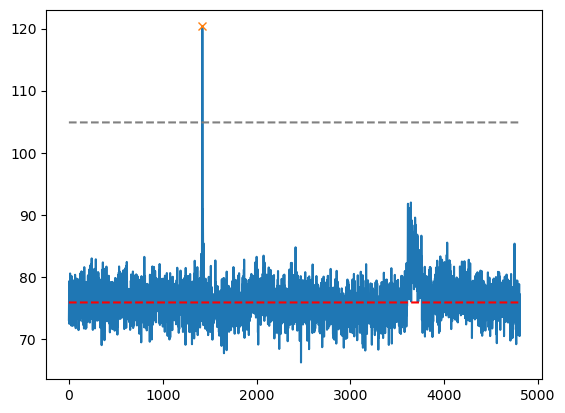

176
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


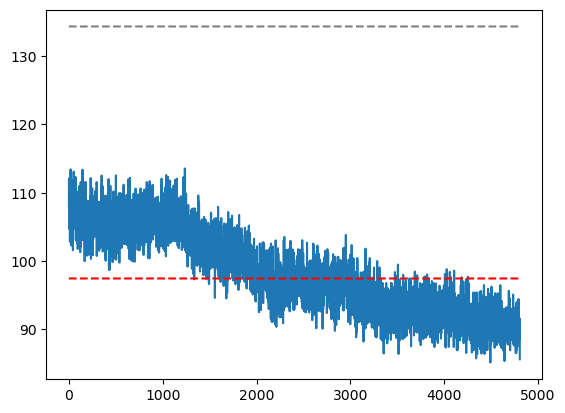

177
the peak time stamps are :[4332 4448 4659 4691]
the peak returns to baseline at frame: [4372, 4467, 4710, 4710]
the decay time in seconds for each peak is: [2.0, 0.95, 2.55, 0.95]
the amplitude of each peak is: [75.9317   52.4153   39.292816 57.036255]


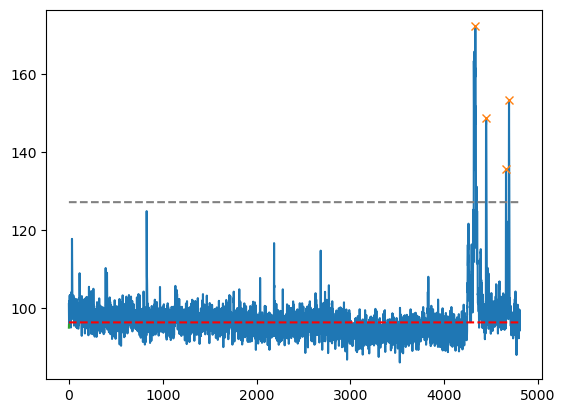

178
the peak time stamps are :[ 823  854  877  929  956  989 1027 1055 1165 1189]
the peak returns to baseline at frame: [1239, 1239, 1239, 1239, 1239, 1239, 1239, 1239, 1239, 1239]
the decay time in seconds for each peak is: [20.8, 19.25, 18.1, 15.5, 14.15, 12.5, 10.6, 9.2, 3.7, 2.5]
the amplitude of each peak is: [39.78691  30.972809 26.58812  33.272858 30.53572  28.244476 27.523544
 24.26892  24.773483 24.851273]


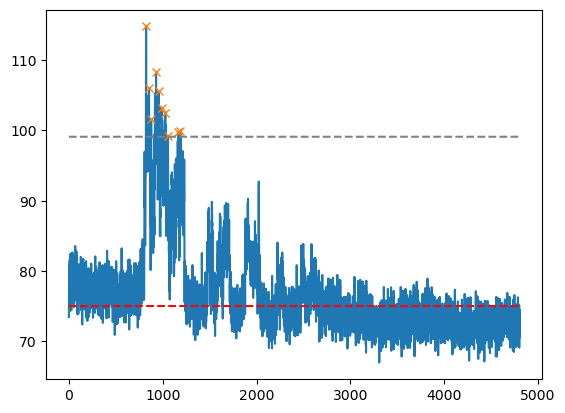

179
the peak time stamps are :[3920]
the peak returns to baseline at frame: [3930]
the decay time in seconds for each peak is: [0.5]
the amplitude of each peak is: [163.2073]


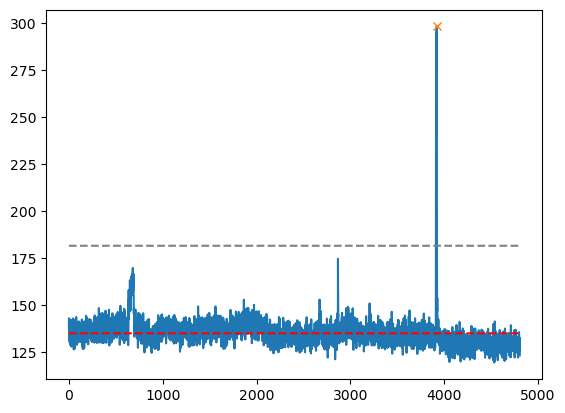

180
the peak time stamps are :[  3  56  92 121 153 244 280 431]
the peak returns to baseline at frame: [1655, 1655, 1655, 1655, 1655, 1655, 1655, 1655]
the decay time in seconds for each peak is: [82.6, 79.95, 78.15, 76.7, 75.1, 70.55, 68.75, 61.2]
the amplitude of each peak is: [47.88713  48.79004  44.70572  43.428177 57.02202  42.9767   43.55748
 42.666946]


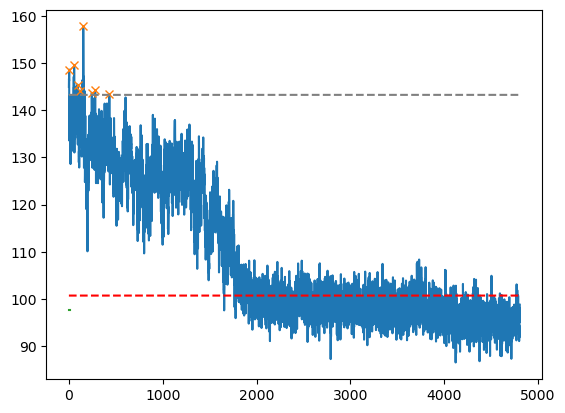

181
the peak time stamps are :[3617 3649 3683 3708 3734 3755 3787 3807 3848 3879 3904 3929 3968 3989
 4030 4052 4073 4110 4149 4177 4202]
the peak returns to baseline at frame: [4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269, 4269]
the decay time in seconds for each peak is: [32.6, 31.0, 29.3, 28.05, 26.75, 25.7, 24.1, 23.1, 21.05, 19.5, 18.25, 17.0, 15.05, 14.0, 11.95, 10.85, 9.8, 7.95, 6.0, 4.6, 3.35]
the amplitude of each peak is: [95.08159  93.34862  86.655426 85.99434  81.77519  76.42389  76.87752
 70.88655  73.65213  70.51247  65.29144  63.35411  54.151733 68.97125
 62.95778  70.725555 64.90431  66.30292  66.732346 72.686844 61.18875 ]


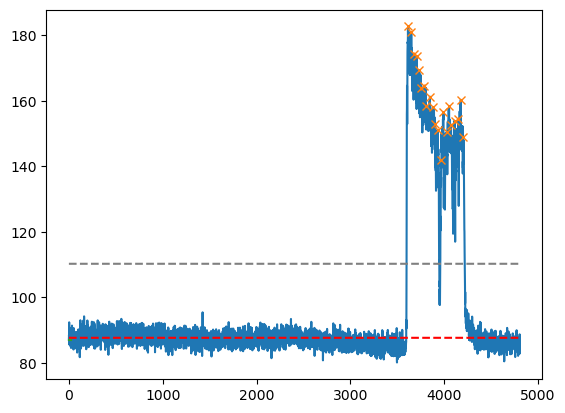

182
the peak time stamps are :[ 576 2606]
the peak returns to baseline at frame: [599, 2625]
the decay time in seconds for each peak is: [1.15, 0.95]
the amplitude of each peak is: [67.40823 45.0679 ]


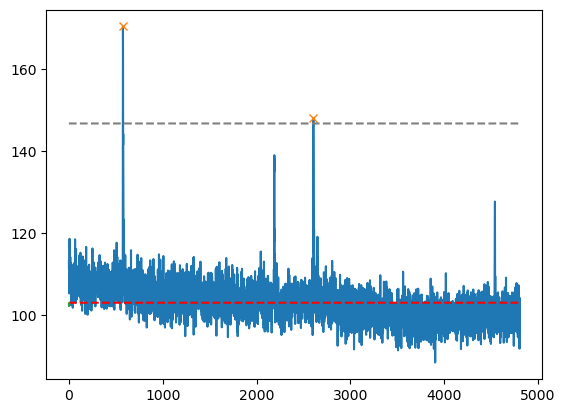

183
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


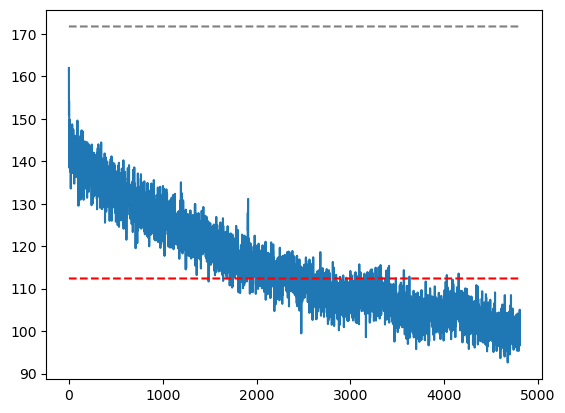

184
the peak time stamps are :[ 4 57]
the peak returns to baseline at frame: [275, 275]
the decay time in seconds for each peak is: [13.55, 10.9]
the amplitude of each peak is: [42.13408  35.873978]


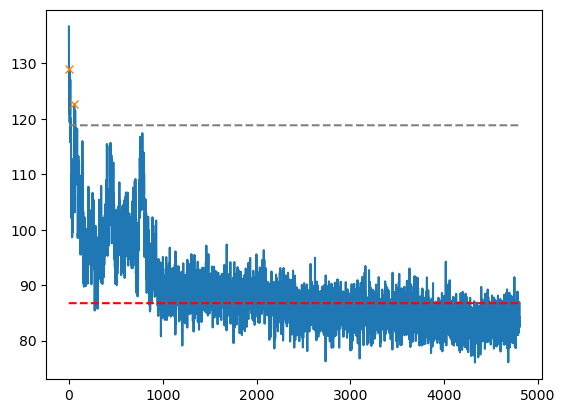

185
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


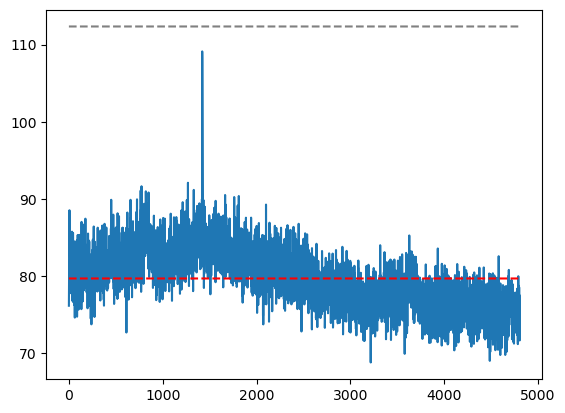

186
the peak time stamps are :[ 500 2255]
the peak returns to baseline at frame: [572, 2264]
the decay time in seconds for each peak is: [3.6, 0.45]
the amplitude of each peak is: [59.627792 71.2095  ]


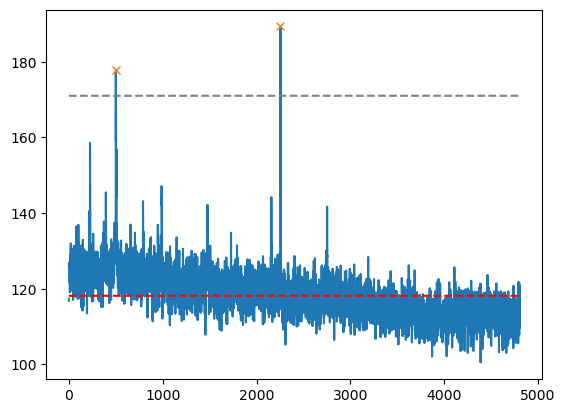

187
the peak time stamps are :[ 906 4795]
the peak returns to baseline at frame: [928, 4805]
the decay time in seconds for each peak is: [1.1, 0.5]
the amplitude of each peak is: [106.98891  33.78752]


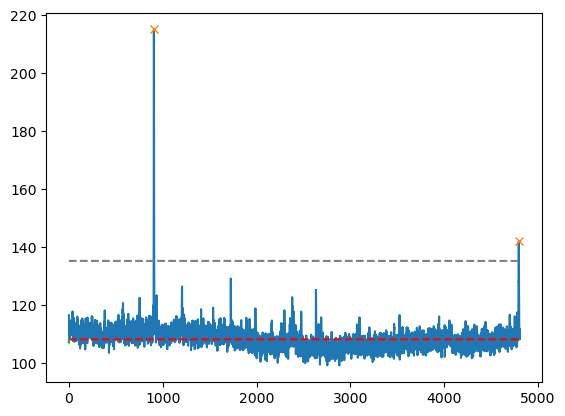

188
the peak time stamps are :[1131 1159]
the peak returns to baseline at frame: [1183, 1183]
the decay time in seconds for each peak is: [2.6, 1.2]
the amplitude of each peak is: [49.067398 44.603607]


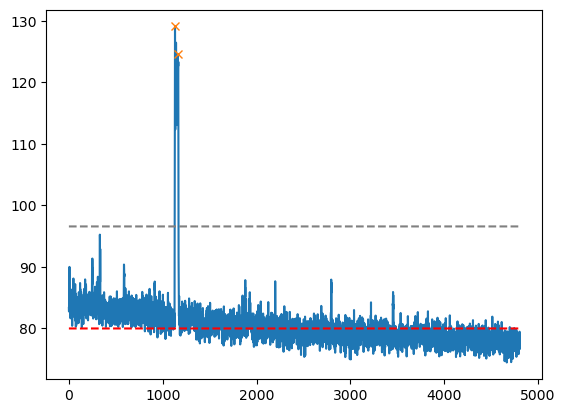

189
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


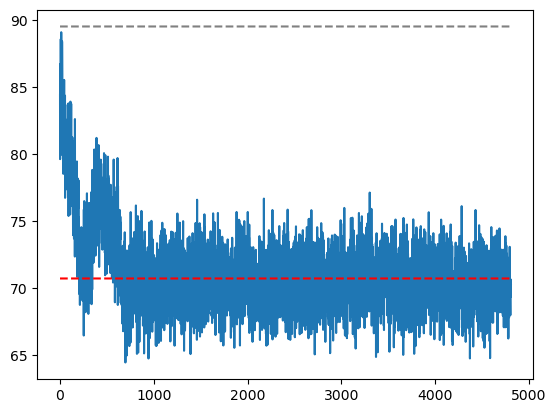

190
the peak time stamps are :[2258 2387 3390 3470 3510 3996]
the peak returns to baseline at frame: [2270, 2406, 3407, 3474, 3520, 4012]
the decay time in seconds for each peak is: [0.6, 0.95, 0.85, 0.2, 0.5, 0.8]
the amplitude of each peak is: [24.025284 61.04677  71.78966  28.353134 37.200485 64.36359 ]


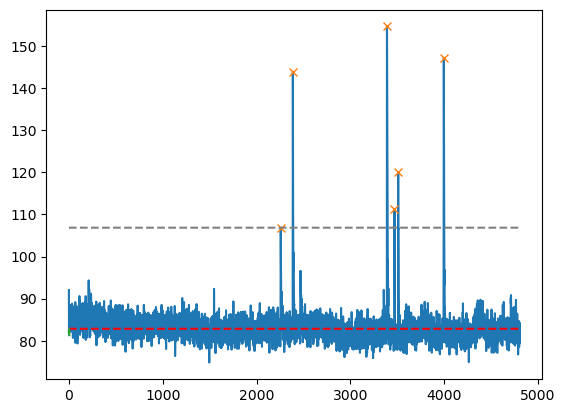

191
the peak time stamps are :[ 246  665 1979 2052 2301 2847 2926 2995 3805]
the peak returns to baseline at frame: [273, 725, 1984, 2065, 2309, 2862, 2936, 3015, 3818]
the decay time in seconds for each peak is: [1.35, 3.0, 0.25, 0.65, 0.4, 0.75, 0.5, 1.0, 0.65]
the amplitude of each peak is: [47.489    49.284576 34.662186 38.74904  36.8078   34.12825  34.619858
 33.016647 35.99736 ]


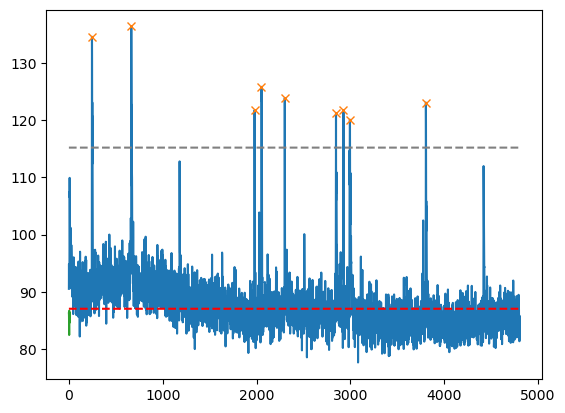

192
the peak time stamps are :[ 554  706 1202 1608 1796 2993 3205 3802 4443 4793]
the peak returns to baseline at frame: [558, 726, 1214, 1622, 1803, 3008, 3229, 3813, 4456, 4801]
the decay time in seconds for each peak is: [0.2, 1.0, 0.6, 0.7, 0.35, 0.75, 1.2, 0.55, 0.65, 0.4]
the amplitude of each peak is: [ 44.827423  39.564316 214.7333   121.94173  126.81802   37.473007
 101.89868  203.46326   62.753036  38.078995]


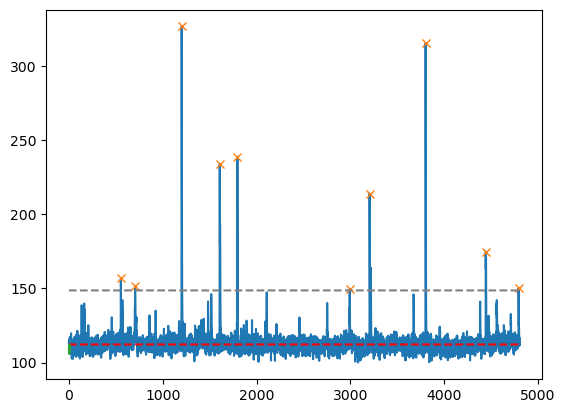

193
the peak time stamps are :[736]
the peak returns to baseline at frame: [892]
the decay time in seconds for each peak is: [7.8]
the amplitude of each peak is: [50.03859]


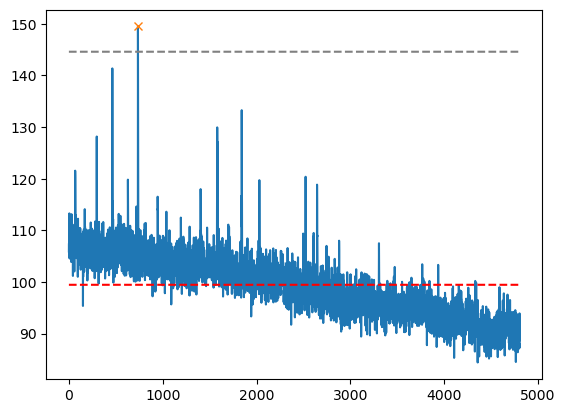

194
the peak time stamps are :[ 167 1382]
the peak returns to baseline at frame: [299, 1398]
the decay time in seconds for each peak is: [6.6, 0.8]
the amplitude of each peak is: [96.90785  82.168945]


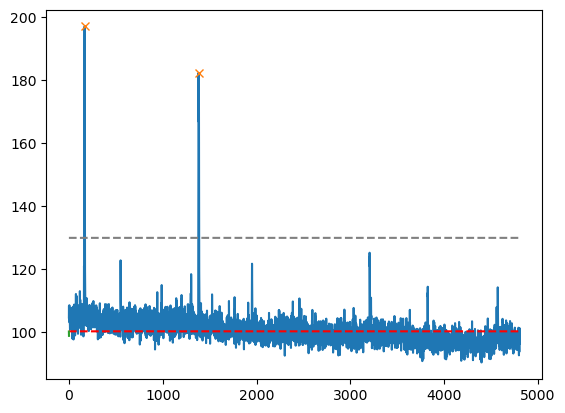

195
the peak time stamps are :[  88  321 3902 4213]
the peak returns to baseline at frame: [137, 331, 3913, 4223]
the decay time in seconds for each peak is: [2.45, 0.5, 0.55, 0.5]
the amplitude of each peak is: [193.57588   42.516434  51.60916   68.81058 ]


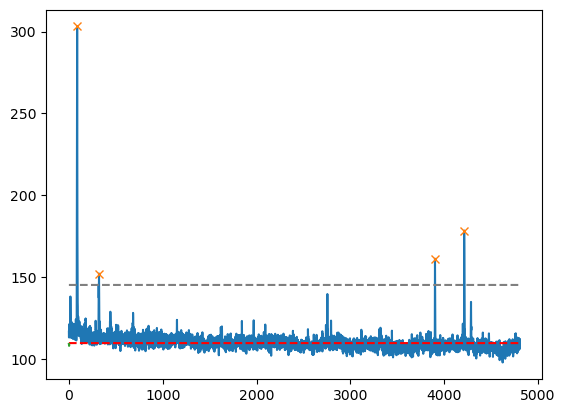

196
the peak time stamps are :[2484 2522]
the peak returns to baseline at frame: [2533, 2533]
the decay time in seconds for each peak is: [2.45, 0.55]
the amplitude of each peak is: [28.03923  30.568039]


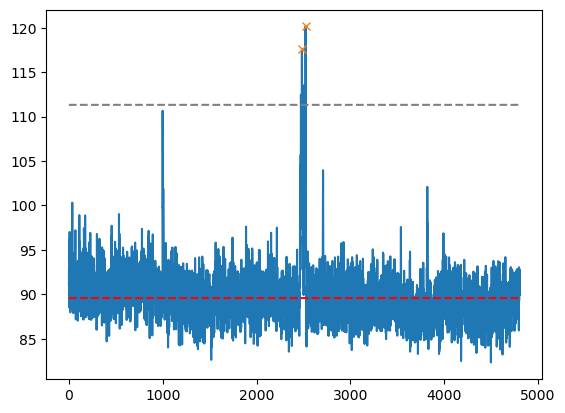

197
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


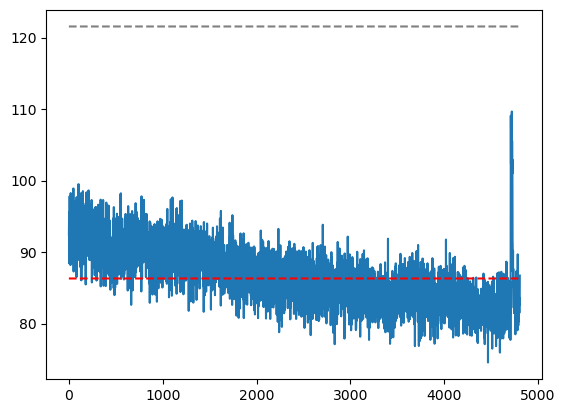

198
the peak time stamps are :[ 243 1102 1807 2597]
the peak returns to baseline at frame: [345, 1129, 1822, 2608]
the decay time in seconds for each peak is: [5.1, 1.35, 0.75, 0.55]
the amplitude of each peak is: [45.025223 62.89984  44.50911  62.642883]


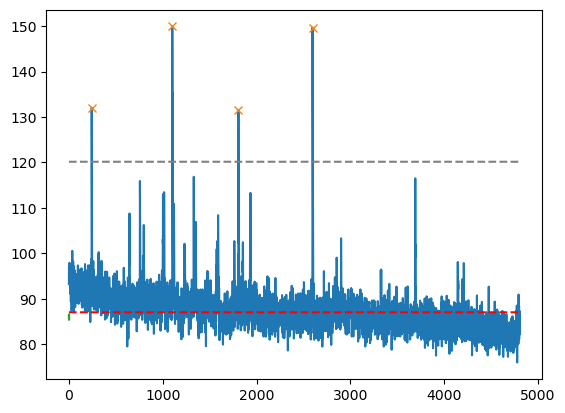

199
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


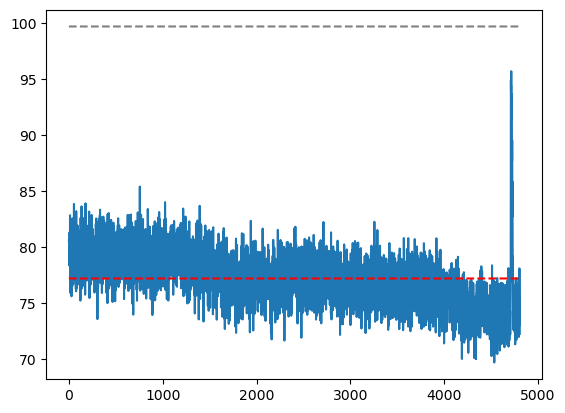

200
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


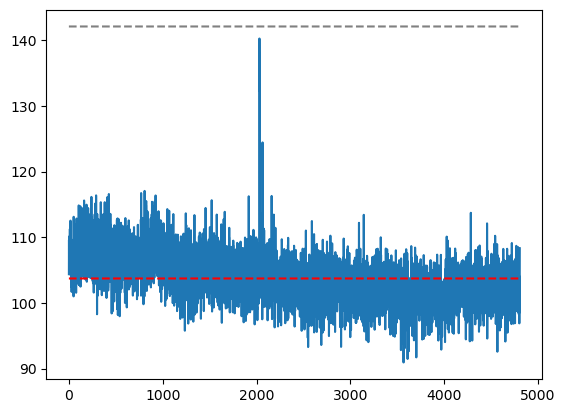

201
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


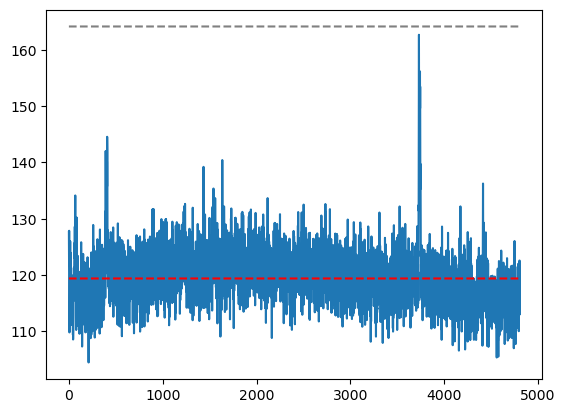

202
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


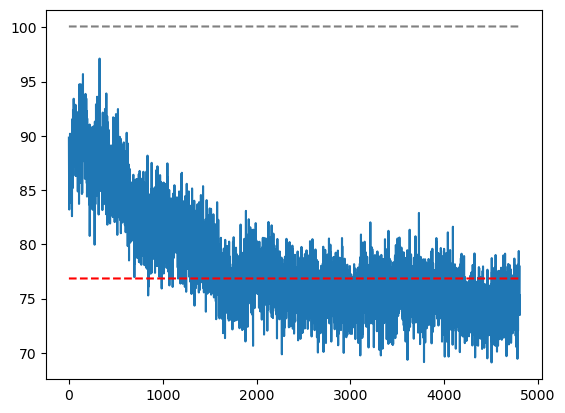

203
the peak time stamps are :[   6  816 1474 1549 1745 1782 1890 1999 2058 2128 2158 2187 2208 2254
 2283 2442 2469 2489 3017 3037 3058 3098 3136 3164 3194 3216 3271 3375
 3694 3714 4346 4573 4703]
the peak returns to baseline at frame: [12, 829, 1479, 1567, 1763, 1803, 1906, 2011, 2081, 2143, 2183, 2195, 2218, 2267, 2315, 2500, 2500, 2500, 3026, 3118, 3118, 3118, 3151, 3169, 3225, 3225, 3293, 3386, 3745, 3745, 4364, 4595, 4713]
the decay time in seconds for each peak is: [0.3, 0.65, 0.25, 0.9, 0.9, 1.05, 0.8, 0.6, 1.15, 0.75, 1.25, 0.4, 0.5, 0.65, 1.6, 2.9, 1.55, 0.55, 0.45, 4.05, 3.0, 1.0, 0.75, 0.25, 1.55, 0.45, 1.1, 0.55, 2.55, 1.55, 0.9, 1.1, 0.5]
the amplitude of each peak is: [ 19.686401 108.852325  20.686813  24.634552  52.47998   87.48976
  54.73845   29.22969   40.747284  56.803345  48.833847  26.360199
  39.877625  30.161118  31.32312   55.915756  33.79883   49.71237
  29.765152  36.07057   65.96805   43.0663    60.336502  24.163757
  66.0732    23.90947   75.9682    40.223

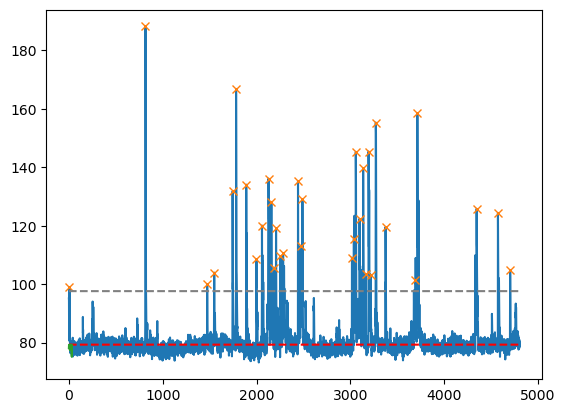

204
the peak time stamps are :[ 135 1710 2311 3900 4030]
the peak returns to baseline at frame: [153, 1719, 2321, 3911, 4037]
the decay time in seconds for each peak is: [0.9, 0.45, 0.5, 0.55, 0.35]
the amplitude of each peak is: [38.188538 28.18866  24.597763 31.05098  32.279587]


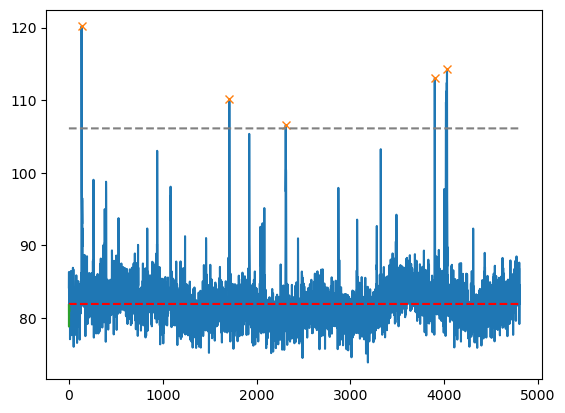

205
the peak time stamps are :[3225]
the peak returns to baseline at frame: [3240]
the decay time in seconds for each peak is: [0.75]
the amplitude of each peak is: [75.15401]


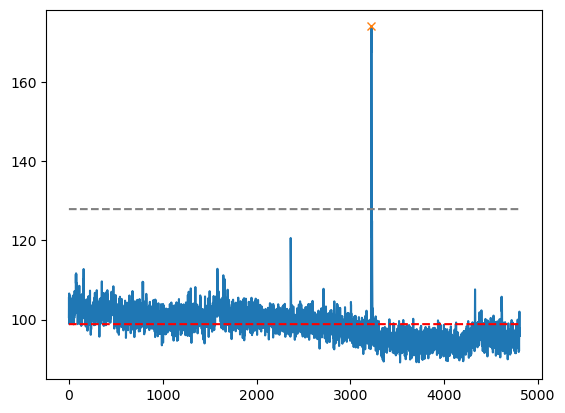

206
the peak time stamps are :[3734]
the peak returns to baseline at frame: [3753]
the decay time in seconds for each peak is: [0.95]
the amplitude of each peak is: [54.92479]


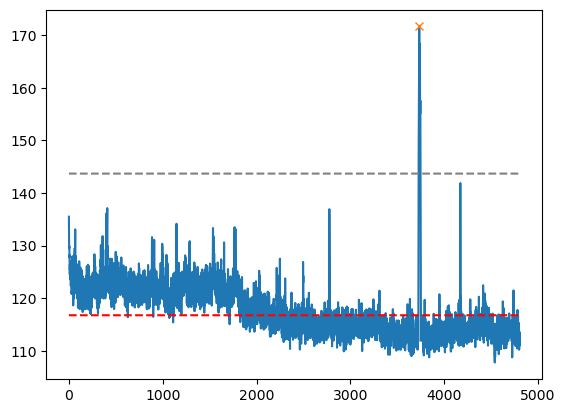

207
the peak time stamps are :[  32 1494 1624 3663 4637]
the peak returns to baseline at frame: [49, 1504, 1638, 3679, 4660]
the decay time in seconds for each peak is: [0.85, 0.5, 0.7, 0.8, 1.15]
the amplitude of each peak is: [39.413116 40.84543  34.24533  25.918182 53.469666]


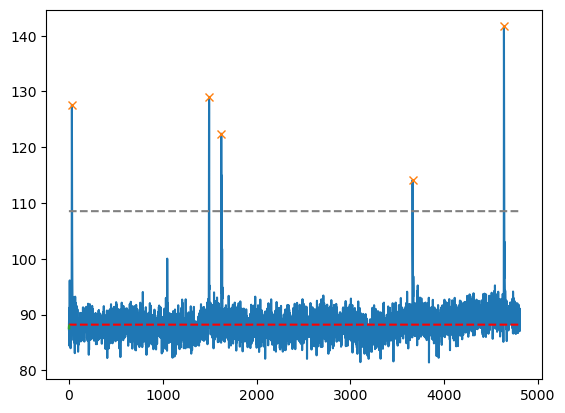

208
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


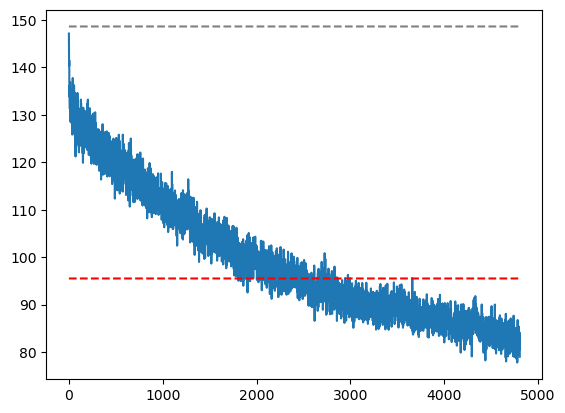

209
the peak time stamps are :[1270 2437 2561 2616 2804]
the peak returns to baseline at frame: [1285, 2446, 2575, 2625, 2811]
the decay time in seconds for each peak is: [0.75, 0.45, 0.7, 0.45, 0.35]
the amplitude of each peak is: [44.016006 53.933334 59.57216  41.040924 46.36293 ]


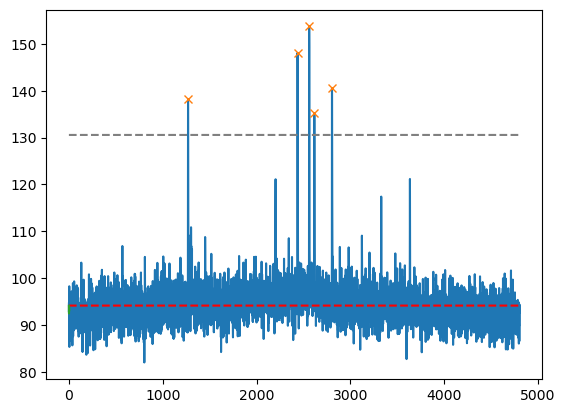

210
the peak time stamps are :[ 854  888  935  967  998 1042]
the peak returns to baseline at frame: [862, 895, 988, 988, 1007, 1047]
the decay time in seconds for each peak is: [0.4, 0.35, 2.65, 1.05, 0.45, 0.25]
the amplitude of each peak is: [53.527985 51.560013 73.23062  58.47058  39.056442 45.93811 ]


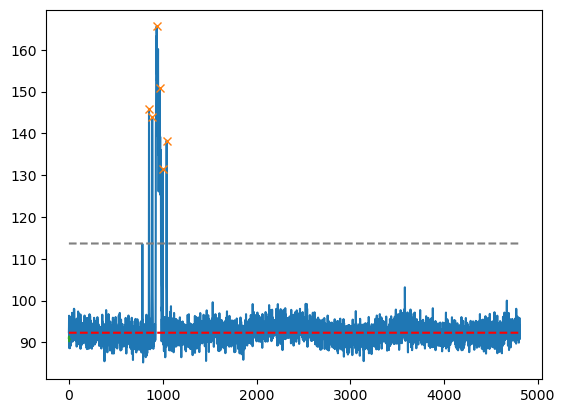

211
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


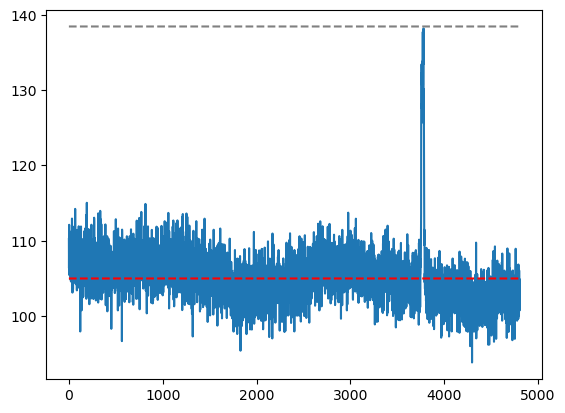

212
the peak time stamps are :[1131 4088]
the peak returns to baseline at frame: [1146, 4099]
the decay time in seconds for each peak is: [0.75, 0.55]
the amplitude of each peak is: [56.284103 52.6521  ]


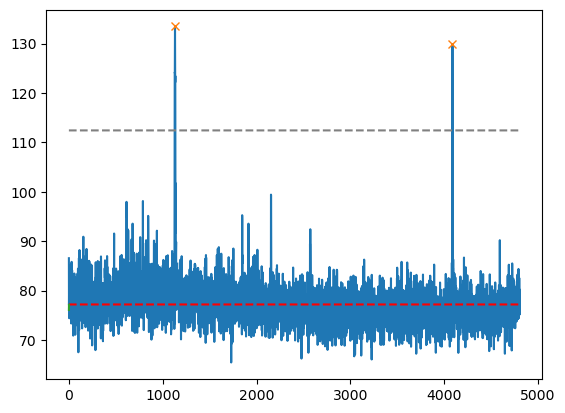

213
the peak time stamps are :[ 328  369  395  499  531  553 1692 4675]
the peak returns to baseline at frame: [336, 378, 406, 572, 572, 572, 1699, 4683]
the decay time in seconds for each peak is: [0.4, 0.45, 0.55, 3.65, 2.05, 0.95, 0.35, 0.4]
the amplitude of each peak is: [21.139313 35.12686  35.45099  47.80052  45.577698 34.48915  21.895615
 27.453842]


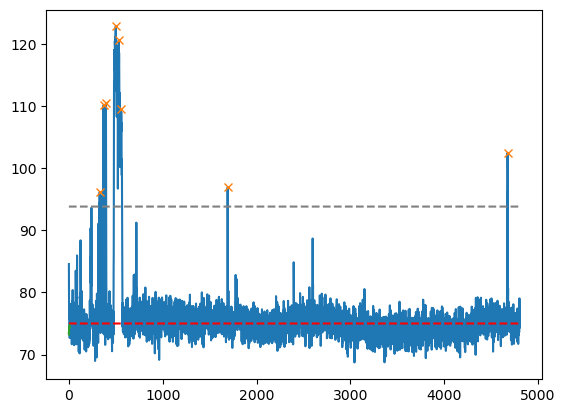

214
the peak time stamps are :[629]
the peak returns to baseline at frame: [640]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [44.74724]


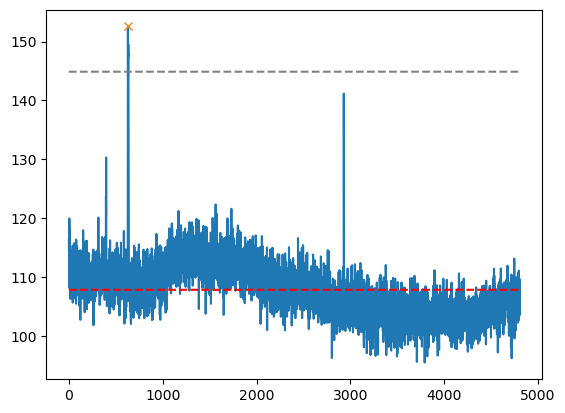

215
the peak time stamps are :[1915 2564]
the peak returns to baseline at frame: [1925, 2585]
the decay time in seconds for each peak is: [0.5, 1.05]
the amplitude of each peak is: [43.7782   32.766235]


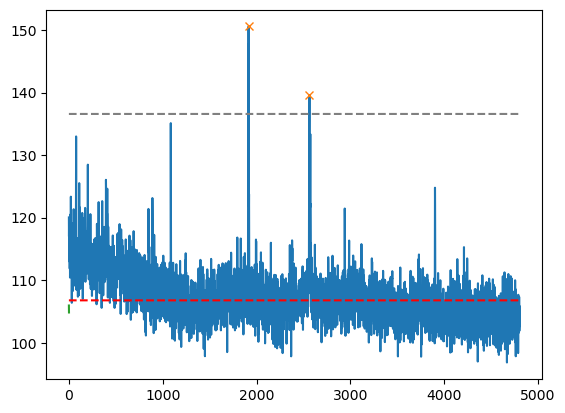

216
the peak time stamps are :[ 385  555 2012 3086 3475 4110]
the peak returns to baseline at frame: [397, 570, 2030, 3101, 3485, 4131]
the decay time in seconds for each peak is: [0.6, 0.75, 0.9, 0.75, 0.5, 1.05]
the amplitude of each peak is: [82.424255 41.43779  94.76149  42.508377 43.23787  51.190796]


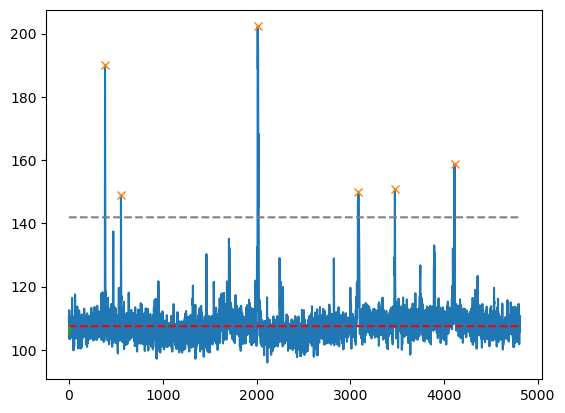

217
the peak time stamps are :[168 231]
the peak returns to baseline at frame: [183, 266]
the decay time in seconds for each peak is: [0.75, 1.75]
the amplitude of each peak is: [ 41.077194 128.45949 ]


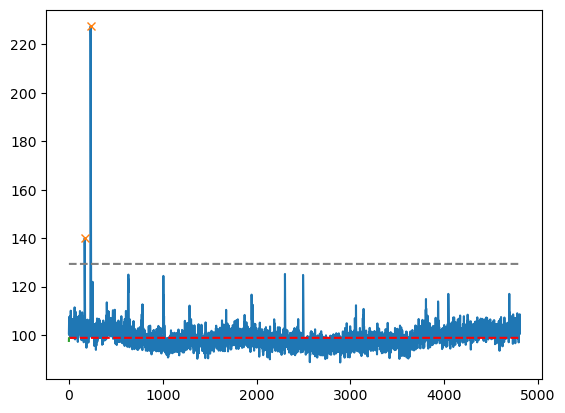

218
the peak time stamps are :[2517]
the peak returns to baseline at frame: [2528]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [54.73642]


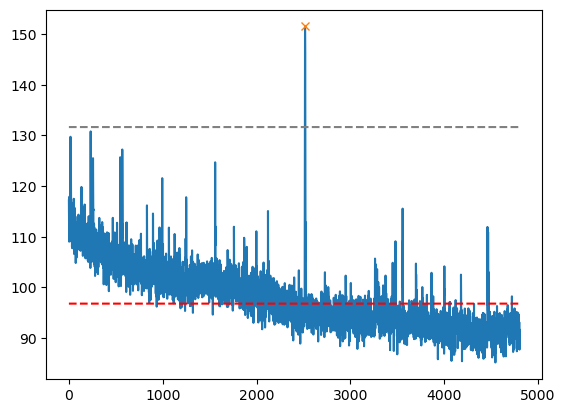

219
the peak time stamps are :[  59 1562 3314]
the peak returns to baseline at frame: [711, 1584, 3340]
the decay time in seconds for each peak is: [32.6, 1.1, 1.3]
the amplitude of each peak is: [19.713943 77.53209  37.4256  ]


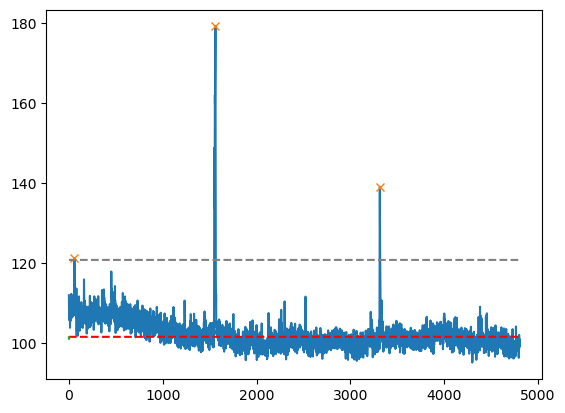

220
the peak time stamps are :[  83  291 1765 1786 2611 4000]
the peak returns to baseline at frame: [390, 390, 1776, 1792, 2627, 4009]
the decay time in seconds for each peak is: [15.35, 4.95, 0.55, 0.3, 0.8, 0.45]
the amplitude of each peak is: [ 35.01071  100.03529   33.022964  44.78499   54.64717   69.26663 ]


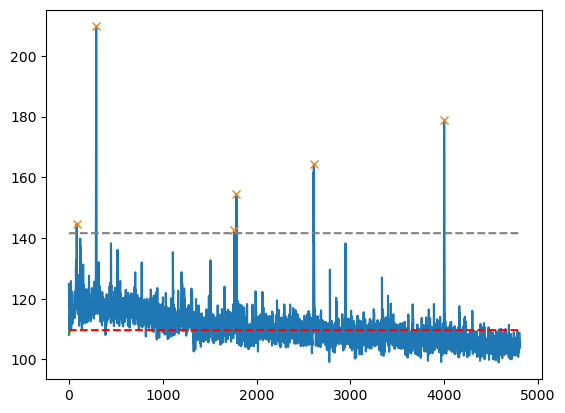

221
the peak time stamps are :[3757 3777]
the peak returns to baseline at frame: [3791, 3791]
the decay time in seconds for each peak is: [1.7, 0.7]
the amplitude of each peak is: [40.777313 40.009842]


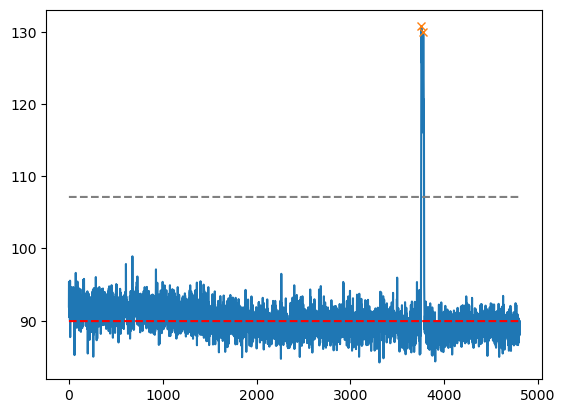

222
the peak time stamps are :[ 785 2551 2960 3282 3547 4377 4651]
the peak returns to baseline at frame: [796, 2571, 2970, 3294, 3590, 4391, 4661]
the decay time in seconds for each peak is: [0.55, 1.0, 0.5, 0.6, 2.15, 0.7, 0.5]
the amplitude of each peak is: [ 54.696823  44.473648  93.25697  105.71599   62.11725  128.11745
  46.474762]


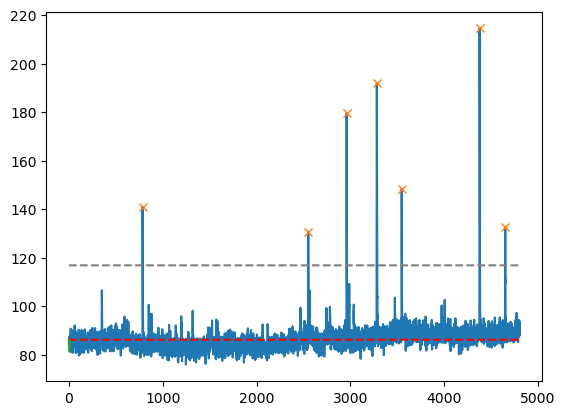

223
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


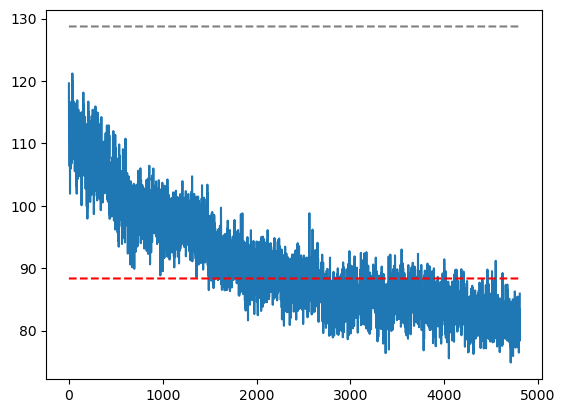

224
the peak time stamps are :[1322 1465 2006 3088 4340]
the peak returns to baseline at frame: [1331, 1472, 2020, 3103, 4347]
the decay time in seconds for each peak is: [0.45, 0.35, 0.7, 0.75, 0.35]
the amplitude of each peak is: [40.06433  53.624985 59.157837 69.06441  45.306854]


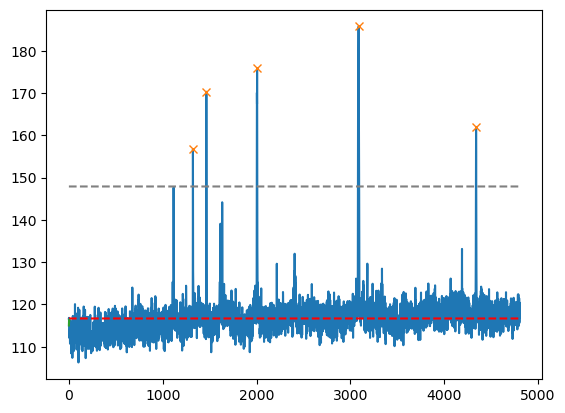

225
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


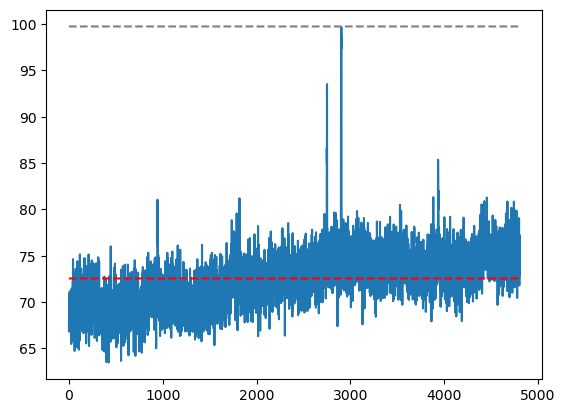

226
the peak time stamps are :[1273 2041]
the peak returns to baseline at frame: [1294, 2048]
the decay time in seconds for each peak is: [1.05, 0.35]
the amplitude of each peak is: [42.95923  38.174606]


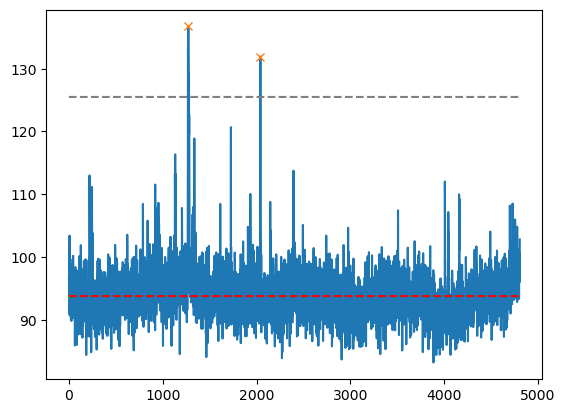

227
the peak time stamps are :[876]
the peak returns to baseline at frame: [884]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [89.487076]


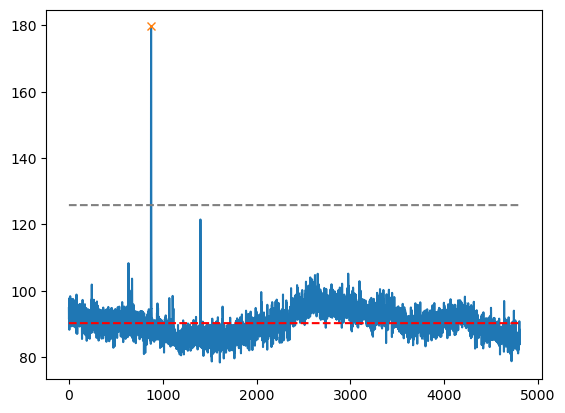

228
the peak time stamps are :[  41  372  597  780  837  937 1053 2149 2235 2655 3190 3289 3996 4691]
the peak returns to baseline at frame: [48, 387, 601, 788, 844, 942, 1058, 2157, 2251, 2664, 3204, 3315, 4012, 4697]
the decay time in seconds for each peak is: [0.35, 0.75, 0.2, 0.4, 0.35, 0.25, 0.25, 0.4, 0.8, 0.45, 0.7, 1.3, 0.8, 0.3]
the amplitude of each peak is: [78.04184  93.054016 38.658936 38.405167 77.03662  64.45993  43.500366
 57.101547 36.690186 42.53409  37.657074 71.00867  79.25838  34.04651 ]


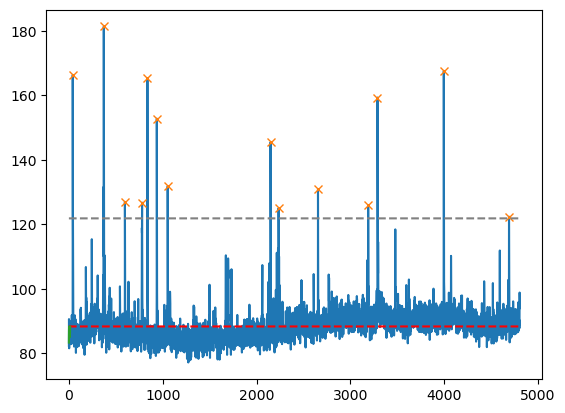

229
the peak time stamps are :[2143 2459 4010 4113]
the peak returns to baseline at frame: [2156, 2475, 4018, 4119]
the decay time in seconds for each peak is: [0.65, 0.8, 0.4, 0.3]
the amplitude of each peak is: [ 95.001755 183.59747   52.10936   55.981964]


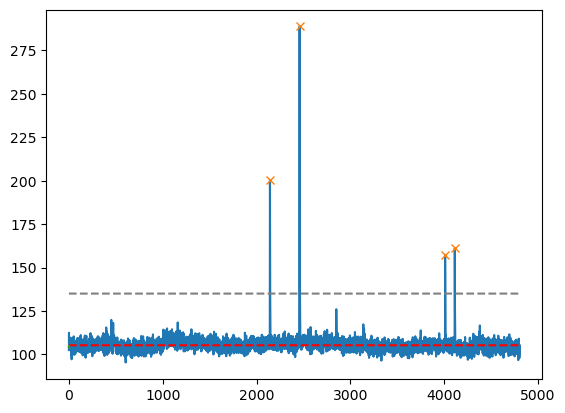

230
the peak time stamps are :[ 602 1013 1719 2925 3069 3496]
the peak returns to baseline at frame: [615, 1020, 1740, 2941, 3087, 3511]
the decay time in seconds for each peak is: [0.65, 0.35, 1.05, 0.8, 0.9, 0.75]
the amplitude of each peak is: [47.01935  49.287216 76.300735 73.65503  38.791702 33.45659 ]


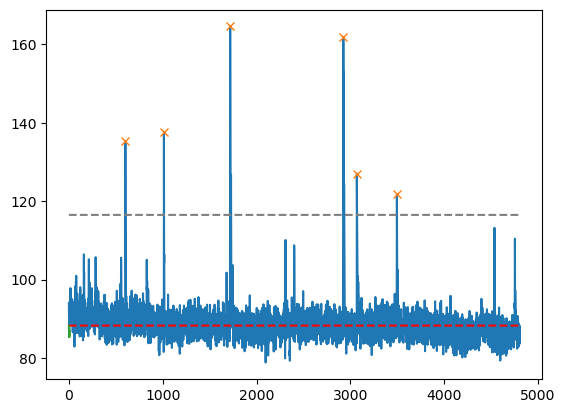

231
the peak time stamps are :[ 452 1561 3314]
the peak returns to baseline at frame: [470, 1579, 3349]
the decay time in seconds for each peak is: [0.9, 0.9, 1.75]
the amplitude of each peak is: [31.794022 66.007645 95.84123 ]


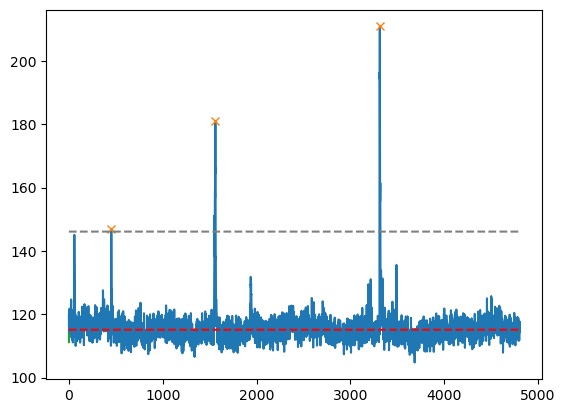

232
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


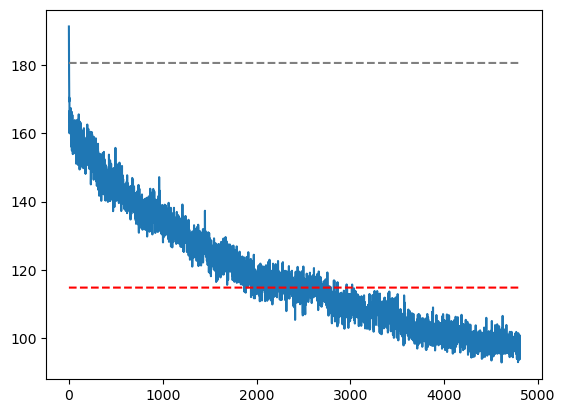

233
the peak time stamps are :[ 361 1072 1364 1795 4706]
the peak returns to baseline at frame: [407, 1113, 1378, 1802, 4713]
the decay time in seconds for each peak is: [2.3, 2.05, 0.7, 0.35, 0.35]
the amplitude of each peak is: [24.98114  45.78607  27.43985  25.158676 35.381943]


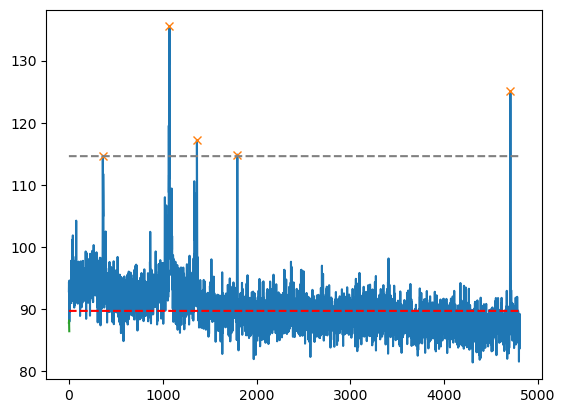

234
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


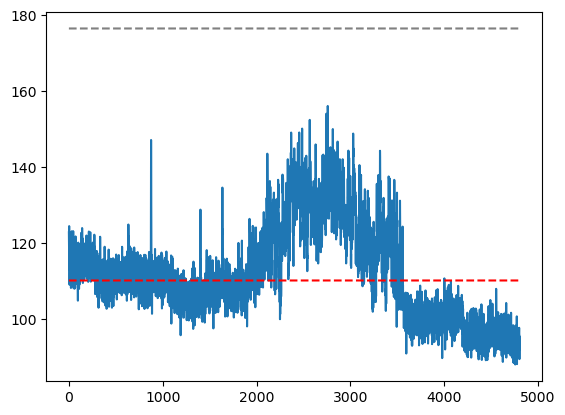

235
the peak time stamps are :[1144]
the peak returns to baseline at frame: [1158]
the decay time in seconds for each peak is: [0.7]
the amplitude of each peak is: [51.056137]


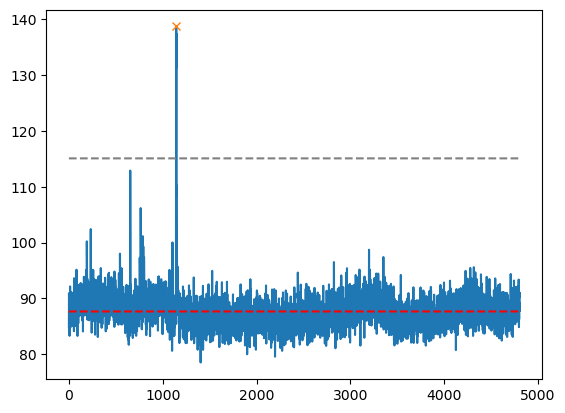

236
the peak time stamps are :[4050]
the peak returns to baseline at frame: [4068]
the decay time in seconds for each peak is: [0.9]
the amplitude of each peak is: [46.151062]


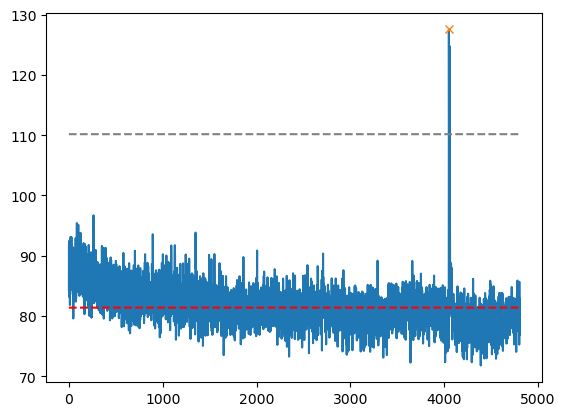

237
the peak time stamps are :[ 239 1845 2322 2449 2716 4285]
the peak returns to baseline at frame: [250, 1854, 2345, 2462, 2726, 4296]
the decay time in seconds for each peak is: [0.55, 0.45, 1.15, 0.65, 0.5, 0.55]
the amplitude of each peak is: [29.831726 39.557907 25.671448 82.4662   36.37317  21.78482 ]


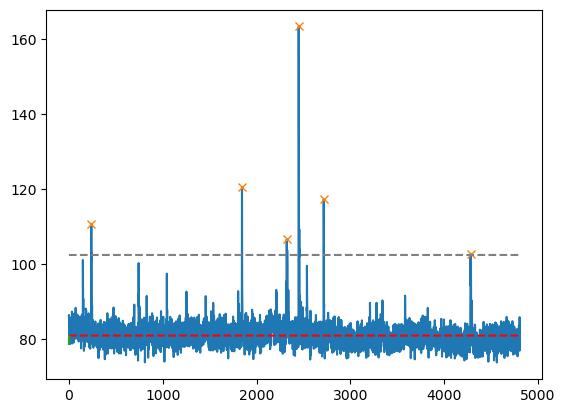

238
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


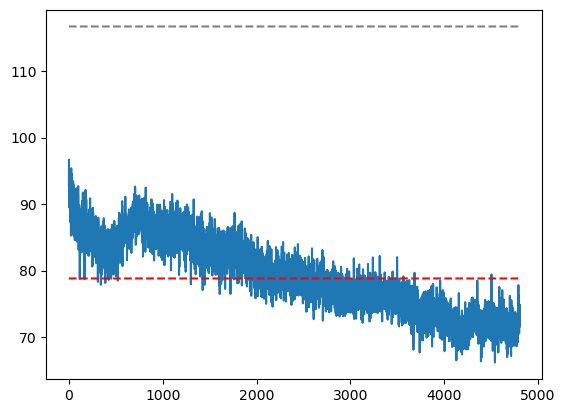

239
the peak time stamps are :[361 437]
the peak returns to baseline at frame: [374, 451]
the decay time in seconds for each peak is: [0.65, 0.7]
the amplitude of each peak is: [63.772842 55.10605 ]


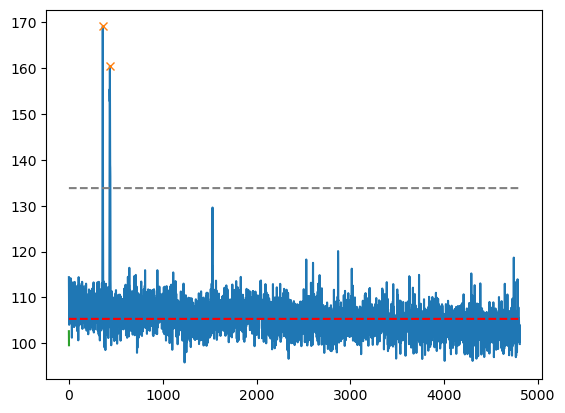

240
the peak time stamps are :[3794]
the peak returns to baseline at frame: [3805]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [46.491257]


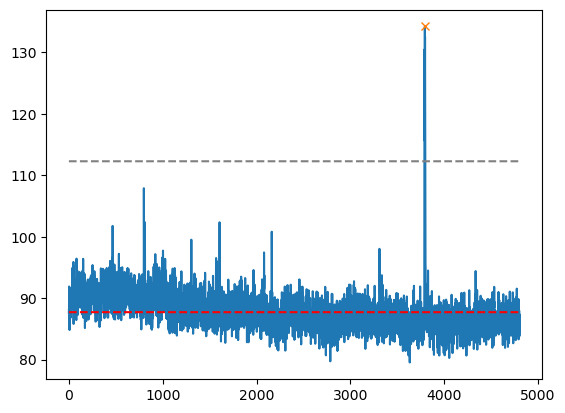

241
the peak time stamps are :[469 536]
the peak returns to baseline at frame: [739, 739]
the decay time in seconds for each peak is: [13.5, 10.15]
the amplitude of each peak is: [87.54341  60.836594]


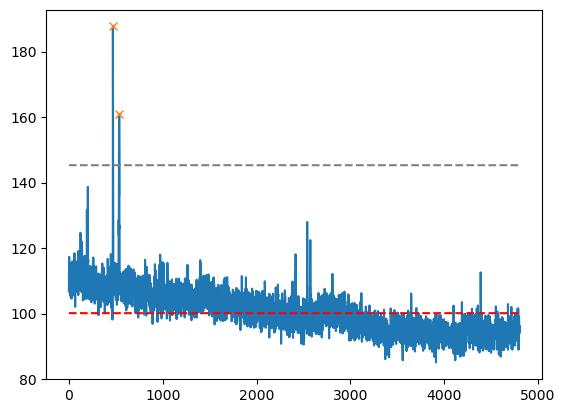

242
the peak time stamps are :[ 112  163  377  611  727 1162 1958 2319 2561 2592 3545 4559]
the peak returns to baseline at frame: [279, 279, 397, 646, 744, 1176, 1980, 2335, 2607, 2607, 3559, 4567]
the decay time in seconds for each peak is: [8.35, 5.8, 1.0, 1.75, 0.85, 0.7, 1.1, 0.8, 2.3, 0.75, 0.7, 0.4]
the amplitude of each peak is: [22.359116 27.016861 30.579834 27.001358 25.538467 24.043182 38.55623
 61.660385 53.45703  22.152405 21.714096 30.647232]


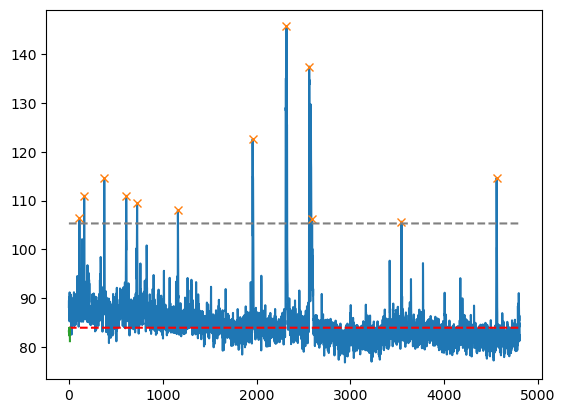

243
the peak time stamps are :[ 431 2497 3509]
the peak returns to baseline at frame: [453, 2503, 3517]
the decay time in seconds for each peak is: [1.1, 0.3, 0.4]
the amplitude of each peak is: [42.158264 42.05876  44.261475]


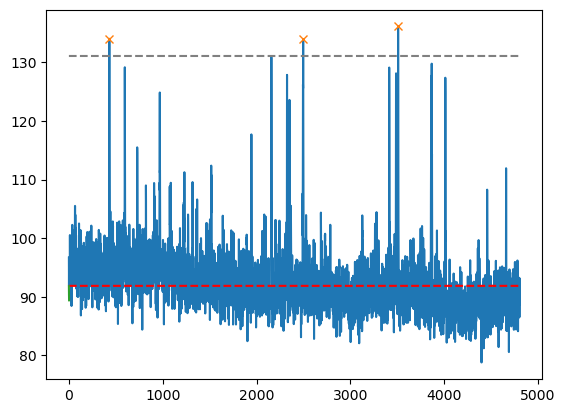

244
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


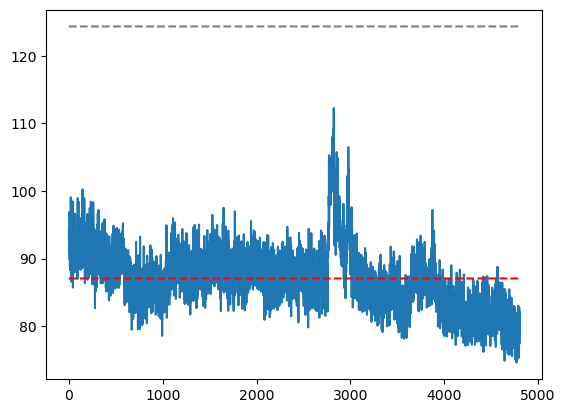

245
the peak time stamps are :[1147]
the peak returns to baseline at frame: [1164]
the decay time in seconds for each peak is: [0.85]
the amplitude of each peak is: [39.3022]


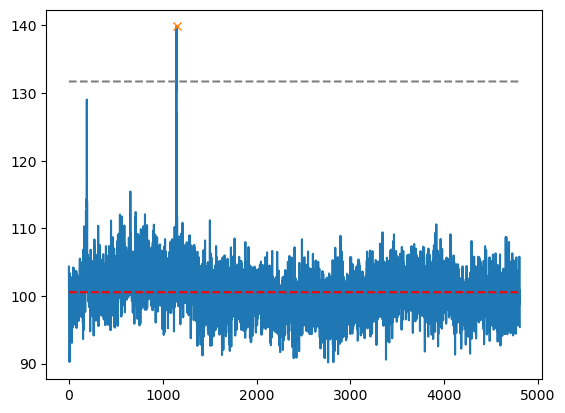

246
the peak time stamps are :[184 449]
the peak returns to baseline at frame: [201, 456]
the decay time in seconds for each peak is: [0.85, 0.35]
the amplitude of each peak is: [63.30043 61.01834]


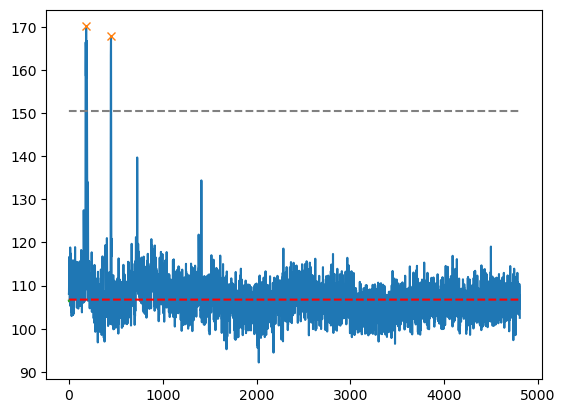

247
the peak time stamps are :[3807]
the peak returns to baseline at frame: [3817]
the decay time in seconds for each peak is: [0.5]
the amplitude of each peak is: [40.752457]


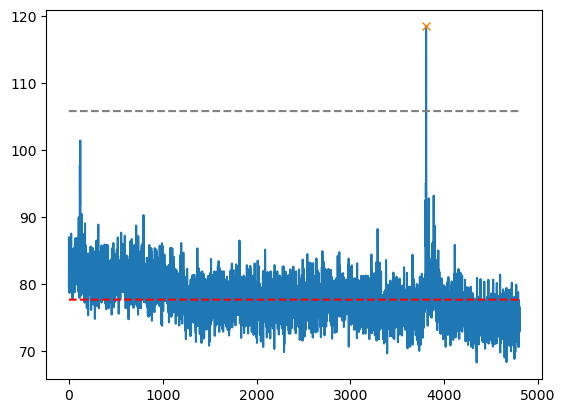

248
the peak time stamps are :[1302]
the peak returns to baseline at frame: [1343]
the decay time in seconds for each peak is: [2.05]
the amplitude of each peak is: [57.933304]


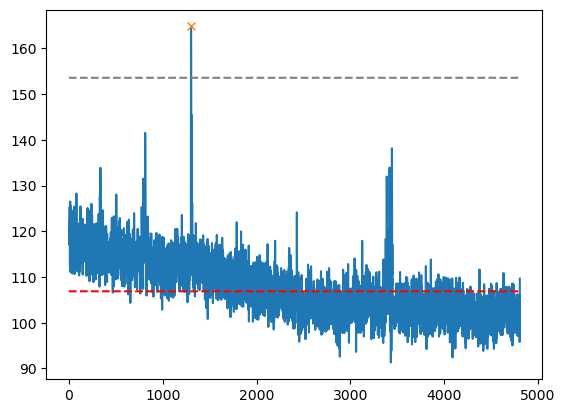

249
the peak time stamps are :[  5 232 753 891]
the peak returns to baseline at frame: [24, 249, 762, 908]
the decay time in seconds for each peak is: [0.95, 0.85, 0.45, 0.85]
the amplitude of each peak is: [62.34102  72.65332  30.037735 33.376694]


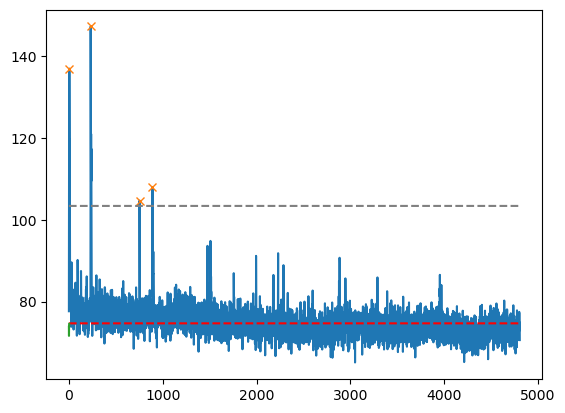

250
the peak time stamps are :[1357 1434]
the peak returns to baseline at frame: [1374, 1449]
the decay time in seconds for each peak is: [0.85, 0.75]
the amplitude of each peak is: [35.80043  38.687317]


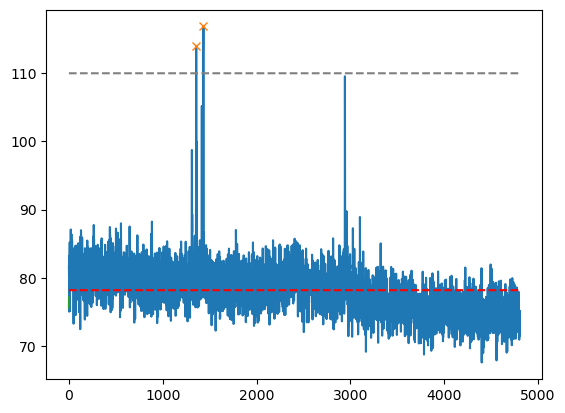

251
the peak time stamps are :[1320]
the peak returns to baseline at frame: [1346]
the decay time in seconds for each peak is: [1.3]
the amplitude of each peak is: [54.348663]


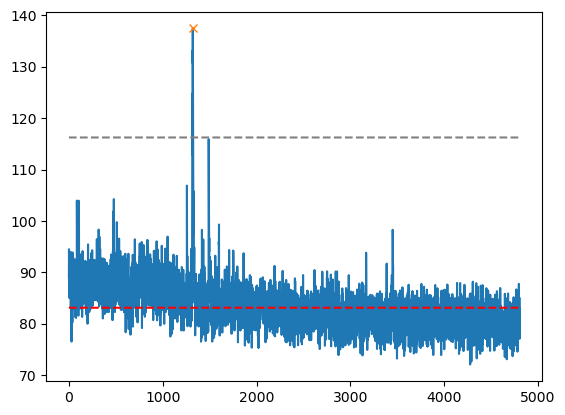

252
the peak time stamps are :[ 637 4658]
the peak returns to baseline at frame: [725, 4668]
the decay time in seconds for each peak is: [4.4, 0.5]
the amplitude of each peak is: [ 99.53584 104.57254]


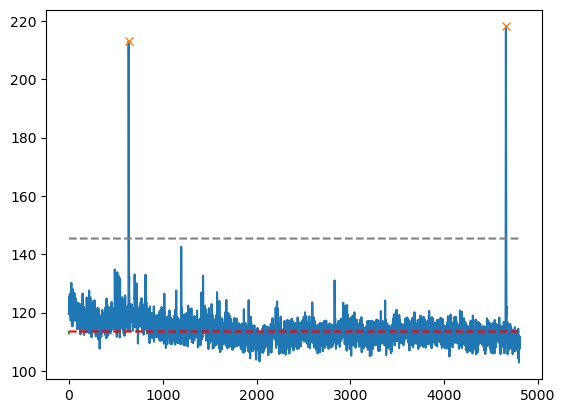

253
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


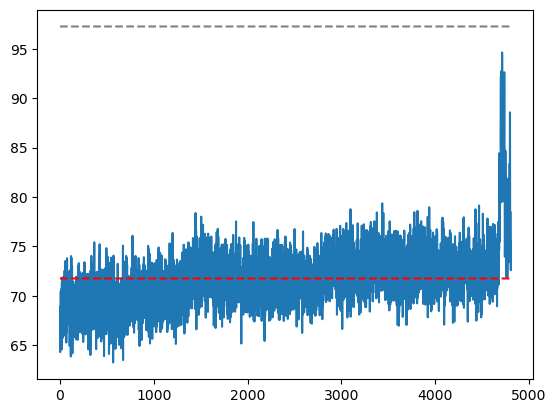

254
the peak time stamps are :[1291]
the peak returns to baseline at frame: [1324]
the decay time in seconds for each peak is: [1.65]
the amplitude of each peak is: [94.25148]


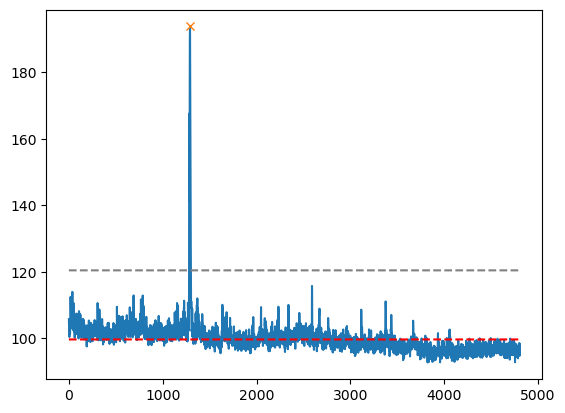

255
the peak time stamps are :[91]
the peak returns to baseline at frame: [457]
the decay time in seconds for each peak is: [18.3]
the amplitude of each peak is: [47.28322]


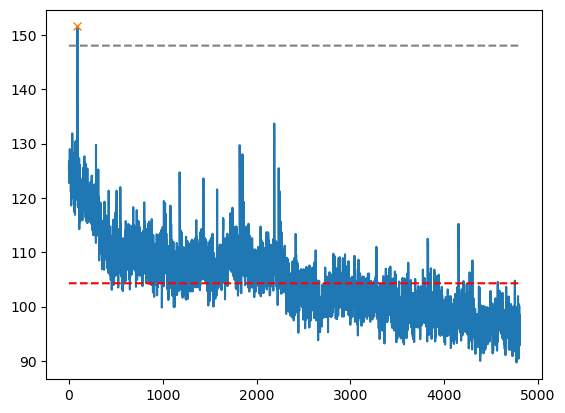

256
the peak time stamps are :[   1   36 3825]
the peak returns to baseline at frame: [7, 43, 3849]
the decay time in seconds for each peak is: [0.3, 0.35, 1.2]
the amplitude of each peak is: [31.282028 28.055649 57.915375]


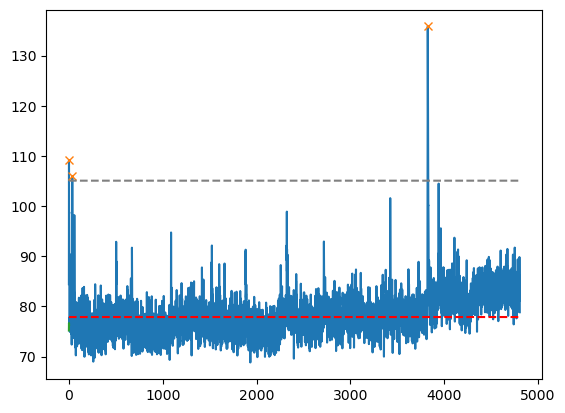

257
the peak time stamps are :[3184]
the peak returns to baseline at frame: [3196]
the decay time in seconds for each peak is: [0.6]
the amplitude of each peak is: [89.80887]


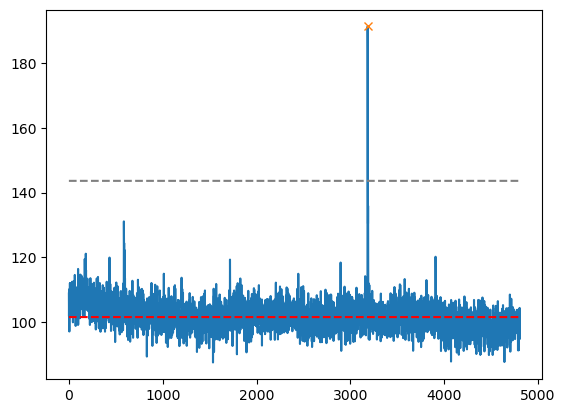

258
the peak time stamps are :[ 406  440  714  984 1323 1930 1971 2196 2966 3009 3112 3320 4227]
the peak returns to baseline at frame: [415, 448, 728, 990, 1352, 1938, 1980, 2209, 2987, 3015, 3120, 3336, 4241]
the decay time in seconds for each peak is: [0.45, 0.4, 0.7, 0.3, 1.45, 0.4, 0.45, 0.65, 1.05, 0.3, 0.4, 0.8, 0.7]
the amplitude of each peak is: [34.68405  23.164795 42.837296 26.70372  84.76965  24.98619  66.70639
 88.04155  57.73198  22.81282  42.07715  54.42462  36.210632]


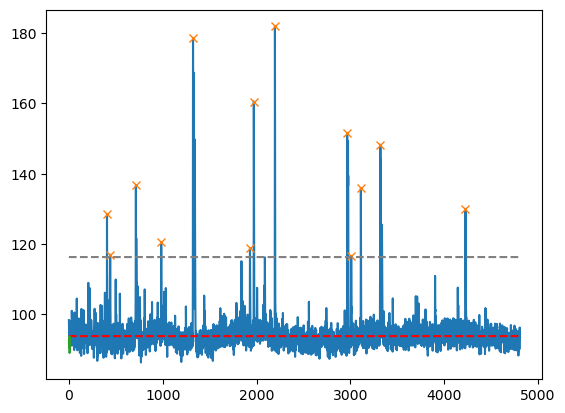

259
the peak time stamps are :[   8  226  284  458  685  752  849 1424 1926 1947 1970 2177 2271 2347
 2427]
the peak returns to baseline at frame: [16, 251, 304, 464, 692, 762, 861, 1429, 1959, 1959, 1977, 2181, 2286, 2358, 2436]
the decay time in seconds for each peak is: [0.4, 1.25, 1.0, 0.3, 0.35, 0.5, 0.6, 0.25, 1.65, 0.6, 0.35, 0.2, 0.75, 0.55, 0.45]
the amplitude of each peak is: [ 51.326538  58.495193  65.64722   50.12175   38.889557  97.245346
  46.558243  39.247192 101.70421   82.374664  70.7876    60.217117
  44.91815   45.04712   55.968445]


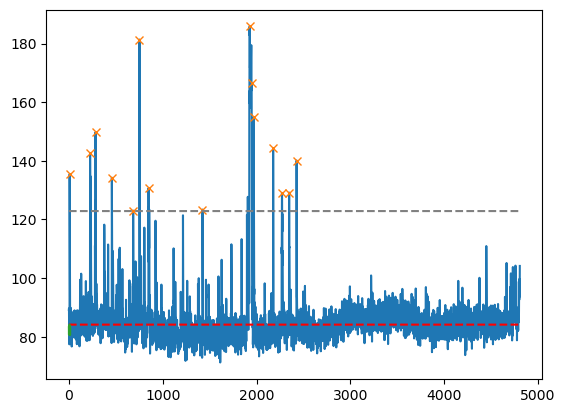

260
the peak time stamps are :[  12 2473]
the peak returns to baseline at frame: [725, 2478]
the decay time in seconds for each peak is: [35.65, 0.25]
the amplitude of each peak is: [32.75534  30.613953]


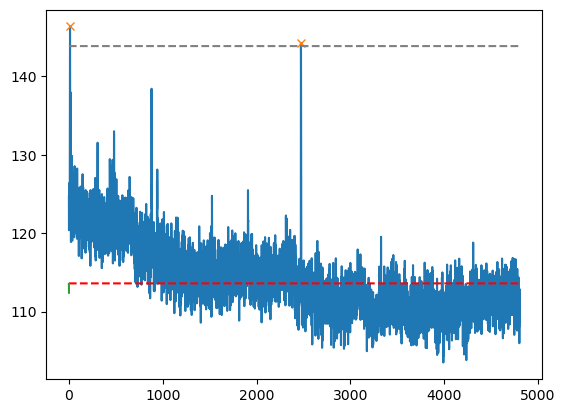

261
the peak time stamps are :[705 813]
the peak returns to baseline at frame: [904, 904]
the decay time in seconds for each peak is: [9.95, 4.55]
the amplitude of each peak is: [45.293274 77.550064]


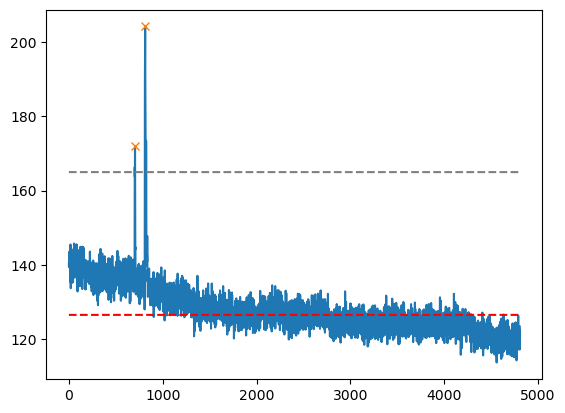

262
the peak time stamps are :[590 616]
the peak returns to baseline at frame: [864, 864]
the decay time in seconds for each peak is: [13.7, 12.4]
the amplitude of each peak is: [38.237305 39.09987 ]


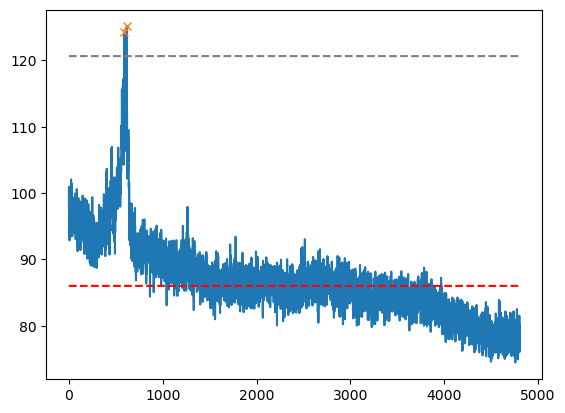

263
the peak time stamps are :[1372 2164 2472 2922 3644 3933]
the peak returns to baseline at frame: [1383, 2178, 2486, 2929, 3675, 3949]
the decay time in seconds for each peak is: [0.55, 0.7, 0.7, 0.35, 1.55, 0.8]
the amplitude of each peak is: [45.923264 46.384445 43.2576   46.640152 56.444427 91.33206 ]


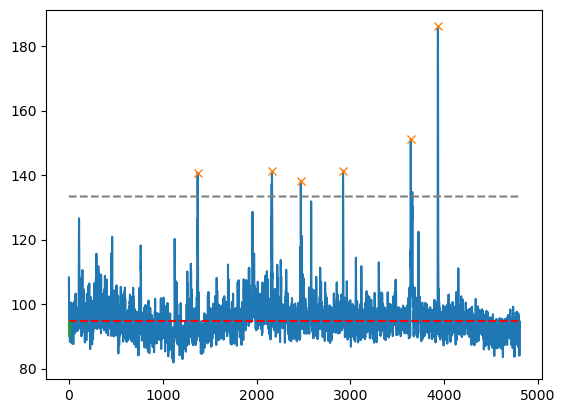

264
the peak time stamps are :[1665 2184 3626]
the peak returns to baseline at frame: [1671, 2195, 3646]
the decay time in seconds for each peak is: [0.3, 0.55, 1.0]
the amplitude of each peak is: [28.600906 26.912308 48.78586 ]


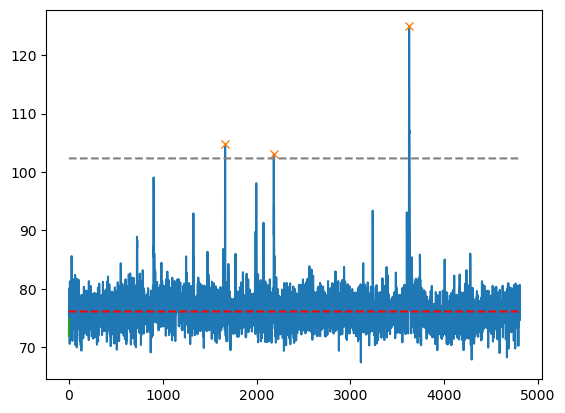

265
the peak time stamps are :[ 177  209  283  308  583  730  775  902 1034 1078 1229 1448 1607 1635
 1860 1999 2078 2201 2358 2414 2465 2817 2984 3060 3105 3128 3225 3262
 3344 3425 3639 3854 3883 3985 4375]
the peak returns to baseline at frame: [185, 220, 305, 346, 596, 744, 795, 908, 1039, 1085, 1245, 1471, 1615, 1654, 1893, 2006, 2084, 2214, 2369, 2421, 2470, 2826, 2992, 3067, 3111, 3135, 3230, 3272, 3351, 3432, 3647, 3860, 3891, 3990, 4381]
the decay time in seconds for each peak is: [0.4, 0.55, 1.1, 1.9, 0.65, 0.7, 1.0, 0.3, 0.25, 0.35, 0.8, 1.15, 0.4, 0.95, 1.65, 0.35, 0.3, 0.65, 0.55, 0.35, 0.25, 0.45, 0.4, 0.35, 0.3, 0.35, 0.25, 0.5, 0.35, 0.35, 0.4, 0.3, 0.4, 0.25, 0.3]
the amplitude of each peak is: [36.983856 35.109665 74.88118  45.644424 59.642685 51.58632  48.56978
 31.882538 35.822784 35.49533  42.528854 58.11618  42.64627  57.272873
 55.002136 32.350037 31.22551  51.03743  43.052887 38.20758  35.355347
 53.54875  45.629166 42.04605  37.954132 49.748062 43.534714 50.871

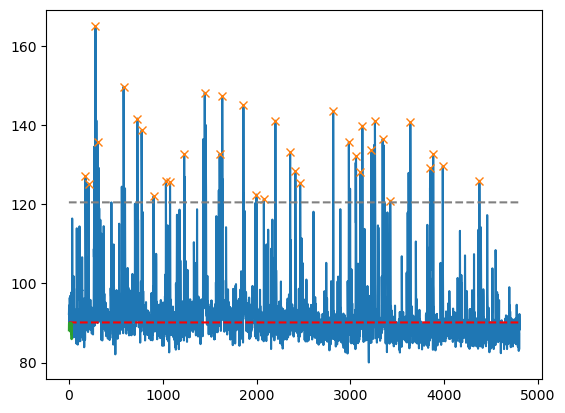

266
the peak time stamps are :[236 982]
the peak returns to baseline at frame: [317, 994]
the decay time in seconds for each peak is: [4.05, 0.6]
the amplitude of each peak is: [60.53717  33.550644]


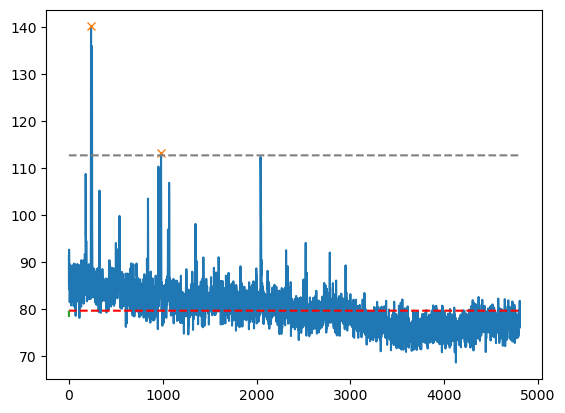

267
the peak time stamps are :[2736]
the peak returns to baseline at frame: [2743]
the decay time in seconds for each peak is: [0.35]
the amplitude of each peak is: [31.095062]


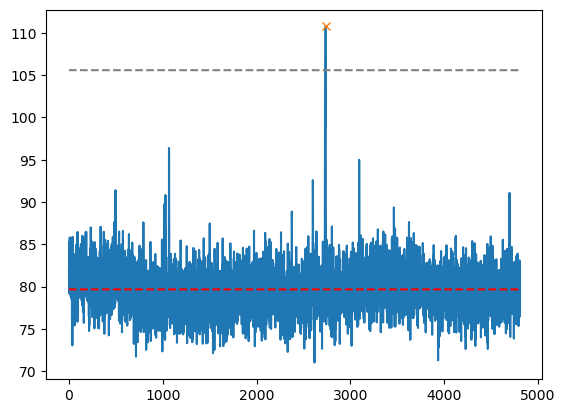

268
the peak time stamps are :[878]
the peak returns to baseline at frame: [927]
the decay time in seconds for each peak is: [2.45]
the amplitude of each peak is: [87.13124]


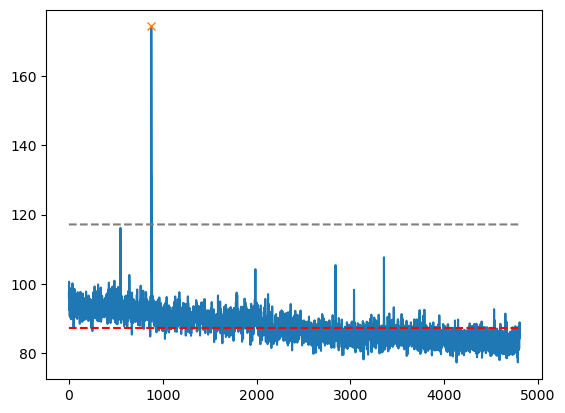

269
the peak time stamps are :[1291]
the peak returns to baseline at frame: [1309]
the decay time in seconds for each peak is: [0.9]
the amplitude of each peak is: [42.051178]


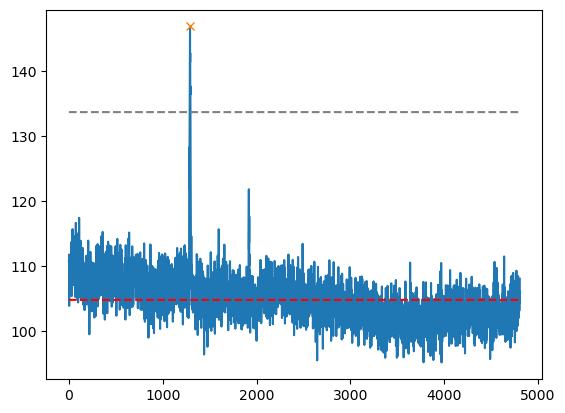

270
the peak time stamps are :[ 517 2147 3306 3404]
the peak returns to baseline at frame: [526, 2159, 3311, 3411]
the decay time in seconds for each peak is: [0.45, 0.6, 0.25, 0.35]
the amplitude of each peak is: [38.021133 49.074463 35.673798 58.17276 ]


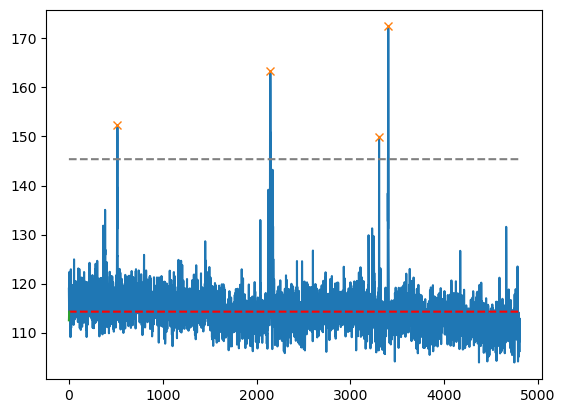

271
the peak time stamps are :[ 350  836 2042]
the peak returns to baseline at frame: [582, 855, 2059]
the decay time in seconds for each peak is: [11.6, 0.95, 0.85]
the amplitude of each peak is: [29.602005 24.5298   57.76718 ]


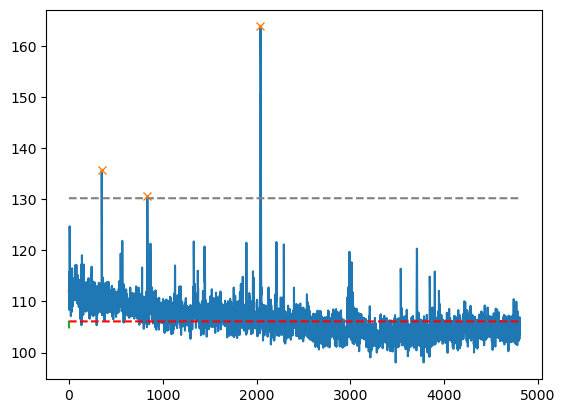

272
the peak time stamps are :[15]
the peak returns to baseline at frame: [119]
the decay time in seconds for each peak is: [5.2]
the amplitude of each peak is: [25.270996]


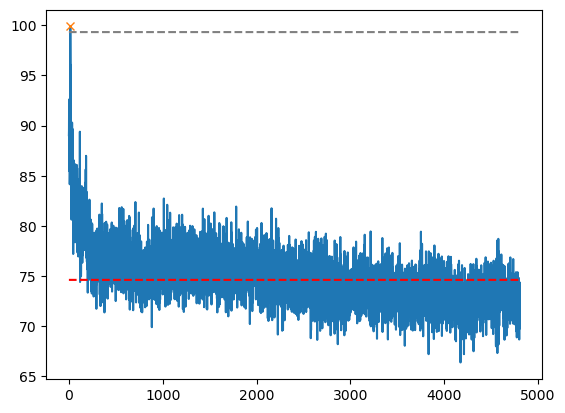

273
the peak time stamps are :[ 153  185  617  757 1198 1467 1608 3176]
the peak returns to baseline at frame: [165, 199, 631, 767, 1209, 1479, 1617, 3184]
the decay time in seconds for each peak is: [0.6, 0.7, 0.7, 0.5, 0.55, 0.6, 0.45, 0.4]
the amplitude of each peak is: [33.17038  37.54901  42.08557  50.2128   31.142624 34.533417 33.32695
 35.67125 ]


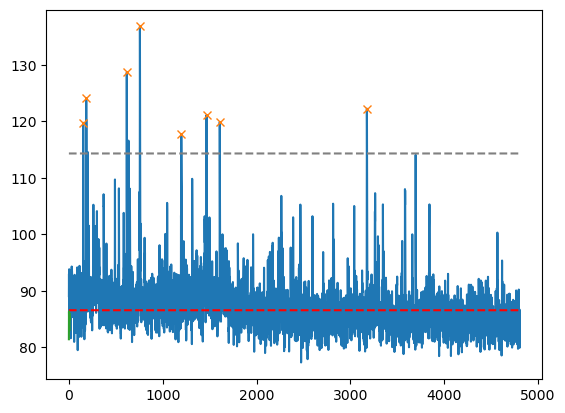

274
the peak time stamps are :[ 262 3204 3384]
the peak returns to baseline at frame: [277, 3213, 3402]
the decay time in seconds for each peak is: [0.75, 0.45, 0.9]
the amplitude of each peak is: [53.978592 53.635666 68.82477 ]


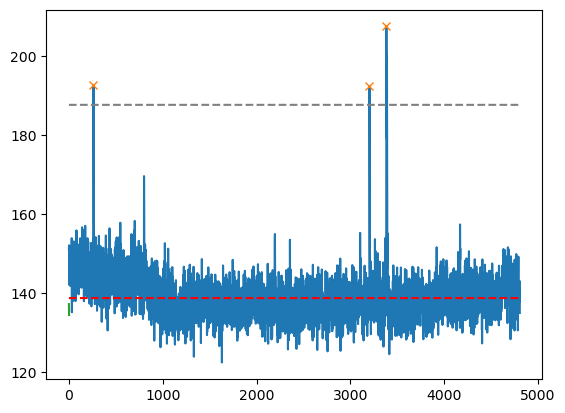

275
the peak time stamps are :[262]
the peak returns to baseline at frame: [306]
the decay time in seconds for each peak is: [2.2]
the amplitude of each peak is: [36.118393]


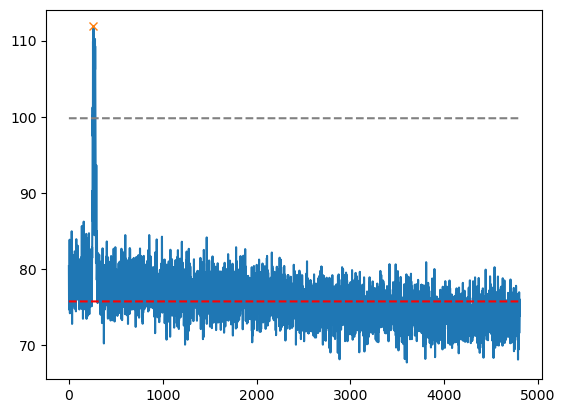

276
the peak time stamps are :[ 236  509 2043 3379]
the peak returns to baseline at frame: [268, 523, 2076, 3385]
the decay time in seconds for each peak is: [1.6, 0.7, 1.65, 0.3]
the amplitude of each peak is: [62.735672 24.526321 74.51245  22.58316 ]


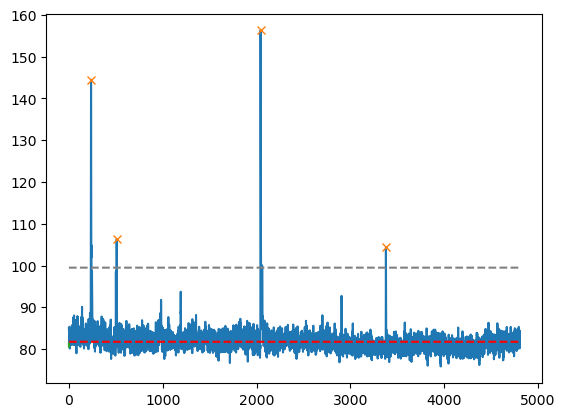

277
the peak time stamps are :[ 174  465 2080]
the peak returns to baseline at frame: [190, 480, 2086]
the decay time in seconds for each peak is: [0.8, 0.75, 0.3]
the amplitude of each peak is: [157.90633   50.04921   47.911835]


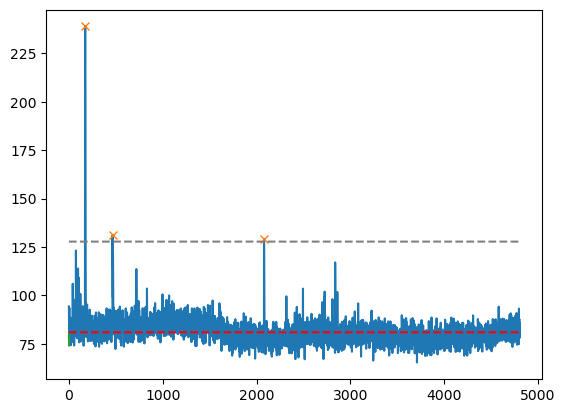

278
the peak time stamps are :[1191]
the peak returns to baseline at frame: [1199]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [46.90605]


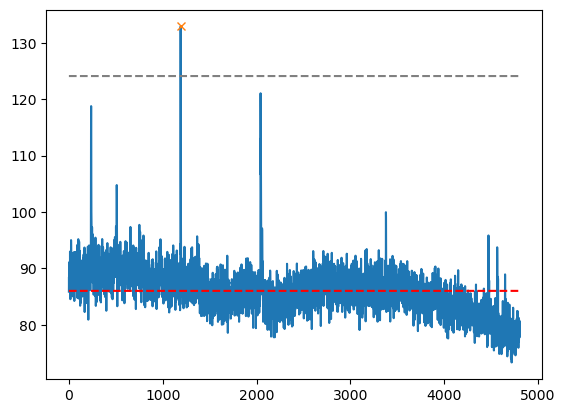

279
the peak time stamps are :[ 512 1296]
the peak returns to baseline at frame: [524, 1312]
the decay time in seconds for each peak is: [0.6, 0.8]
the amplitude of each peak is: [65.86601  22.944183]


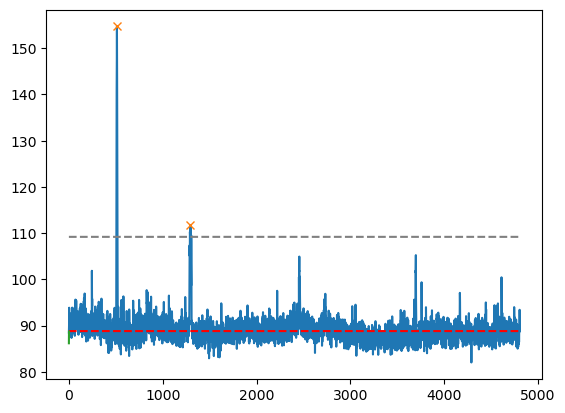

280
the peak time stamps are :[4565 4650]
the peak returns to baseline at frame: [4588, 4685]
the decay time in seconds for each peak is: [1.15, 1.75]
the amplitude of each peak is: [63.310196 31.84607 ]


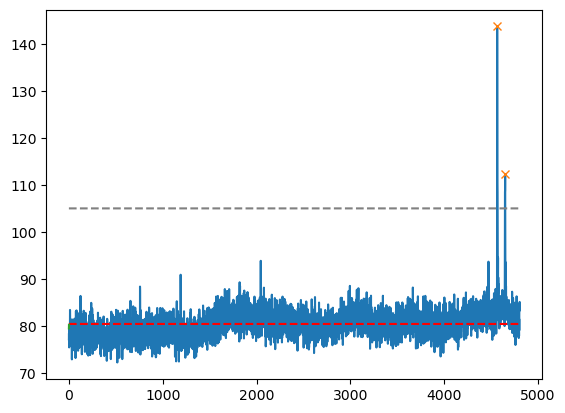

281
the peak time stamps are :[ 333 1222 1673 2498 2632]
the peak returns to baseline at frame: [348, 1237, 1680, 2509, 2640]
the decay time in seconds for each peak is: [0.75, 0.75, 0.35, 0.55, 0.4]
the amplitude of each peak is: [108.6322    62.3804    58.307816  48.98065   84.660324]


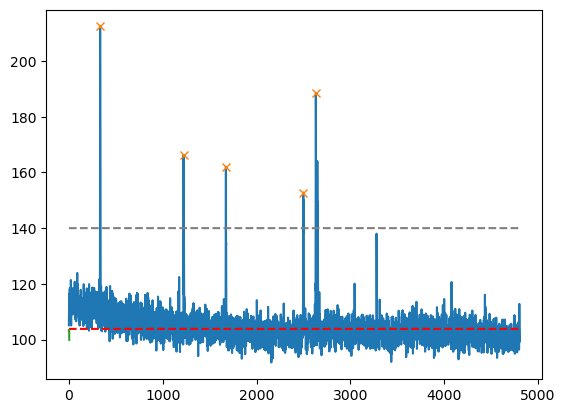

282
the peak time stamps are :[1296]
the peak returns to baseline at frame: [1311]
the decay time in seconds for each peak is: [0.75]
the amplitude of each peak is: [70.68309]


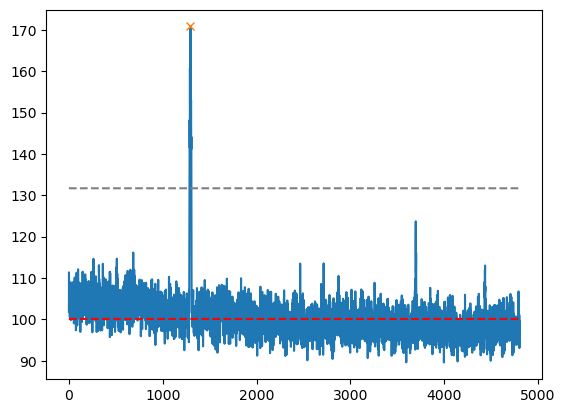

283
the peak time stamps are :[ 420 1930]
the peak returns to baseline at frame: [436, 1969]
the decay time in seconds for each peak is: [0.8, 1.95]
the amplitude of each peak is: [56.94928  54.178726]


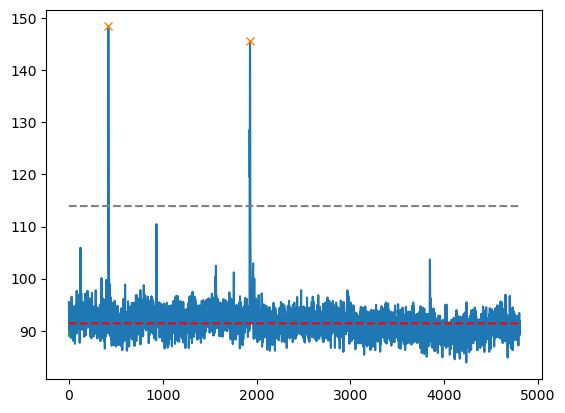

284
the peak time stamps are :[ 162  622 2947 3387]
the peak returns to baseline at frame: [481, 637, 2959, 3394]
the decay time in seconds for each peak is: [15.95, 0.75, 0.6, 0.35]
the amplitude of each peak is: [28.295181 49.004562 33.99968  27.570969]


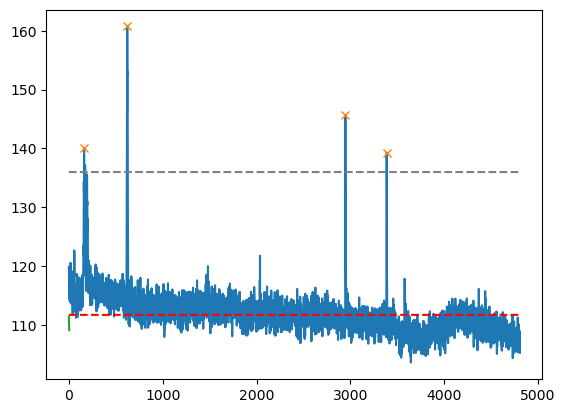

285
the peak time stamps are :[621]
the peak returns to baseline at frame: [633]
the decay time in seconds for each peak is: [0.6]
the amplitude of each peak is: [52.402786]


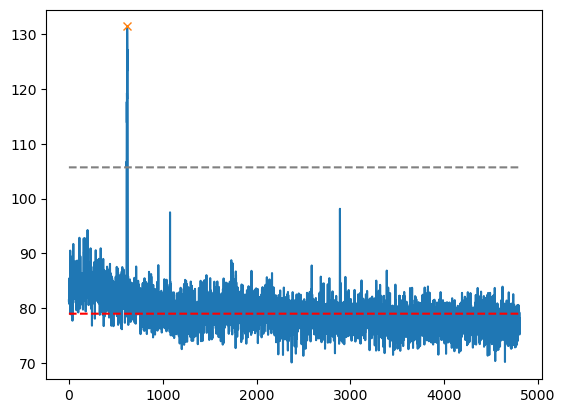

286
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


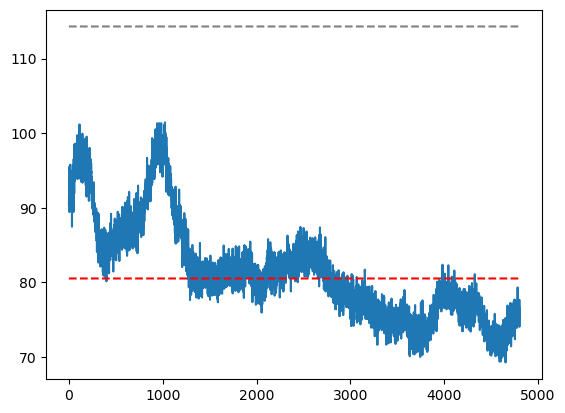

287
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


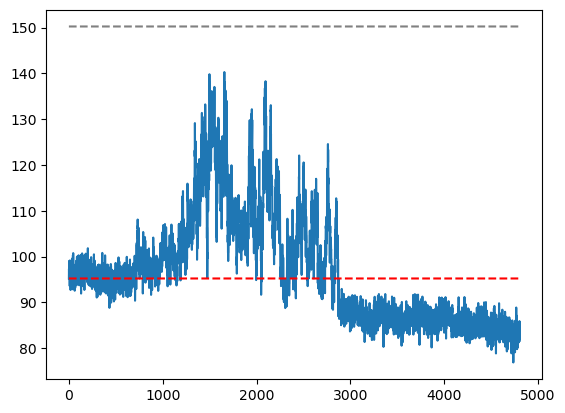

288
the peak time stamps are :[621]
the peak returns to baseline at frame: [631]
the decay time in seconds for each peak is: [0.5]
the amplitude of each peak is: [43.447998]


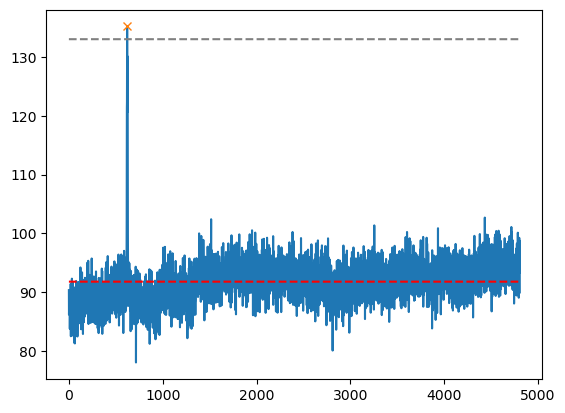

289
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


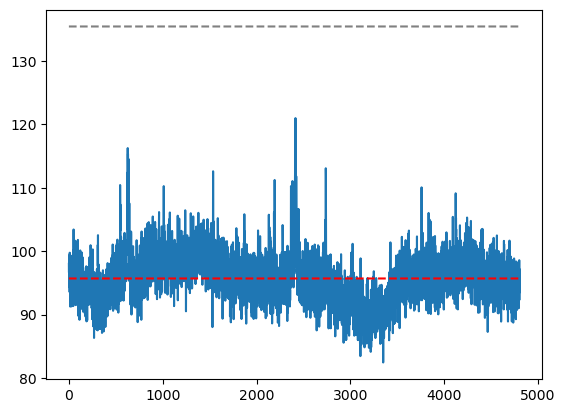

290
the peak time stamps are :[1619 1738 1905 1935 2287 2400 2703 2834 2871 3090]
the peak returns to baseline at frame: [1630, 1750, 1910, 1945, 2302, 2418, 2712, 2890, 2890, 3112]
the decay time in seconds for each peak is: [0.55, 0.6, 0.25, 0.5, 0.75, 0.9, 0.45, 2.8, 0.95, 1.1]
the amplitude of each peak is: [ 46.345184 129.18427   51.097656 144.86293  156.20148  160.98264
  59.54483   93.05556  153.73624  151.63388 ]


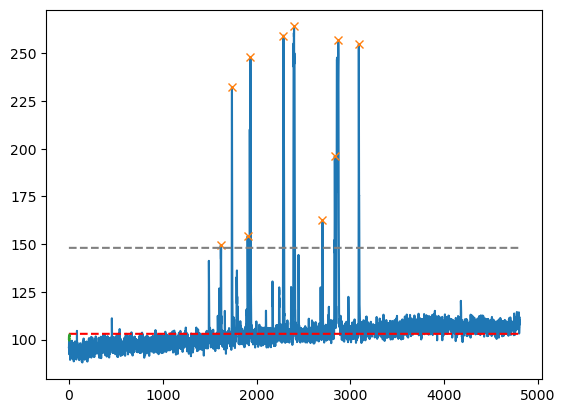

291
the peak time stamps are :[ 676  887 1136]
the peak returns to baseline at frame: [681, 892, 1148]
the decay time in seconds for each peak is: [0.25, 0.25, 0.6]
the amplitude of each peak is: [ 43.79396   42.301315 158.1884  ]


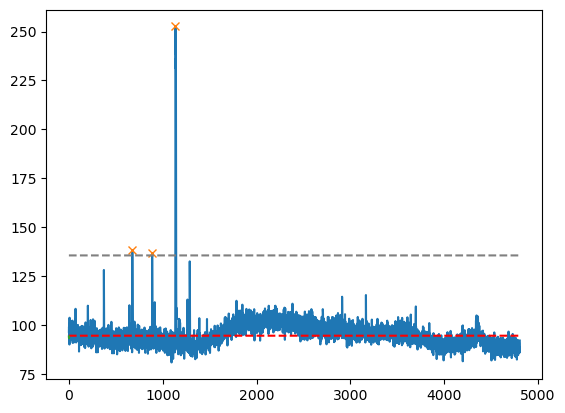

292
the peak time stamps are :[ 100 1401 2134 4539]
the peak returns to baseline at frame: [107, 1406, 2146, 4549]
the decay time in seconds for each peak is: [0.35, 0.25, 0.6, 0.5]
the amplitude of each peak is: [37.35669  43.53105  29.632385 45.259293]


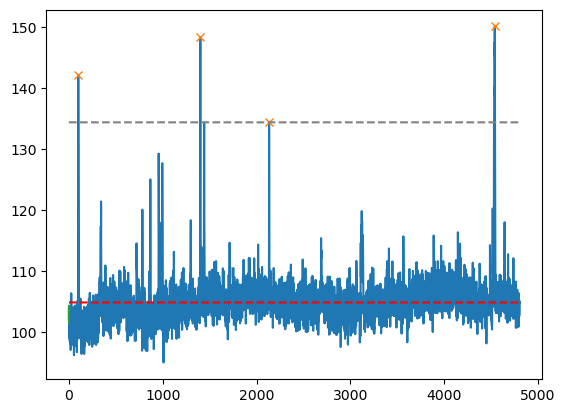

293
the peak time stamps are :[671]
the peak returns to baseline at frame: [711]
the decay time in seconds for each peak is: [2.0]
the amplitude of each peak is: [165.03397]


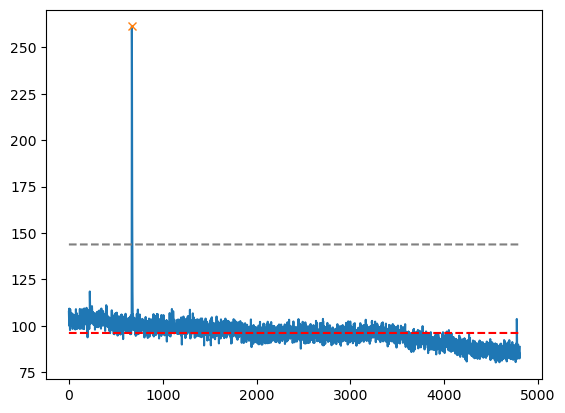

294
the peak time stamps are :[  32   65   90  191  213  269  442  515  570  609  674  924  993 1114
 1184 1205 1446 1511 1567 1851 1883 2006 2611 2909 2932 3123 3608 3706
 4151 4236]
the peak returns to baseline at frame: [52, 115, 115, 249, 249, 298, 476, 531, 641, 641, 689, 938, 1010, 1152, 1237, 1237, 1453, 1520, 1575, 1876, 1893, 2033, 2621, 2925, 2942, 3131, 3618, 3728, 4162, 4250]
the decay time in seconds for each peak is: [1.0, 2.5, 1.25, 2.9, 1.8, 1.45, 1.7, 0.8, 3.55, 1.6, 0.75, 0.7, 0.85, 1.9, 2.65, 1.6, 0.35, 0.45, 0.4, 1.25, 0.5, 1.35, 0.5, 0.8, 0.5, 0.4, 0.5, 1.1, 0.55, 0.7]
the amplitude of each peak is: [ 71.27545   97.533295  84.07738   91.11281   82.079605  65.35066
 115.38129   84.98425  115.20438  109.99568   78.97189  103.446365
  50.189865  75.543915  62.503662 101.05647   79.07156   40.555008
  70.149216  98.72252   71.92845   97.90141   64.19586   80.55818
  36.28235   97.2713    74.26341   70.89653   88.36452   78.017746]


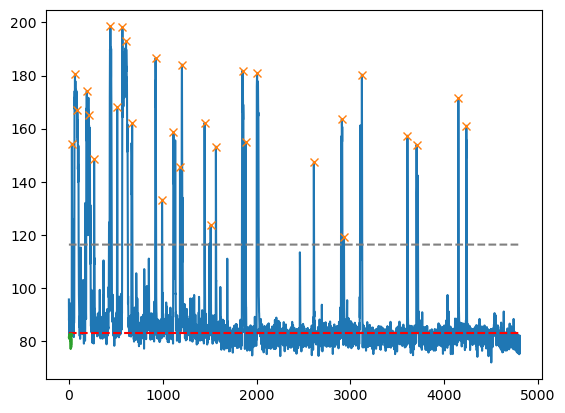

295
the peak time stamps are :[374 677 711]
the peak returns to baseline at frame: [402, 686, 723]
the decay time in seconds for each peak is: [1.4, 0.45, 0.6]
the amplitude of each peak is: [47.10643  54.631638 47.686005]


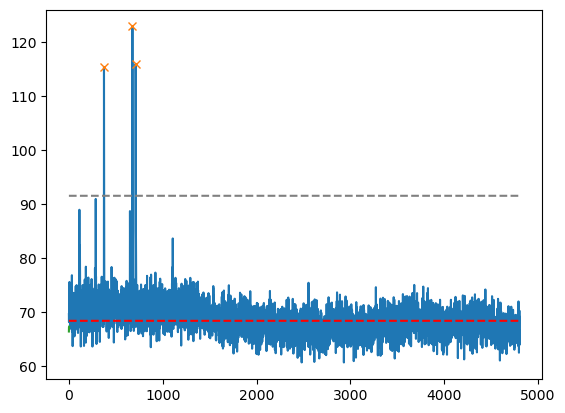

296
the peak time stamps are :[ 368  565 2050 2090]
the peak returns to baseline at frame: [376, 574, 2101, 2101]
the decay time in seconds for each peak is: [0.4, 0.45, 2.55, 0.55]
the amplitude of each peak is: [77.39751  38.567078 52.989075 53.03334 ]


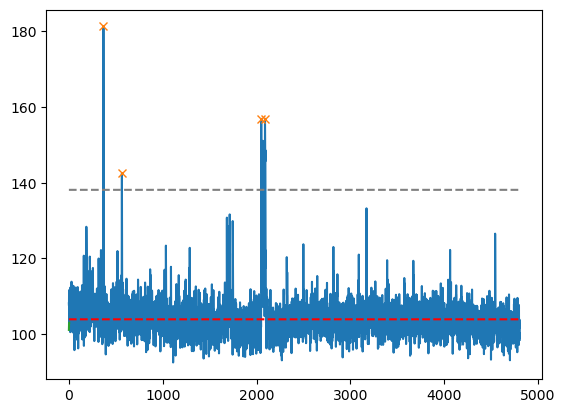

297
the peak time stamps are :[1015 1568 2088]
the peak returns to baseline at frame: [1023, 1578, 2095]
the decay time in seconds for each peak is: [0.4, 0.5, 0.35]
the amplitude of each peak is: [25.119995 22.59729  32.772583]


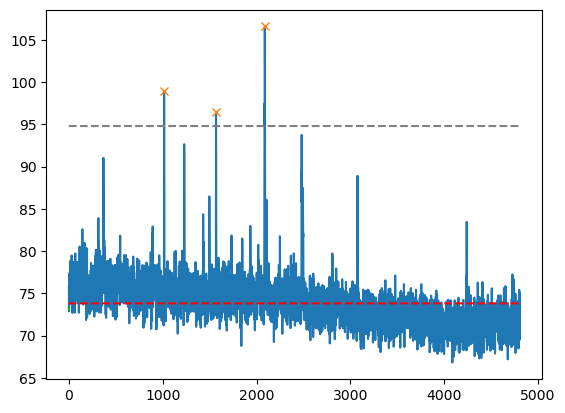

298
the peak time stamps are :[1424 2002 2239]
the peak returns to baseline at frame: [1433, 2013, 2246]
the decay time in seconds for each peak is: [0.45, 0.55, 0.35]
the amplitude of each peak is: [39.741287 36.222748 27.971405]


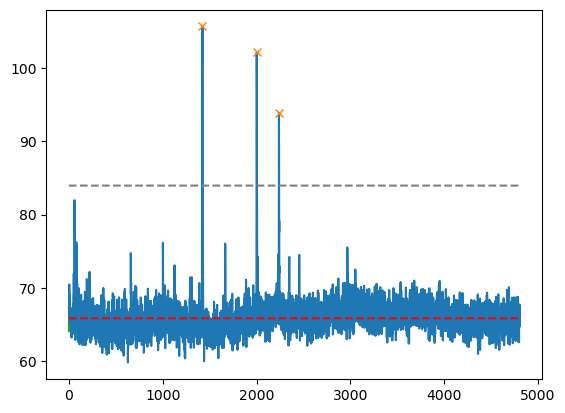

299
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


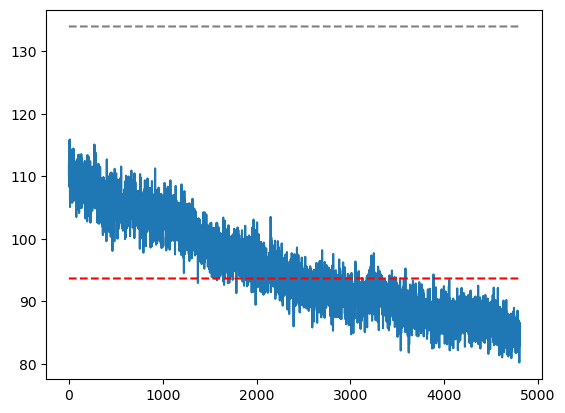

300
the peak time stamps are :[1477 1705 2136 2730 3102]
the peak returns to baseline at frame: [1483, 1709, 2141, 2751, 3109]
the decay time in seconds for each peak is: [0.3, 0.2, 0.25, 1.05, 0.35]
the amplitude of each peak is: [52.202667 25.368698 26.829483 60.89412  32.076935]


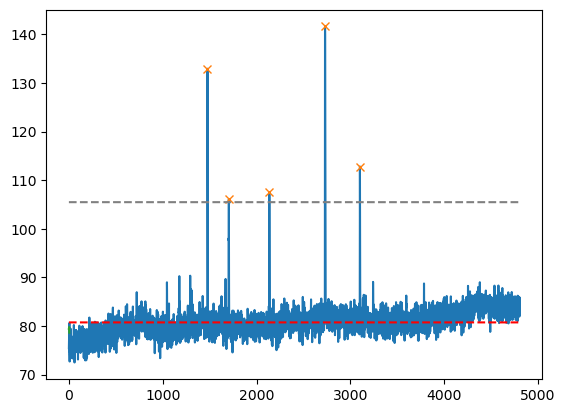

301
the peak time stamps are :[ 186  215  427 1511 2372 4093 4157]
the peak returns to baseline at frame: [228, 228, 441, 1527, 2383, 4109, 4164]
the decay time in seconds for each peak is: [2.1, 0.65, 0.7, 0.8, 0.55, 0.8, 0.35]
the amplitude of each peak is: [ 34.33052   41.58966   42.823685 136.5191    44.708008  76.80112
  39.235428]


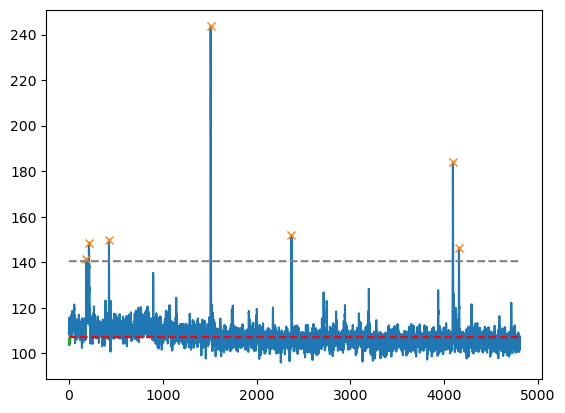

302
the peak time stamps are :[ 12  40  84 121]
the peak returns to baseline at frame: [529, 529, 529, 529]
the decay time in seconds for each peak is: [25.85, 24.45, 22.25, 20.4]
the amplitude of each peak is: [49.81398  88.991    35.032272 44.22325 ]


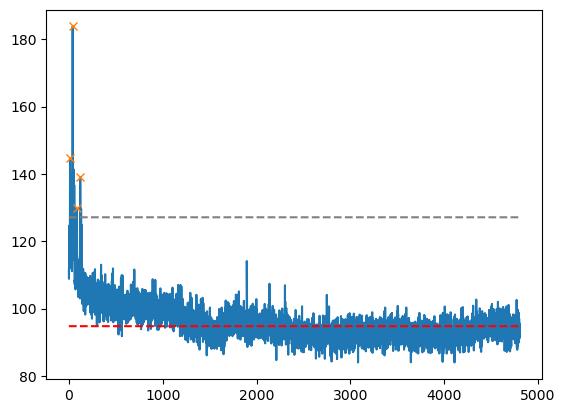

303
the peak time stamps are :[123 195 672]
the peak returns to baseline at frame: [127, 200, 676]
the decay time in seconds for each peak is: [0.2, 0.25, 0.2]
the amplitude of each peak is: [31.007309 30.526611 37.1474  ]


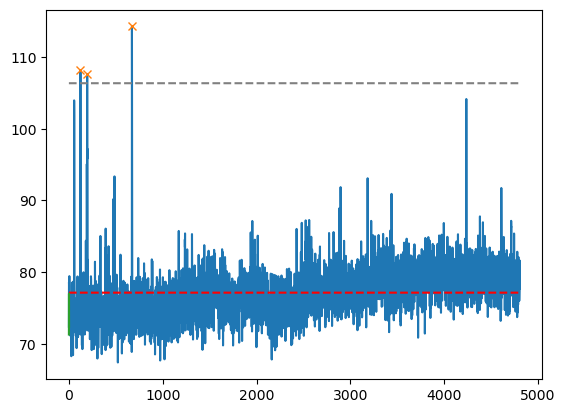

304
the peak time stamps are :[ 660  803  853  896 2236]
the peak returns to baseline at frame: [751, 822, 873, 963, 2256]
the decay time in seconds for each peak is: [4.55, 0.95, 1.0, 3.35, 1.0]
the amplitude of each peak is: [ 79.2708   184.96764   71.581345 156.66551   49.781555]


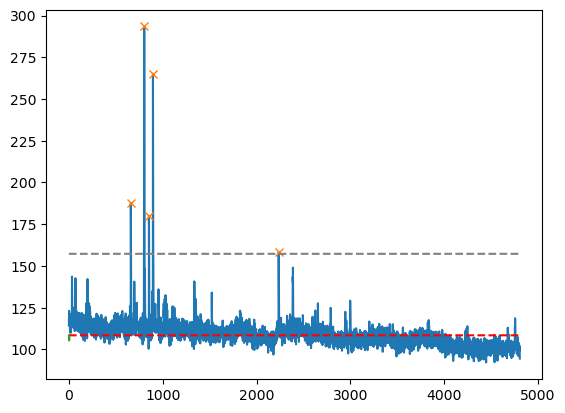

305
the peak time stamps are :[4714]
the peak returns to baseline at frame: [4722]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [95.340164]


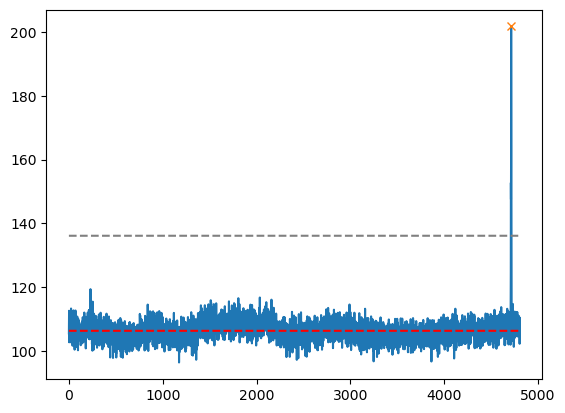

306
the peak time stamps are :[ 416 1635 2663 3250]
the peak returns to baseline at frame: [425, 1647, 2680, 3265]
the decay time in seconds for each peak is: [0.45, 0.6, 0.85, 0.75]
the amplitude of each peak is: [22.586624 44.813583 63.26886  22.322388]


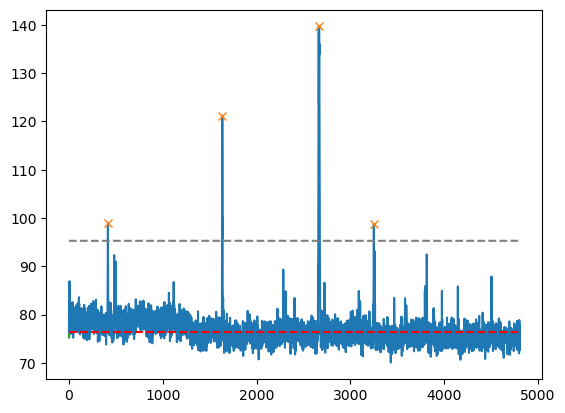

307
the peak time stamps are :[ 781 2817 2924]
the peak returns to baseline at frame: [794, 2825, 2929]
the decay time in seconds for each peak is: [0.65, 0.4, 0.25]
the amplitude of each peak is: [48.279846 45.90193  29.900192]


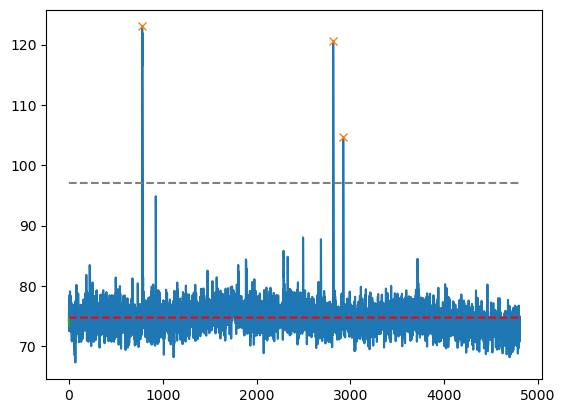

308
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


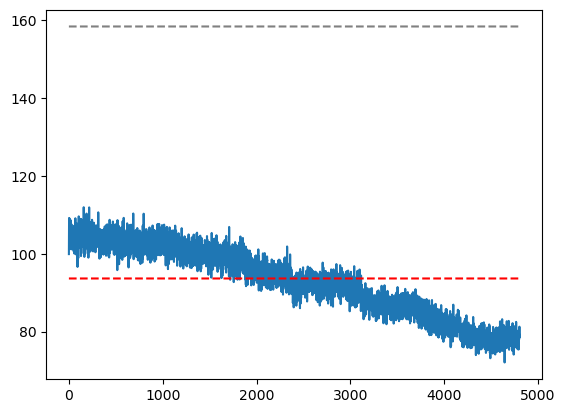

309
the peak time stamps are :[ 343  416  437 3884]
the peak returns to baseline at frame: [362, 426, 447, 3892]
the decay time in seconds for each peak is: [0.95, 0.5, 0.5, 0.4]
the amplitude of each peak is: [57.944855 34.973694 49.862442 38.66597 ]


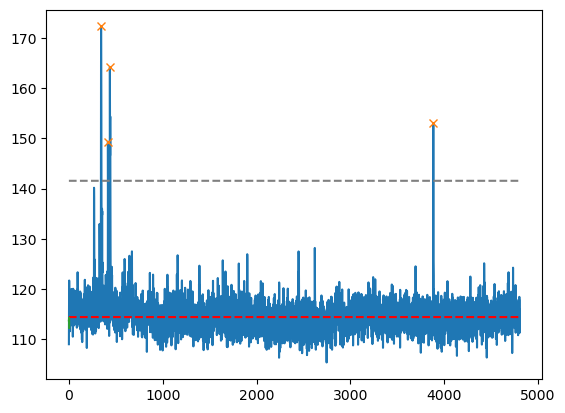

310
the peak time stamps are :[2991 3117]
the peak returns to baseline at frame: [3001, 3141]
the decay time in seconds for each peak is: [0.5, 1.2]
the amplitude of each peak is: [24.417618 43.702988]


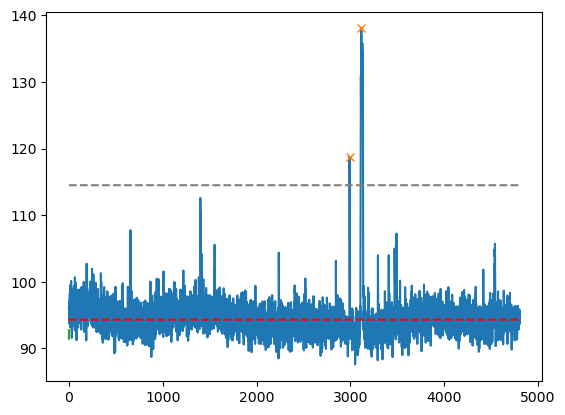

311
the peak time stamps are :[3244 4759]
the peak returns to baseline at frame: [3257, 4774]
the decay time in seconds for each peak is: [0.65, 0.75]
the amplitude of each peak is: [42.296753 49.805954]


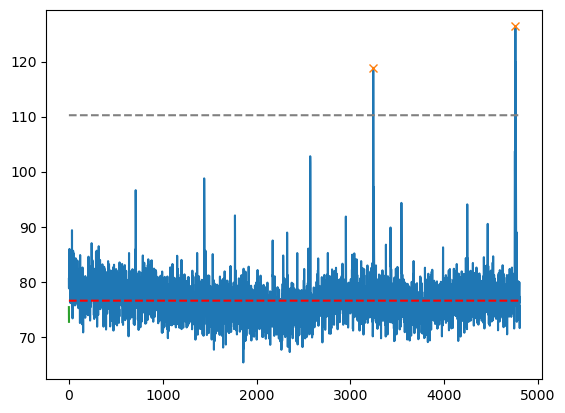

312
the peak time stamps are :[1210 1835 1996 3911]
the peak returns to baseline at frame: [1215, 1864, 2004, 3920]
the decay time in seconds for each peak is: [0.25, 1.45, 0.4, 0.45]
the amplitude of each peak is: [33.66803  47.830765 29.76979  26.137482]


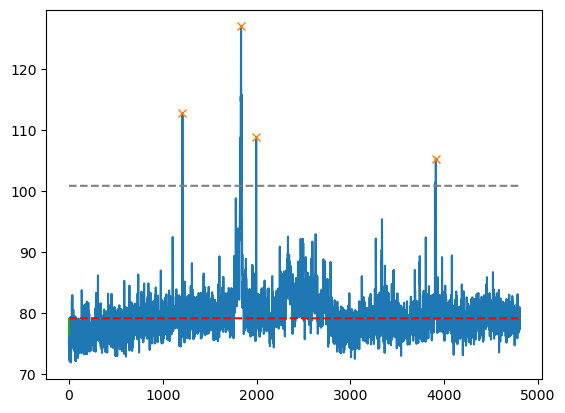

313
the peak time stamps are :[ 581  622  646  848 1099 1499 1748 3451]
the peak returns to baseline at frame: [589, 628, 653, 861, 1104, 1510, 1761, 3464]
the decay time in seconds for each peak is: [0.4, 0.3, 0.35, 0.65, 0.25, 0.55, 0.65, 0.65]
the amplitude of each peak is: [129.55833  152.29314  105.133316 167.69887   89.59982  111.56305
 138.89925  141.9169  ]


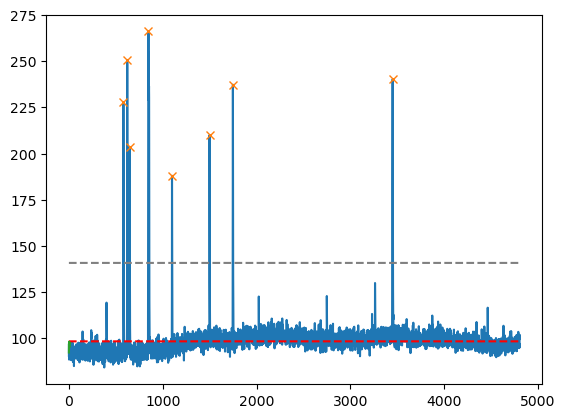

314
the peak time stamps are :[  35 1130 3337]
the peak returns to baseline at frame: [41, 1149, 3345]
the decay time in seconds for each peak is: [0.3, 0.95, 0.4]
the amplitude of each peak is: [39.041855 45.947464 45.147415]


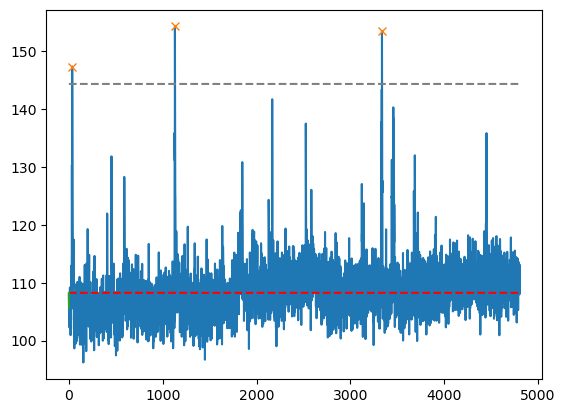

315
the peak time stamps are :[1919]
the peak returns to baseline at frame: [1947]
the decay time in seconds for each peak is: [1.4]
the amplitude of each peak is: [59.444504]


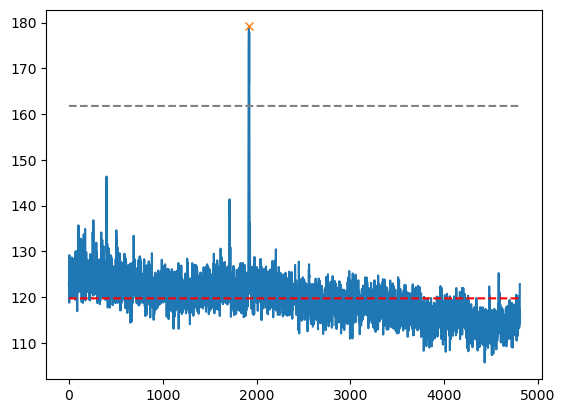

316
the peak time stamps are :[390 685 995]
the peak returns to baseline at frame: [399, 704, 1003]
the decay time in seconds for each peak is: [0.45, 0.95, 0.4]
the amplitude of each peak is: [43.565384 91.8423   91.59317 ]


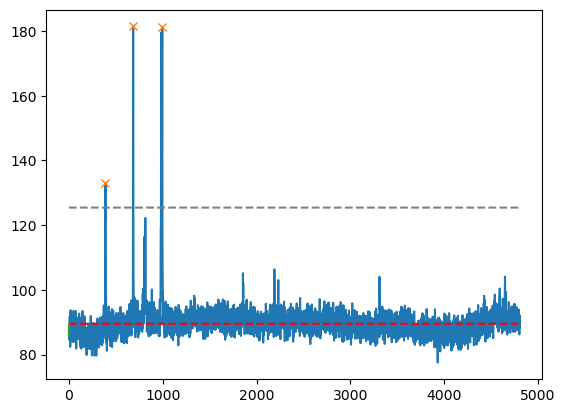

317
the peak time stamps are :[ 118 1048 2079 2262 2420 2460 3515 4396 4687]
the peak returns to baseline at frame: [128, 1058, 2085, 2272, 2445, 2472, 3526, 4414, 4729]
the decay time in seconds for each peak is: [0.5, 0.5, 0.3, 0.5, 1.25, 0.6, 0.55, 0.9, 2.1]
the amplitude of each peak is: [20.639816 18.667984 23.614716 23.977661 18.182617 20.201477 24.873901
 26.96814  30.117584]


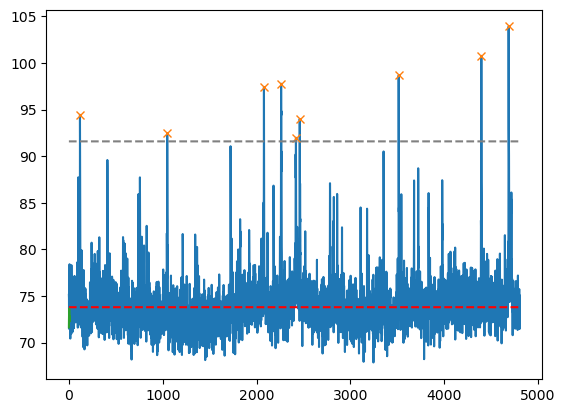

318
the peak time stamps are :[ 782 1091 1183 2523]
the peak returns to baseline at frame: [801, 1106, 1191, 2532]
the decay time in seconds for each peak is: [0.95, 0.75, 0.4, 0.45]
the amplitude of each peak is: [43.957367 34.39766  36.343094 66.895996]


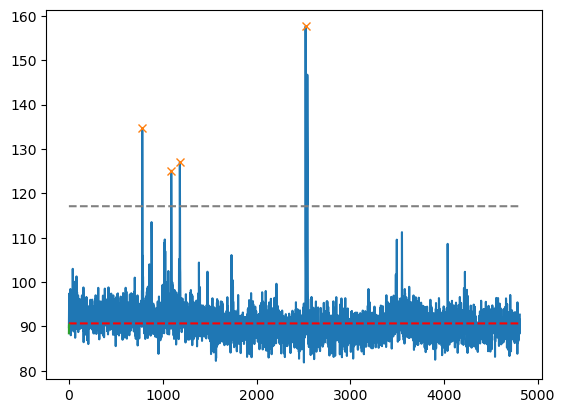

319
the peak time stamps are :[1089 1507 4667]
the peak returns to baseline at frame: [1104, 1519, 4681]
the decay time in seconds for each peak is: [0.75, 0.6, 0.7]
the amplitude of each peak is: [46.40033  49.00522  48.560867]


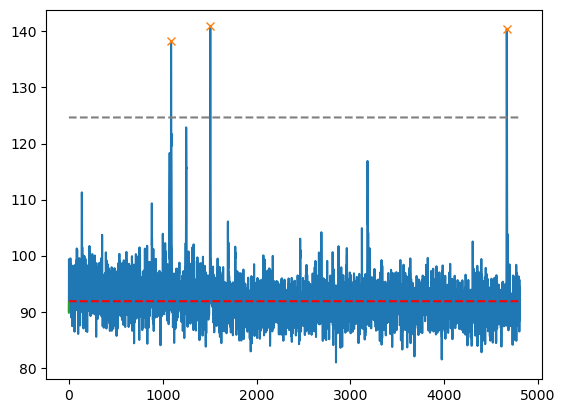

320
the peak time stamps are :[387]
the peak returns to baseline at frame: [398]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [76.393845]


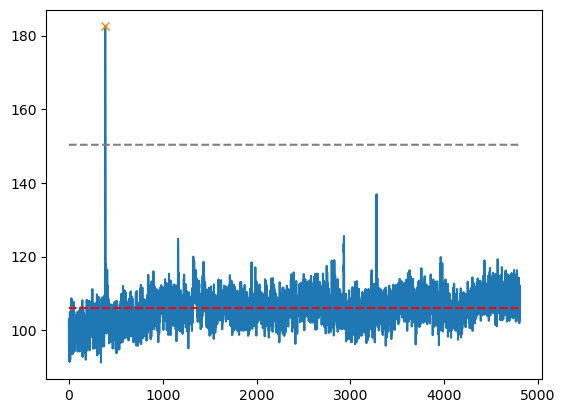

321
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


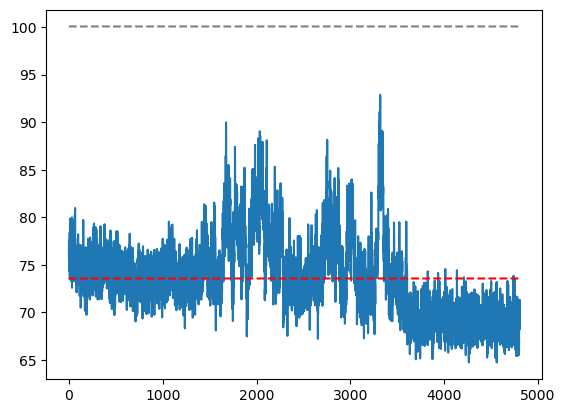

322
the peak time stamps are :[3642 4001]
the peak returns to baseline at frame: [3652, 4015]
the decay time in seconds for each peak is: [0.5, 0.7]
the amplitude of each peak is: [80.21365 50.24785]


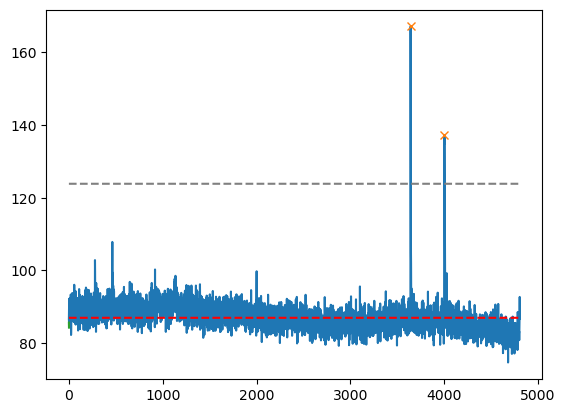

323
the peak time stamps are :[1323 1454 1514 1620 1738 4267]
the peak returns to baseline at frame: [1345, 1485, 1582, 1638, 1748, 4280]
the decay time in seconds for each peak is: [1.1, 1.55, 3.4, 0.9, 0.5, 0.65]
the amplitude of each peak is: [79.03905  37.924088 56.6969   96.76561  70.52287  44.352722]


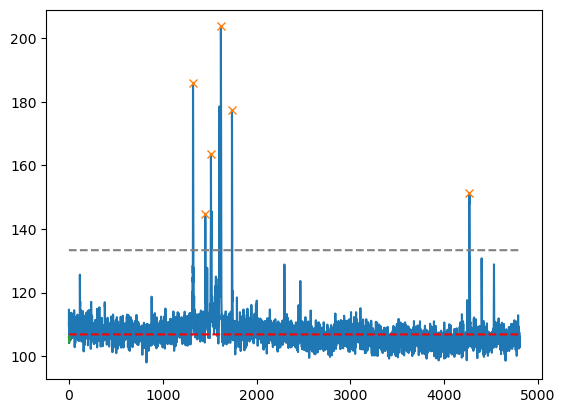

324
the peak time stamps are :[1068 2091]
the peak returns to baseline at frame: [1074, 2101]
the decay time in seconds for each peak is: [0.3, 0.5]
the amplitude of each peak is: [ 99.97505 133.72267]


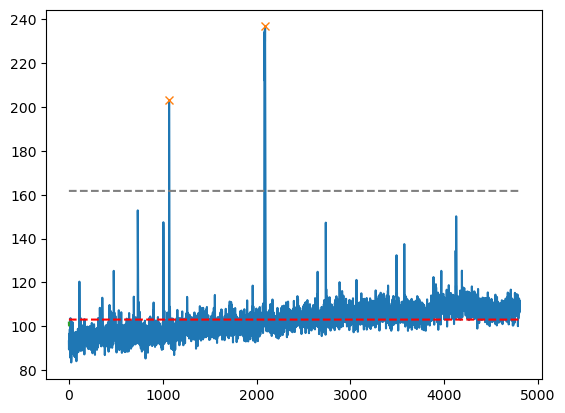

325
the peak time stamps are :[1334 1358 1389 1431]
the peak returns to baseline at frame: [1372, 1372, 1404, 1451]
the decay time in seconds for each peak is: [1.9, 0.7, 0.75, 1.0]
the amplitude of each peak is: [56.763977 52.988785 44.006866 56.675278]


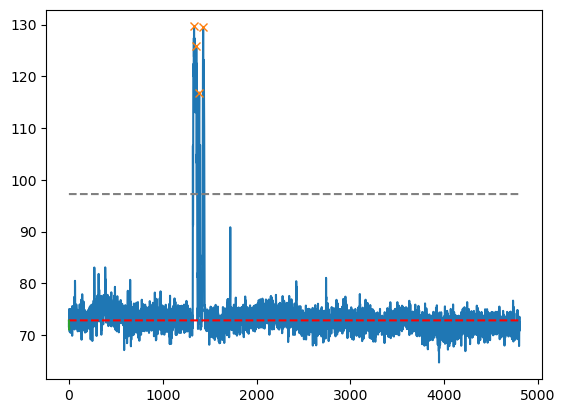

326
the peak time stamps are :[ 125  812 2789 3190]
the peak returns to baseline at frame: [134, 821, 2803, 3203]
the decay time in seconds for each peak is: [0.45, 0.45, 0.7, 0.65]
the amplitude of each peak is: [37.99153  47.62143  44.934433 61.60663 ]


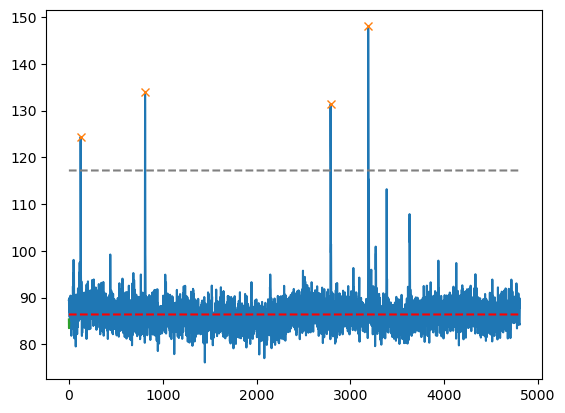

327
the peak time stamps are :[2023 2069]
the peak returns to baseline at frame: [2111, 2111]
the decay time in seconds for each peak is: [4.4, 2.1]
the amplitude of each peak is: [49.1642  57.67244]


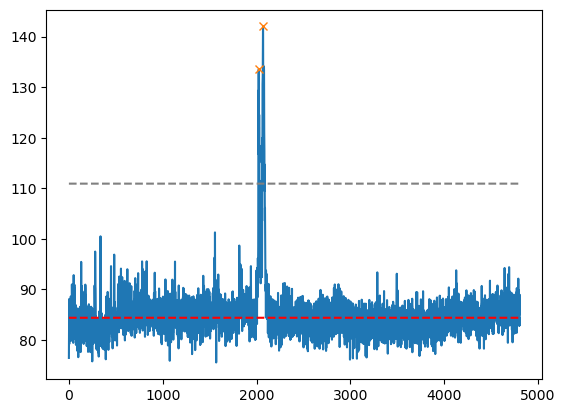

328
the peak time stamps are :[ 48 120 145 266]
the peak returns to baseline at frame: [1340, 1340, 1340, 1340]
the decay time in seconds for each peak is: [64.6, 61.0, 59.75, 53.7]
the amplitude of each peak is: [34.24225  43.93181  36.456665 32.657745]


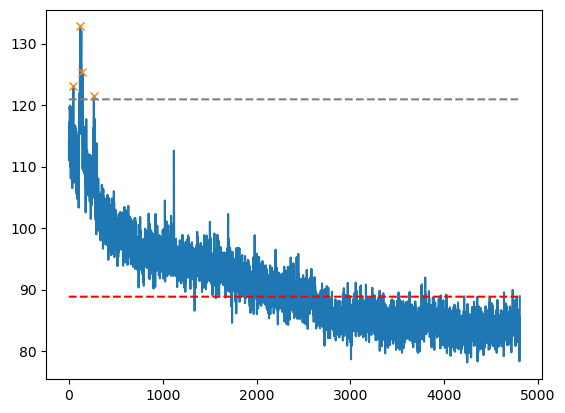

329
the peak time stamps are :[ 509  554  630 1805 4781]
the peak returns to baseline at frame: [537, 565, 638, 1819, 4792]
the decay time in seconds for each peak is: [1.4, 0.55, 0.4, 0.7, 0.55]
the amplitude of each peak is: [252.64706  50.38539  31.96939  88.29675 100.07457]


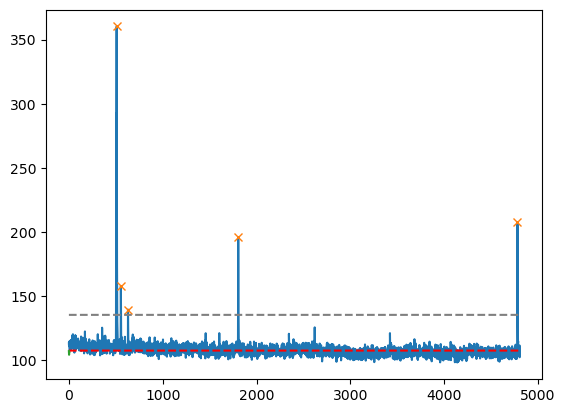

330
the peak time stamps are :[ 911 1382 1654]
the peak returns to baseline at frame: [921, 1397, 1660]
the decay time in seconds for each peak is: [0.5, 0.75, 0.3]
the amplitude of each peak is: [55.930237 73.929596 43.159424]


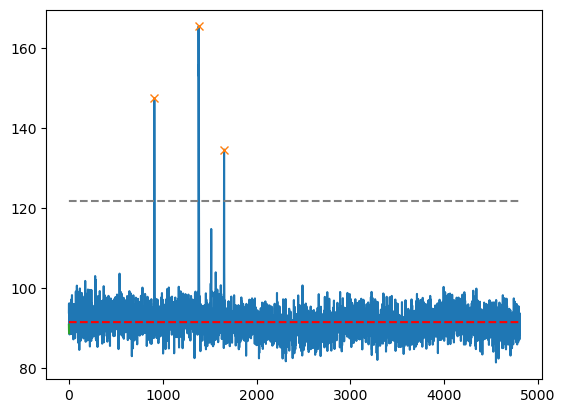

331
the peak time stamps are :[ 344  627  666 1052 1159 2704 2749 4166 4555]
the peak returns to baseline at frame: [353, 636, 672, 1065, 1166, 2715, 2761, 4176, 4569]
the decay time in seconds for each peak is: [0.45, 0.45, 0.3, 0.65, 0.35, 0.55, 0.6, 0.5, 0.7]
the amplitude of each peak is: [ 51.577637  81.60405   45.55327   53.634293  41.667847  44.91513
  47.9003    44.27234  116.05148 ]


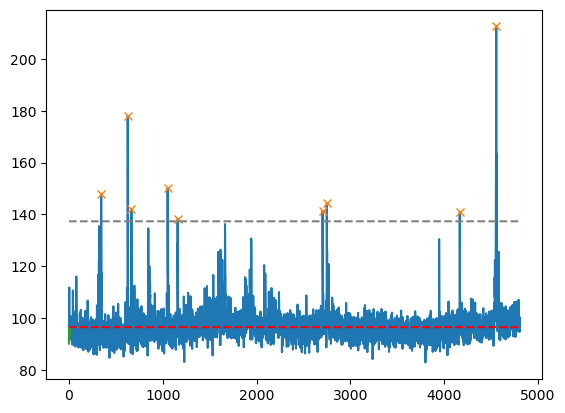

332
the peak time stamps are :[ 243  961 4237]
the peak returns to baseline at frame: [257, 970, 4264]
the decay time in seconds for each peak is: [0.7, 0.45, 1.35]
the amplitude of each peak is: [ 45.725662  39.76155  147.04407 ]


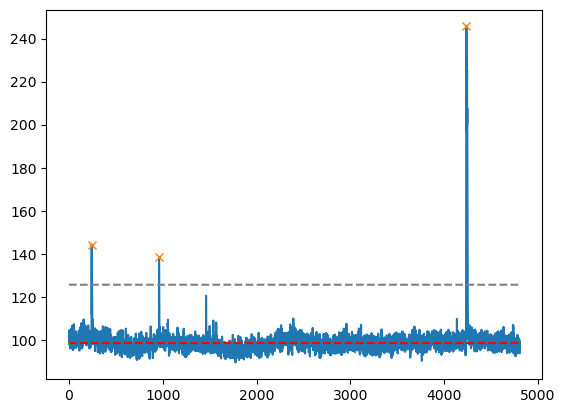

333
the peak time stamps are :[1695 3796]
the peak returns to baseline at frame: [1710, 3800]
the decay time in seconds for each peak is: [0.75, 0.2]
the amplitude of each peak is: [75.47769  26.423904]


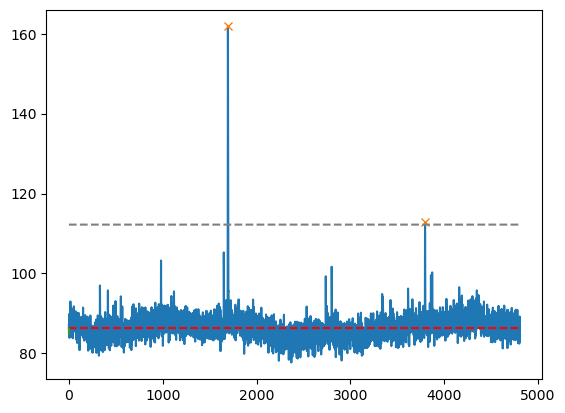

334
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


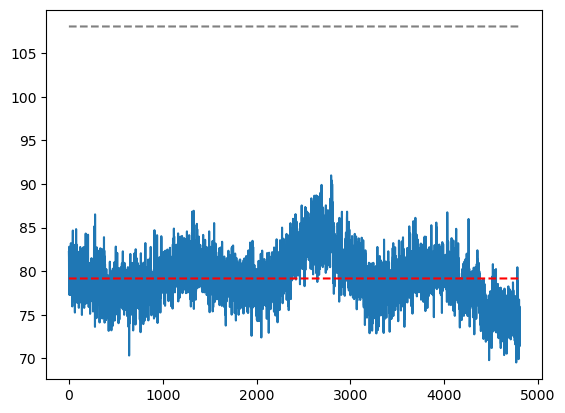

335
the peak time stamps are :[ 100  250 1056 2222 2393 2582 2609 2756]
the peak returns to baseline at frame: [110, 256, 1067, 2237, 2406, 2603, 2615, 2771]
the decay time in seconds for each peak is: [0.5, 0.3, 0.55, 0.75, 0.65, 1.05, 0.3, 0.75]
the amplitude of each peak is: [ 40.620132  44.52202   78.25539  119.09587  123.92081  122.07965
  53.835114 136.78653 ]


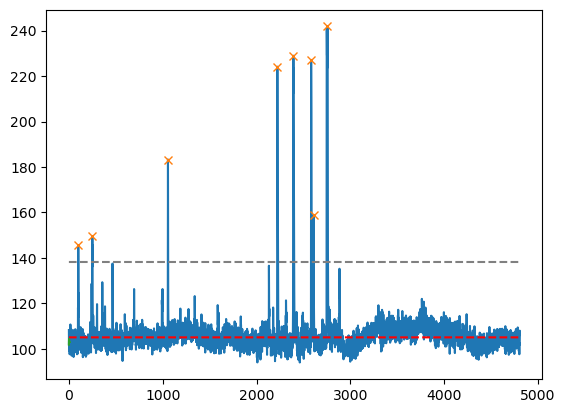

336
the peak time stamps are :[ 909 1241 1637 3907 4264 4455]
the peak returns to baseline at frame: [943, 1253, 1655, 3911, 4273, 4462]
the decay time in seconds for each peak is: [1.7, 0.6, 0.9, 0.2, 0.45, 0.35]
the amplitude of each peak is: [65.84239  50.146072 68.09296  50.270874 73.03723  64.94408 ]


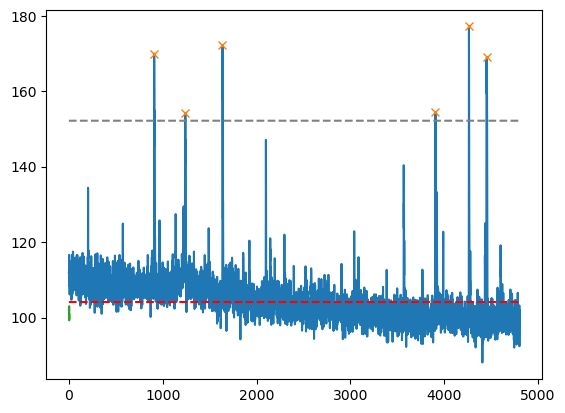

337
the peak time stamps are :[  53 1168 1956]
the peak returns to baseline at frame: [1092, 1241, 1965]
the decay time in seconds for each peak is: [51.95, 3.65, 0.45]
the amplitude of each peak is: [78.76463  52.667175 60.687393]


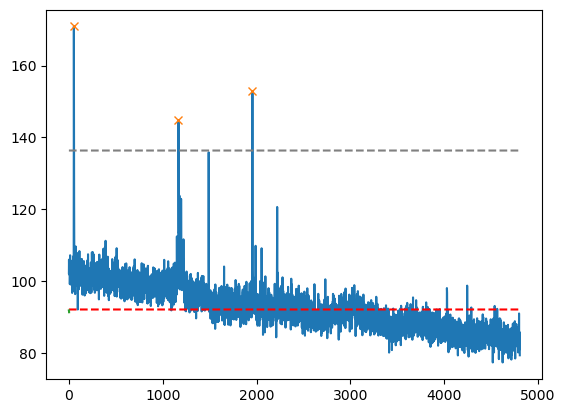

338
the peak time stamps are :[557]
the peak returns to baseline at frame: [619]
the decay time in seconds for each peak is: [3.1]
the amplitude of each peak is: [172.08029]


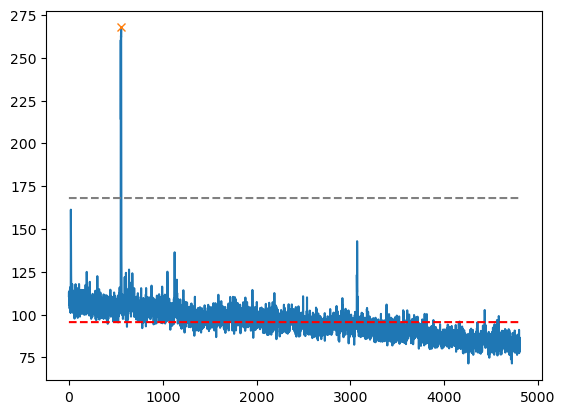

339
the peak time stamps are :[ 498  602 1147 1203 1971]
the peak returns to baseline at frame: [511, 612, 1161, 1211, 1984]
the decay time in seconds for each peak is: [0.65, 0.5, 0.7, 0.4, 0.65]
the amplitude of each peak is: [28.757324 30.027954 26.8051   33.564285 33.862686]


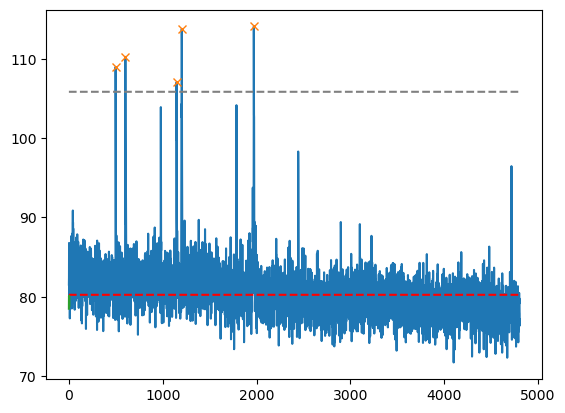

340
the peak time stamps are :[  19 1412 1469 1693 1967]
the peak returns to baseline at frame: [29, 1415, 1480, 1703, 1971]
the decay time in seconds for each peak is: [0.5, 0.15, 0.55, 0.5, 0.2]
the amplitude of each peak is: [ 58.223923  47.27652  148.46834   50.912003  41.946564]


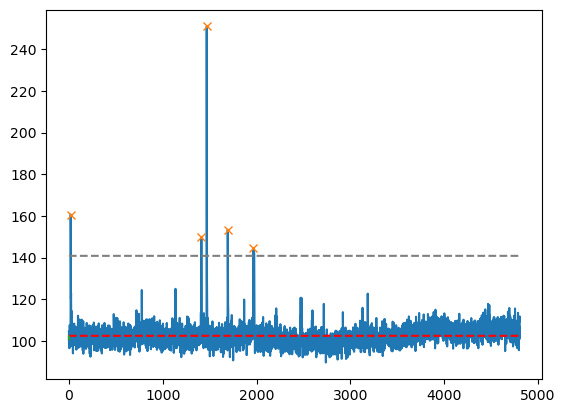

341
the peak time stamps are :[1030 3773]
the peak returns to baseline at frame: [1059, 3787]
the decay time in seconds for each peak is: [1.45, 0.7]
the amplitude of each peak is: [74.73535  59.395706]


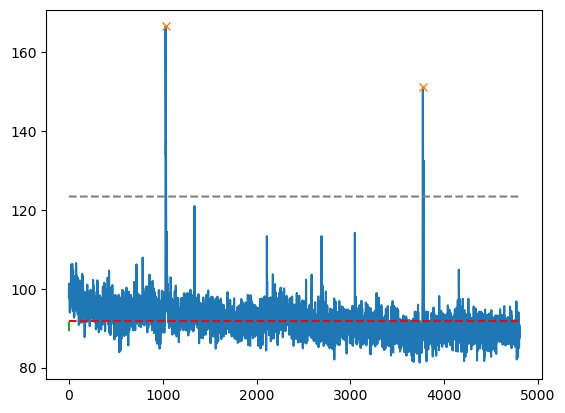

342
the peak time stamps are :[ 298  933 1197 1227 1844 2471 2573 3573 3596]
the peak returns to baseline at frame: [309, 949, 1222, 1234, 1862, 2476, 2583, 3584, 3605]
the decay time in seconds for each peak is: [0.55, 0.8, 1.25, 0.35, 0.9, 0.25, 0.5, 0.55, 0.45]
the amplitude of each peak is: [53.279053 65.14511  46.466003 45.35298  53.711716 48.17531  46.50934
 69.96617  50.223755]


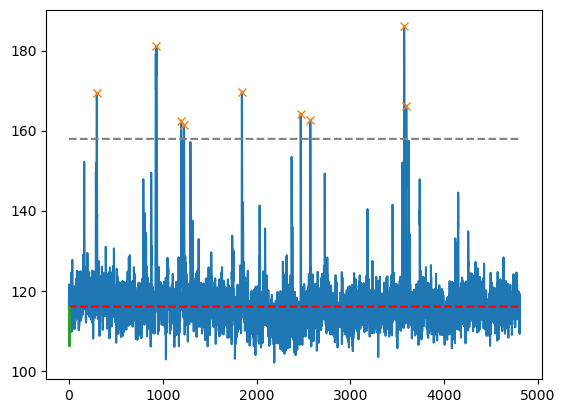

343
the peak time stamps are :[ 212  704 1042 1152 2624 2747 3068 4347]
the peak returns to baseline at frame: [226, 713, 1051, 1165, 2639, 2770, 3118, 4373]
the decay time in seconds for each peak is: [0.7, 0.45, 0.45, 0.65, 0.75, 1.15, 2.5, 1.3]
the amplitude of each peak is: [ 45.43039   48.32611   82.92972   61.302414 171.56514   81.64453
  63.220383  52.66739 ]


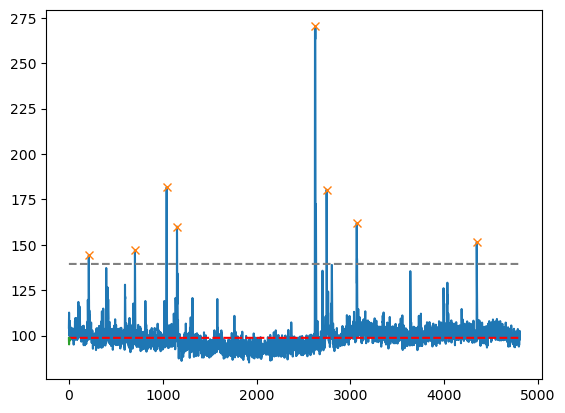

344
the peak time stamps are :[ 391  899 1076 2135 2319 2527 2763]
the peak returns to baseline at frame: [414, 907, 1090, 2146, 2326, 2547, 2777]
the decay time in seconds for each peak is: [1.15, 0.4, 0.7, 0.55, 0.35, 1.0, 0.7]
the amplitude of each peak is: [38.39557  44.909836 57.94075  46.74942  40.998306 43.962006 51.00305 ]


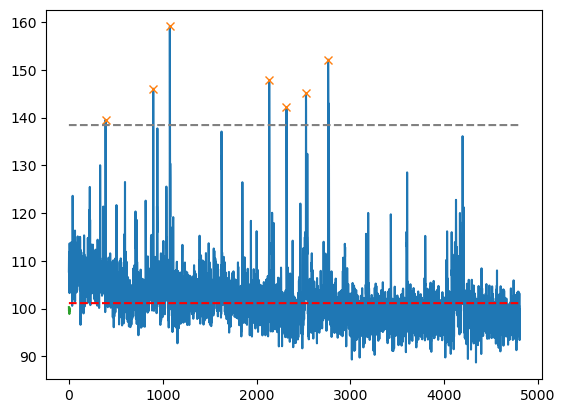

345
the peak time stamps are :[2173 2796]
the peak returns to baseline at frame: [2191, 2809]
the decay time in seconds for each peak is: [0.9, 0.65]
the amplitude of each peak is: [47.16043  31.797531]


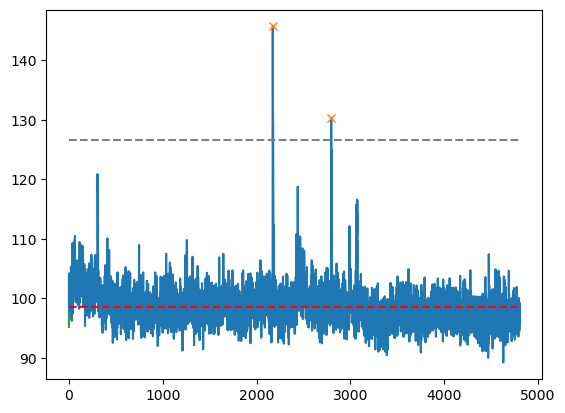

346
the peak time stamps are :[480]
the peak returns to baseline at frame: [916]
the decay time in seconds for each peak is: [21.8]
the amplitude of each peak is: [99.86922]


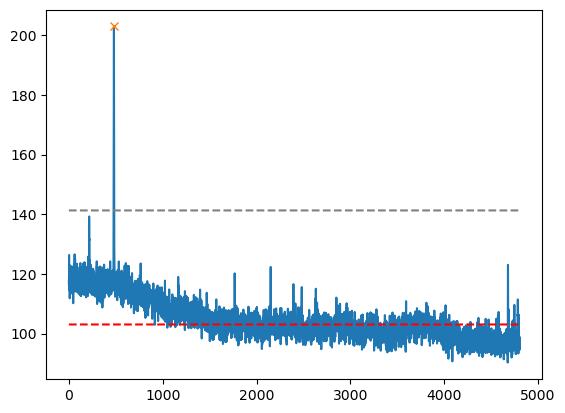

347
the peak time stamps are :[535]
the peak returns to baseline at frame: [987]
the decay time in seconds for each peak is: [22.6]
the amplitude of each peak is: [190.44101]


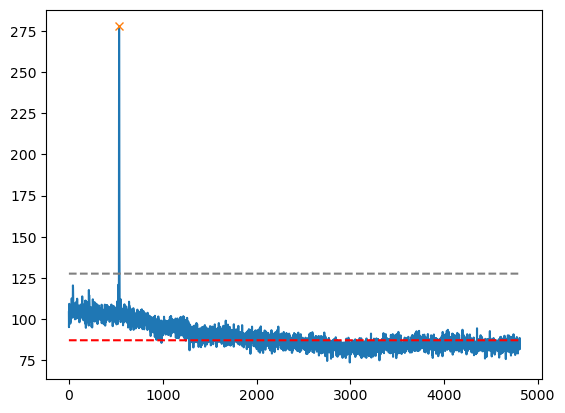

348
the peak time stamps are :[  64  501  965 1279 1925 2880]
the peak returns to baseline at frame: [81, 512, 973, 1284, 1933, 2885]
the decay time in seconds for each peak is: [0.85, 0.55, 0.4, 0.25, 0.4, 0.25]
the amplitude of each peak is: [114.541916  36.870834  49.1369    36.5896    37.54393   43.638687]


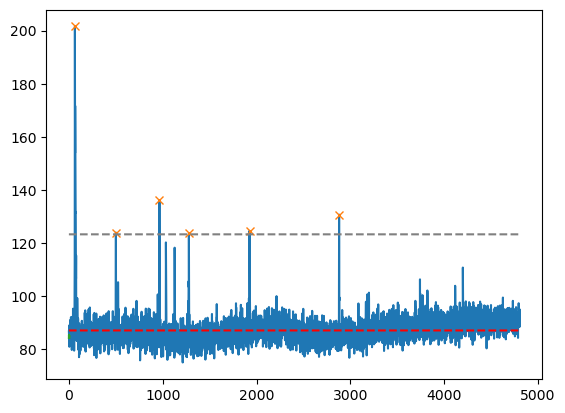

349
the peak time stamps are :[ 77 104]
the peak returns to baseline at frame: [136, 136]
the decay time in seconds for each peak is: [2.95, 1.6]
the amplitude of each peak is: [39.53099  40.211563]


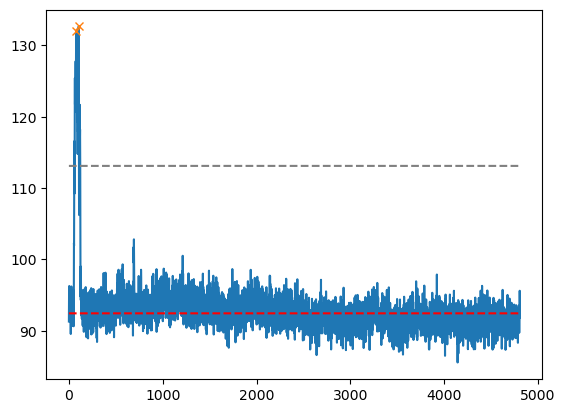

350
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


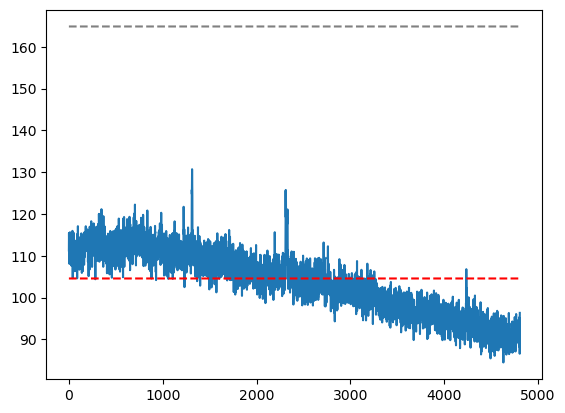

351
the peak time stamps are :[ 283  309 1242 2813 3129 3236]
the peak returns to baseline at frame: [290, 316, 1249, 2826, 3135, 3246]
the decay time in seconds for each peak is: [0.35, 0.35, 0.35, 0.65, 0.3, 0.5]
the amplitude of each peak is: [92.8017   75.671524 49.99225  36.19034  41.385544 77.16606 ]


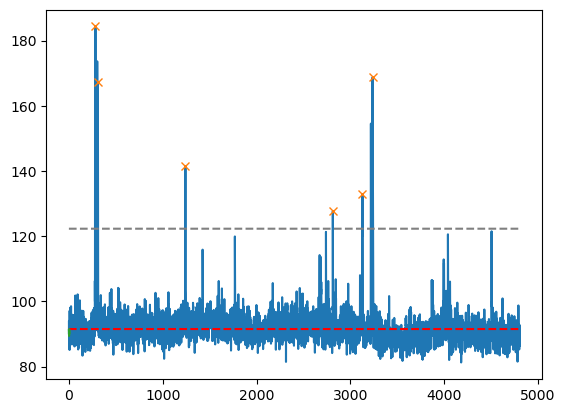

352
the peak time stamps are :[354]
the peak returns to baseline at frame: [729]
the decay time in seconds for each peak is: [18.75]
the amplitude of each peak is: [42.422073]


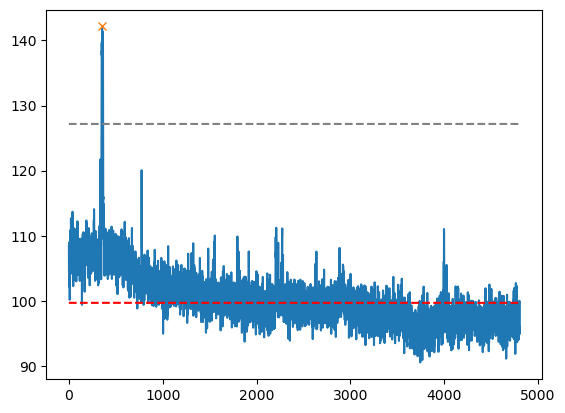

353
the peak time stamps are :[ 513 1601 3721 4151 4531]
the peak returns to baseline at frame: [666, 1617, 3728, 4162, 4546]
the decay time in seconds for each peak is: [7.65, 0.8, 0.35, 0.55, 0.75]
the amplitude of each peak is: [35.522995 63.172165 34.203293 61.524033 56.281433]


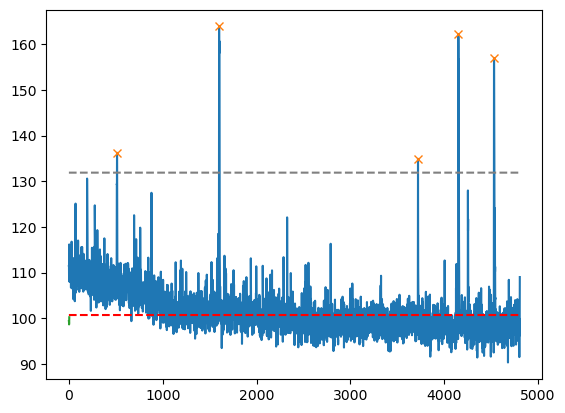

354
the peak time stamps are :[896]
the peak returns to baseline at frame: [910]
the decay time in seconds for each peak is: [0.7]
the amplitude of each peak is: [48.8376]


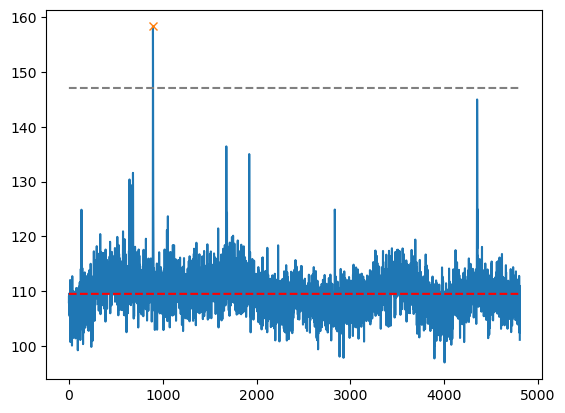

355
the peak time stamps are :[3628]
the peak returns to baseline at frame: [3658]
the decay time in seconds for each peak is: [1.5]
the amplitude of each peak is: [93.98622]


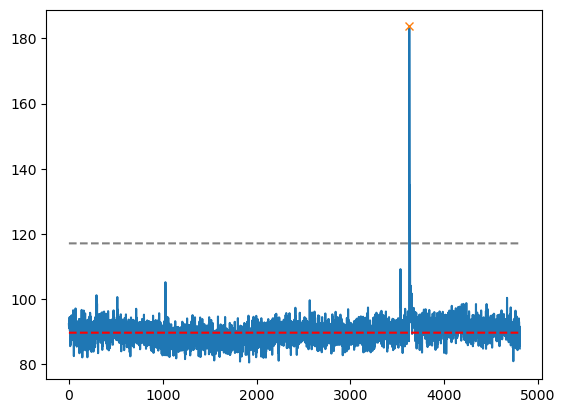

356
the peak time stamps are :[ 980 2082 2136 4138]
the peak returns to baseline at frame: [990, 2089, 2156, 4147]
the decay time in seconds for each peak is: [0.5, 0.35, 1.0, 0.45]
the amplitude of each peak is: [ 99.17012   50.687653 155.18613   66.60304 ]


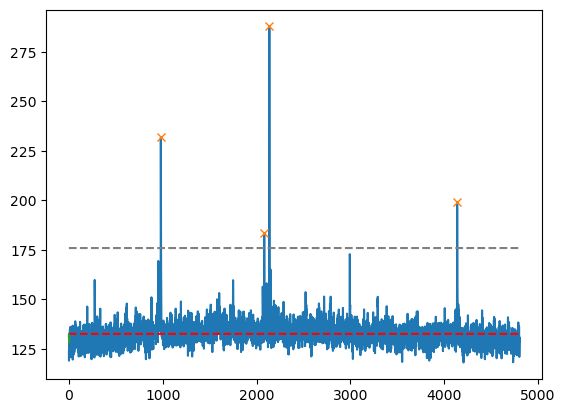

357
the peak time stamps are :[ 799 3469 3619 3771 3963 3987 4283 4330 4368 4427]
the peak returns to baseline at frame: [821, 3476, 3643, 3775, 4008, 4008, 4302, 4346, 4393, 4446]
the decay time in seconds for each peak is: [1.1, 0.35, 1.2, 0.2, 2.25, 1.05, 0.95, 0.8, 1.25, 0.95]
the amplitude of each peak is: [ 36.009552  51.150604 163.01207   39.352676 169.0385    96.96452
 127.91562  149.09917   62.39174   64.95935 ]


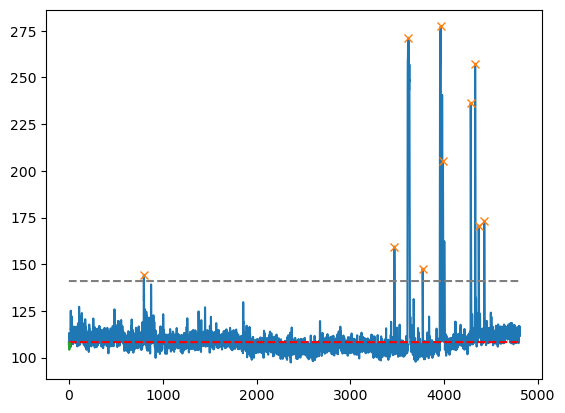

358
the peak time stamps are :[3137 3583 3605]
the peak returns to baseline at frame: [3187, 3623, 3623]
the decay time in seconds for each peak is: [2.5, 2.0, 0.9]
the amplitude of each peak is: [25.483002 41.91284  31.782303]


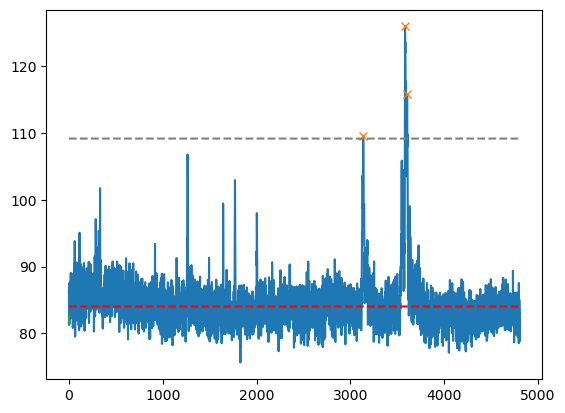

359
the peak time stamps are :[1636]
the peak returns to baseline at frame: [1666]
the decay time in seconds for each peak is: [1.5]
the amplitude of each peak is: [67.929535]


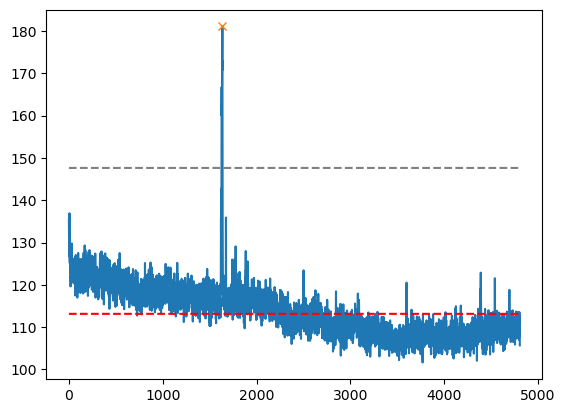

360
the peak time stamps are :[ 806  918  972 1056 1080 1120 1315 2129]
the peak returns to baseline at frame: [815, 922, 993, 1102, 1102, 1126, 1340, 2176]
the decay time in seconds for each peak is: [0.45, 0.2, 1.05, 2.3, 1.1, 0.3, 1.25, 2.35]
the amplitude of each peak is: [57.566116 44.23471  58.91713  57.613144 52.86949  56.148605 78.61818
 43.24385 ]


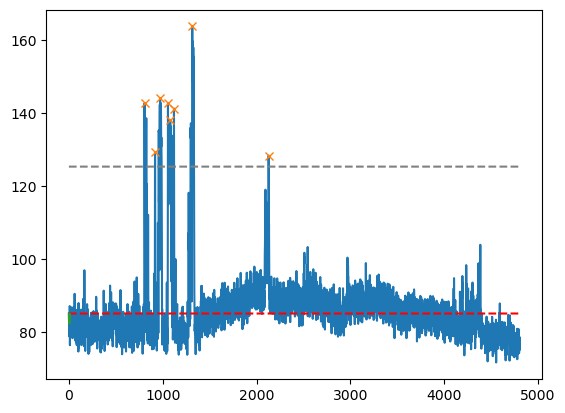

361
the peak time stamps are :[1539 1881 2035 3598 4336 4385]
the peak returns to baseline at frame: [1550, 1888, 2041, 3604, 4344, 4398]
the decay time in seconds for each peak is: [0.55, 0.35, 0.3, 0.3, 0.4, 0.65]
the amplitude of each peak is: [34.61493  44.1127   35.219055 44.072525 56.398697 57.667038]


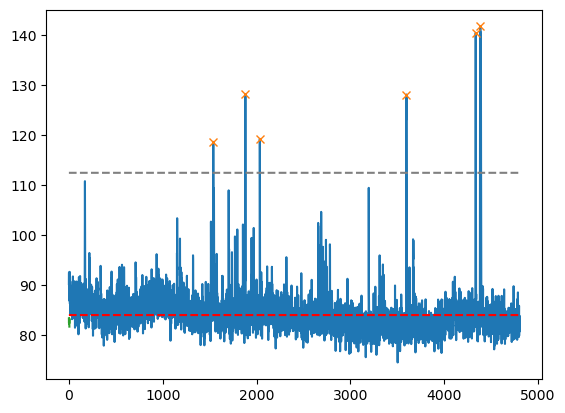

362
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


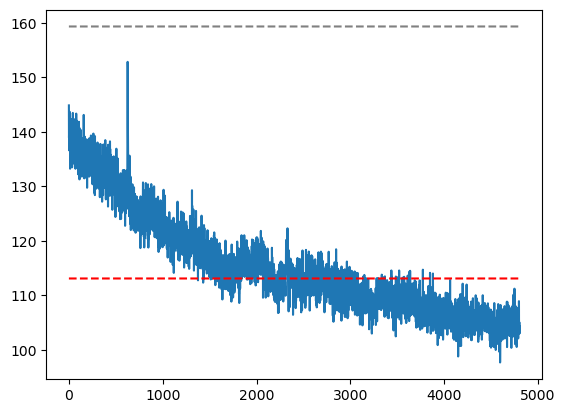

363
the peak time stamps are :[ 939 1154 3852]
the peak returns to baseline at frame: [946, 1165, 3870]
the decay time in seconds for each peak is: [0.35, 0.55, 0.9]
the amplitude of each peak is: [35.424698 47.647675 86.54909 ]


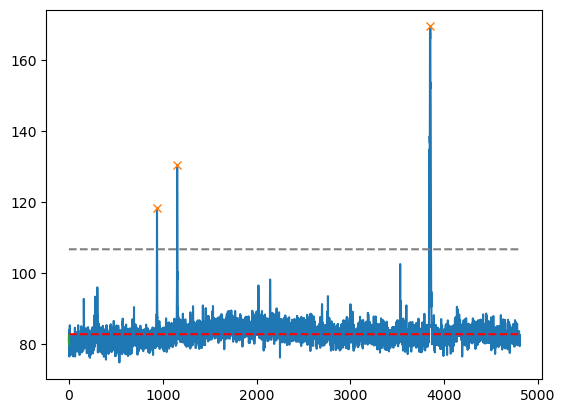

364
the peak time stamps are :[363]
the peak returns to baseline at frame: [369]
the decay time in seconds for each peak is: [0.3]
the amplitude of each peak is: [76.06651]


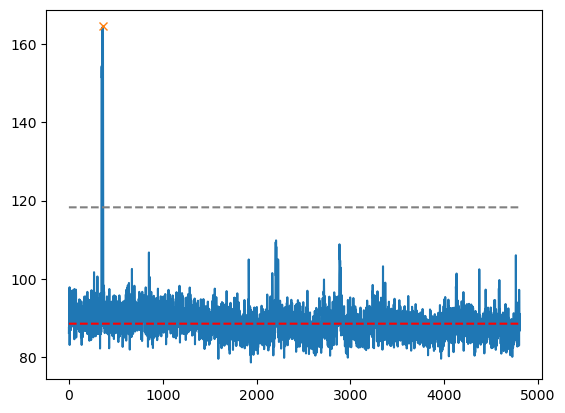

365
the peak time stamps are :[ 376 1820 1855 2064 2377]
the peak returns to baseline at frame: [381, 1871, 1871, 2073, 2392]
the decay time in seconds for each peak is: [0.25, 2.55, 0.8, 0.45, 0.75]
the amplitude of each peak is: [29.140625 52.653687 40.4028   50.97461  38.243195]


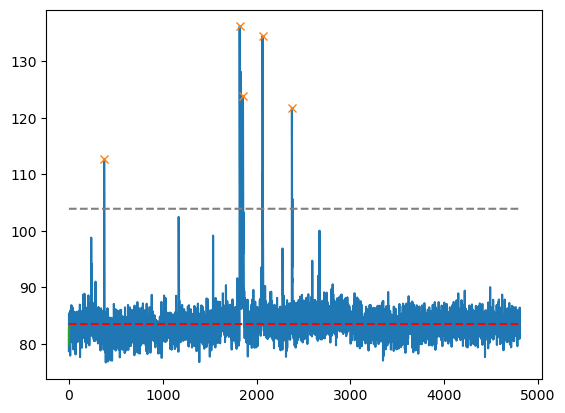

366
the peak time stamps are :[ 192  237  339  601  891  974 1147 1671 2650]
the peak returns to baseline at frame: [198, 244, 344, 615, 896, 981, 1151, 1681, 2657]
the decay time in seconds for each peak is: [0.3, 0.35, 0.25, 0.7, 0.25, 0.35, 0.2, 0.5, 0.35]
the amplitude of each peak is: [28.831818 26.51001  28.513382 60.937073 30.376785 35.768387 30.511688
 91.02219  51.01381 ]


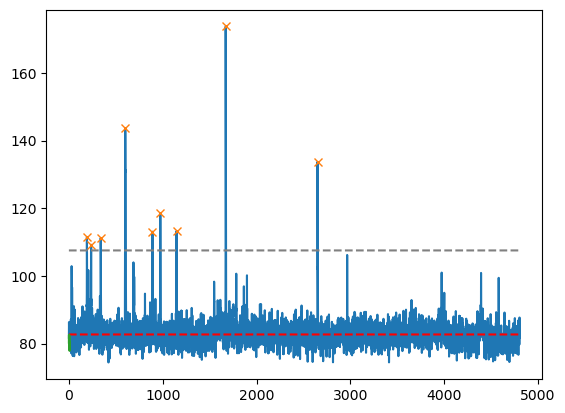

367
the peak time stamps are :[2349 2392 2429 2484 2540 2561 2586 2618 2644 2701 2733 2755 2793 2856
 2961]
the peak returns to baseline at frame: [2378, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026, 3026]
the decay time in seconds for each peak is: [1.45, 31.7, 29.85, 27.1, 24.3, 23.25, 22.0, 20.4, 19.1, 16.25, 14.65, 13.55, 11.65, 8.5, 3.25]
the amplitude of each peak is: [ 56.677277  60.297684  63.267883  44.684708  47.0744    48.64595
  51.54544   53.873962  45.326874  48.212906  49.193207  44.29161
  47.812164 144.63142   46.295   ]


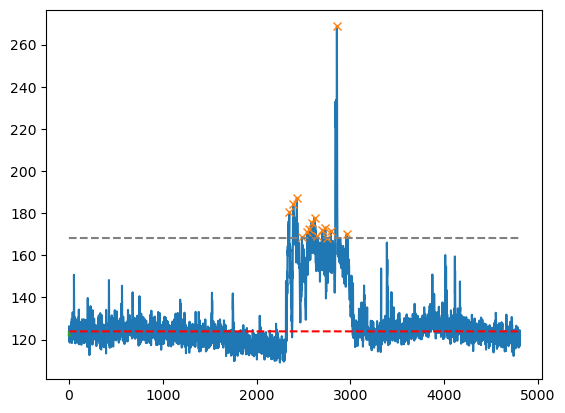

368
the peak time stamps are :[1456 3607]
the peak returns to baseline at frame: [1464, 3629]
the decay time in seconds for each peak is: [0.4, 1.1]
the amplitude of each peak is: [27.630554 31.79602 ]


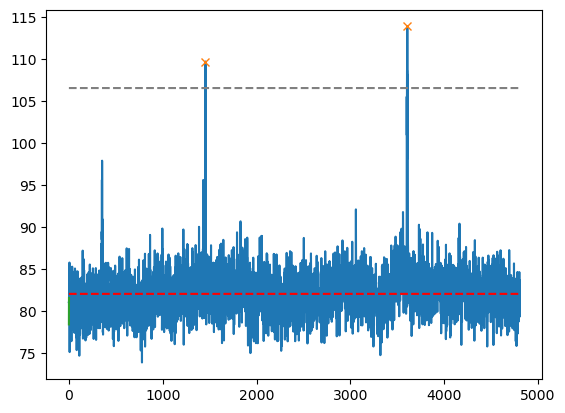

369
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


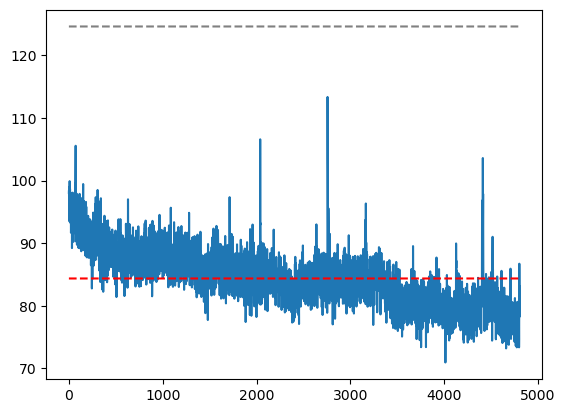

370
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


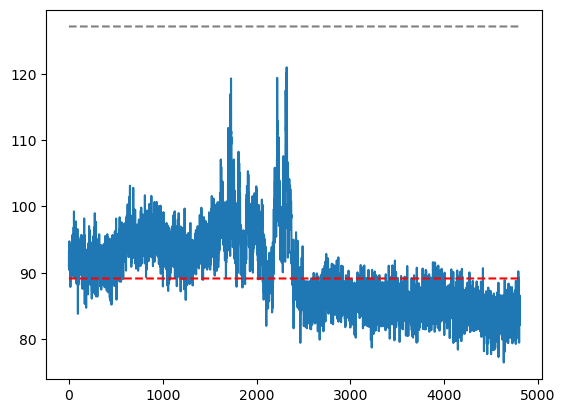

371
the peak time stamps are :[ 145 1856]
the peak returns to baseline at frame: [160, 1874]
the decay time in seconds for each peak is: [0.75, 0.9]
the amplitude of each peak is: [132.62747 125.31229]


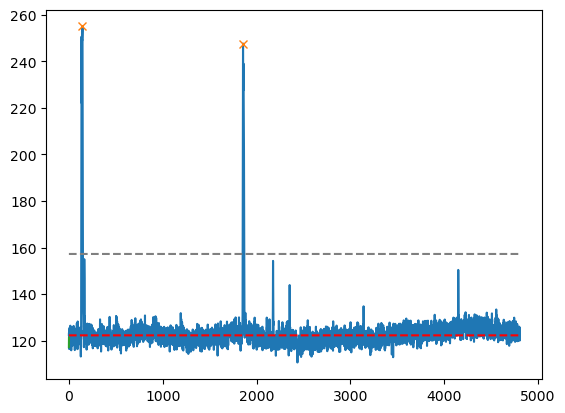

372
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


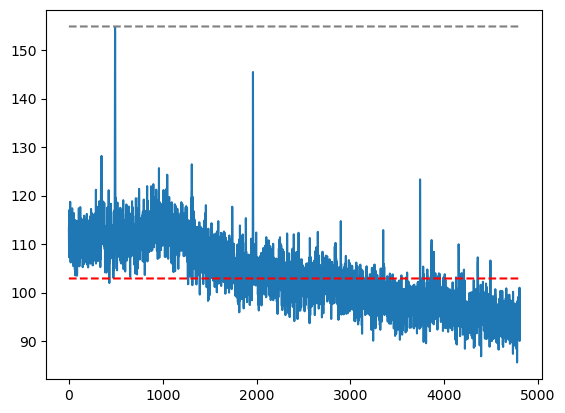

373
the peak time stamps are :[ 494 1123 1445]
the peak returns to baseline at frame: [512, 1138, 1494]
the decay time in seconds for each peak is: [0.9, 0.75, 2.45]
the amplitude of each peak is: [106.624374  43.91269   54.17816 ]


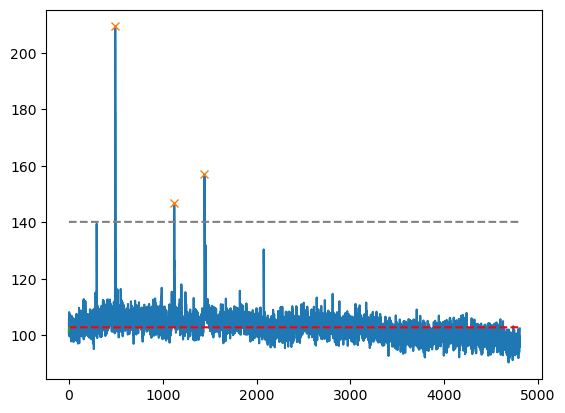

374
the peak time stamps are :[676]
the peak returns to baseline at frame: [721]
the decay time in seconds for each peak is: [2.25]
the amplitude of each peak is: [42.90866]


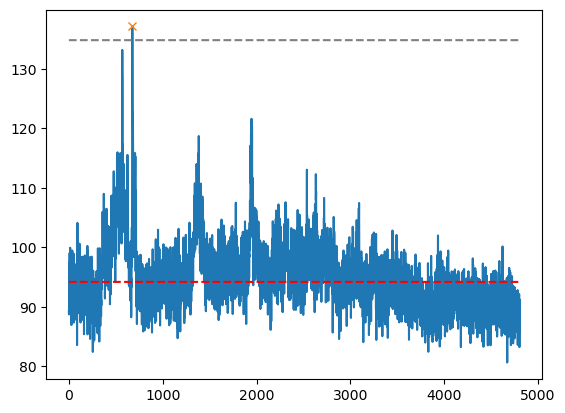

375
the peak time stamps are :[1310]
the peak returns to baseline at frame: [1331]
the decay time in seconds for each peak is: [1.05]
the amplitude of each peak is: [29.559479]


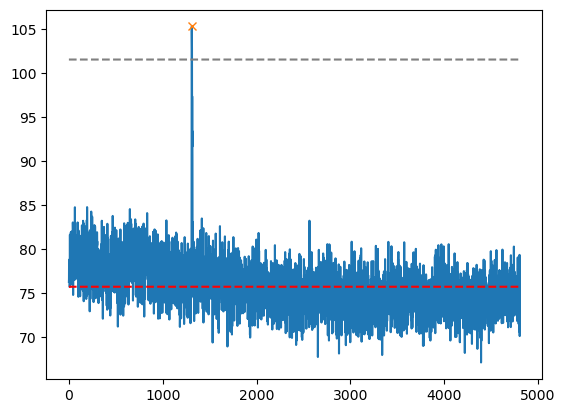

376
the peak time stamps are :[156 754 898]
the peak returns to baseline at frame: [1275, 1275, 1275]
the decay time in seconds for each peak is: [55.95, 26.05, 18.85]
the amplitude of each peak is: [131.39954   81.03572   44.630035]


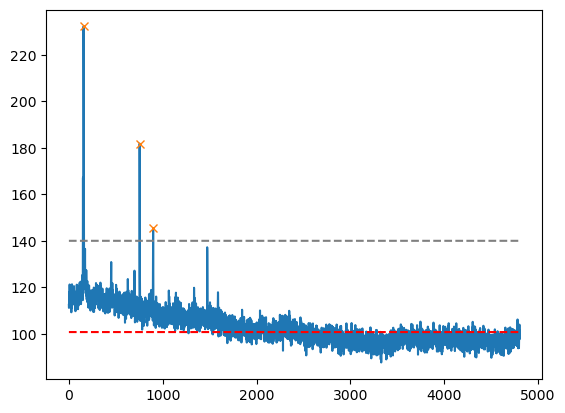

377
the peak time stamps are :[1294 1554 1857 1991 2133 2198 4685]
the peak returns to baseline at frame: [1317, 1568, 1867, 2008, 2152, 2207, 4727]
the decay time in seconds for each peak is: [1.15, 0.7, 0.5, 0.85, 0.95, 0.45, 2.1]
the amplitude of each peak is: [96.95975  40.020874 36.51184  66.86438  47.78253  48.496597 52.933823]


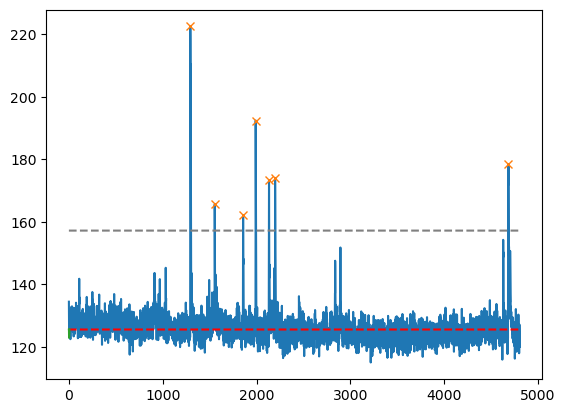

378
the peak time stamps are :[2188 2759 2870 2915 3042 3238 4804]
the peak returns to baseline at frame: [2255, 2767, 2894, 2919, 3050, 3251]
the decay time in seconds for each peak is: [3.35, 0.4, 1.2, 0.2, 0.4, 0.65]
the amplitude of each peak is: [126.38042   76.90732   46.693054  40.871063  64.57823  116.06081
  39.50522 ]


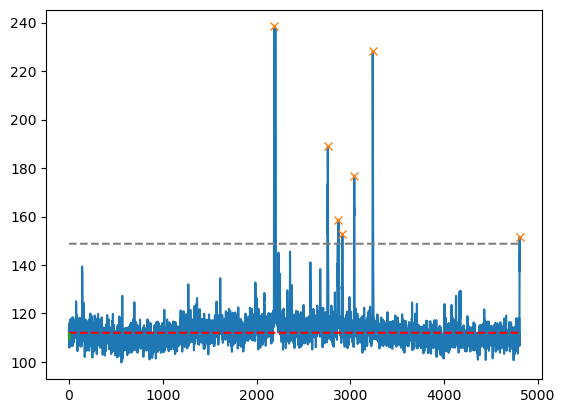

379
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


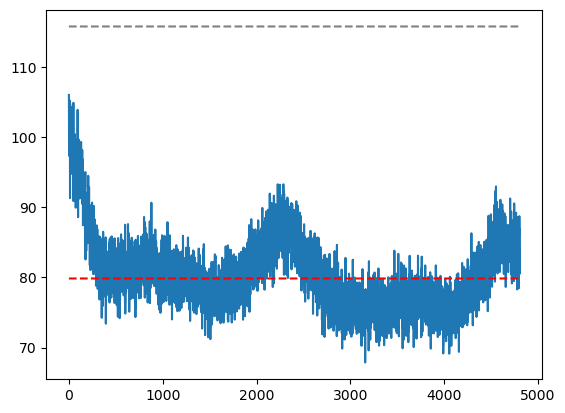

380
the peak time stamps are :[3534 3964]
the peak returns to baseline at frame: [3541, 3981]
the decay time in seconds for each peak is: [0.35, 0.85]
the amplitude of each peak is: [67.05174 57.78087]


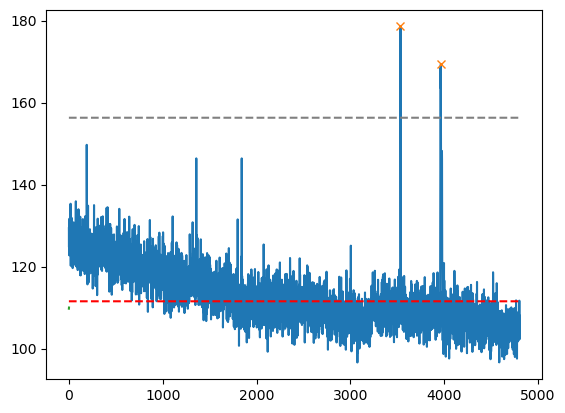

381
the peak time stamps are :[ 110  589 1995 4243]
the peak returns to baseline at frame: [133, 595, 2010, 4250]
the decay time in seconds for each peak is: [1.15, 0.3, 0.75, 0.35]
the amplitude of each peak is: [35.93788  38.66844  89.48872  31.419464]


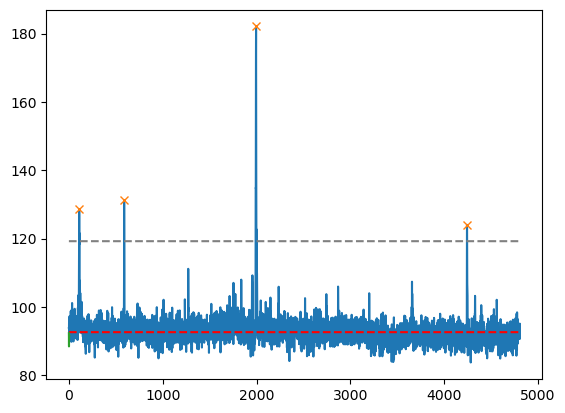

382
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


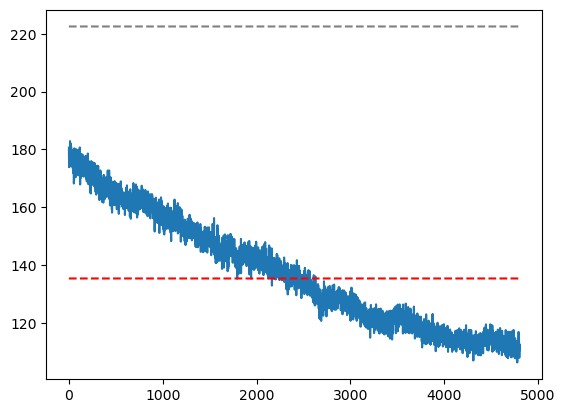

383
the peak time stamps are :[  91  114  659 1757]
the peak returns to baseline at frame: [147, 147, 678, 1770]
the decay time in seconds for each peak is: [2.8, 1.65, 0.95, 0.65]
the amplitude of each peak is: [ 59.644302  86.68149  111.906815  44.781754]


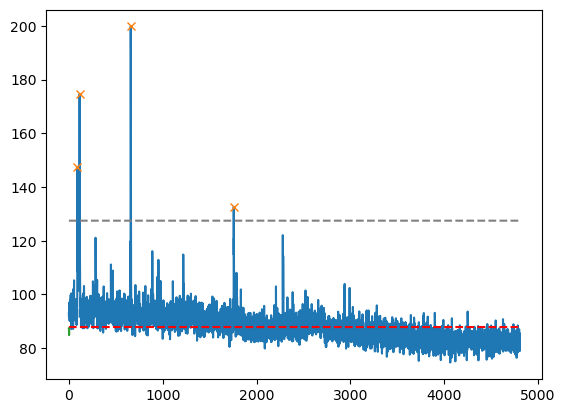

384
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


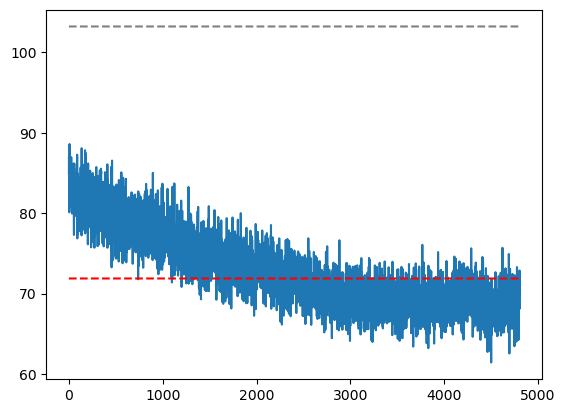

385
the peak time stamps are :[  42  383  624  664 1296 1970 2076 2435 2489]
the peak returns to baseline at frame: [64, 387, 630, 667, 1303, 1980, 2089, 2451, 2500]
the decay time in seconds for each peak is: [1.1, 0.2, 0.3, 0.15, 0.35, 0.5, 0.65, 0.8, 0.55]
the amplitude of each peak is: [64.05481  23.130203 27.206955 20.149323 21.825806 25.349884 19.038223
 52.531937 32.086105]


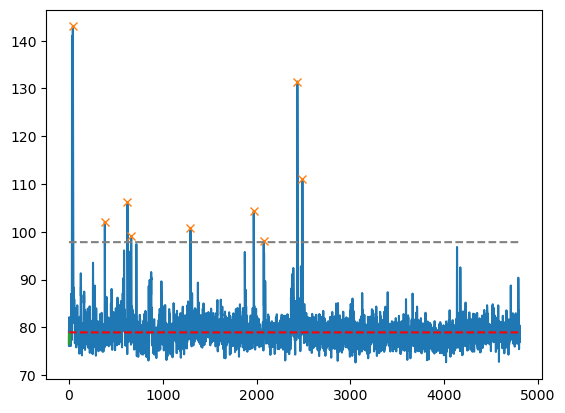

386
the peak time stamps are :[1903 4457]
the peak returns to baseline at frame: [1914, 4473]
the decay time in seconds for each peak is: [0.55, 0.8]
the amplitude of each peak is: [48.997025 66.50372 ]


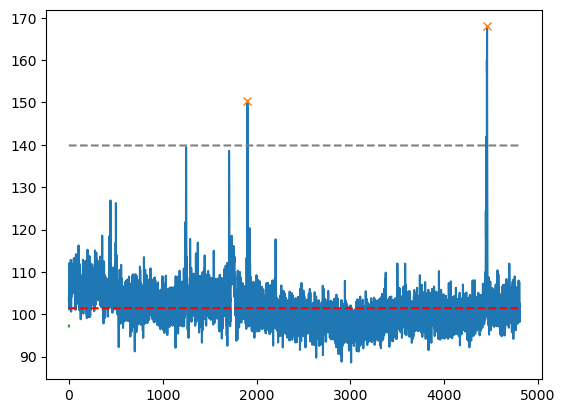

387
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


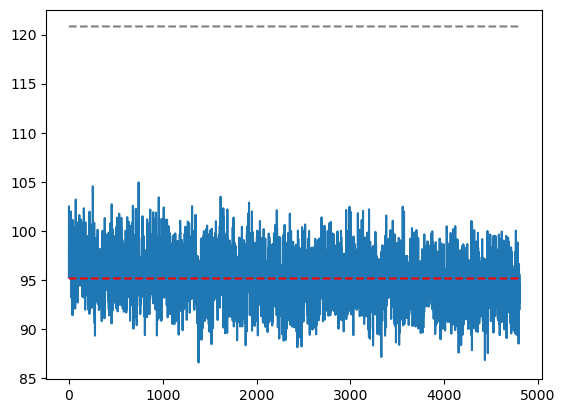

388
the peak time stamps are :[1937 1982 2371 2515 2599 3826]
the peak returns to baseline at frame: [1945, 1987, 2376, 2528, 2604, 3839]
the decay time in seconds for each peak is: [0.4, 0.25, 0.25, 0.65, 0.25, 0.65]
the amplitude of each peak is: [114.26524 112.94255 113.62164 127.42554 111.87622 100.19002]


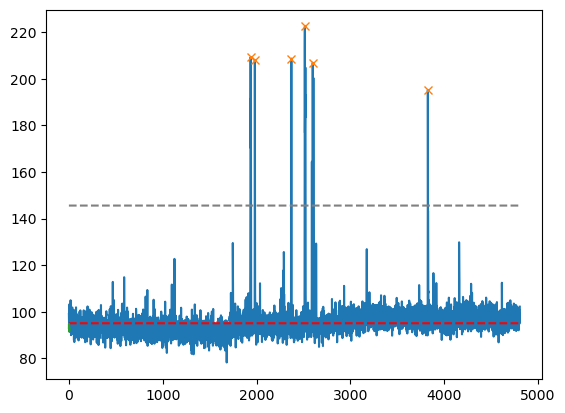

389
the peak time stamps are :[ 189 1288 3533 3962]
the peak returns to baseline at frame: [201, 1292, 3543, 3984]
the decay time in seconds for each peak is: [0.6, 0.2, 0.5, 1.1]
the amplitude of each peak is: [ 52.655563  52.357803  83.4651   101.4814  ]


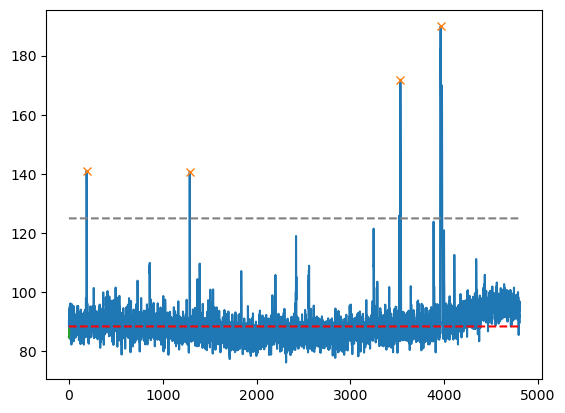

390
the peak time stamps are :[ 110  133 2555]
the peak returns to baseline at frame: [124, 141, 2559]
the decay time in seconds for each peak is: [0.7, 0.4, 0.2]
the amplitude of each peak is: [135.38446   40.887665  53.096115]


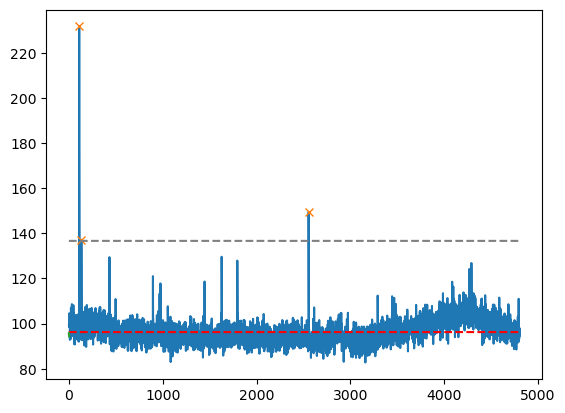

391
the peak time stamps are :[  63   85  435  591  826 1008 1813 1994 2194 2237 2407 2448 3045 3561
 3595 4516]
the peak returns to baseline at frame: [109, 109, 439, 596, 840, 1020, 1822, 2006, 2202, 2252, 2415, 2464, 3062, 3608, 3608, 4520]
the decay time in seconds for each peak is: [2.3, 1.2, 0.2, 0.25, 0.7, 0.6, 0.45, 0.6, 0.4, 0.75, 0.4, 0.8, 0.85, 2.35, 0.65, 0.2]
the amplitude of each peak is: [28.102814 31.402893 29.064865 41.876648 32.19153  49.522507 27.687332
 26.872955 27.823898 52.410065 35.45926  56.4124   34.01541  29.235596
 41.573532 24.45781 ]


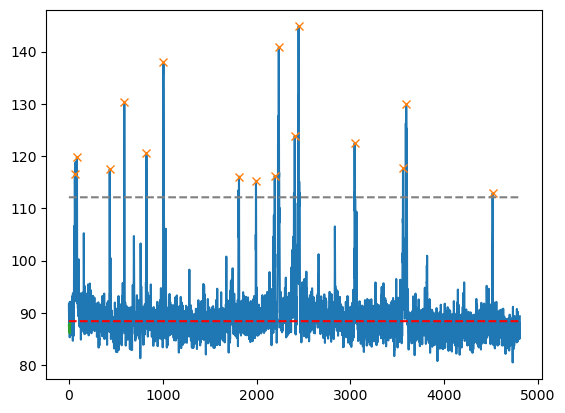

392
the peak time stamps are :[335 597]
the peak returns to baseline at frame: [347, 606]
the decay time in seconds for each peak is: [0.6, 0.45]
the amplitude of each peak is: [ 80.65965  102.894745]


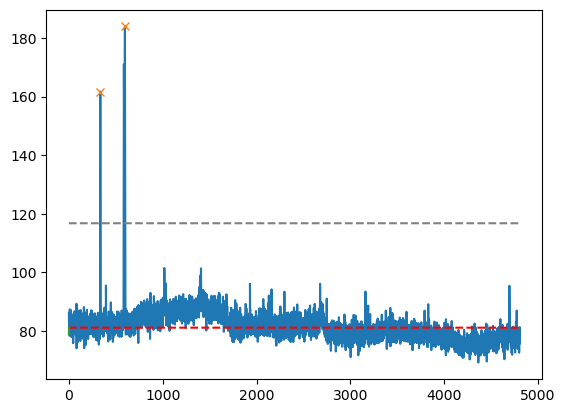

393
the peak time stamps are :[ 154  184 1260 1877 2203]
the peak returns to baseline at frame: [161, 192, 1270, 1884, 2216]
the decay time in seconds for each peak is: [0.35, 0.4, 0.5, 0.35, 0.65]
the amplitude of each peak is: [66.294525 68.91724  50.75586  63.78099  86.7074  ]


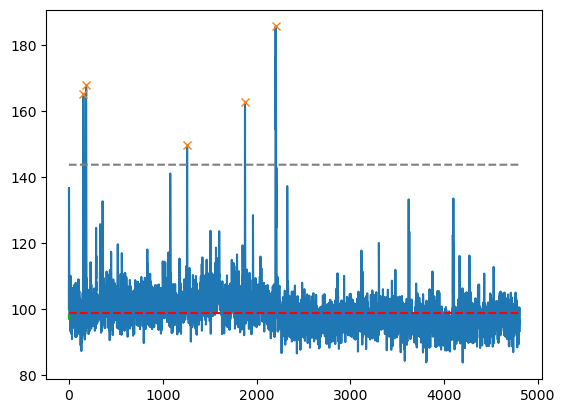

394
the peak time stamps are :[ 945 2609]
the peak returns to baseline at frame: [1207, 2624]
the decay time in seconds for each peak is: [13.1, 0.75]
the amplitude of each peak is: [49.38025 63.32637]


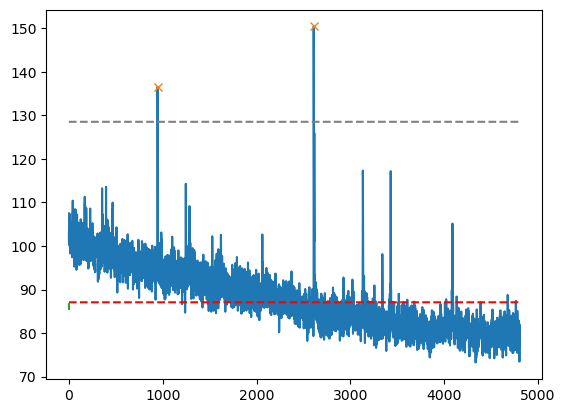

395
the peak time stamps are :[2095 4407]
the peak returns to baseline at frame: [2108, 4429]
the decay time in seconds for each peak is: [0.65, 1.1]
the amplitude of each peak is: [47.00145  34.042297]


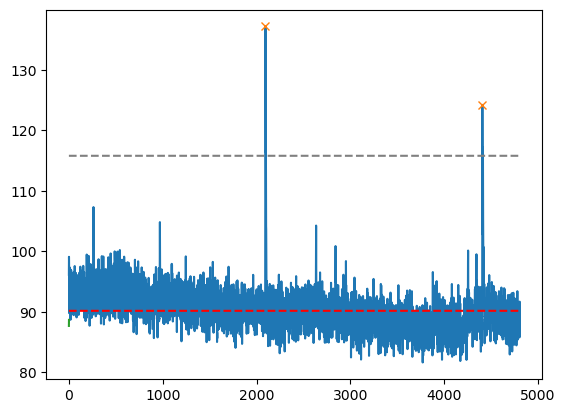

396
the peak time stamps are :[ 232  373  990 3533]
the peak returns to baseline at frame: [279, 547, 1022, 3544]
the decay time in seconds for each peak is: [2.35, 8.7, 1.6, 0.55]
the amplitude of each peak is: [75.47861  64.17464  48.942505 50.776382]


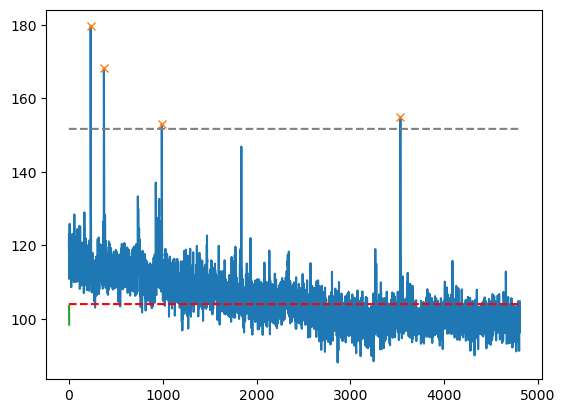

397
the peak time stamps are :[2349 2400 2430 2454 2602 2628 2649 2688 2711 2735 2775 2795 2819 2839
 2864 2885 2907 2930 2971]
the peak returns to baseline at frame: [3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032, 3032]
the decay time in seconds for each peak is: [34.15, 31.6, 30.1, 28.9, 21.5, 20.2, 19.15, 17.2, 16.05, 14.85, 12.85, 11.85, 10.65, 9.65, 8.4, 7.35, 6.25, 5.1, 3.05]
the amplitude of each peak is: [ 96.708664  67.73738  157.83907   35.43242  104.06767  110.3065
  50.416046  78.01788  133.28975   42.544464  50.4252   116.411514
 141.7074    44.287704  40.70331   48.37639   74.03584   35.640152
  65.29373 ]


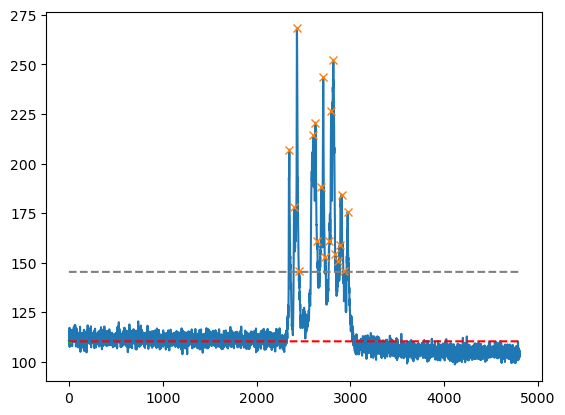

398
the peak time stamps are :[ 121  237  373  611  636  679  775 1228]
the peak returns to baseline at frame: [214, 434, 434, 652, 652, 727, 789, 1233]
the decay time in seconds for each peak is: [4.65, 9.85, 3.05, 2.05, 0.8, 2.4, 0.7, 0.25]
the amplitude of each peak is: [ 52.512848  51.783554 116.849075  67.9178   108.3217    80.22635
  47.955948  35.58351 ]


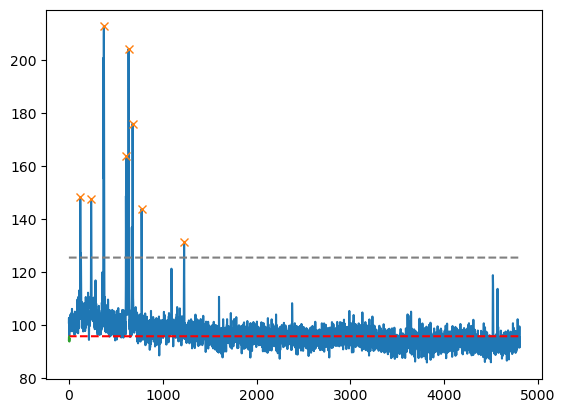

399
the peak time stamps are :[502 747]
the peak returns to baseline at frame: [517, 756]
the decay time in seconds for each peak is: [0.75, 0.45]
the amplitude of each peak is: [209.73955 119.39229]


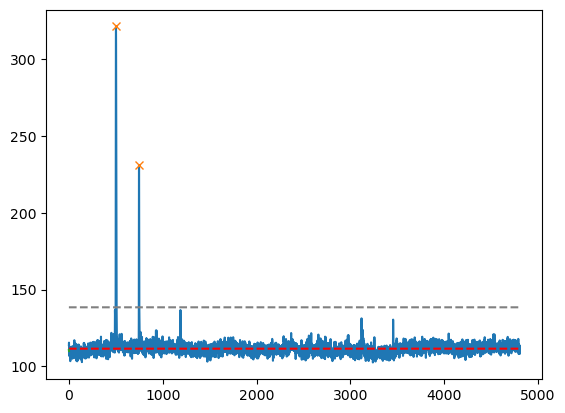

400
the peak time stamps are :[2669 2689 2709 2731]
the peak returns to baseline at frame: [2722, 2722, 2722, 2739]
the decay time in seconds for each peak is: [2.65, 1.65, 0.65, 0.4]
the amplitude of each peak is: [49.29738  58.195465 85.33922  32.80951 ]


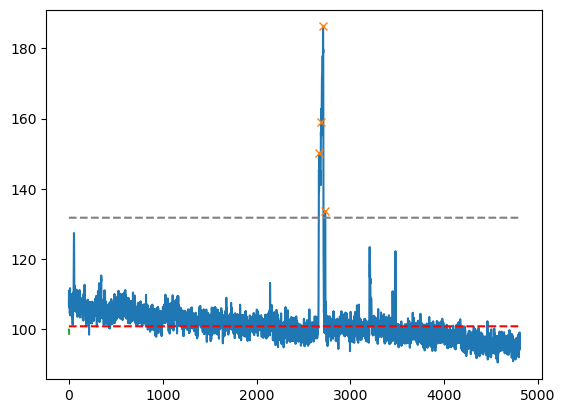

401
the peak time stamps are :[297 841]
the peak returns to baseline at frame: [460, 858]
the decay time in seconds for each peak is: [8.15, 0.85]
the amplitude of each peak is: [88.313934 87.34335 ]


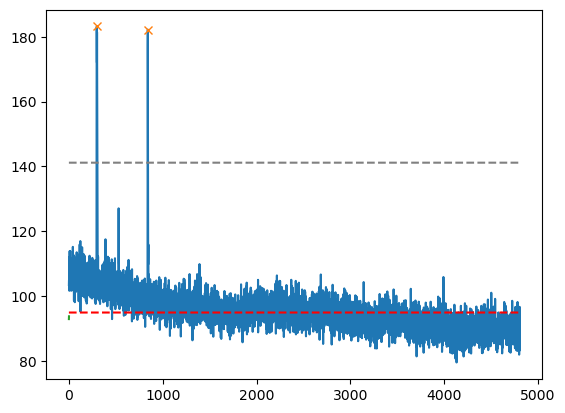

402
the peak time stamps are :[1659 2249 2276 2591 4098]
the peak returns to baseline at frame: [1677, 2256, 2283, 2597, 4102]
the decay time in seconds for each peak is: [0.9, 0.35, 0.35, 0.3, 0.2]
the amplitude of each peak is: [107.48317   63.625     90.006195  82.00276   50.185944]


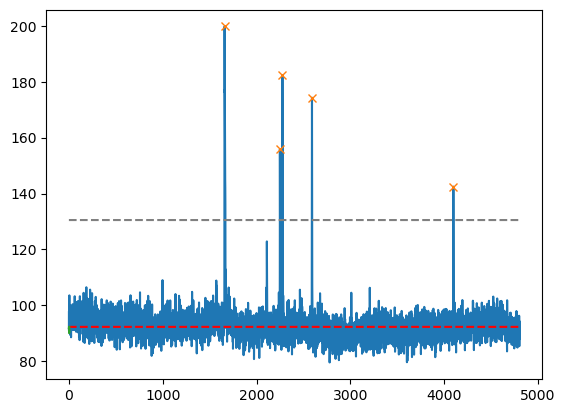

403
the peak time stamps are :[ 89 187]
the peak returns to baseline at frame: [108, 201]
the decay time in seconds for each peak is: [0.95, 0.7]
the amplitude of each peak is: [ 53.23419 113.3902 ]


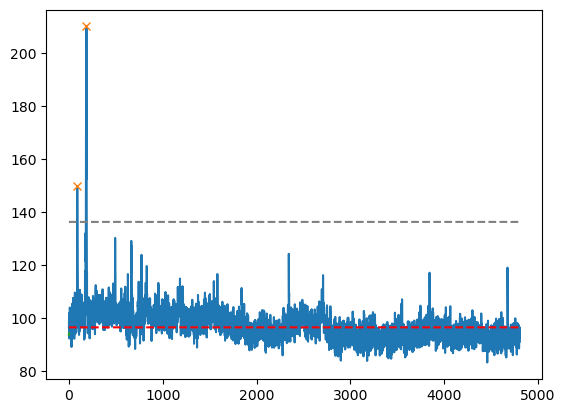

404
the peak time stamps are :[528]
the peak returns to baseline at frame: [544]
the decay time in seconds for each peak is: [0.8]
the amplitude of each peak is: [46.294907]


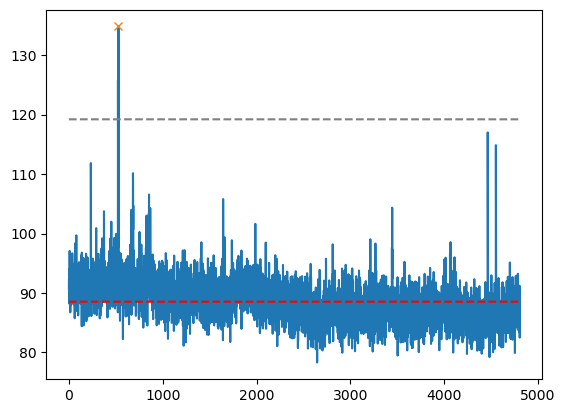

405
the peak time stamps are :[1208 1235]
the peak returns to baseline at frame: [1217, 1252]
the decay time in seconds for each peak is: [0.45, 0.85]
the amplitude of each peak is: [ 46.89943 153.6288 ]


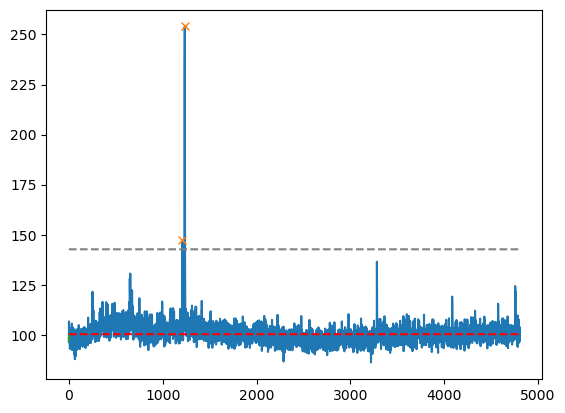

406
the peak time stamps are :[4328 4351 4390 4420 4450 4475 4500 4524 4547 4684 4746 4769]
the peak returns to baseline at frame: [4606, 4606, 4606, 4606, 4606, 4606, 4606, 4606, 4606]
the decay time in seconds for each peak is: [13.9, 12.75, 10.8, 9.3, 7.8, 6.55, 5.3, 4.1, 2.95]
the amplitude of each peak is: [26.843628 30.69992  38.66086  26.563675 25.892776 34.203476 26.419205
 31.768356 23.933624 26.280258 23.350815 29.20372 ]


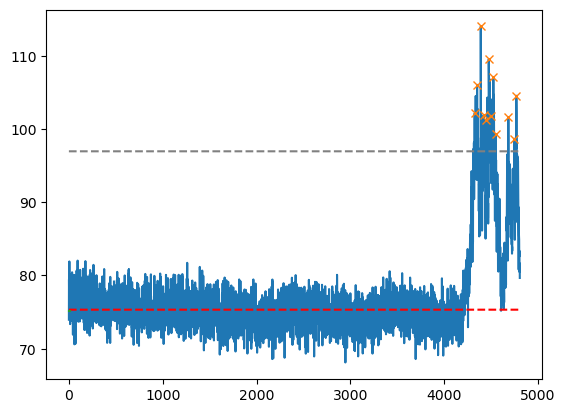

407
the peak time stamps are :[  79  398  600  894 2505]
the peak returns to baseline at frame: [96, 412, 617, 900, 2518]
the decay time in seconds for each peak is: [0.85, 0.7, 0.85, 0.3, 0.65]
the amplitude of each peak is: [51.37314  47.251648 62.11992  57.6521   81.242874]


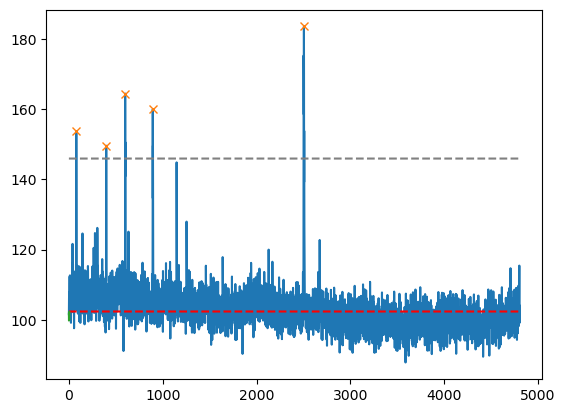

408
the peak time stamps are :[ 326 1231 1580 3875]
the peak returns to baseline at frame: [358, 1240, 1592, 3881]
the decay time in seconds for each peak is: [1.6, 0.45, 0.6, 0.3]
the amplitude of each peak is: [50.887573 40.603333 57.854492 37.409576]


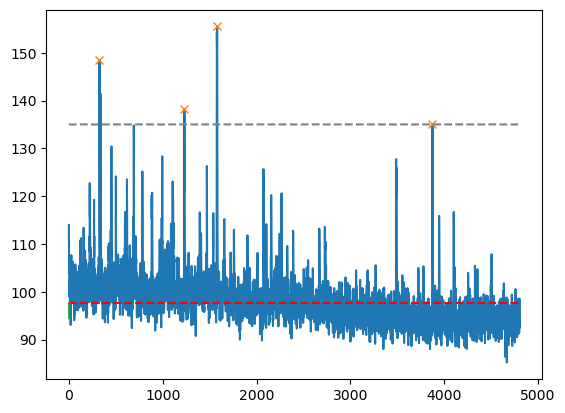

409
the peak time stamps are :[3290]
the peak returns to baseline at frame: [3305]
the decay time in seconds for each peak is: [0.75]
the amplitude of each peak is: [60.252655]


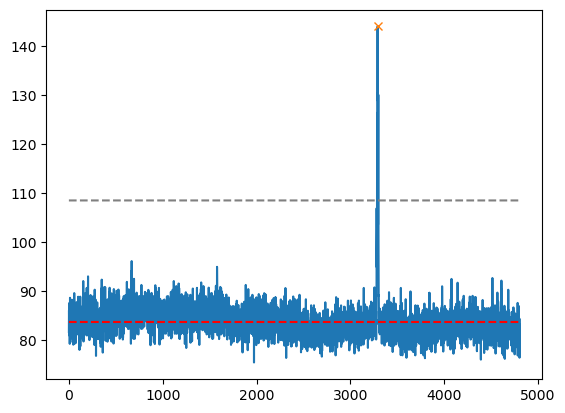

410
the peak time stamps are :[1491]
the peak returns to baseline at frame: [1503]
the decay time in seconds for each peak is: [0.6]
the amplitude of each peak is: [29.770584]


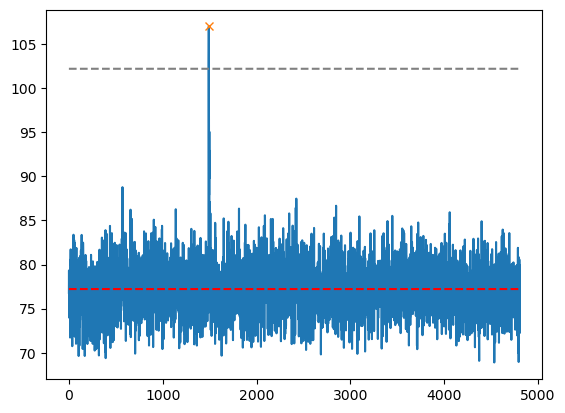

411
the peak time stamps are :[ 896 3291]
the peak returns to baseline at frame: [900, 3325]
the decay time in seconds for each peak is: [0.2, 1.7]
the amplitude of each peak is: [37.96985  99.743774]


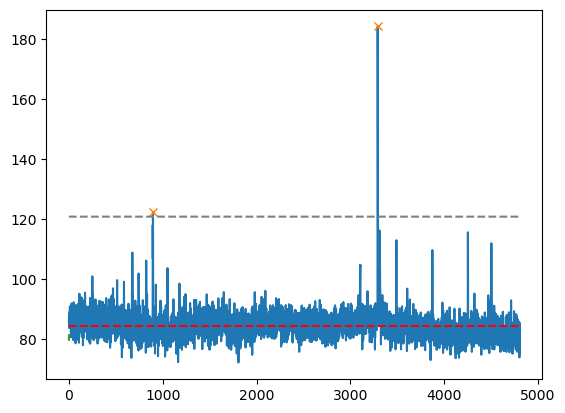

412
the peak time stamps are :[ 648 2583 4682]
the peak returns to baseline at frame: [653, 2595, 4697]
the decay time in seconds for each peak is: [0.25, 0.6, 0.75]
the amplitude of each peak is: [ 47.652573  83.695175 133.70586 ]


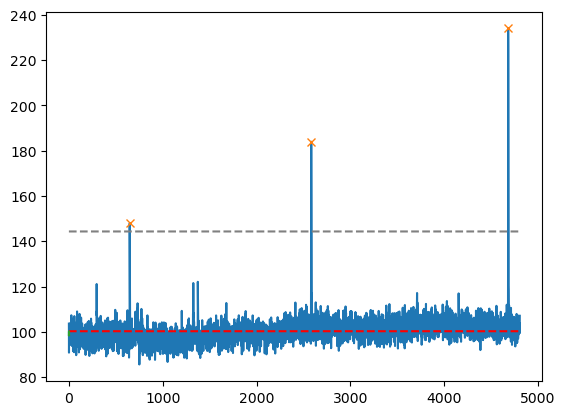

413
the peak time stamps are :[2103 2321 4346]
the peak returns to baseline at frame: [2114, 2327, 4351]
the decay time in seconds for each peak is: [0.55, 0.3, 0.25]
the amplitude of each peak is: [42.46364 44.0101  40.95935]


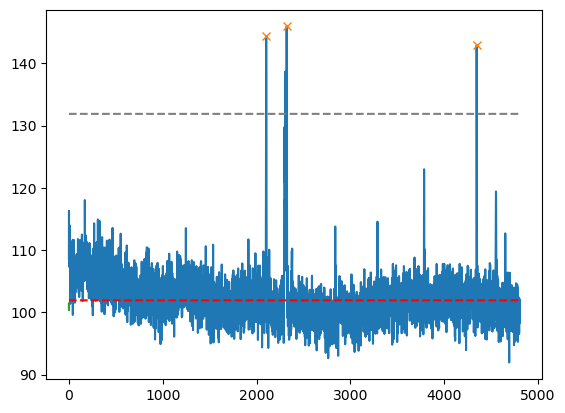

414
the peak time stamps are :[ 277 2417]
the peak returns to baseline at frame: [282, 2422]
the decay time in seconds for each peak is: [0.25, 0.25]
the amplitude of each peak is: [50.60913 71.83412]


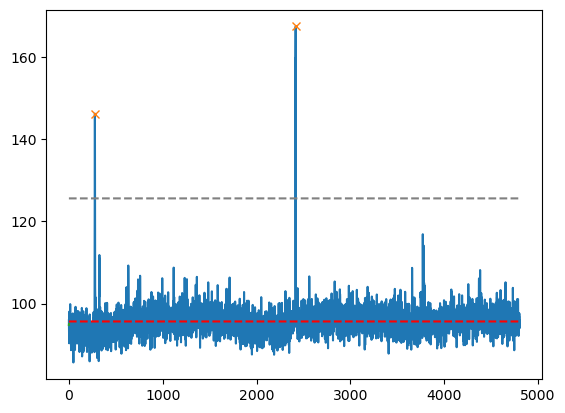

415
the peak time stamps are :[4551]
the peak returns to baseline at frame: [4559]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [76.2422]


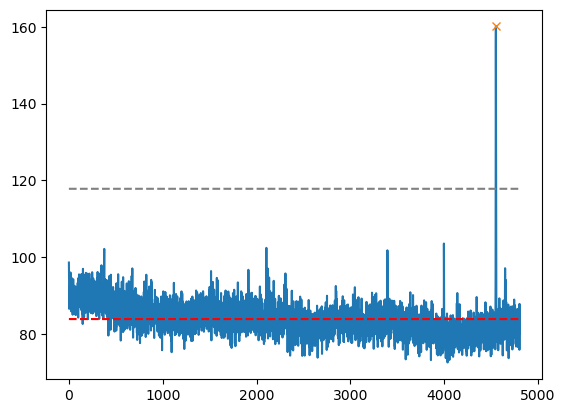

416
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


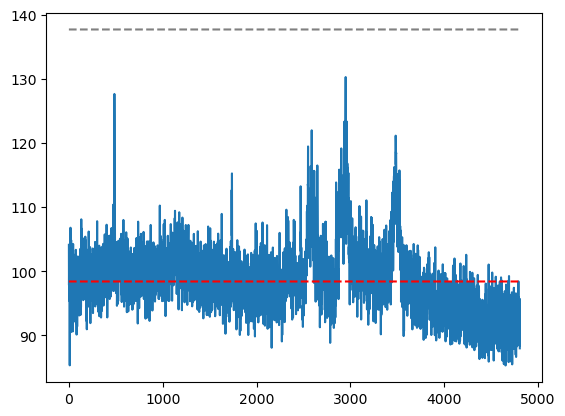

417
the peak time stamps are :[  20  128  167  320  347  549  609  813  968 1123 1145 1189 1329 1351
 1437 1585 1871 2134 2236 2291 2316 2355 2398 2429 2510 2553 2599 2685
 2811 2845 3001 3032 3068 3097 3142 3194 3343 3530 3557 3591 3709 3762
 3806 3999 4331 4426 4454 4689]
the peak returns to baseline at frame: [24, 132, 180, 324, 350, 553, 613, 819, 972, 1128, 1150, 1194, 1335, 1355, 1445, 1595, 1875, 2140, 2241, 2297, 2320, 2364, 2404, 2435, 2513, 2568, 2604, 2691, 2817, 2854, 3006, 3048, 3119, 3119, 3152, 3209, 3350, 3537, 3577, 3598, 3714, 3766, 3816, 4013, 4349, 4477, 4477, 4707]
the decay time in seconds for each peak is: [0.2, 0.2, 0.65, 0.2, 0.15, 0.2, 0.2, 0.3, 0.2, 0.25, 0.25, 0.25, 0.3, 0.2, 0.4, 0.5, 0.2, 0.3, 0.25, 0.3, 0.2, 0.45, 0.3, 0.3, 0.15, 0.75, 0.25, 0.3, 0.3, 0.45, 0.25, 0.8, 2.55, 1.1, 0.5, 0.75, 0.35, 0.35, 1.0, 0.35, 0.25, 0.2, 0.5, 0.7, 0.9, 2.55, 1.15, 0.9]
the amplitude of each peak is: [ 53.3367    59.49109   54.557953  56.39528   45.50096   46.21649
  77.

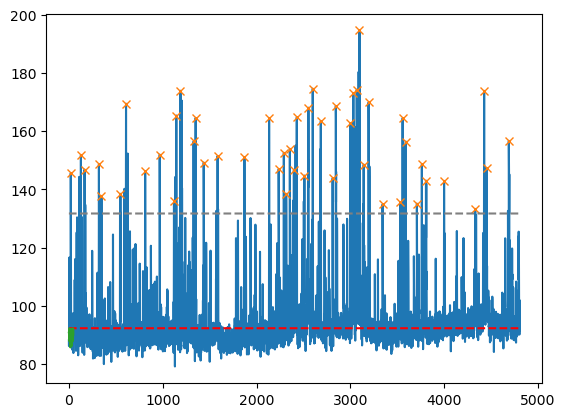

418
the peak time stamps are :[2733 3133 3254 3352]
the peak returns to baseline at frame: [2742, 3148, 3259, 3364]
the decay time in seconds for each peak is: [0.45, 0.75, 0.25, 0.6]
the amplitude of each peak is: [ 92.63086  143.26051   56.046722  63.535736]


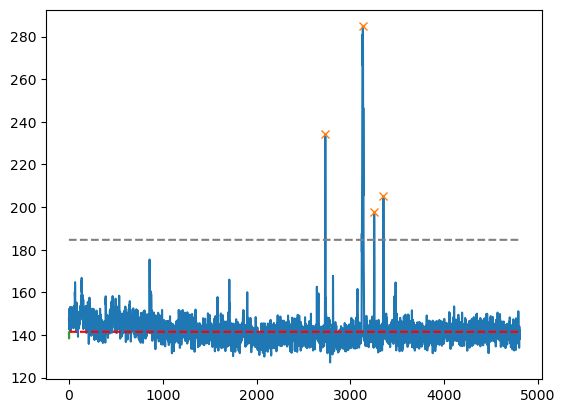

419
the peak time stamps are :[2108 3579 4176]
the peak returns to baseline at frame: [2114, 3588, 4184]
the decay time in seconds for each peak is: [0.3, 0.45, 0.4]
the amplitude of each peak is: [ 70.9651   122.78705   62.794556]


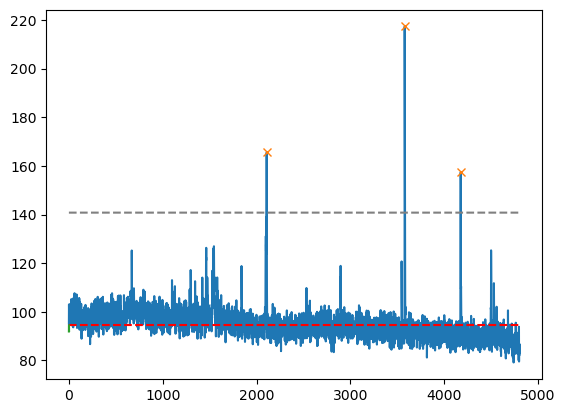

420
the peak time stamps are :[729]
the peak returns to baseline at frame: [748]
the decay time in seconds for each peak is: [0.95]
the amplitude of each peak is: [256.3543]


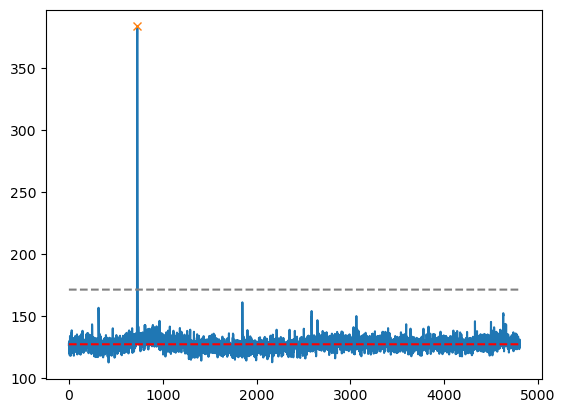

421
the peak time stamps are :[ 122  347  953  998 1059 2301 3813]
the peak returns to baseline at frame: [127, 366, 966, 1008, 1065, 2314, 3825]
the decay time in seconds for each peak is: [0.25, 0.95, 0.65, 0.5, 0.3, 0.65, 0.6]
the amplitude of each peak is: [49.068985 41.628998 75.1295   59.91017  40.58995  72.65529  37.646347]


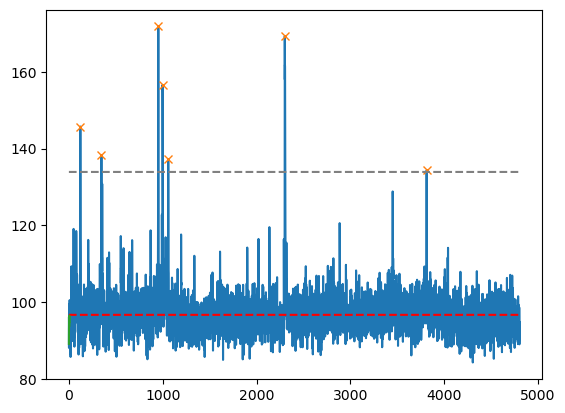

422
the peak time stamps are :[ 148  195  234 2182 2206 2259 2290 2310]
the peak returns to baseline at frame: [397, 397, 397, 2215, 2215, 2320, 2320, 2320]
the decay time in seconds for each peak is: [12.45, 10.1, 8.15, 1.65, 0.45, 3.05, 1.5, 0.5]
the amplitude of each peak is: [43.515213 47.44731  42.030273 46.382324 61.664246 87.821686 52.781845
 45.479767]


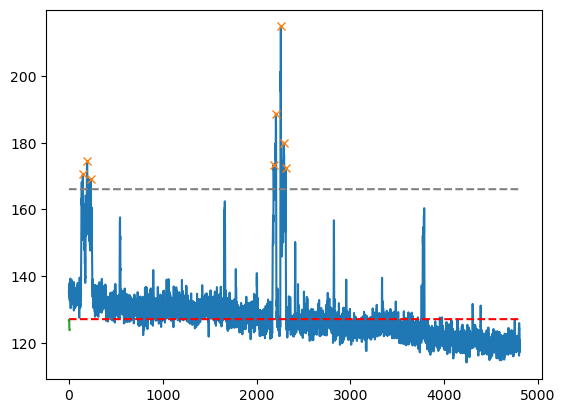

423
the peak time stamps are :[473 862]
the peak returns to baseline at frame: [480, 877]
the decay time in seconds for each peak is: [0.35, 0.75]
the amplitude of each peak is: [48.226593 89.049866]


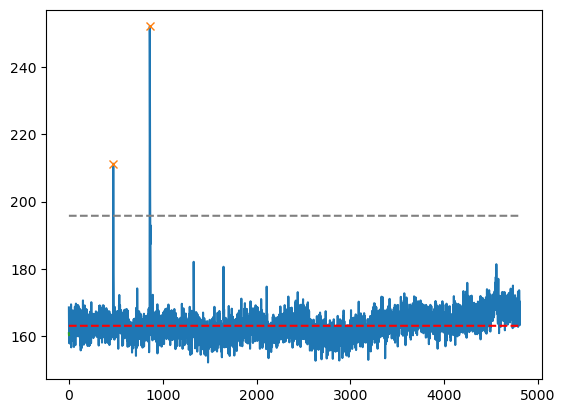

424
the peak time stamps are :[2255]
the peak returns to baseline at frame: [2314]
the decay time in seconds for each peak is: [2.95]
the amplitude of each peak is: [103.868286]


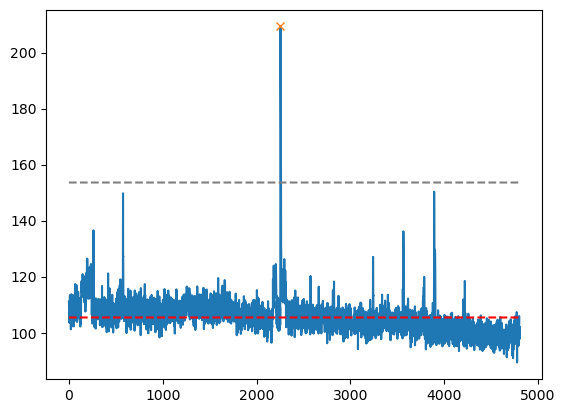

425
the peak time stamps are :[3073]
the peak returns to baseline at frame: [3081]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [84.06125]


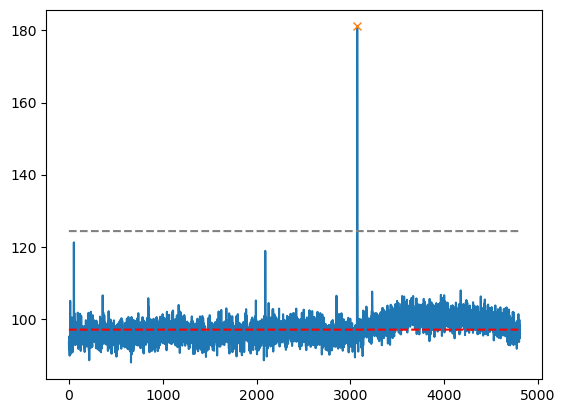

426
the peak time stamps are :[ 570 1166 1461 2942 3611]
the peak returns to baseline at frame: [581, 1176, 1471, 2956, 3627]
the decay time in seconds for each peak is: [0.55, 0.5, 0.5, 0.7, 0.8]
the amplitude of each peak is: [161.54283   87.7621    97.614136  36.879852 167.8704  ]


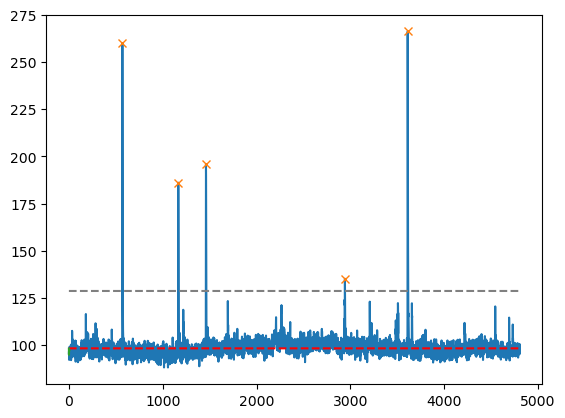

427
the peak time stamps are :[ 846 1576 1819 2834]
the peak returns to baseline at frame: [856, 1582, 1826, 2843]
the decay time in seconds for each peak is: [0.5, 0.3, 0.35, 0.45]
the amplitude of each peak is: [69.68526 67.65439 67.40175 49.90358]


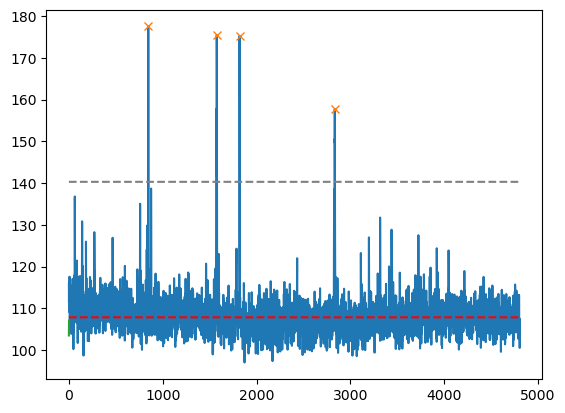

428
the peak time stamps are :[126 261 295]
the peak returns to baseline at frame: [141, 267, 307]
the decay time in seconds for each peak is: [0.75, 0.3, 0.6]
the amplitude of each peak is: [ 44.94699  78.14122 155.46948]


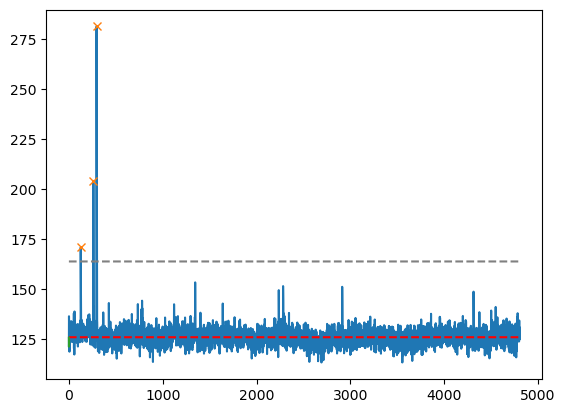

429
the peak time stamps are :[3471 3759]
the peak returns to baseline at frame: [3480, 3770]
the decay time in seconds for each peak is: [0.45, 0.55]
the amplitude of each peak is: [87.356125 53.962006]


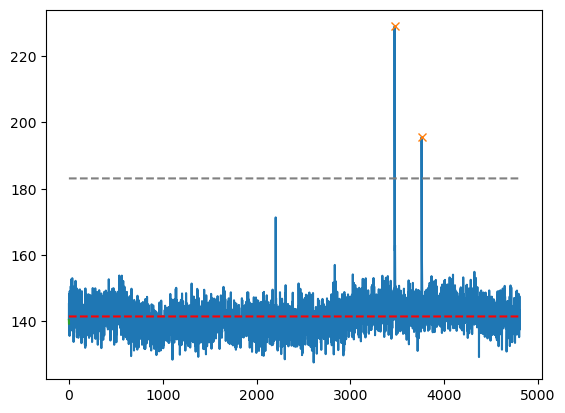

430
the peak time stamps are :[ 256 4451]
the peak returns to baseline at frame: [371, 4458]
the decay time in seconds for each peak is: [5.75, 0.35]
the amplitude of each peak is: [42.034256 46.073563]


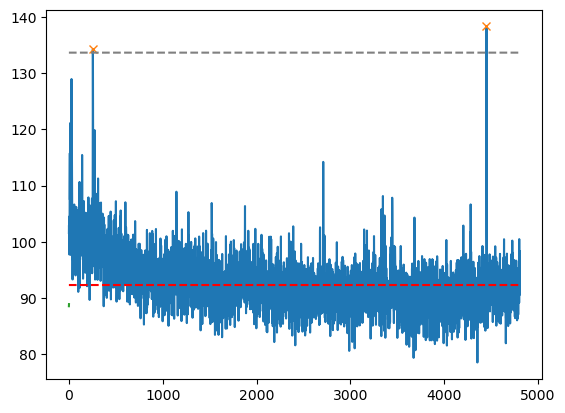

431
the peak time stamps are :[3851]
the peak returns to baseline at frame: [3867]
the decay time in seconds for each peak is: [0.8]
the amplitude of each peak is: [66.98622]


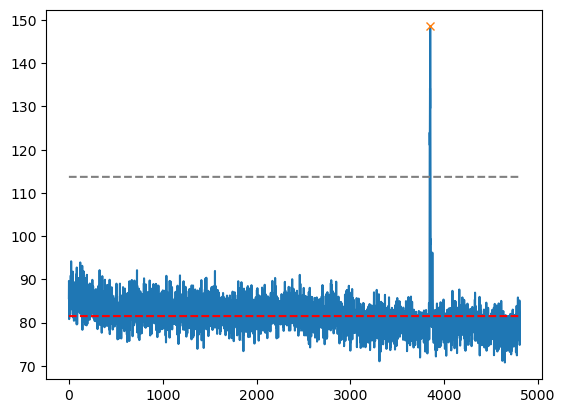

432
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


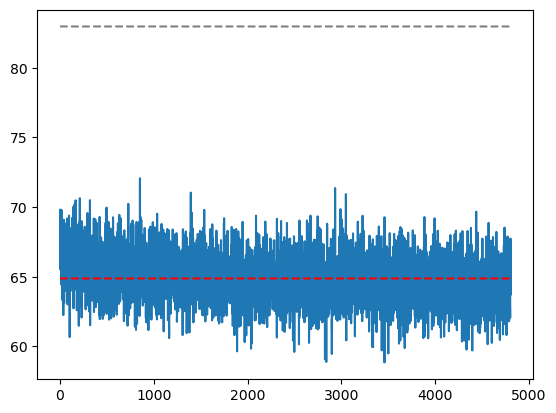

433
the peak time stamps are :[ 105 1016 1061 1106]
the peak returns to baseline at frame: [113, 1032, 1067, 1111]
the decay time in seconds for each peak is: [0.4, 0.8, 0.3, 0.25]
the amplitude of each peak is: [68.629974 84.07381  60.131363 77.58542 ]


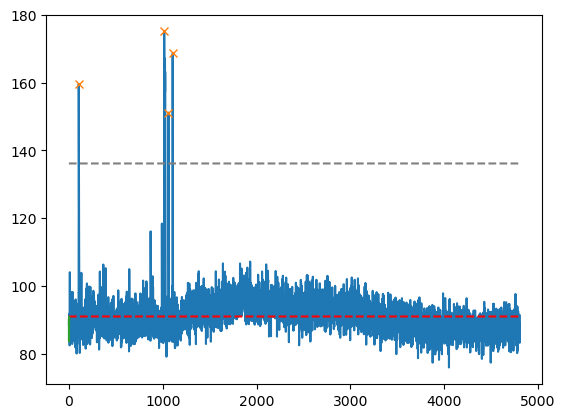

434
the peak time stamps are :[1946 2495 4008]
the peak returns to baseline at frame: [1953, 2505, 4030]
the decay time in seconds for each peak is: [0.35, 0.5, 1.1]
the amplitude of each peak is: [37.902588 99.81633  68.71147 ]


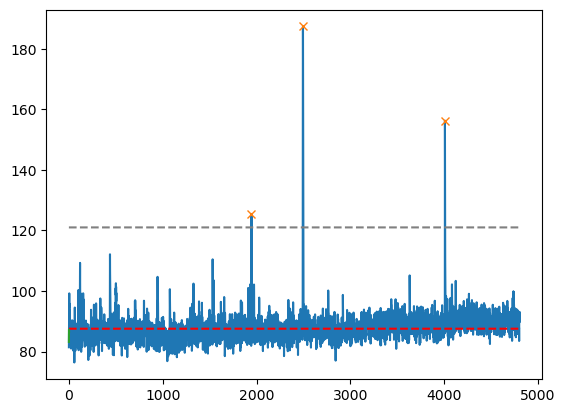

435
the peak time stamps are :[ 264  827 1065]
the peak returns to baseline at frame: [304, 841, 1074]
the decay time in seconds for each peak is: [2.0, 0.7, 0.45]
the amplitude of each peak is: [53.953964 52.712402 57.10141 ]


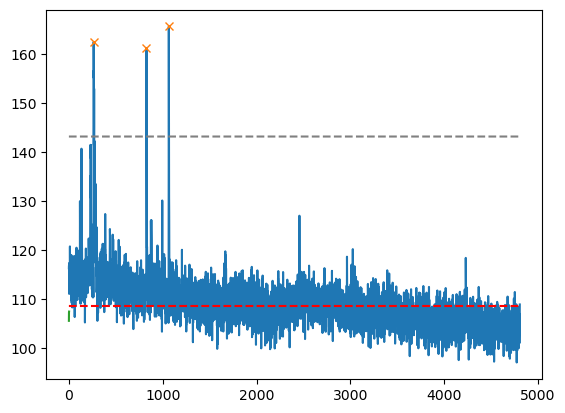

436
the peak time stamps are :[ 181 3880 4416]
the peak returns to baseline at frame: [191, 3888, 4430]
the decay time in seconds for each peak is: [0.5, 0.4, 0.7]
the amplitude of each peak is: [51.59529  76.08948  68.753784]


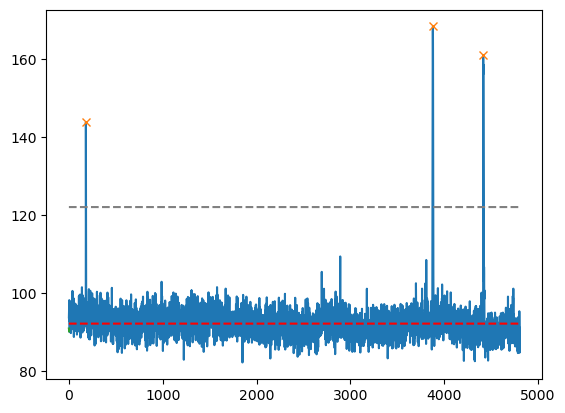

437
the peak time stamps are :[1241 3356]
the peak returns to baseline at frame: [1252, 3364]
the decay time in seconds for each peak is: [0.55, 0.4]
the amplitude of each peak is: [ 59.054993 120.01387 ]


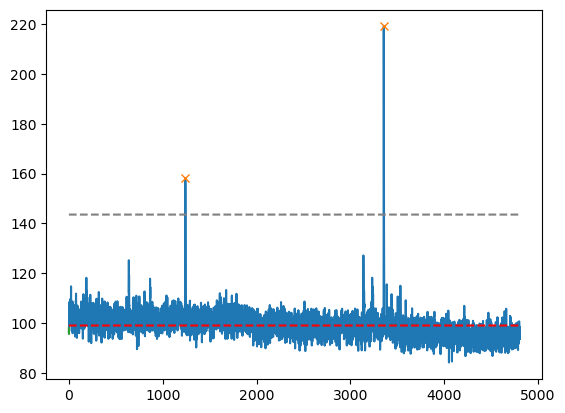

438
the peak time stamps are :[ 956 1177 1607]
the peak returns to baseline at frame: [967, 1192, 1626]
the decay time in seconds for each peak is: [0.55, 0.75, 0.95]
the amplitude of each peak is: [ 30.136398  97.34825  125.32411 ]


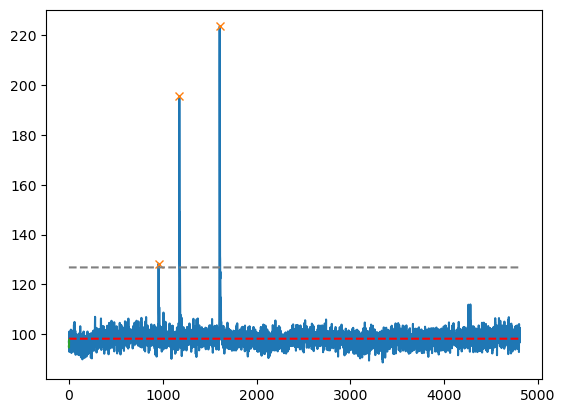

439
the peak time stamps are :[ 874 1514 2965]
the peak returns to baseline at frame: [885, 1521, 2973]
the decay time in seconds for each peak is: [0.55, 0.35, 0.4]
the amplitude of each peak is: [113.06099   42.608902  64.117966]


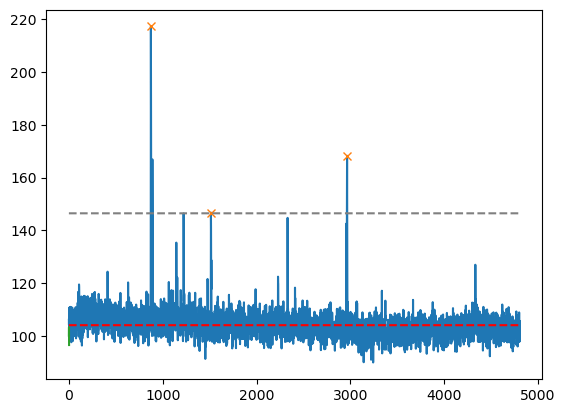

440
the peak time stamps are :[ 235  792  829 1147 1279 1873 2713 3008 3534 4476]
the peak returns to baseline at frame: [244, 802, 845, 1167, 1288, 1893, 2728, 3031, 3539, 4485]
the decay time in seconds for each peak is: [0.45, 0.5, 0.8, 1.0, 0.45, 1.0, 0.75, 1.15, 0.25, 0.45]
the amplitude of each peak is: [30.53334  29.718994 29.979095 77.24823  32.85504  47.309875 83.50218
 82.43884  43.98845  49.822403]


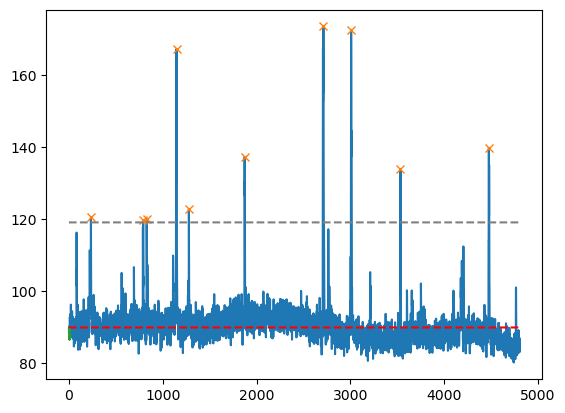

441
the peak time stamps are :[ 120  189  305 1196]
the peak returns to baseline at frame: [148, 203, 332, 1203]
the decay time in seconds for each peak is: [1.4, 0.7, 1.35, 0.35]
the amplitude of each peak is: [48.456512 45.360245 46.466965 40.45633 ]


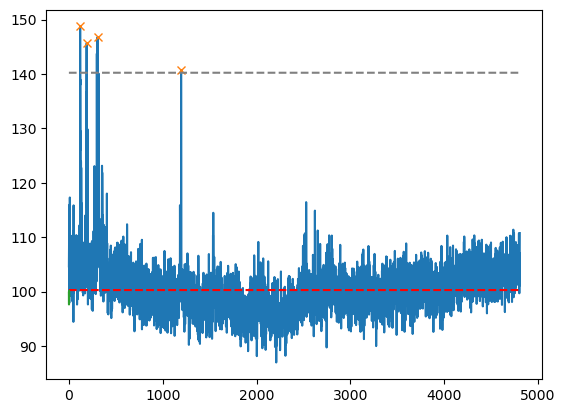

442
the peak time stamps are :[4588]
the peak returns to baseline at frame: [4603]
the decay time in seconds for each peak is: [0.75]
the amplitude of each peak is: [85.12775]


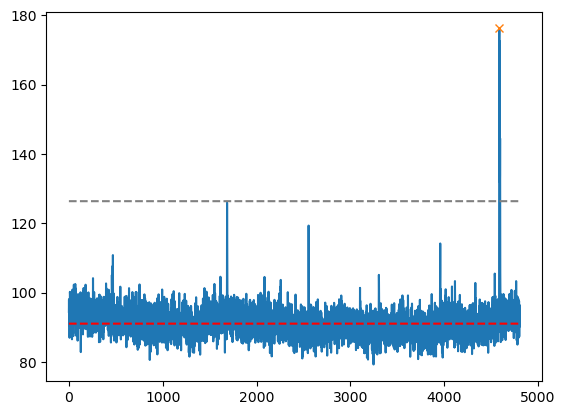

443
the peak time stamps are :[ 330  350  823 2231 4435]
the peak returns to baseline at frame: [399, 399, 845, 2245, 4444]
the decay time in seconds for each peak is: [3.45, 2.45, 1.1, 0.7, 0.45]
the amplitude of each peak is: [57.197586 33.71953  41.904617 37.40399  80.40898 ]


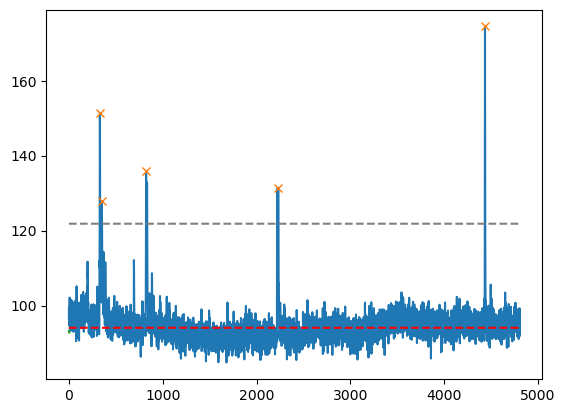

444
the peak time stamps are :[1502]
the peak returns to baseline at frame: [1515]
the decay time in seconds for each peak is: [0.65]
the amplitude of each peak is: [100.90178]


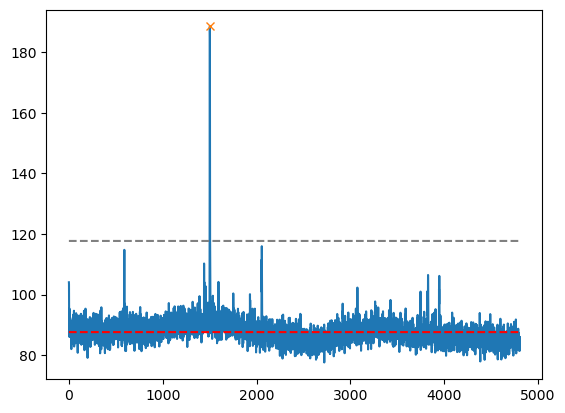

445
the peak time stamps are :[205]
the peak returns to baseline at frame: [214]
the decay time in seconds for each peak is: [0.45]
the amplitude of each peak is: [118.67729]


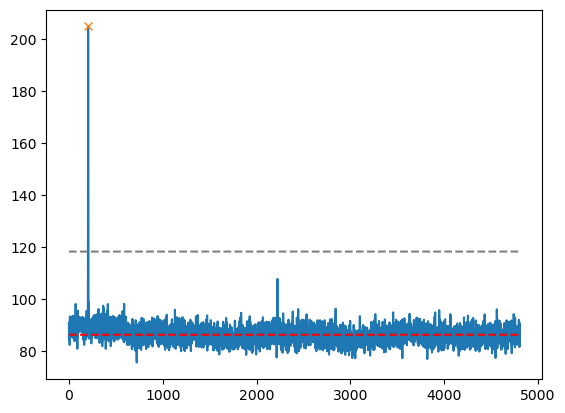

446
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


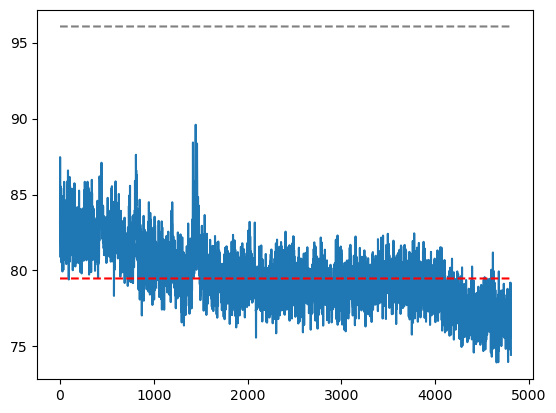

447
the peak time stamps are :[34]
the peak returns to baseline at frame: [234]
the decay time in seconds for each peak is: [10.0]
the amplitude of each peak is: [52.28073]


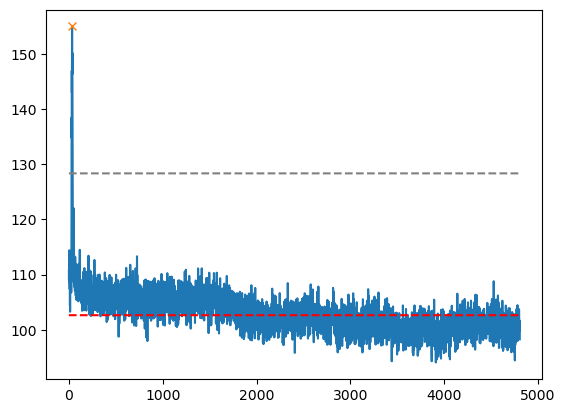

448
the peak time stamps are :[  12 4328]
the peak returns to baseline at frame: [258, 4336]
the decay time in seconds for each peak is: [12.3, 0.4]
the amplitude of each peak is: [41.26448 81.02315]


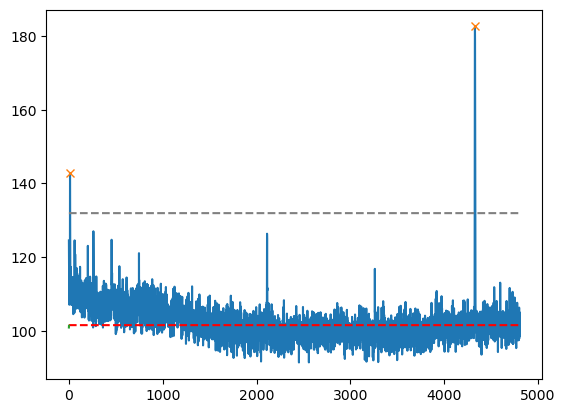

449
the peak time stamps are :[1592 1627 1694 1858 2354 2778 3295 3486 3816]
the peak returns to baseline at frame: [1614, 1644, 1703, 1869, 2385, 2808, 3325, 3510, 3854]
the decay time in seconds for each peak is: [1.1, 0.85, 0.45, 0.55, 1.55, 1.5, 1.5, 1.2, 1.9]
the amplitude of each peak is: [71.47975  35.024567 24.71045  32.07924  58.71599  63.90193  46.167557
 51.429153 46.47725 ]


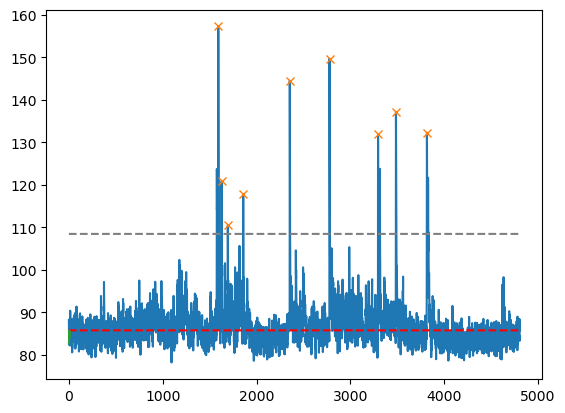

450
the peak time stamps are :[1769 2044 2070 4516]
the peak returns to baseline at frame: [1781, 2052, 2081, 4548]
the decay time in seconds for each peak is: [0.6, 0.4, 0.55, 1.6]
the amplitude of each peak is: [60.27121  89.783295 43.995697 39.137695]


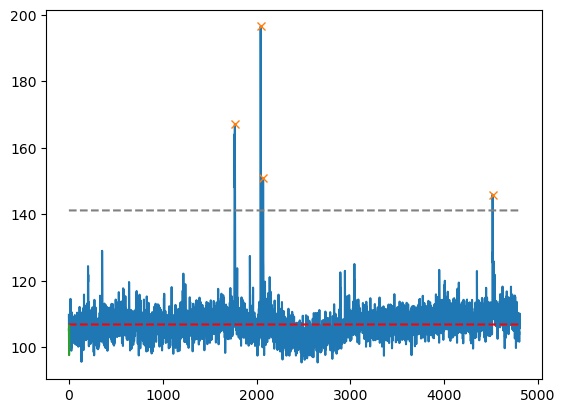

451
the peak time stamps are :[2248 4230]
the peak returns to baseline at frame: [2267, 4239]
the decay time in seconds for each peak is: [0.95, 0.45]
the amplitude of each peak is: [78.16528  38.441574]


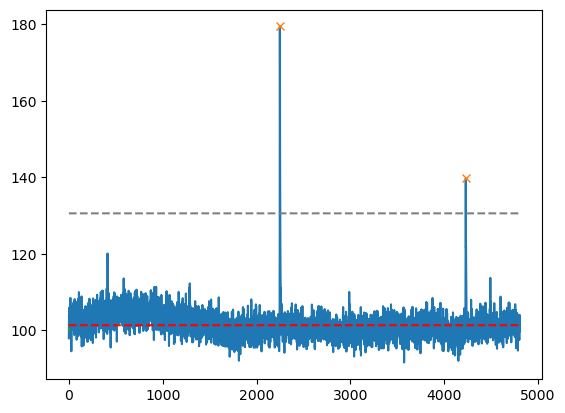

452
the peak time stamps are :[520]
the peak returns to baseline at frame: [536]
the decay time in seconds for each peak is: [0.8]
the amplitude of each peak is: [130.72343]


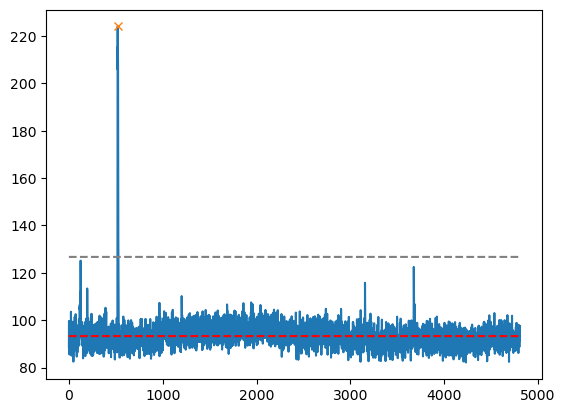

453
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


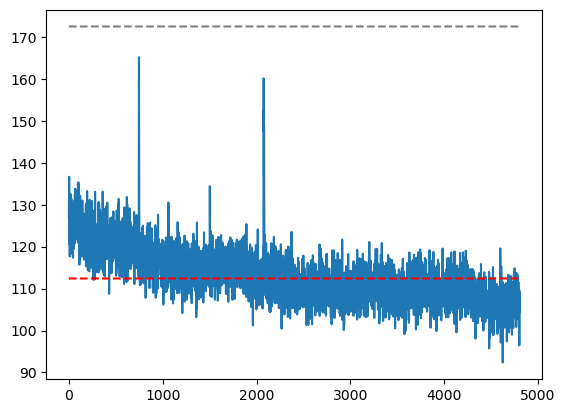

454
the peak time stamps are :[13]
the peak returns to baseline at frame: [808]
the decay time in seconds for each peak is: [39.75]
the amplitude of each peak is: [78.671646]


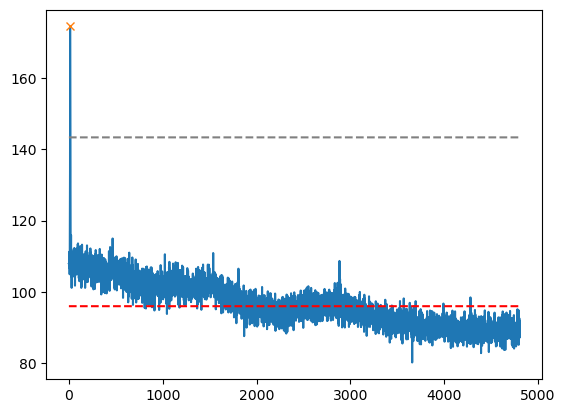

455
the peak time stamps are :[ 82 425 504]
the peak returns to baseline at frame: [1145, 1145, 1145]
the decay time in seconds for each peak is: [53.15, 36.0, 32.05]
the amplitude of each peak is: [48.947342 59.69542  40.99225 ]


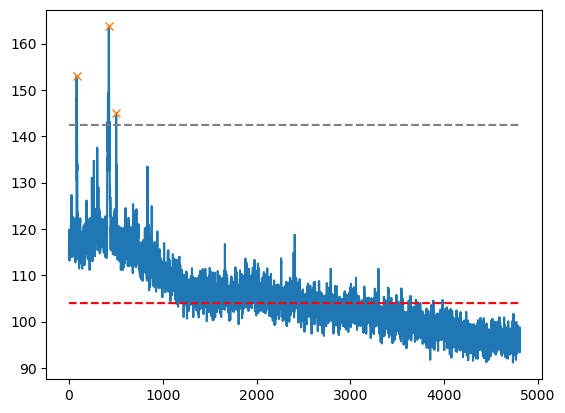

456
the peak time stamps are :[ 45 988]
the peak returns to baseline at frame: [211, 1009]
the decay time in seconds for each peak is: [8.3, 1.05]
the amplitude of each peak is: [ 74.392685 147.70789 ]


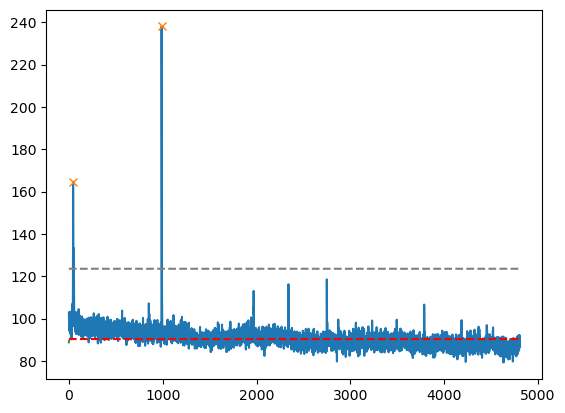

457
the peak time stamps are :[1970 2177 2228]
the peak returns to baseline at frame: [1979, 2187, 2233]
the decay time in seconds for each peak is: [0.45, 0.5, 0.25]
the amplitude of each peak is: [47.803955 55.804108 40.718124]


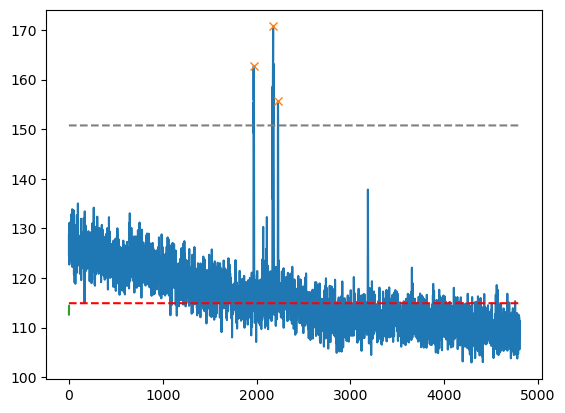

458
the peak time stamps are :[3648]
the peak returns to baseline at frame: [3664]
the decay time in seconds for each peak is: [0.8]
the amplitude of each peak is: [95.03331]


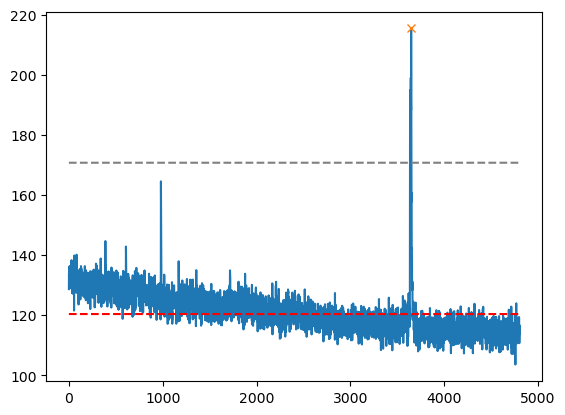

459
the peak time stamps are :[2754 2783 2808]
the peak returns to baseline at frame: [2844, 2844, 2844]
the decay time in seconds for each peak is: [4.5, 3.05, 1.8]
the amplitude of each peak is: [22.455185 37.45572  29.142944]


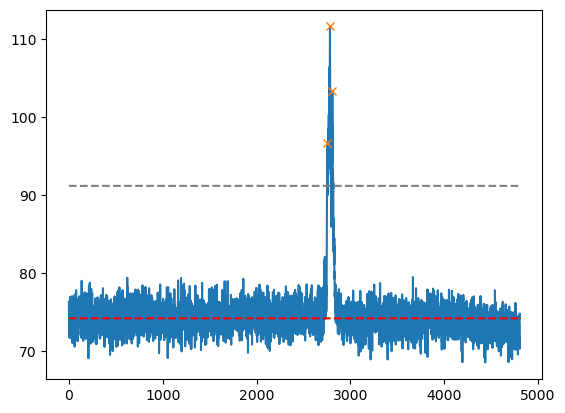

460
the peak time stamps are :[2512]
the peak returns to baseline at frame: [2520]
the decay time in seconds for each peak is: [0.4]
the amplitude of each peak is: [169.3757]


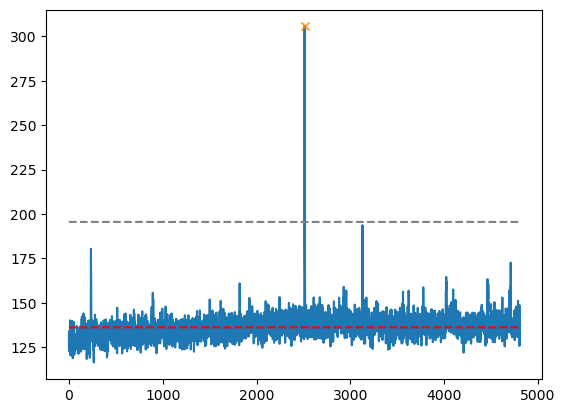

461
the peak time stamps are :[2523 2795 3300 3977 4242]
the peak returns to baseline at frame: [2537, 2805, 3310, 3984, 4255]
the decay time in seconds for each peak is: [0.7, 0.5, 0.5, 0.35, 0.65]
the amplitude of each peak is: [46.526917 48.92366  96.521225 59.597183 88.46677 ]


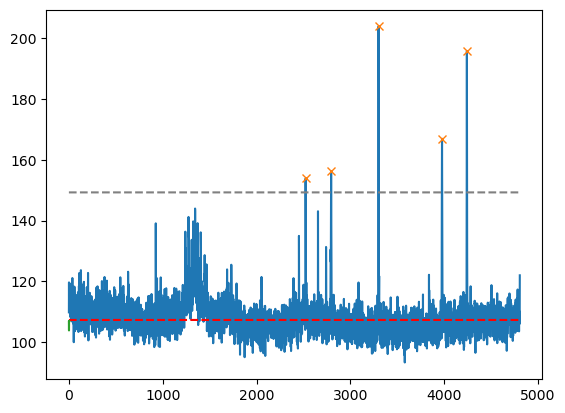

462
the peak time stamps are :[ 41 267]
the peak returns to baseline at frame: [276, 276]
the decay time in seconds for each peak is: [11.75, 0.45]
the amplitude of each peak is: [108.40433   53.448044]


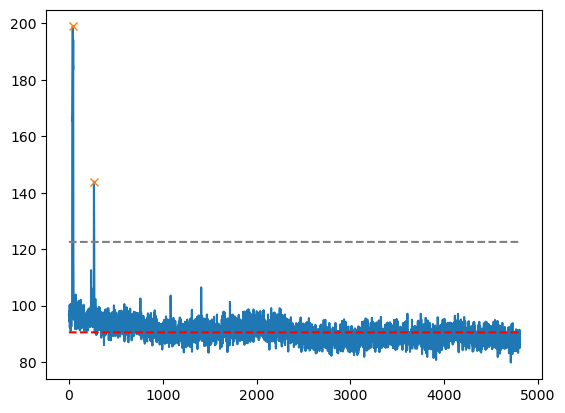

463
the peak time stamps are :[3017]
the peak returns to baseline at frame: [3028]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [90.25273]


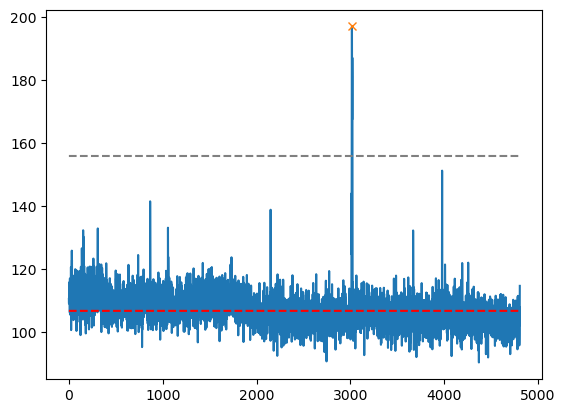

464
the peak time stamps are :[   9  306  326  998 1260 1802 2060]
the peak returns to baseline at frame: [37, 342, 342, 1003, 1274, 1810, 2070]
the decay time in seconds for each peak is: [1.4, 1.8, 0.8, 0.25, 0.7, 0.4, 0.5]
the amplitude of each peak is: [ 31.569412  79.53569  100.05554   28.962082  95.269104  32.25963
  39.793747]


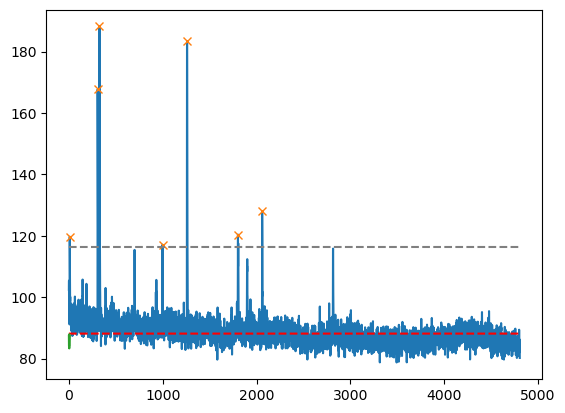

465
the peak time stamps are :[ 40 269]
the peak returns to baseline at frame: [954, 954]
the decay time in seconds for each peak is: [45.7, 34.25]
the amplitude of each peak is: [52.65236  30.588593]


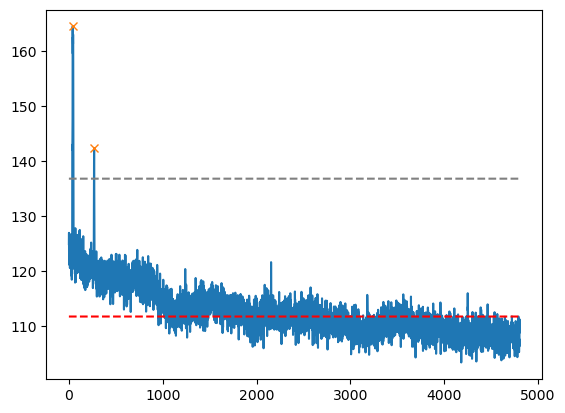

466
the peak time stamps are :[277 501 640]
the peak returns to baseline at frame: [296, 522, 660]
the decay time in seconds for each peak is: [0.95, 1.05, 1.0]
the amplitude of each peak is: [32.707367 39.26567  87.639496]


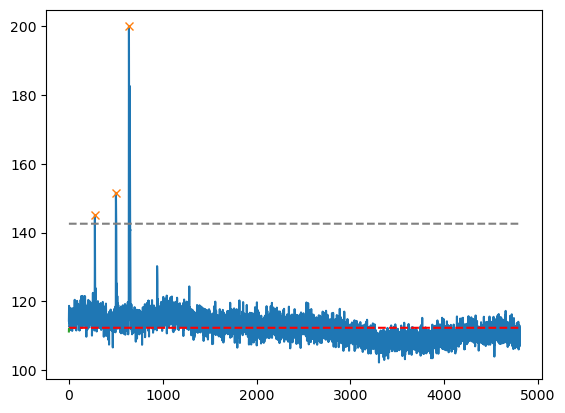

467
the peak time stamps are :[3836]
the peak returns to baseline at frame: [3842]
the decay time in seconds for each peak is: [0.3]
the amplitude of each peak is: [98.16095]


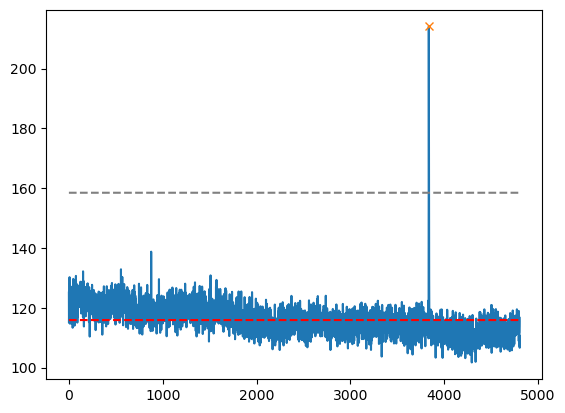

468
the peak time stamps are :[  90  988 1595 3176 3896]
the peak returns to baseline at frame: [466, 1043, 1611, 3182, 3900]
the decay time in seconds for each peak is: [18.8, 2.75, 0.8, 0.3, 0.2]
the amplitude of each peak is: [155.79462   65.32129  106.88068   71.01442   59.128418]


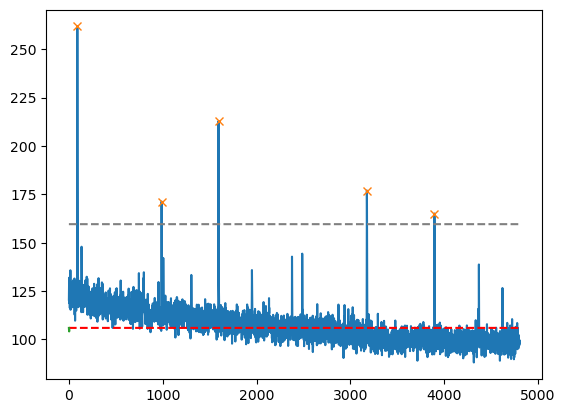

469
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


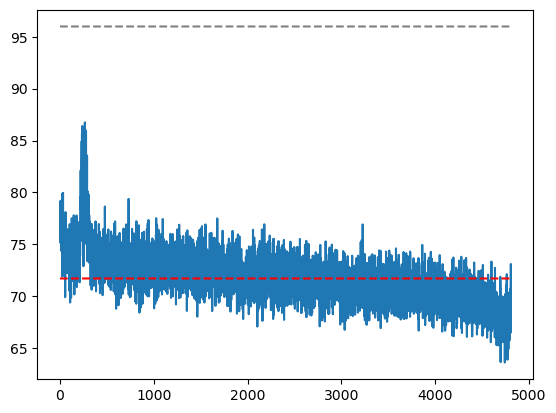

470
the peak time stamps are :[4520]
the peak returns to baseline at frame: [4527]
the decay time in seconds for each peak is: [0.35]
the amplitude of each peak is: [85.2036]


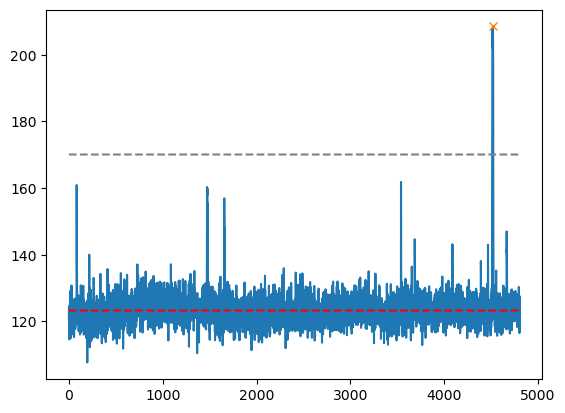

471
the peak time stamps are :[  49  435  887 1507 2517]
the peak returns to baseline at frame: [750, 750, 899, 1604, 2524]
the decay time in seconds for each peak is: [35.05, 15.75, 0.6, 4.85, 0.35]
the amplitude of each peak is: [ 55.065155 218.27188   70.67581   57.622986  56.20627 ]


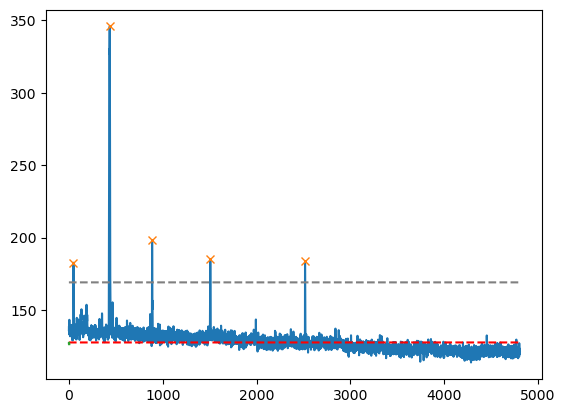

472
the peak time stamps are :[263 300 323 344]
the peak returns to baseline at frame: [584, 584, 584, 584]
the decay time in seconds for each peak is: [16.05, 14.2, 13.05, 12.0]
the amplitude of each peak is: [49.67198  50.036636 53.55742  49.030045]


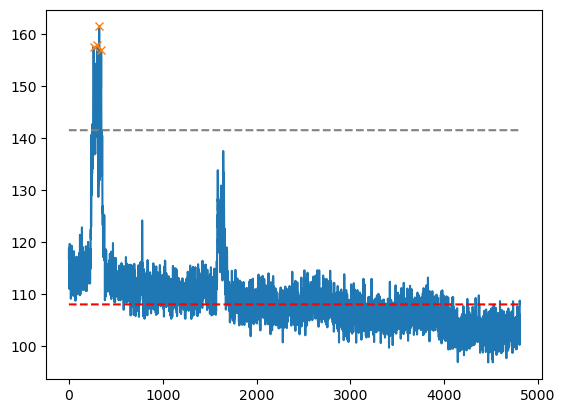

473
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


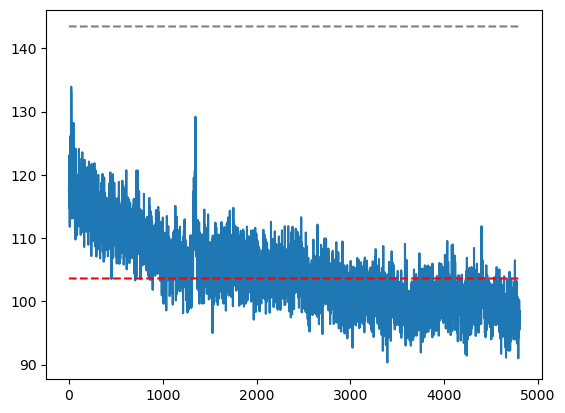

474
the peak time stamps are :[2279 3201 3307]
the peak returns to baseline at frame: [2290, 3217, 3319]
the decay time in seconds for each peak is: [0.55, 0.8, 0.6]
the amplitude of each peak is: [70.96417  37.287918 40.68495 ]


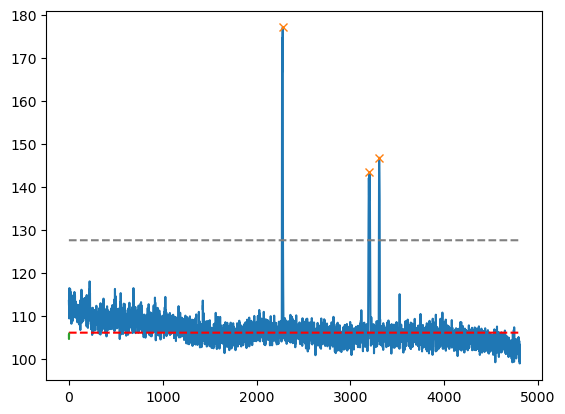

475
the peak time stamps are :[ 691 2596 4119]
the peak returns to baseline at frame: [714, 2609, 4126]
the decay time in seconds for each peak is: [1.15, 0.65, 0.35]
the amplitude of each peak is: [138.04993 114.97443  70.48428]


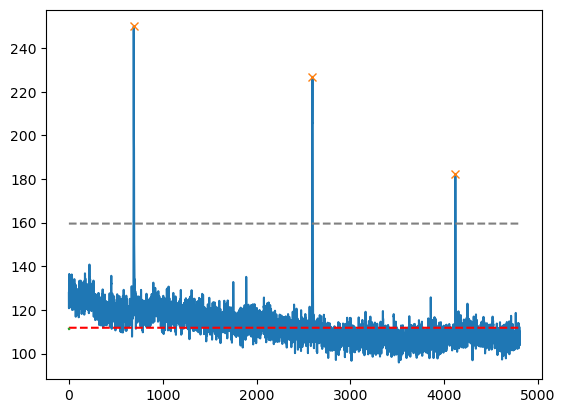

476
the peak time stamps are :[2244]
the peak returns to baseline at frame: [2251]
the decay time in seconds for each peak is: [0.35]
the amplitude of each peak is: [105.23837]


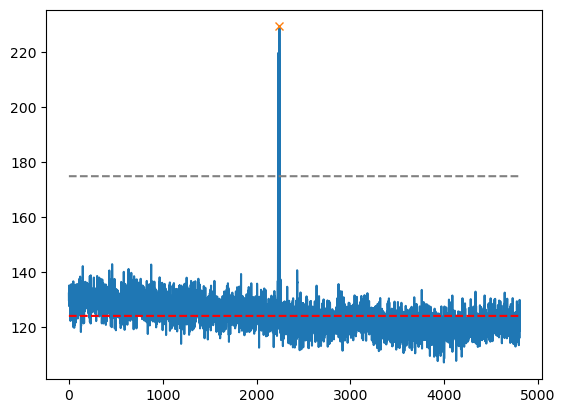

477
the peak time stamps are :[1463]
the peak returns to baseline at frame: [1486]
the decay time in seconds for each peak is: [1.15]
the amplitude of each peak is: [71.27339]


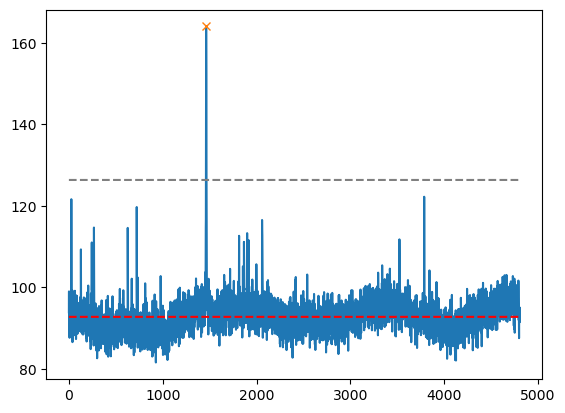

478
the peak time stamps are :[3223 4118 4779]
the peak returns to baseline at frame: [3274, 4184]
the decay time in seconds for each peak is: [2.55, 3.3]
the amplitude of each peak is: [58.389847 31.746262 84.99988 ]


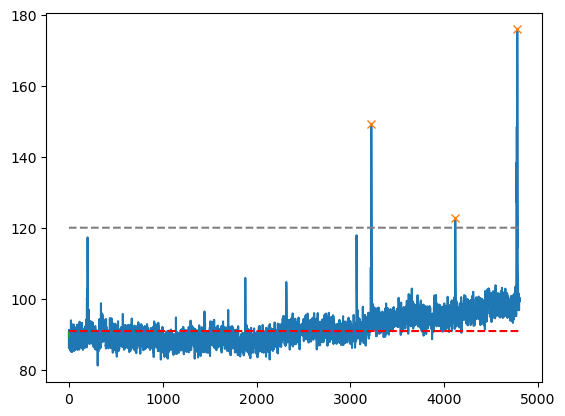

479
the peak time stamps are :[ 177  281 1454 2756 2992 4671]
the peak returns to baseline at frame: [452, 452, 1466, 2776, 3005, 4676]
the decay time in seconds for each peak is: [13.75, 8.55, 0.6, 1.0, 0.65, 0.25]
the amplitude of each peak is: [106.60054  108.389084  43.59395   35.06244   44.210403  37.064667]


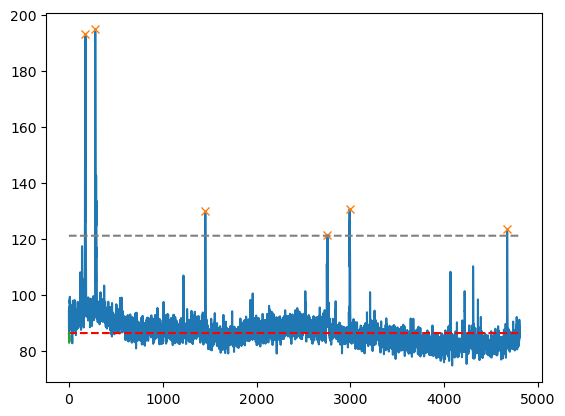

480
the peak time stamps are :[20 96]
the peak returns to baseline at frame: [1042, 1042]
the decay time in seconds for each peak is: [51.1, 47.3]
the amplitude of each peak is: [22.348007 18.996185]


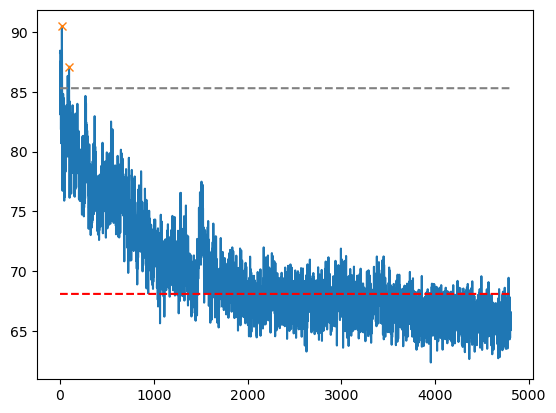

481
the peak time stamps are :[1649 4014]
the peak returns to baseline at frame: [1660, 4026]
the decay time in seconds for each peak is: [0.55, 0.6]
the amplitude of each peak is: [122.596924  96.206604]


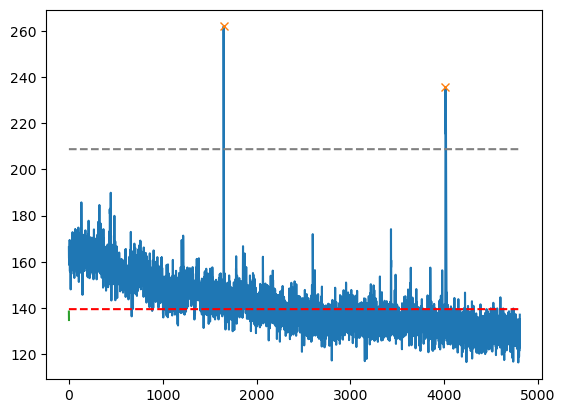

482
the peak time stamps are :[1681 2837 3093]
the peak returns to baseline at frame: [1701, 2842, 3110]
the decay time in seconds for each peak is: [1.0, 0.25, 0.85]
the amplitude of each peak is: [106.36612   47.281372  97.694336]


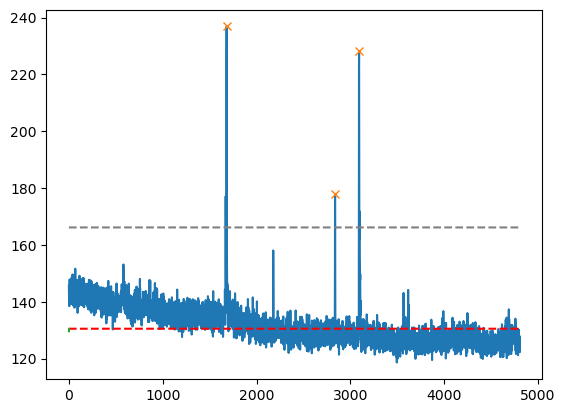

483
the peak time stamps are :[   2   33  133  297  326  578  643 1888 2032 2189 2286 2654 2735 2886
 3036 3144 3720 4229 4300 4354 4628 4725]
the peak returns to baseline at frame: [17, 59, 147, 353, 353, 587, 656, 1898, 2051, 2195, 2292, 2663, 2743, 2896, 3045, 3155, 3726, 4263, 4309, 4363, 4635, 4742]
the decay time in seconds for each peak is: [0.75, 1.3, 0.7, 2.8, 1.35, 0.45, 0.65, 0.5, 0.95, 0.3, 0.3, 0.45, 0.4, 0.5, 0.45, 0.55, 0.3, 1.7, 0.45, 0.45, 0.35, 0.85]
the amplitude of each peak is: [ 64.36624   69.52072   66.44333   61.82779   81.84329   66.85556
  73.481384  77.617035  74.98941   60.754837  97.28371   76.3221
  71.18652   77.62315   67.65068   73.54553   77.755905  78.12901
  73.01024   85.15793  103.23563   59.34729 ]


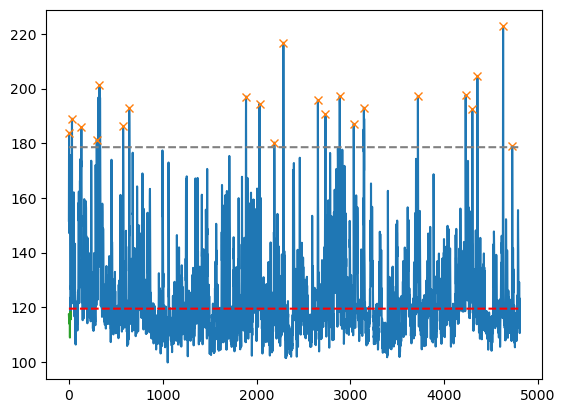

484
the peak time stamps are :[]
the peak returns to baseline at frame: []
the decay time in seconds for each peak is: []
the amplitude of each peak is: []


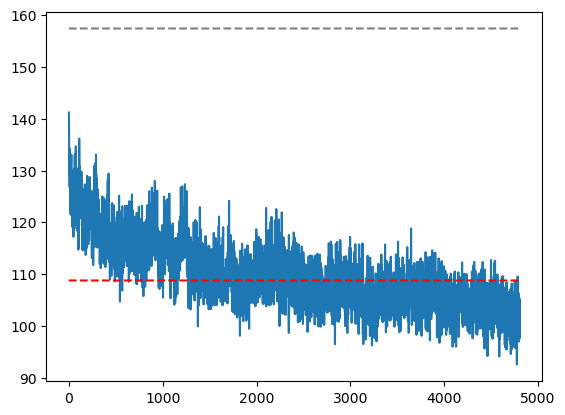

485
the peak time stamps are :[ 680 1271]
the peak returns to baseline at frame: [688, 1277]
the decay time in seconds for each peak is: [0.4, 0.3]
the amplitude of each peak is: [52.325058 41.752975]


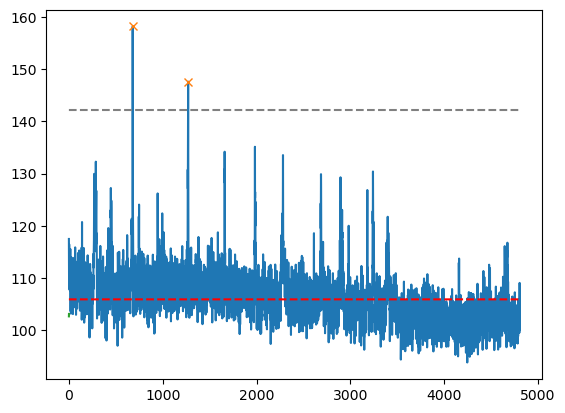

486
the peak time stamps are :[1461]
the peak returns to baseline at frame: [1477]
the decay time in seconds for each peak is: [0.8]
the amplitude of each peak is: [96.94562]


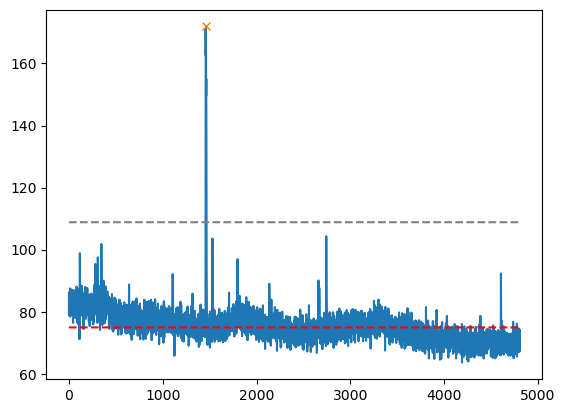

487
the peak time stamps are :[  27 2708 3297]
the peak returns to baseline at frame: [64, 2717, 3302]
the decay time in seconds for each peak is: [1.85, 0.45, 0.25]
the amplitude of each peak is: [65.94391  56.975784 33.447372]


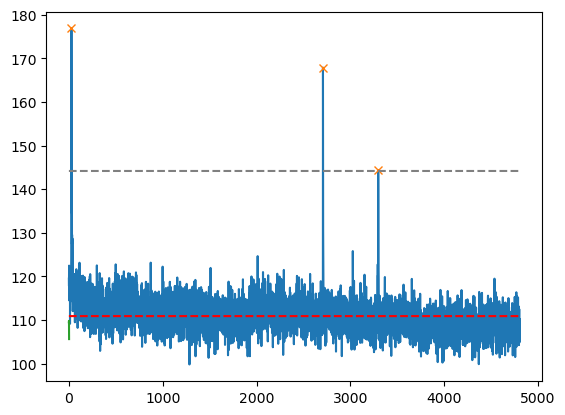

488
the peak time stamps are :[1375 2835 2865 2934 3720]
the peak returns to baseline at frame: [1383, 2853, 2880, 2947, 3735]
the decay time in seconds for each peak is: [0.4, 0.9, 0.75, 0.65, 0.75]
the amplitude of each peak is: [61.345383 92.89433  33.358368 93.88689  33.977295]


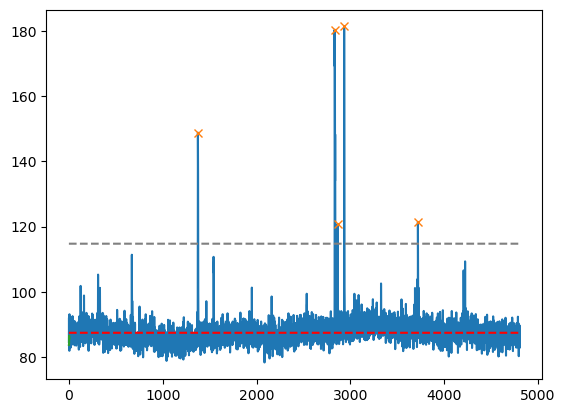

489
the peak time stamps are :[4138]
the peak returns to baseline at frame: [4148]
the decay time in seconds for each peak is: [0.5]
the amplitude of each peak is: [91.275635]


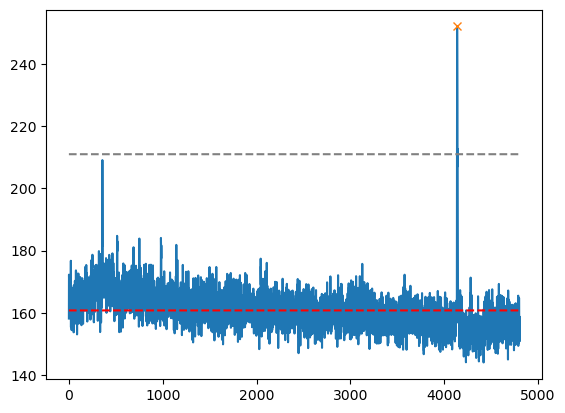

490
the peak time stamps are :[1006 1583 3429]
the peak returns to baseline at frame: [1106, 1601, 3435]
the decay time in seconds for each peak is: [5.0, 0.9, 0.3]
the amplitude of each peak is: [104.91284   52.14731   58.859467]


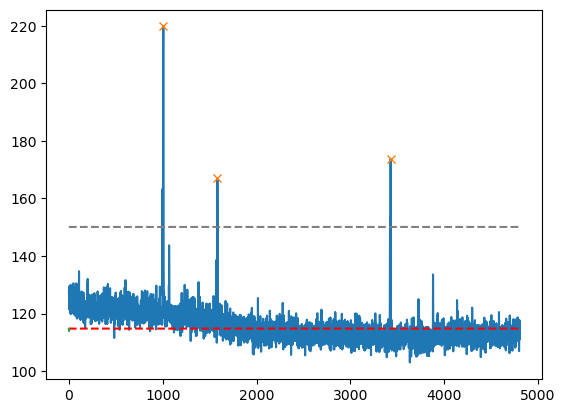

491
the peak time stamps are :[2279]
the peak returns to baseline at frame: [2284]
the decay time in seconds for each peak is: [0.25]
the amplitude of each peak is: [39.2623]


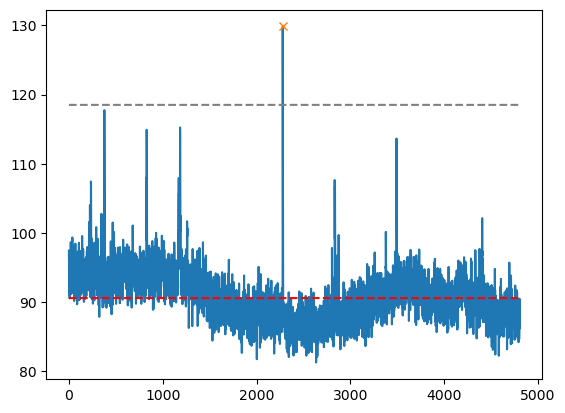

492
the peak time stamps are :[  48 1725 2477 2571 4000]
the peak returns to baseline at frame: [58, 1732, 2484, 2577, 4006]
the decay time in seconds for each peak is: [0.5, 0.35, 0.35, 0.3, 0.3]
the amplitude of each peak is: [41.83879  74.34465  69.35814  44.090363 37.708344]


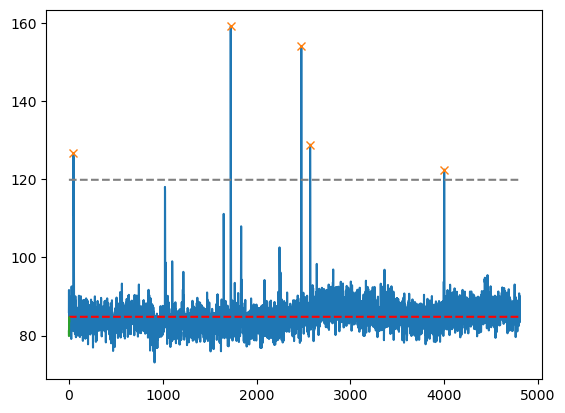

493
the peak time stamps are :[ 894 2269]
the peak returns to baseline at frame: [967, 2294]
the decay time in seconds for each peak is: [3.65, 1.25]
the amplitude of each peak is: [ 67.85565 129.47   ]


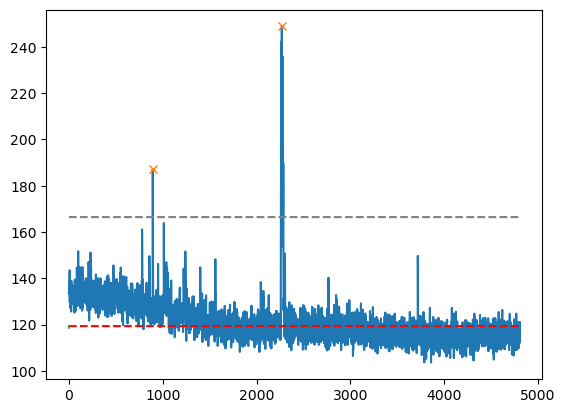

494
the peak time stamps are :[ 238  404 1590 3742 4561 4588]
the peak returns to baseline at frame: [246, 415, 1603, 3744, 4613, 4613]
the decay time in seconds for each peak is: [0.4, 0.55, 0.65, 0.1, 2.6, 1.25]
the amplitude of each peak is: [  40.042496   34.578278   98.647    1001.9664     77.012375   70.12125 ]


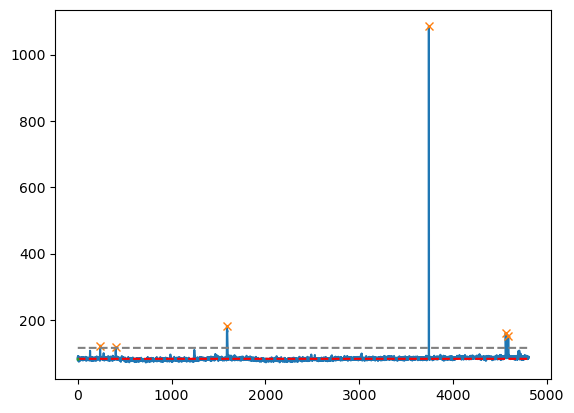

495
the peak time stamps are :[  27 1176]
the peak returns to baseline at frame: [37, 1184]
the decay time in seconds for each peak is: [0.5, 0.4]
the amplitude of each peak is: [68.72702  90.155945]


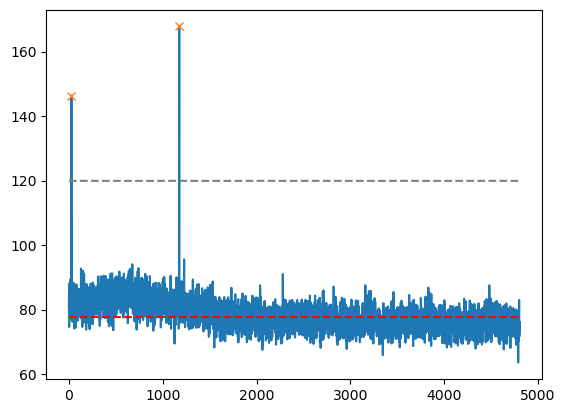

496
the peak time stamps are :[1981 2001]
the peak returns to baseline at frame: [1994, 2010]
the decay time in seconds for each peak is: [0.65, 0.45]
the amplitude of each peak is: [76.15451 73.5294 ]


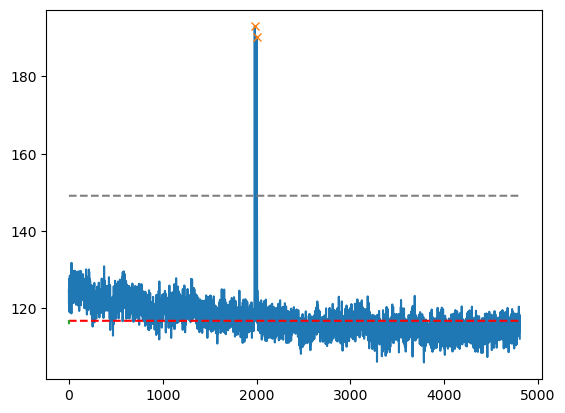

497
the peak time stamps are :[1292 1318 2205 3291 4534 4617]
the peak returns to baseline at frame: [1357, 1357, 2222, 3302, 4549, 4626]
the decay time in seconds for each peak is: [3.25, 1.95, 0.85, 0.55, 0.75, 0.45]
the amplitude of each peak is: [65.64105  41.12149  47.27545  68.41342  39.896347 32.05716 ]


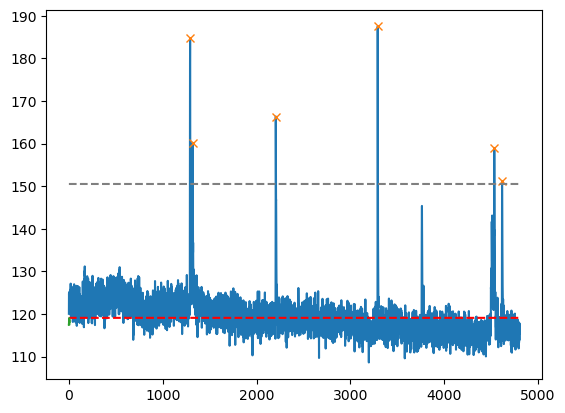

498
the peak time stamps are :[1266 2338 2854 2917 3061]
the peak returns to baseline at frame: [1274, 2363, 2861, 2935, 3071]
the decay time in seconds for each peak is: [0.4, 1.25, 0.35, 0.9, 0.5]
the amplitude of each peak is: [37.391266 62.28572  29.504105 85.37166  36.01326 ]


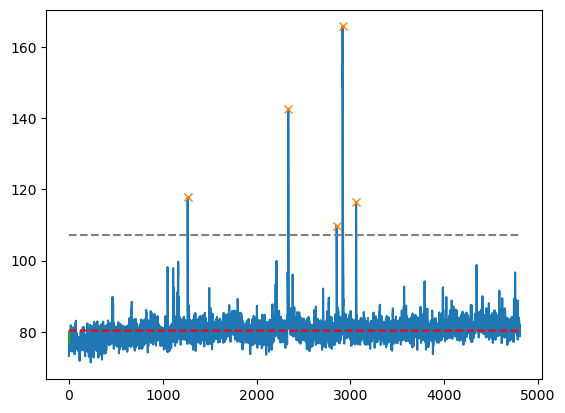

499
the peak time stamps are :[ 555  675  749  870 1607 1636 1737]
the peak returns to baseline at frame: [593, 686, 761, 884, 1622, 1648, 1750]
the decay time in seconds for each peak is: [1.9, 0.55, 0.6, 0.7, 0.75, 0.6, 0.65]
the amplitude of each peak is: [ 56.804703  56.146896 124.90132  138.51747   48.3423   158.05
  92.13191 ]


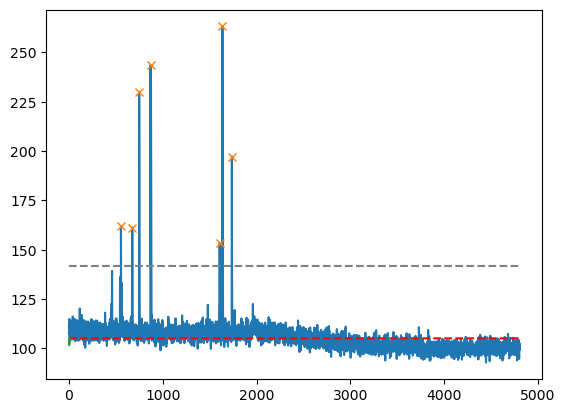

500
the peak time stamps are :[ 750  875 1637]
the peak returns to baseline at frame: [770, 891, 1658]
the decay time in seconds for each peak is: [1.0, 0.8, 1.05]
the amplitude of each peak is: [ 73.8539  112.34758 149.6126 ]


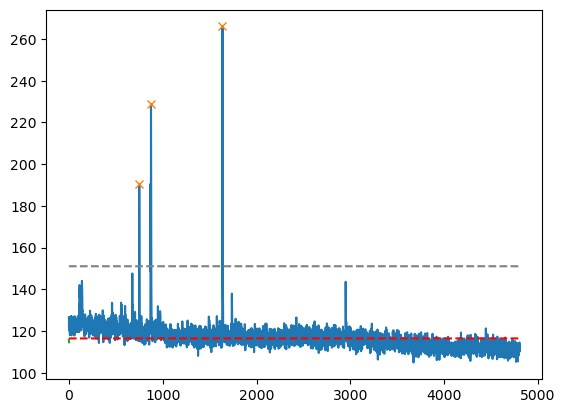

501
the peak time stamps are :[1831 2268]
the peak returns to baseline at frame: [1838, 2274]
the decay time in seconds for each peak is: [0.35, 0.3]
the amplitude of each peak is: [117.66937   59.309082]


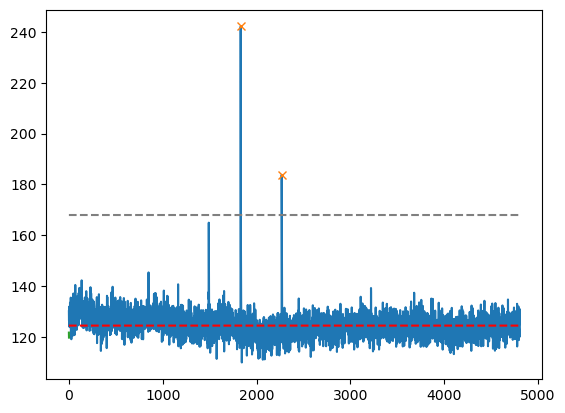

502
the peak time stamps are :[ 139 1637 2950]
the peak returns to baseline at frame: [150, 1649, 2959]
the decay time in seconds for each peak is: [0.55, 0.6, 0.45]
the amplitude of each peak is: [ 80.13583   56.911896 173.16104 ]


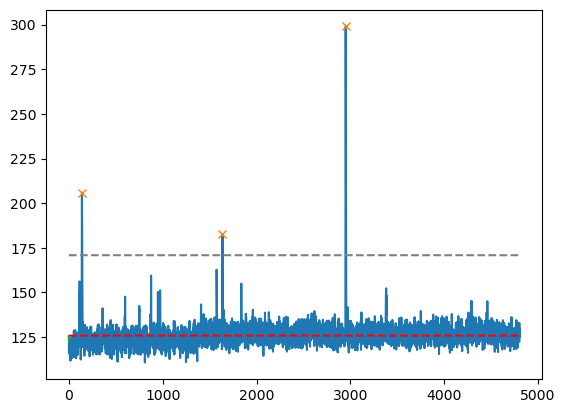

503
the peak time stamps are :[10 36]
the peak returns to baseline at frame: [85, 85]
the decay time in seconds for each peak is: [3.75, 2.45]
the amplitude of each peak is: [25.959106 20.530075]


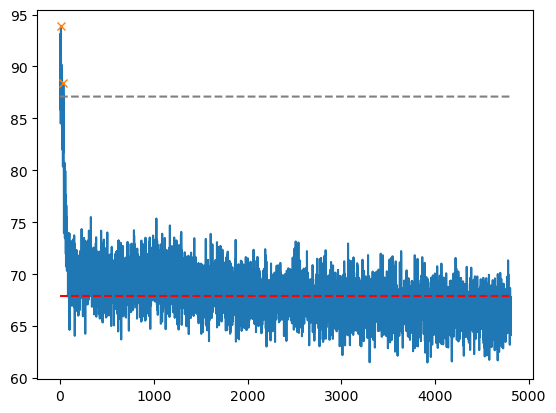

504
the peak time stamps are :[2003]
the peak returns to baseline at frame: [2014]
the decay time in seconds for each peak is: [0.55]
the amplitude of each peak is: [93.465485]


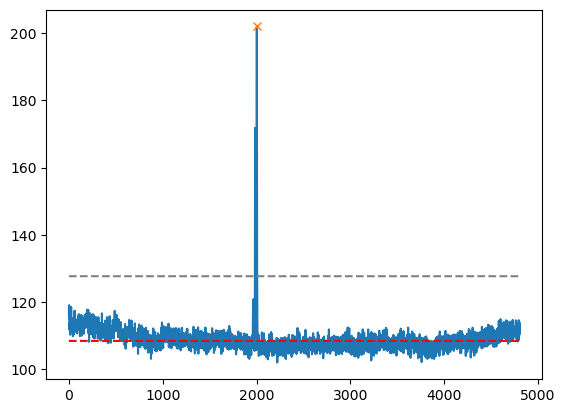

505
the peak time stamps are :[ 105  553 1412 3083]
the peak returns to baseline at frame: [118, 578, 1420, 3088]
the decay time in seconds for each peak is: [0.65, 1.25, 0.4, 0.25]
the amplitude of each peak is: [ 34.20392 148.54242  84.51317  95.52873]


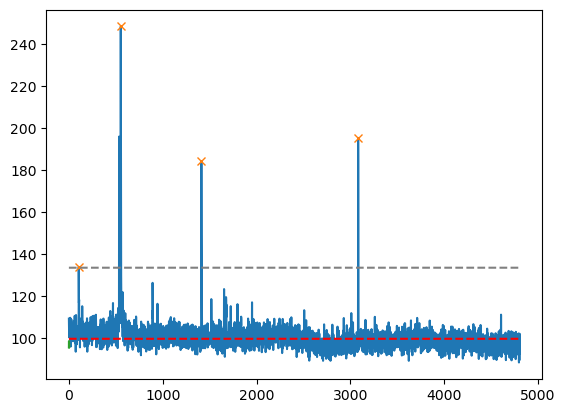

506
the peak time stamps are :[ 277  365  604 1932 2028 2205]
the peak returns to baseline at frame: [286, 371, 615, 1943, 2033, 2211]
the decay time in seconds for each peak is: [0.45, 0.3, 0.55, 0.55, 0.25, 0.3]
the amplitude of each peak is: [61.536133 35.57956  57.29631  40.099533 67.87776  47.12352 ]


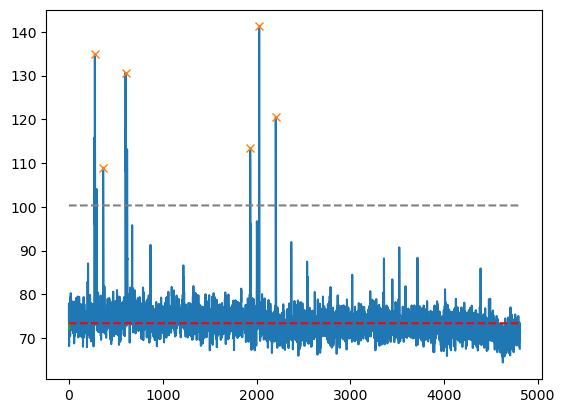

507
the peak time stamps are :[  98  121  405  434  704  744 1280 1796 1931 3138 3414 3985 4244 4280
 4468]
the peak returns to baseline at frame: [113, 128, 452, 452, 717, 760, 1289, 1804, 1939, 3146, 3420, 3992, 4256, 4296, 4474]
the decay time in seconds for each peak is: [0.75, 0.35, 2.35, 0.9, 0.65, 0.8, 0.45, 0.4, 0.4, 0.4, 0.3, 0.35, 0.6, 0.8, 0.3]
the amplitude of each peak is: [ 55.846054  55.0941   159.19713   50.131668  66.57594  124.033264
  27.809006  35.082047  62.749176  33.24768   48.892365  27.54457
  39.62828   63.34781   26.652878]


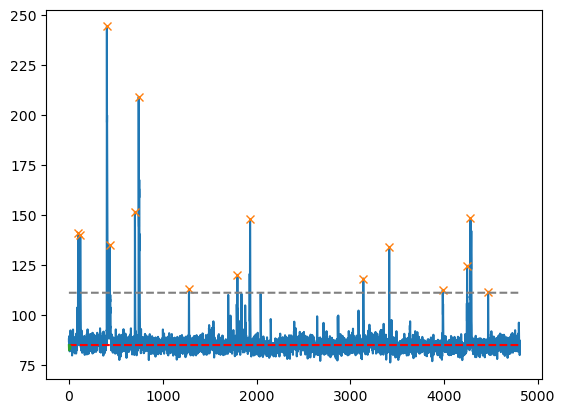

In [36]:
peak_test = []
amp_test = []
decay_test = []
n = 0
for i,j in zip(F, Fneu):
    peak_test.append(single_synapse_baseline_correction_and_peak_return(i,j, return_peaks=True))
    amp_test.append(single_synapse_baseline_correction_and_peak_return(i,j, return_peaks=False, return_amplitudes=True))
    decay_test.append(single_synapse_baseline_correction_and_peak_return(i,j, return_peaks=False, return_decay_times=True))
    print(n)
    n+=1
    uncorrected_single_spine_peak_plotting(i,j)
    

In [39]:
man_test = F[182]-0.7*Fneu[182]
print(man_test[566:586])
print(man_test[2180:2200])
print(man_test[2596:2625])
print(man_test[4530:4555])


[108.39099  113.095245 108.378494 112.580444 103.02757  111.70499
 106.783936 104.75148  108.88628  155.29068  170.34143  165.37949
 141.45682  144.07683  135.17061  130.1066   116.526215 116.01317
 119.26752  123.191895]
[103.89961  101.882416 102.978806 103.436035 107.81563  111.11429
 107.51085  133.54765  138.19693  134.86061  138.93823  123.72191
 118.04495  120.84474  112.49341  114.71942  104.98958  103.8546
 105.48152  104.28375 ]
[113.82712   98.75191   95.04472  104.40907  100.22583  101.62688
 105.535324 105.88368  134.81828  145.65051  148.0011   138.39865
 128.85942  125.486664 120.60277  114.946045 115.07489  120.97693
 116.4702   113.44731  111.776596 111.370056 105.03612  105.44272
 109.62256  111.51196  107.62291  104.11691  105.77478 ]
[ 98.62727   96.951324 101.06389  103.29234   97.276505 101.95871
 100.936966 105.85419  113.99835  116.97385  116.24449  127.608154
 112.579895 105.1508   109.42319  100.99533  102.51108  101.807816
 101.70203   98.79375  100.129074 10

In [ ]:
print(decay_test)

In [ ]:
print(peak_test)

In [ ]:
decayed_library = []
for f, fneu in zip(F,Fneu):
    decayed_library.append(single_synapse_baseline_correction_and_peak_return(f, fneu, return_peaks = False, return_decay_times = True))


In [ ]:
desired_key = "lam"
low_std = []
for element in stat:
    if desired_key in element:
        low_std.append(element[desired_key])

np.mean(stat[601]['lam'])

In [ ]:
decayed_library
second_times = []
for i in decayed_library:
    second_times.append(i/10)
print(second_times) 


In [ ]:
#gives out the time course of each peak (currently threshold is set to 1.5x the noise)

f = F[2]
fneu = Fneu[2]
sample_trace = f - 0.7*fneu
corrected_sample_trace = BaselineRemoval(sample_trace)
corrected_trace = corrected_sample_trace.ZhangFit(lambda_=500)
threshold = 1.5*(abs(np.median(corrected_trace)) + abs(corrected_trace.min()))
baseline = np.median(corrected_trace)
# print(threshold)

peaks, _ = find_peaks(corrected_trace, height = 3*(abs(np.median(corrected_trace)) + abs(corrected_trace.min())), distance = 20)
negative_points = np.where((corrected_trace < np.median(corrected_trace)))[0]
# print(negative_points)
decay_points = []
decay_time = []

for i in peaks:
    negative_after_peak = negative_points[negative_points>i]
    if len(negative_after_peak > 0):
        decay_points.append(negative_after_peak[0])

next_peak_index =  []
for k,a in zip(peaks, decay_points):
    if len(peaks) > 1:
        next_peak_index = peaks[peaks > k].min()
        if next_peak_index < a:
            decay_time.append(np.nan)
        else:
            decay_time.append(np.abs(a-k) / 20)
    else:
        decay_time.append(np.abs(a-k)/20)

print(peaks)  
print('the peak returns to baseline at frame: {}' .format(decay_points))
print('the decay time for each peak is: {}' .format(decay_time))
# for i in peaks:
#     potential_time_points = np.where((corrected_trace < baseline))
#     indices = np.where(potential_time_points > peaks)
#     # if len(indices) > 0:
#         # peak_index = np.abs(indices - i).argmin()
#         # peak_indexes.append(indices[peak_index])
#     print("Peak index:", i, "Index where value equals threshold:", indices[peak_index])

len(decay_points) == len(peaks)


"""Write a code that goes through each of the peaks and decay times; as we add the decay frames to the peak, if there is a second / third peak before the decay time; we change the decay to NaN"""


In [ ]:

index = []
for x, y in zip(peaks, decay_points[:]):
    if x[0] < y[1]:
        print(True)
    else:
        break            


In [ ]:

decay_time = []
next_peak =  []
start = 0
for k,a in zip(peaks, decay_points):
    if len(peaks) > 1:
        next_peak = peaks[start + 1]
        if next_peak < a:
            decay_time.append(np.nan)
        else:
            decay_time.append(np.abs(a-k) / 20)
    else:
        decay_time.append(np.abs(a-k)/20)
    start+=1

In [ ]:
#final plotting of the output for testing
plt.figure(figsize=(36,6))
plt.plot(corrected_trace)
plt.plot(np.full_like(corrected_trace, threshold))
plt.plot(peaks, corrected_trace[peaks], "x")
plt.plot(np.full_like(corrected_trace, 3*(abs(np.median(corrected_trace)) + abs(corrected_trace.min()))), "--",color = "grey")
plt.plot(np.full_like(corrected_trace, np.median(corrected_trace)), "-",color = "red")


In [ ]:
#In theory how you remove the values that we set to zero in the initial pass (should 
#directly lead to a larger std dev of the data)

def first_pass_peak_removal():
    first_pass = np.copy(corrected_trace)
    first_pass_peaks, _ = find_peaks(first_pass, height=0.15*first_pass.max(), distance=5)
    peak_regions = []
    for peak in first_pass_peaks:
        start = max(0, peak-frames)
        end = min(len(first_pass)-1, peak+frames+1)
        peak_regions += list(np.arange(start, end))
    first_pass[peak_regions] = 0
    threshold = 3*np.std(first_pass)
    first_pass = np.delete(first_pass, peak_regions) # remove values corresponding to peak_regions
    return threshold, first_pass

threshold, first_pass = first_pass_peak_removal()
synapse_peaks, _ = find_peaks(first_pass, height=threshold, distance=20)

In [ ]:
def load(fp):
    stat = np.load(f"{fp}\stat.npy", allow_pickle = True)
    ops = np.load(f"{fp}\ops.npy", allow_pickle = True).item()
    F = np.load(f"{fp}\F.npy", allow_pickle = True)
    Fneu = np.load(f"{fp}\Fneu.npy", allow_pickle = True)
    #iscell / spks also can be repeated in this way
    return stat, ops, F, Fneu

stat, ops, F, Fneu = load(r'E:\230510_homeostatic_plasticity\49%exp\TTX\wtRt_DIV20_AAV1_0.1ul_GCaMP_hSyn_48h_TTX_well001_r001\suite2p\plane0')

f = F[7]
fneu = Fneu[7]

#Sandbox removal of peak regions and re-thresholding
def synapse_freq_and_amp_extraction(f, fneu, frames):
    """Here we define our primary extraction function for suite2p F / Fneu.npy files; these files are unpacked iteratively 
    with the statement 'for f, fneu in zip(F, Fneu): followed by the outer function; this will unpack the parent fluorescence 
    files and gather freq / amplitude measures"""
    fluoro_trace = f - 0.7*fneu
    corrected_sample_trace = BaselineRemoval(fluoro_trace)
    corrected_trace = corrected_sample_trace.ZhangFit()
    def first_pass_peak_removal():
        first_pass = np.copy(corrected_trace)
        first_pass_peaks, _ = find_peaks(first_pass, height = 1.5*np.std(first_pass), distance = 5)
        peak_regions = []
        for peak in first_pass_peaks:
            start = max(0, peak-frames)
            end = min(len(first_pass)-1, peak+frames+1)
        peak_regions += list(np.arange(start, end))
        # for peak in first_pass_peaks:
        #     peak_regions += list(np.arange(peak-frames, peak+frames+1))
        first_pass[peak_regions]=0
        threshold = 2.5*np.std(first_pass)
        # plt.plot(corrected_trace)
        return threshold
    threshold = first_pass_peak_removal()
    synapse_peaks, _ = find_peaks(corrected_trace, height = threshold, distance = 20)
    plt.ylim(-10,400)
    plt.plot(corrected_trace)
    plt.plot(synapse_peaks, corrected_trace[synapse_peaks], "x")
    plt.plot(np.full_like(corrected_trace, threshold), "--",color = "grey")
    plt.plot(np.full_like(corrected_trace, np.median(corrected_trace)), "--", color = 'r')
    plt.show()
    
for j, k in zip(F, Fneu):
    synapse_freq_and_amp_extraction(j, k, 10)

In [ ]:
for peak in first_pass_peaks:
    start = max(0, peak-frames)
    end = min(len(first_pass)-1, peak+frames+1)
    peak_regions += list(np.arange(start, end))

In [ ]:
for j, k in zip(F, Fneu):
    synapse_freq_and_amp_extraction(j, k, 40)

In [ ]:
fluoro_trace = f - 0.7*fneu
corrected_sample_trace = BaselineRemoval(fluoro_trace)
corrected_trace = corrected_sample_trace.ZhangFit()
plt.plot(corrected_trace)
plt.plot(np.full_like(corrected_trace, 10*np.std(trace)), '--', color = 'r')
plt.plot(np.full_like(corrected_trace, (trace.max()-trace.min()+np.median(corrected_trace))), '-', color = 'grey')
plt.plot(np.full_like(corrected_trace, (3*np.std(noise) + np.median(trace))), color = 'blue')

In [ ]:
correction = BaselineRemoval(fneu)
noise = correction.ZhangFit(repitition=100)
3*np.std(noise) + np.median(trace)
plt.plot(trace)

In [ ]:
# plt.plot(corrected_trace)
plt.plot(trace)
# plt.plot(trace, trace[peaks], "x")
plt.plot(np.full_like(trace, 10*np.std(trace)), "--",color = "grey")
plt.plot(np.full_like(trace, np.median(trace)), "--", color = 'r')
print(np.std(trace))
# np.std(trace)

In [ ]:
"""Create a copy of a baseline corrected fluorescence trace and remove the peak regions (+/- the surrounding area) to compute baseline"""

n = 40 # number of integers on either side
indices = []
for peak in peak_list:
    indices += list(np.arange(peak-n, peak+n+1))
trace[indices] = 0
plt.plot(trace)


# zero = np.copy(trace)
# zero[peak_list] = 0
# plt.plot(zero)

In [ ]:
trace[indices] = 0
plt.plot(trace)

In [ ]:
"""Figure plotting"""

